In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import TensorDataset, DataLoader, Dataset, random_split
import numpy as np
from matplotlib import pyplot
import pandas as pd
import matplotlib.pyplot as plt

from torchvision import datasets, transforms

from torch.utils.tensorboard import SummaryWriter

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("device is", device)

2024-04-25 13:46:01.417010: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


device is cuda:0


In [2]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.act = nn.LeakyReLU(0.2)

        # input: 100      
        self.fc1 = nn.Linear(in_features=110, out_features=128)  
        self.fc2 = nn.Linear(in_features=128, out_features=256)
        self.bn2 = nn.BatchNorm1d(256)
        self.fc3 = nn.Linear(in_features=256, out_features=512)  
        self.bn3 = nn.BatchNorm1d(512)
        self.fc4 = nn.Linear(in_features=512, out_features=1024)
        self.bn4 = nn.BatchNorm1d(1024)
        self.fc5 = nn.Linear(in_features=1024, out_features=784)

        self.emb = nn.Embedding(10,10)
        self.sig = nn.Tanh()



    
    def forward(self, x, num):
        x = torch.cat((torch.squeeze(x,dim=1),torch.squeeze(self.emb(num),dim=1)),1)
        x = self.fc1(x) #100->128
        x = self.act(x) #128->128
        x = self.fc2(x) #100->128
        x = self.act(x) #128->128
        x = self.bn2(x)
        x = self.fc3(x) #100->128
        x = self.bn3(x)
        x = self.act(x) #128->128
        x = self.fc4(x) #100->128
        x = self.bn4(x)
        x = self.act(x) #128->128
        x = self.fc5(x) #100->128
        x = self.sig(x) #784->784 (28x28)
        return x

class Generator_loss(nn.Module):
    def __init__(self):
        super(Generator_loss, self).__init__()

    def forward(self, output_fake):
        loss = -torch.log(output_fake)
        return loss.mean()
    
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.act = nn.LeakyReLU(0.2, inplace=True)

        # input: 784     
        self.fc1 = nn.Linear(in_features=794, out_features=1024)      
        self.fc2 = nn.Linear(in_features=1024, out_features=512)    
        self.fc3 = nn.Linear(in_features=512, out_features=256)    
        self.fc4 = nn.Linear(in_features=256, out_features=128)   
        self.fc5 = nn.Linear(in_features=128, out_features=1)

        self.drop = nn.Dropout(p=0.4)

        self.emb = nn.Embedding(10,10)
        self.sig = nn.Sigmoid()

    def forward(self, x, num):
        x = torch.cat((torch.squeeze(x,dim=1),torch.squeeze(self.emb(num),dim=1)),1)
        x = self.fc1(x)
        x = self.act(x)
        x = self.fc2(x)
        x = self.drop(x)
        x = self.act(x)
        x = self.fc3(x)
        x = self.drop(x)
        x = self.act(x)
        x = self.fc4(x)
        x_logits = self.fc5(x) #128->1
        x_prob = self.sig(x_logits) #1->1
        return x_prob, x_logits
    
class Discriminator_loss(nn.Module):
    def __init__(self):
        super(Discriminator_loss, self).__init__()

    def forward(self, output_real, output_fake):
        loss = -(torch.log(output_real)+torch.log(1-output_fake))
        return loss.mean()

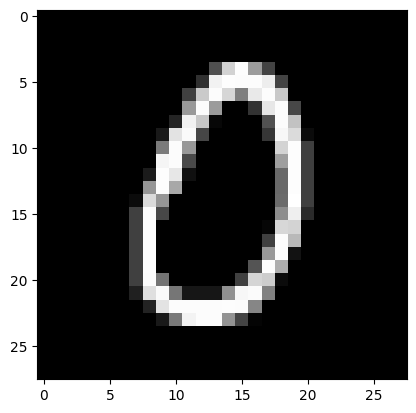

In [3]:
# Define the mini-batch size
batch_size = 64

transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5,), std=(0.5,))
])
# Download the dataset and create the dataloaders
mnist_train = datasets.MNIST("./", train=True, download=True, transform=transform)
mnist_test = datasets.MNIST("./", train=False, download=True, transform=transform)

dataset = datasets.MNIST(root='./', transform=transform)
#idx = dataset.train_labels==5
#dataset.targets = dataset.train_labels[idx]
#dataset.data = dataset.train_data[idx]

# Dataset is split 8:2
train_size = int(0.8 * len(mnist_train))
val_size = len(mnist_train) - train_size
mnist_train, mnist_val = random_split(mnist_train, [train_size, val_size])

train_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True)
test_loader = torch.utils.data.DataLoader(mnist_test, batch_size=batch_size, shuffle=False)
val_loader = torch.utils.data.DataLoader(mnist_val, batch_size=batch_size, shuffle=False)

to_onehot = nn.Embedding(10, 10)
to_onehot.weight.data = torch.eye(10)

def plot_digit(data):
    data = data.view(28, 28)
    plt.imshow(data, cmap="gray")

    plt.show()

images, labels = next(iter(train_loader))
plot_digit(images[0])

In [4]:
def train_models(model_d, criterion_d, optimizer_d, model_g, criterion_g, optimizer_g, epochs, train_loader, k, batch_sz):
    fixed_z = torch.randn(batch_sz,100)
    it = iter(train_loader)
    n_k = 1
    for epoch in range(epochs):
        #Train Discriminator 
        for batch_nr in range(k):
            try:
                images,labels = next(it)
            except:
                it = iter(train_loader)
                images,labels = next(it)    
            labels = labels.to(device)
            images = images.to(device)
            img_real = torch.flatten(images,start_dim=1).to(device)
            labels_fake = torch.randint(0,10,(img_real.shape[0],)).to(device)
            img_fake = model_g(torch.randn(img_real.shape[0],100).to(device),labels_fake)
            out_real, _ = model_d(img_real.to(device),labels)
            out_fake, _ = model_d(img_fake.to(device),labels_fake)
            optimizer_d.zero_grad()
            #loss_d = criterion_d(out_real,out_fake).to(device)
            loss_d_real = criterion_d(out_real,torch.ones_like(out_real)).to(device)
            loss_d_fake = criterion_d(out_fake,torch.zeros_like(out_fake)).to(device)
            loss_d = loss_d_real+loss_d_fake
            n_k = loss_d.item()
            loss_d.backward()
            optimizer_d.step()
            #scheduler_d.step()

        #Train Generator
        labels_fake=torch.randint(0,10,(batch_sz,)).to(device)
        img = model_g(torch.randn(batch_sz,100).to(device),labels_fake)
        #img = torch.clamp(img+((torch.randn_like(img))/5),min=0,max=1)
        out_fake, _ = model_d(img.to(device),labels_fake)
        optimizer_g.zero_grad()
        loss_g = criterion_g(out_fake,torch.ones_like(out_fake)).to(device)
        #loss_g = criterion_g(out_fake).to(device)
        loss_g.backward()
        optimizer_g.step()
        #scheduler_g.step()
        
        
        
        if epoch%50==0:
            print("Epoch:",epoch)  
            print("loss_g:",loss_g.item(),"\tloss_d:",loss_d.item())
        if epoch%250==0:
            labels=torch.randint(0,10,(5,1)).to(device)
            disp = model_g(torch.randn(5,100).to(device),labels)
            print("Ploting: ", labels[0][0].item())
            plot_digit(torch.reshape(disp[0,:],(28,28)).detach().cpu())
            print("Ploting: ", labels[1][0].item())
            plot_digit(torch.reshape(disp[1,:],(28,28)).detach().cpu())
            print("Ploting: ", labels[2][0].item())
            plot_digit(torch.reshape(disp[2,:],(28,28)).detach().cpu())
            print("Ploting: ", labels[3][0].item())
            plot_digit(torch.reshape(disp[3,:],(28,28)).detach().cpu())
            print("Ploting: ", labels[4][0].item())
            plot_digit(torch.reshape(disp[4,:],(28,28)).detach().cpu())
            #disp = torch.clamp(disp+((torch.randn_like(disp))/(n_k*10)),min=0,max=1)
            #plot_digit(torch.reshape(disp[0,0,:],(28,28)).detach().cpu())

Epoch: 0
loss_g: 0.6924700736999512 	loss_d: 1.4018948078155518
Ploting:  9


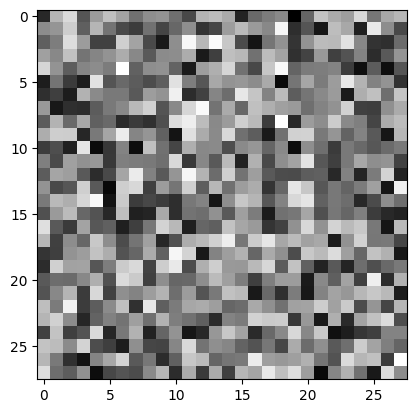

Ploting:  5


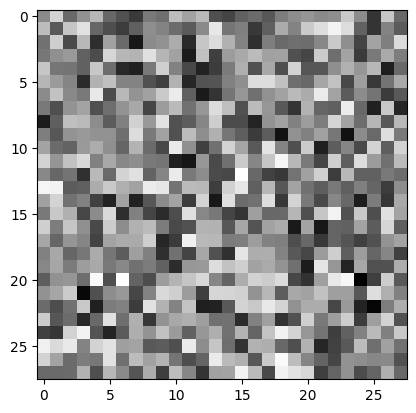

Ploting:  2


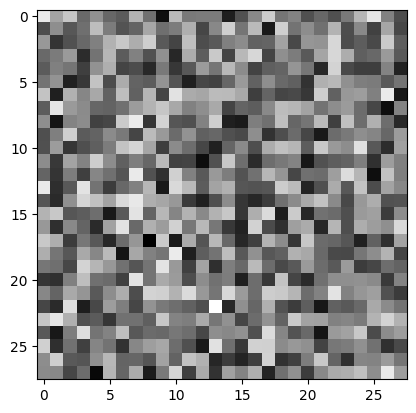

Ploting:  0


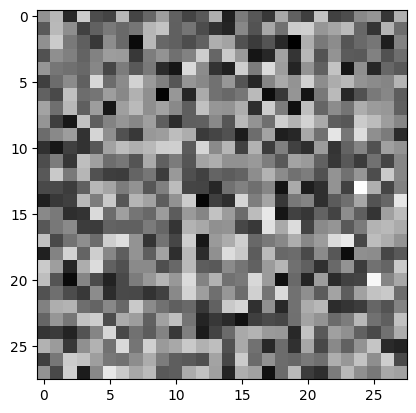

Ploting:  2


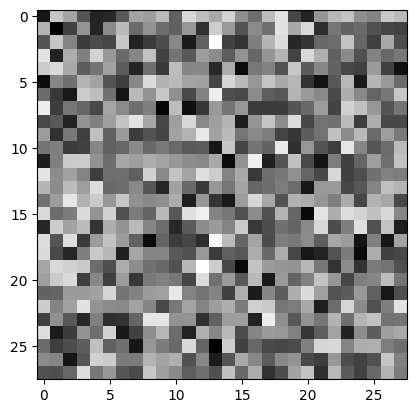

Epoch: 50
loss_g: 0.5320649743080139 	loss_d: 1.2504310607910156
Epoch: 100
loss_g: 0.5893651247024536 	loss_d: 1.3257365226745605
Epoch: 150
loss_g: 0.6434667110443115 	loss_d: 1.279680848121643
Epoch: 200
loss_g: 0.7800199389457703 	loss_d: 1.1156649589538574
Epoch: 250
loss_g: 0.9124754667282104 	loss_d: 1.1143131256103516
Ploting:  2


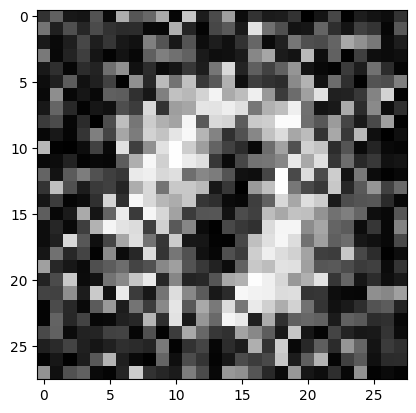

Ploting:  1


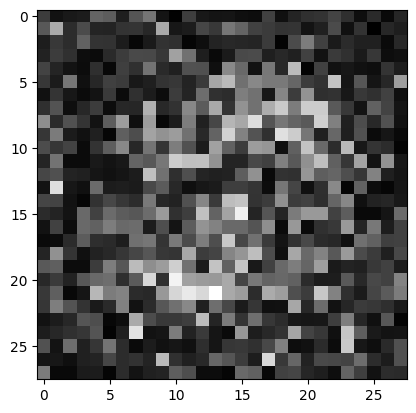

Ploting:  7


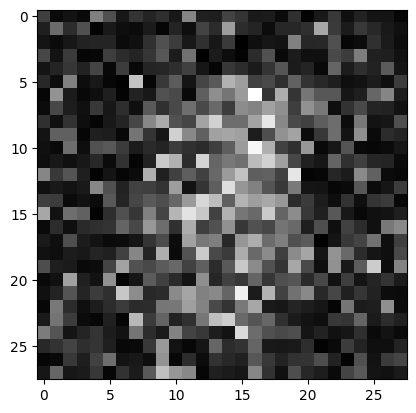

Ploting:  8


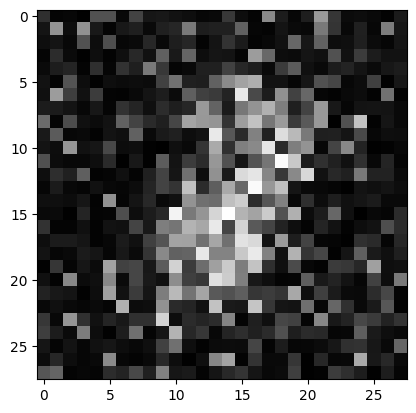

Ploting:  8


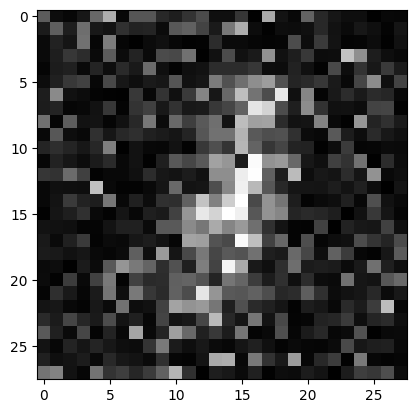

Epoch: 300
loss_g: 1.043418288230896 	loss_d: 1.0307629108428955
Epoch: 350
loss_g: 1.1803596019744873 	loss_d: 1.0102684497833252
Epoch: 400
loss_g: 1.546724557876587 	loss_d: 1.13502836227417
Epoch: 450
loss_g: 1.1209447383880615 	loss_d: 0.9822733402252197
Epoch: 500
loss_g: 1.2976245880126953 	loss_d: 1.0207386016845703
Ploting:  5


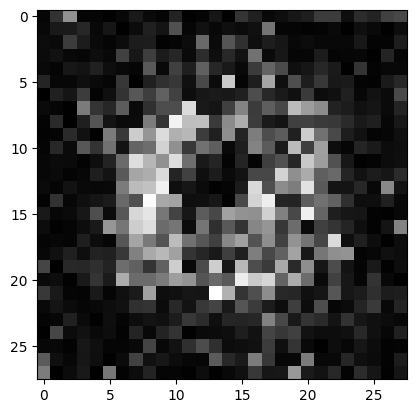

Ploting:  6


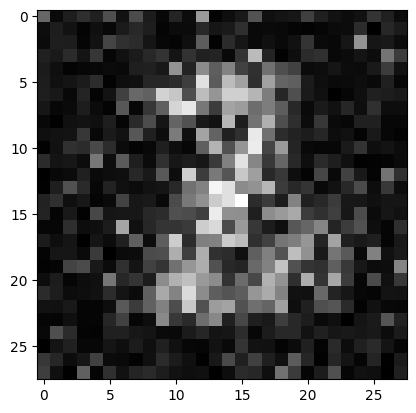

Ploting:  5


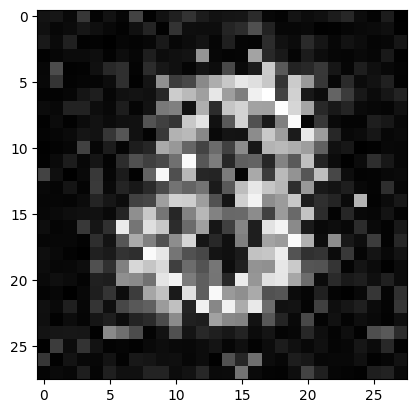

Ploting:  9


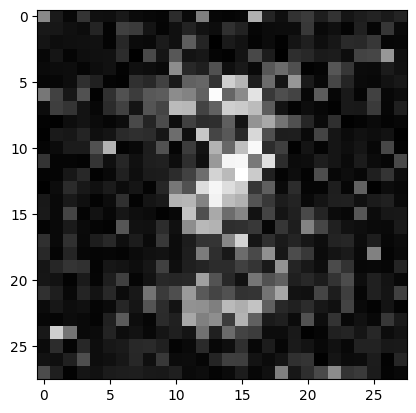

Ploting:  8


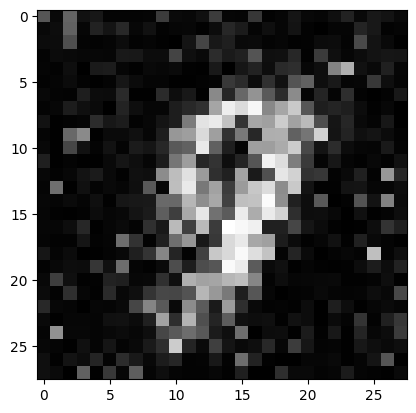

Epoch: 550
loss_g: 1.5997438430786133 	loss_d: 1.0105541944503784
Epoch: 600
loss_g: 1.3339170217514038 	loss_d: 0.8097619414329529
Epoch: 650
loss_g: 0.8161641955375671 	loss_d: 1.0097053050994873
Epoch: 700
loss_g: 1.4412710666656494 	loss_d: 0.8280678391456604
Epoch: 750
loss_g: 1.6896278858184814 	loss_d: 1.0534604787826538
Ploting:  6


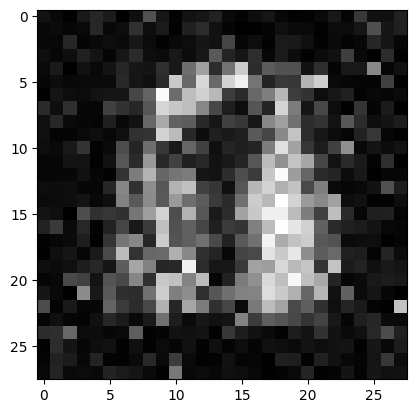

Ploting:  4


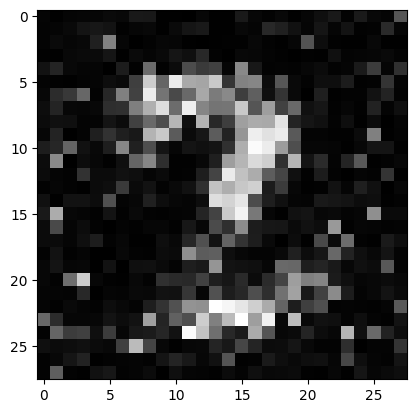

Ploting:  3


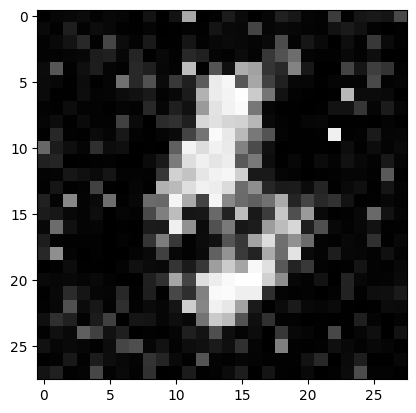

Ploting:  0


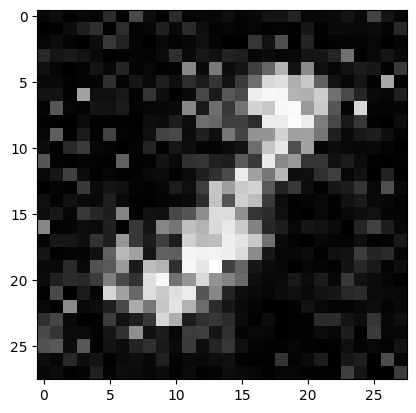

Ploting:  1


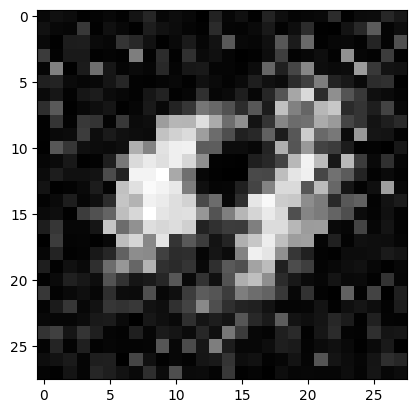

Epoch: 800
loss_g: 1.6845018863677979 	loss_d: 0.8158582448959351
Epoch: 850
loss_g: 1.8386213779449463 	loss_d: 0.9095302820205688
Epoch: 900
loss_g: 2.604626178741455 	loss_d: 0.9040298461914062
Epoch: 950
loss_g: 1.4843862056732178 	loss_d: 0.9026060700416565
Epoch: 1000
loss_g: 2.1604089736938477 	loss_d: 1.3176259994506836
Ploting:  3


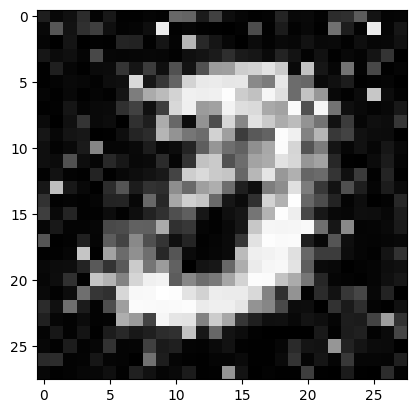

Ploting:  0


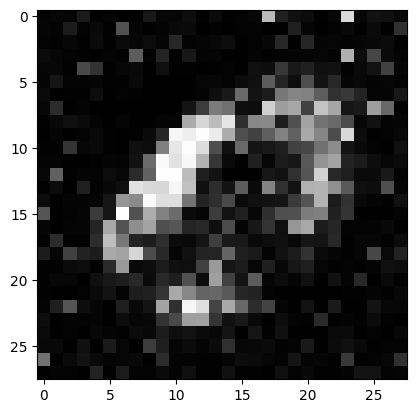

Ploting:  2


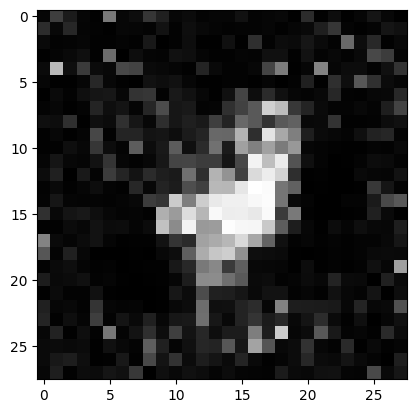

Ploting:  3


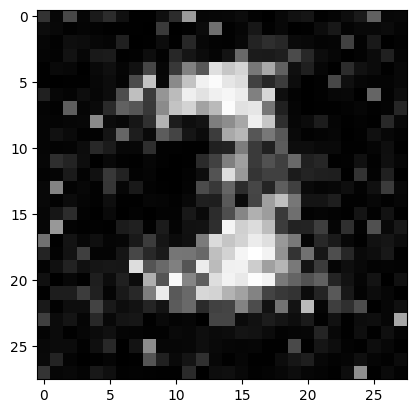

Ploting:  0


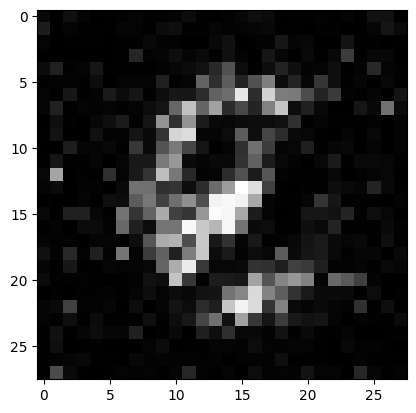

Epoch: 1050
loss_g: 1.8301409482955933 	loss_d: 0.7928787469863892
Epoch: 1100
loss_g: 1.5523502826690674 	loss_d: 0.7269450426101685
Epoch: 1150
loss_g: 1.623558759689331 	loss_d: 0.7095024585723877
Epoch: 1200
loss_g: 1.3040013313293457 	loss_d: 0.6135518550872803
Epoch: 1250
loss_g: 1.0380618572235107 	loss_d: 0.8427891135215759
Ploting:  5


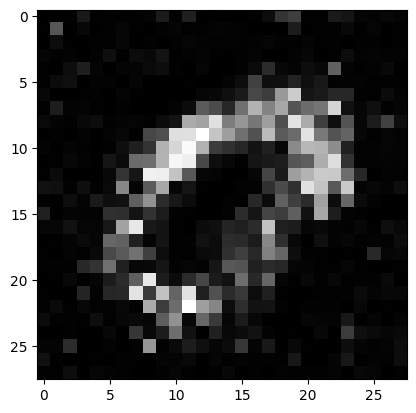

Ploting:  6


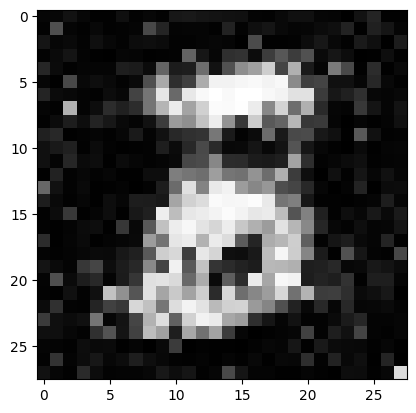

Ploting:  5


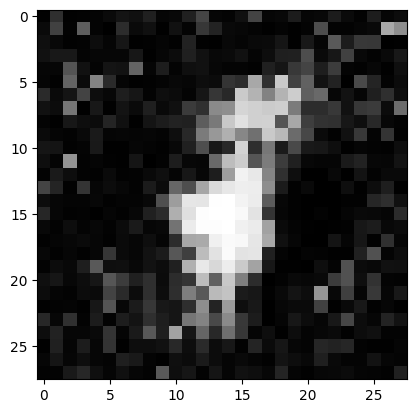

Ploting:  8


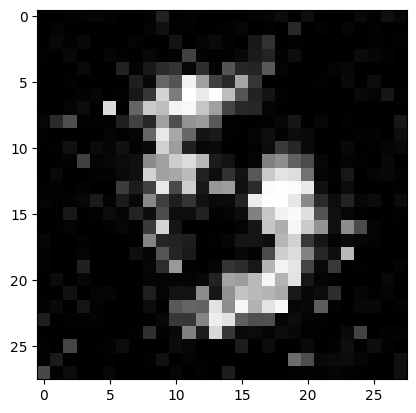

Ploting:  2


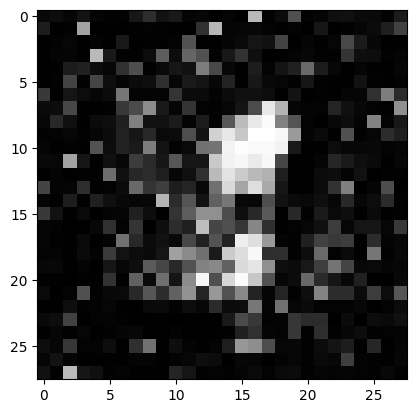

Epoch: 1300
loss_g: 1.741163969039917 	loss_d: 0.7096595168113708
Epoch: 1350
loss_g: 2.8798646926879883 	loss_d: 1.0121837854385376
Epoch: 1400
loss_g: 1.6548429727554321 	loss_d: 0.651313066482544
Epoch: 1450
loss_g: 2.821323871612549 	loss_d: 0.8053329586982727
Epoch: 1500
loss_g: 1.23500657081604 	loss_d: 0.6702473163604736
Ploting:  6


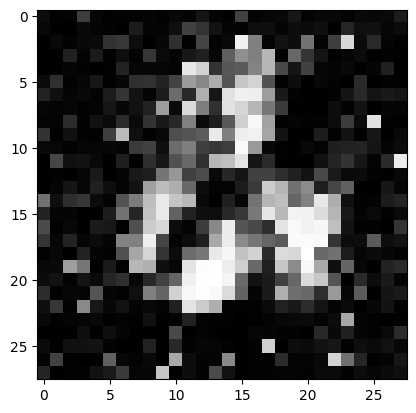

Ploting:  8


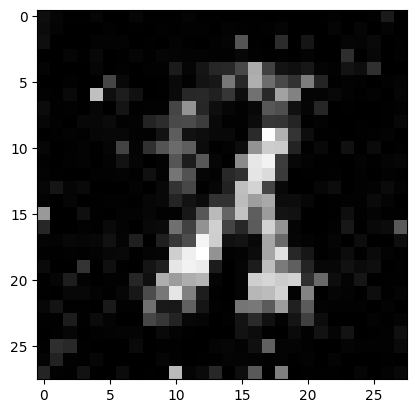

Ploting:  6


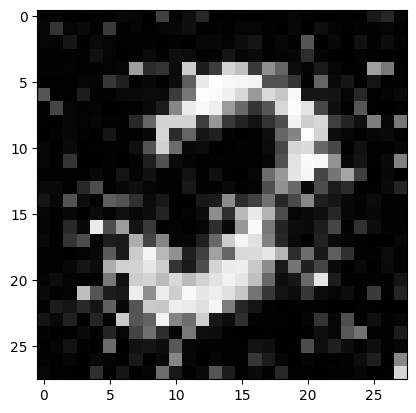

Ploting:  4


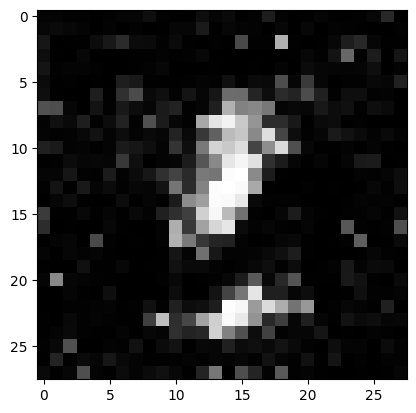

Ploting:  8


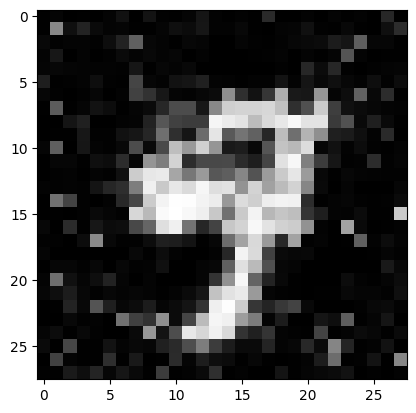

Epoch: 1550
loss_g: 1.2531230449676514 	loss_d: 0.7294995784759521
Epoch: 1600
loss_g: 1.6946089267730713 	loss_d: 0.6085503101348877
Epoch: 1650
loss_g: 1.2797150611877441 	loss_d: 0.5978583097457886
Epoch: 1700
loss_g: 1.9080404043197632 	loss_d: 0.6839495897293091
Epoch: 1750
loss_g: 1.688114881515503 	loss_d: 0.646316647529602
Ploting:  3


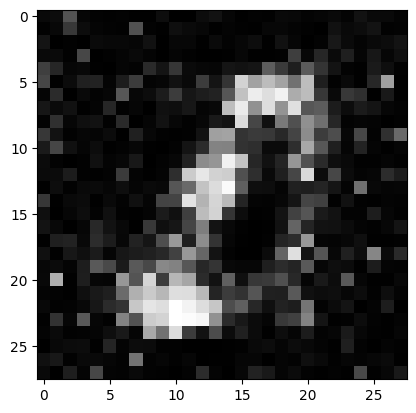

Ploting:  2


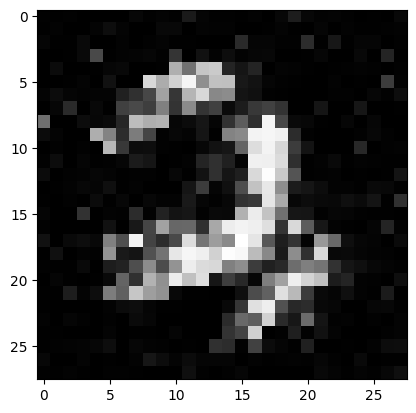

Ploting:  8


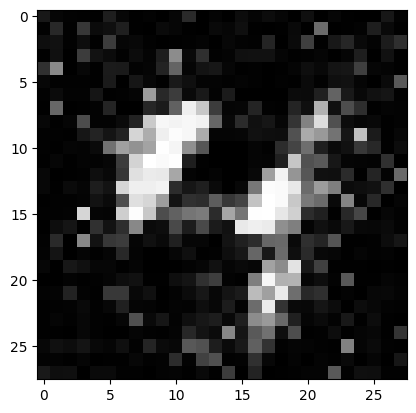

Ploting:  7


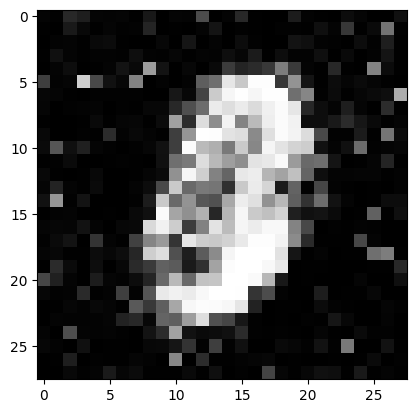

Ploting:  6


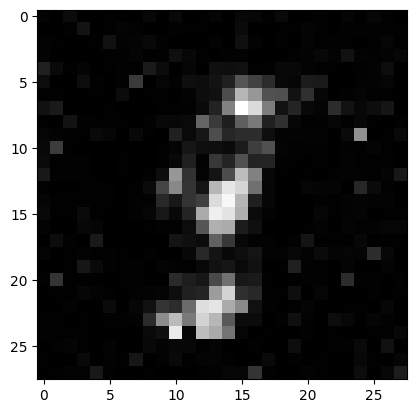

Epoch: 1800
loss_g: 3.8776354789733887 	loss_d: 1.8222911357879639
Epoch: 1850
loss_g: 1.8048102855682373 	loss_d: 0.6526472568511963
Epoch: 1900
loss_g: 1.7665565013885498 	loss_d: 0.5718368291854858
Epoch: 1950
loss_g: 2.7429566383361816 	loss_d: 0.6481177806854248
Epoch: 2000
loss_g: 2.2305374145507812 	loss_d: 0.6330228447914124
Ploting:  0


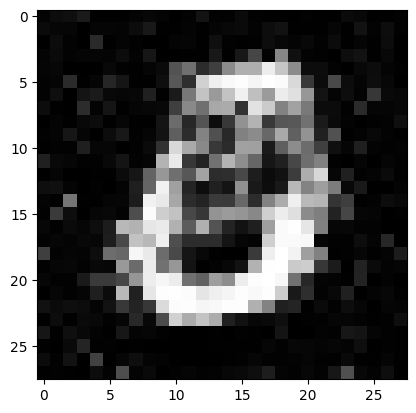

Ploting:  9


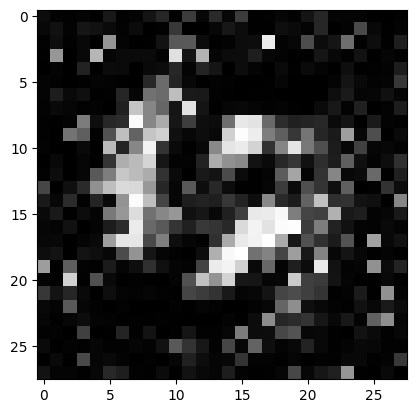

Ploting:  0


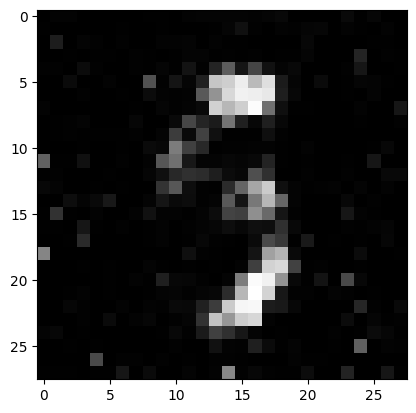

Ploting:  1


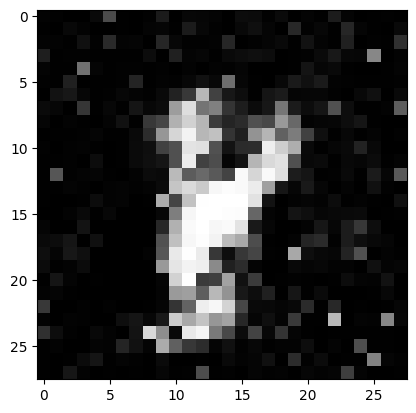

Ploting:  0


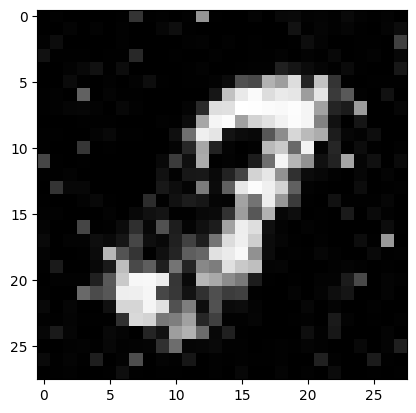

Epoch: 2050
loss_g: 2.2266592979431152 	loss_d: 0.6273400783538818
Epoch: 2100
loss_g: 2.2138867378234863 	loss_d: 0.4468365013599396
Epoch: 2150
loss_g: 2.753185272216797 	loss_d: 0.44389840960502625
Epoch: 2200
loss_g: 1.9035156965255737 	loss_d: 0.7143530249595642
Epoch: 2250
loss_g: 1.9350910186767578 	loss_d: 0.6787858009338379
Ploting:  4


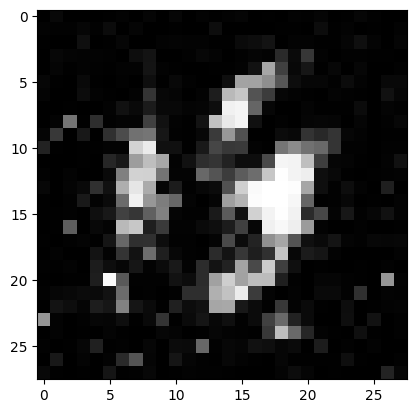

Ploting:  0


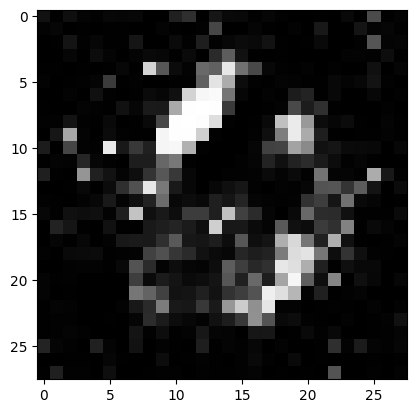

Ploting:  4


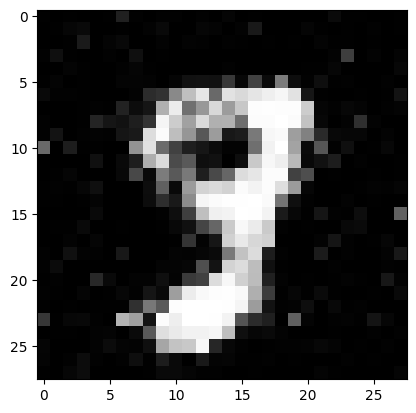

Ploting:  2


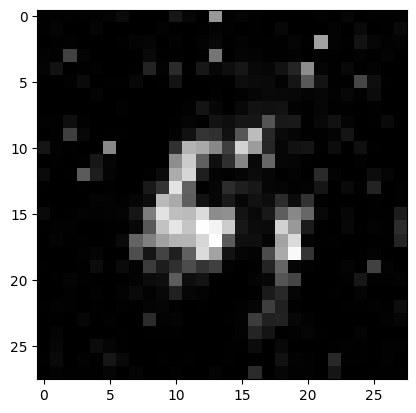

Ploting:  1


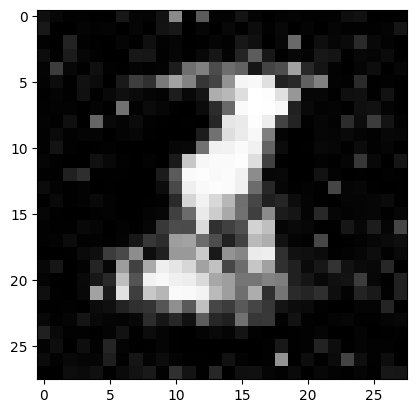

Epoch: 2300
loss_g: 1.3304011821746826 	loss_d: 0.7919659614562988
Epoch: 2350
loss_g: 1.5496511459350586 	loss_d: 0.6854393482208252
Epoch: 2400
loss_g: 1.2746707201004028 	loss_d: 0.7530125975608826
Epoch: 2450
loss_g: 2.223071575164795 	loss_d: 0.5504651665687561
Epoch: 2500
loss_g: 2.746849536895752 	loss_d: 0.5810626745223999
Ploting:  4


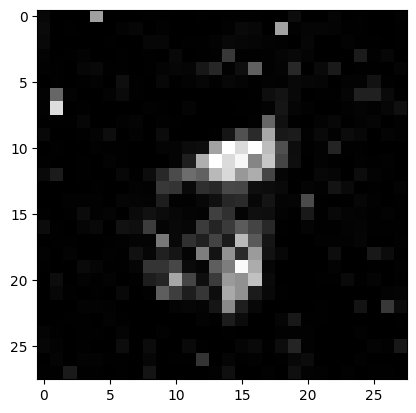

Ploting:  3


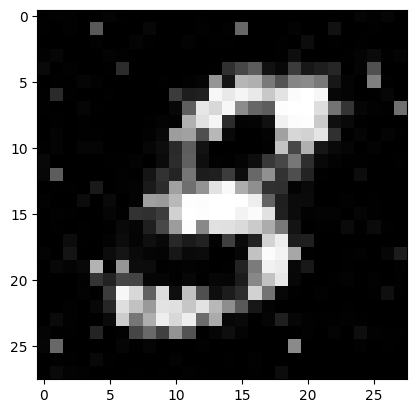

Ploting:  1


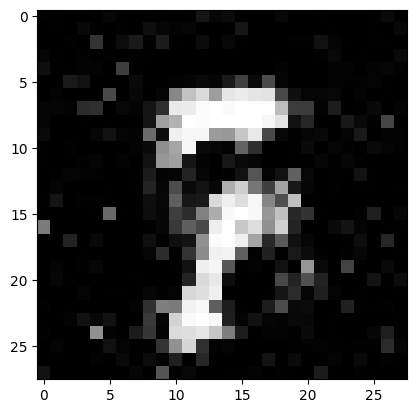

Ploting:  2


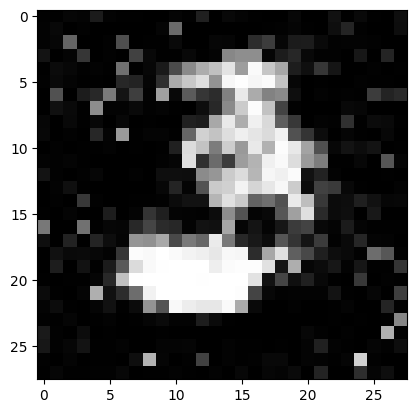

Ploting:  4


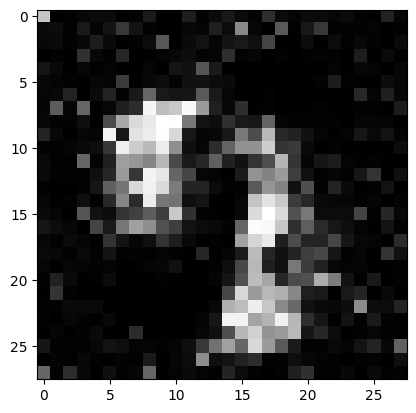

Epoch: 2550
loss_g: 2.0821118354797363 	loss_d: 0.6940907835960388
Epoch: 2600
loss_g: 2.378695011138916 	loss_d: 0.5158308744430542
Epoch: 2650
loss_g: 2.722541093826294 	loss_d: 0.7099966406822205
Epoch: 2700
loss_g: 1.750270962715149 	loss_d: 0.5573933720588684
Epoch: 2750
loss_g: 1.176837682723999 	loss_d: 0.6587284803390503
Ploting:  4


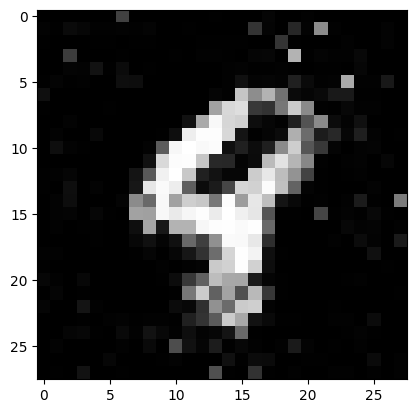

Ploting:  8


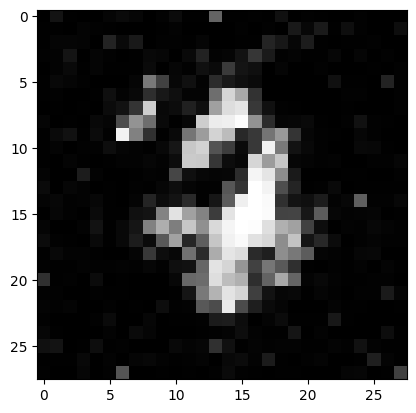

Ploting:  1


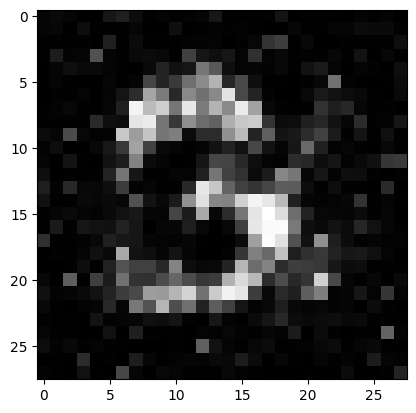

Ploting:  5


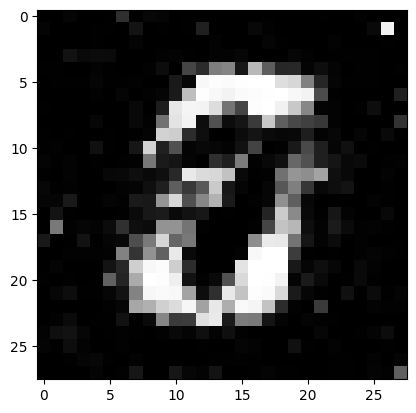

Ploting:  1


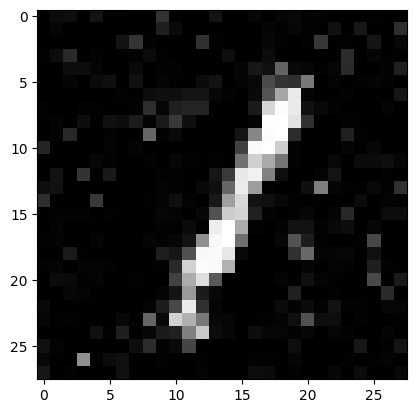

Epoch: 2800
loss_g: 3.2249932289123535 	loss_d: 0.7396658658981323
Epoch: 2850
loss_g: 2.4221420288085938 	loss_d: 0.5038519501686096
Epoch: 2900
loss_g: 1.5200424194335938 	loss_d: 0.8491197228431702
Epoch: 2950
loss_g: 2.2304539680480957 	loss_d: 0.7345914840698242
Epoch: 3000
loss_g: 0.79153972864151 	loss_d: 1.1540130376815796
Ploting:  4


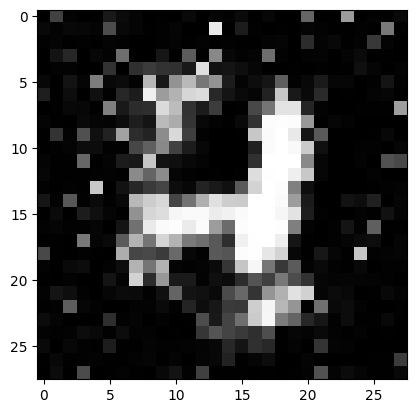

Ploting:  1


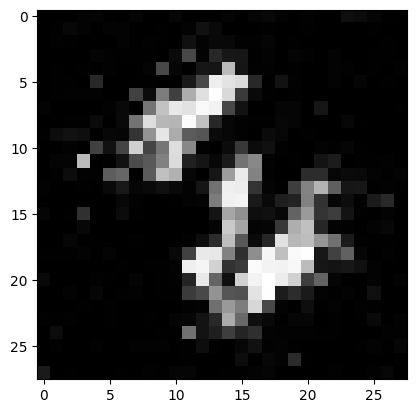

Ploting:  1


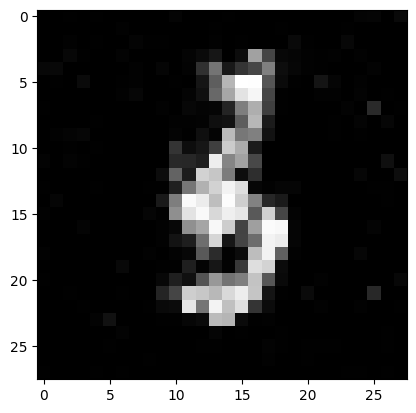

Ploting:  0


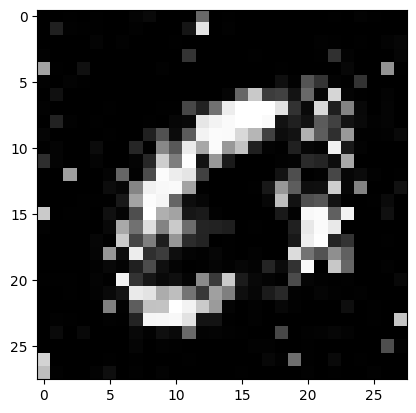

Ploting:  7


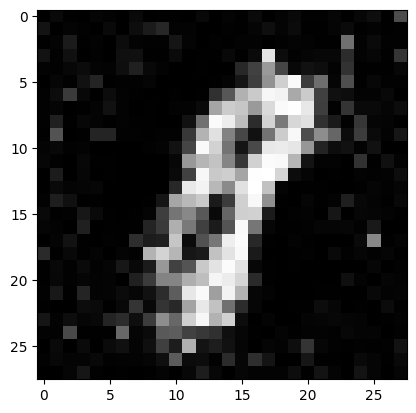

Epoch: 3050
loss_g: 1.8713288307189941 	loss_d: 0.8273335695266724
Epoch: 3100
loss_g: 1.7900724411010742 	loss_d: 0.58319091796875
Epoch: 3150
loss_g: 3.895885705947876 	loss_d: 1.1988399028778076
Epoch: 3200
loss_g: 2.0205445289611816 	loss_d: 0.5315845608711243
Epoch: 3250
loss_g: 3.2814645767211914 	loss_d: 0.8833121061325073
Ploting:  8


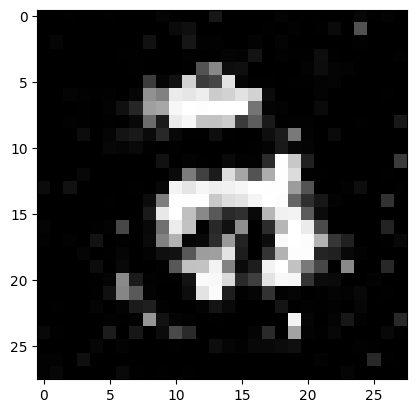

Ploting:  0


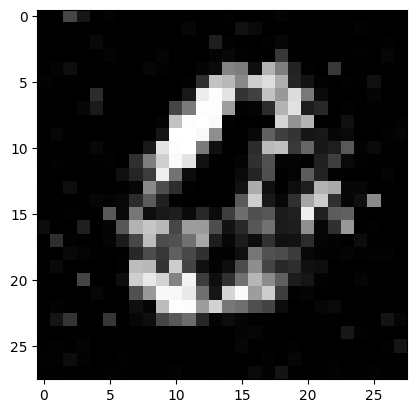

Ploting:  7


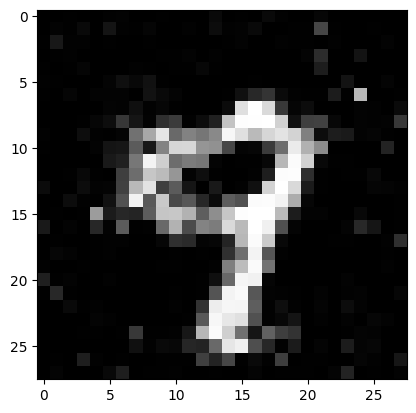

Ploting:  5


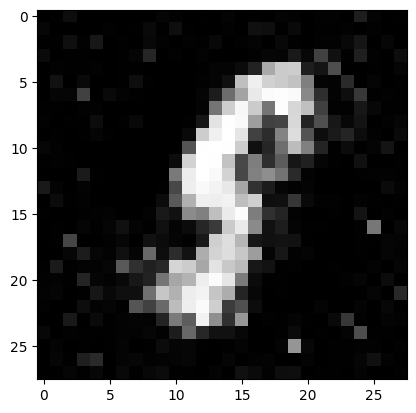

Ploting:  0


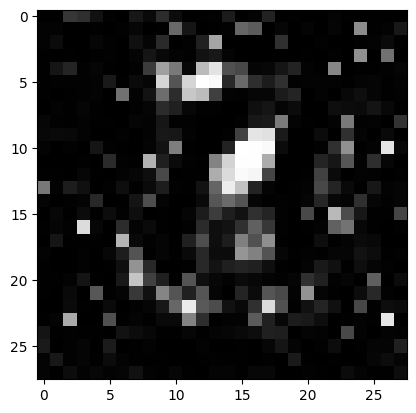

Epoch: 3300
loss_g: 0.5540081262588501 	loss_d: 1.9132193326950073
Epoch: 3350
loss_g: 2.856412410736084 	loss_d: 0.8704806566238403
Epoch: 3400
loss_g: 3.0007810592651367 	loss_d: 0.6436645984649658
Epoch: 3450
loss_g: 2.4875736236572266 	loss_d: 0.7920926809310913
Epoch: 3500
loss_g: 2.1854188442230225 	loss_d: 0.5826548337936401
Ploting:  1


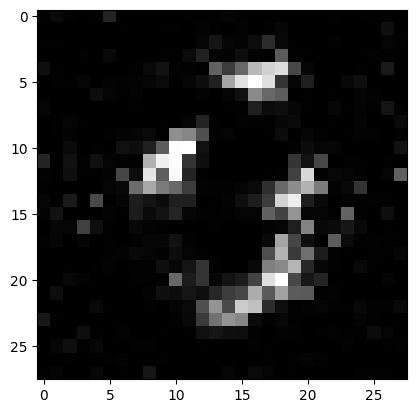

Ploting:  9


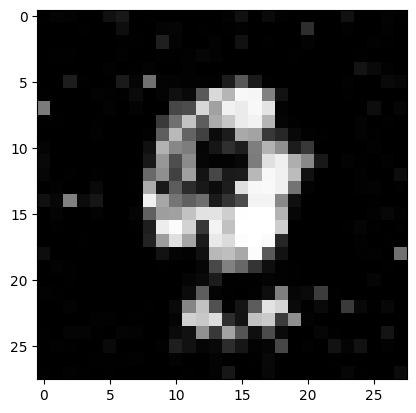

Ploting:  0


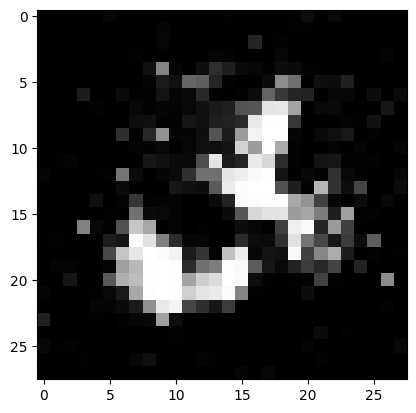

Ploting:  9


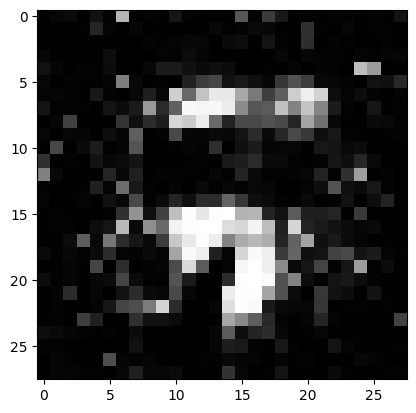

Ploting:  9


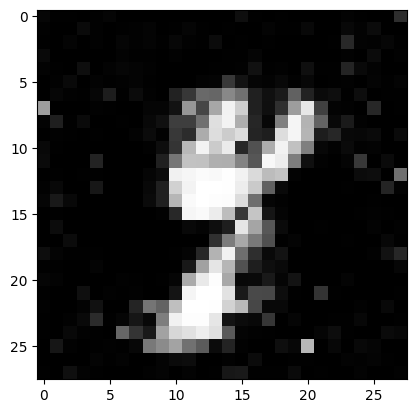

Epoch: 3550
loss_g: 3.8241395950317383 	loss_d: 1.603176236152649
Epoch: 3600
loss_g: 1.5622906684875488 	loss_d: 0.4820020794868469
Epoch: 3650
loss_g: 0.7387217283248901 	loss_d: 1.0808695554733276
Epoch: 3700
loss_g: 1.5745666027069092 	loss_d: 0.5621670484542847
Epoch: 3750
loss_g: 2.2537102699279785 	loss_d: 0.6016373634338379
Ploting:  3


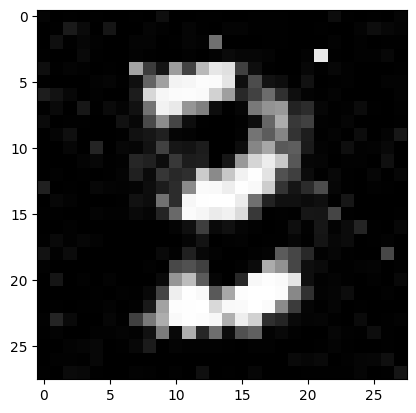

Ploting:  8


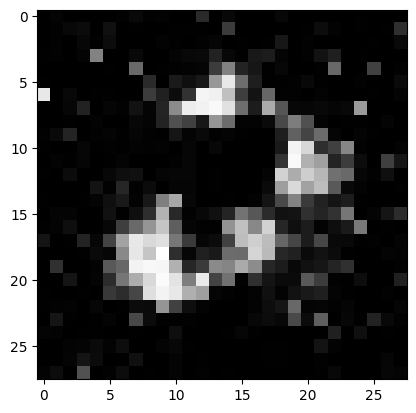

Ploting:  3


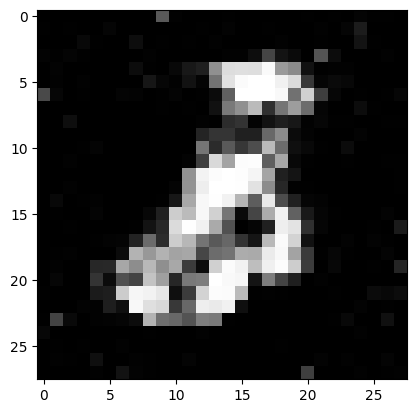

Ploting:  9


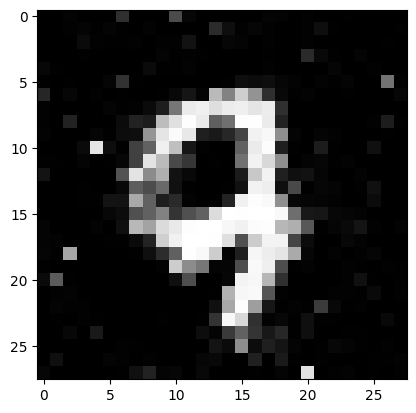

Ploting:  7


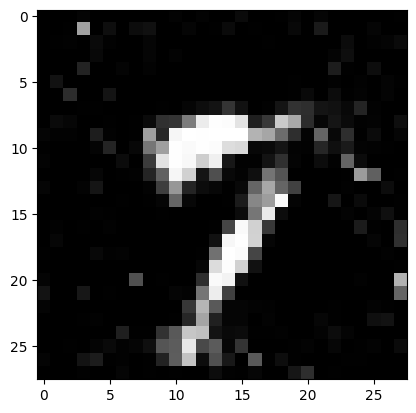

Epoch: 3800
loss_g: 1.506773829460144 	loss_d: 0.6118638515472412
Epoch: 3850
loss_g: 0.7577614784240723 	loss_d: 1.2978907823562622
Epoch: 3900
loss_g: 1.2023775577545166 	loss_d: 0.8430534601211548
Epoch: 3950
loss_g: 1.6564772129058838 	loss_d: 0.664738655090332
Epoch: 4000
loss_g: 3.482675313949585 	loss_d: 0.7640867233276367
Ploting:  5


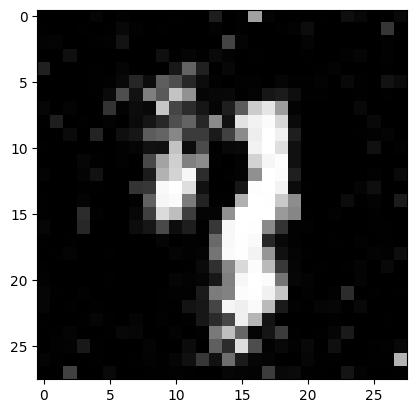

Ploting:  2


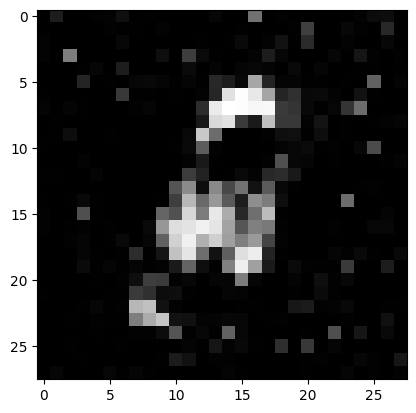

Ploting:  1


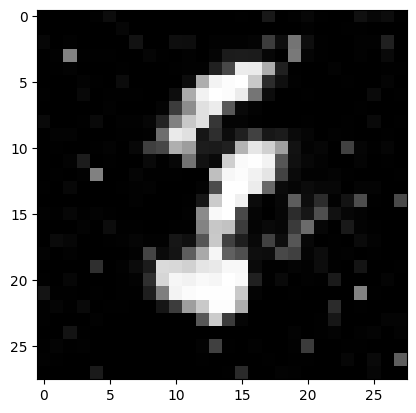

Ploting:  0


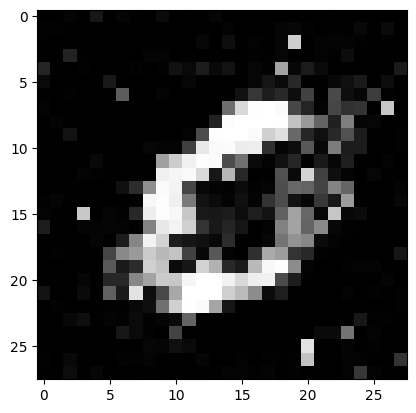

Ploting:  3


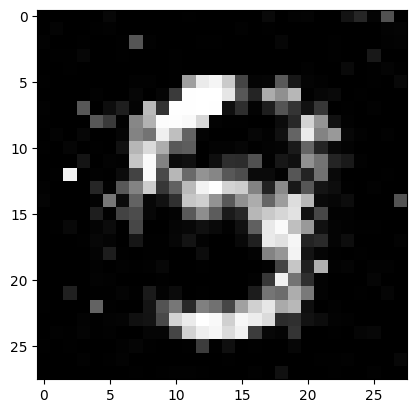

Epoch: 4050
loss_g: 3.236414909362793 	loss_d: 0.5517714023590088
Epoch: 4100
loss_g: 2.9545140266418457 	loss_d: 0.934566855430603
Epoch: 4150
loss_g: 2.48289155960083 	loss_d: 0.6199565529823303
Epoch: 4200
loss_g: 1.860105276107788 	loss_d: 0.5934706926345825
Epoch: 4250
loss_g: 1.5963451862335205 	loss_d: 0.5505963563919067
Ploting:  5


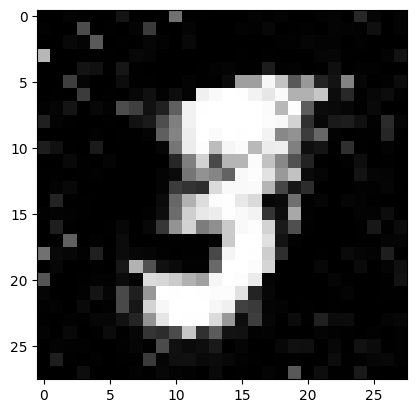

Ploting:  6


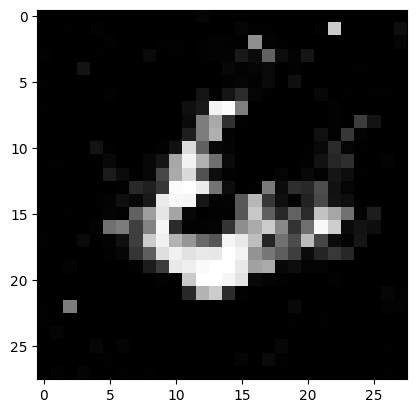

Ploting:  3


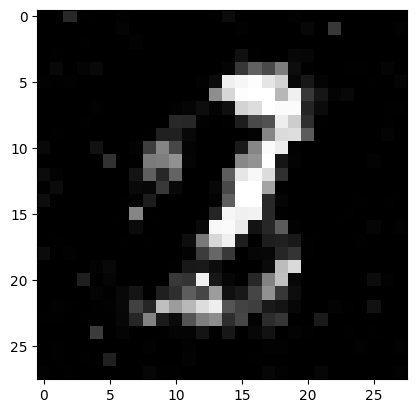

Ploting:  5


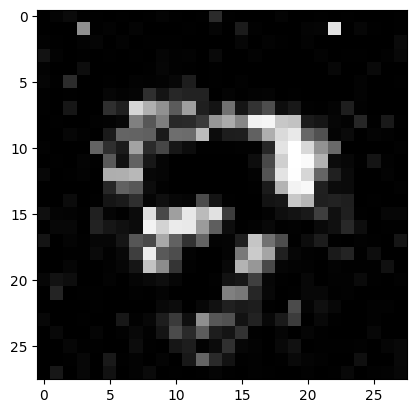

Ploting:  3


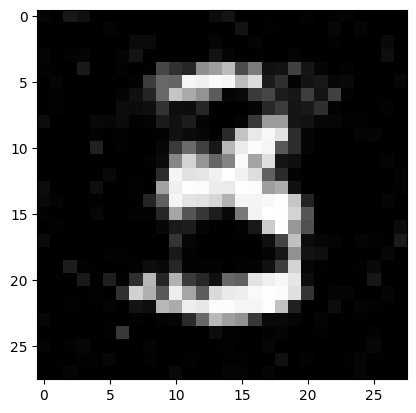

Epoch: 4300
loss_g: 2.29954195022583 	loss_d: 0.5924816131591797
Epoch: 4350
loss_g: 1.7420152425765991 	loss_d: 0.5902000069618225
Epoch: 4400
loss_g: 2.4351725578308105 	loss_d: 0.8404625654220581
Epoch: 4450
loss_g: 2.6048660278320312 	loss_d: 0.740771472454071
Epoch: 4500
loss_g: 2.3037407398223877 	loss_d: 0.799990177154541
Ploting:  6


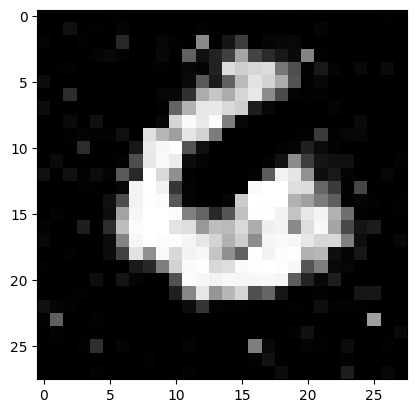

Ploting:  3


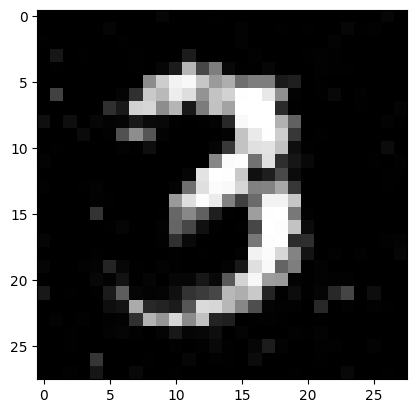

Ploting:  5


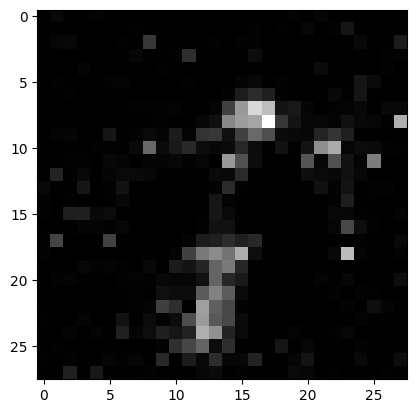

Ploting:  4


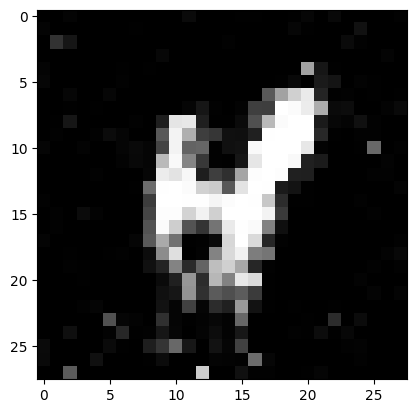

Ploting:  5


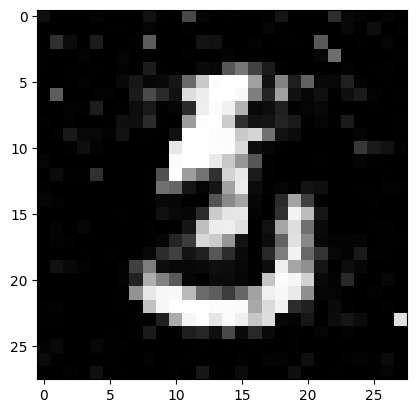

Epoch: 4550
loss_g: 1.7727892398834229 	loss_d: 0.5546543598175049
Epoch: 4600
loss_g: 1.5141631364822388 	loss_d: 0.7258609533309937
Epoch: 4650
loss_g: 1.639853835105896 	loss_d: 0.7188436388969421
Epoch: 4700
loss_g: 2.270411252975464 	loss_d: 0.736853837966919
Epoch: 4750
loss_g: 1.310110330581665 	loss_d: 0.7862060070037842
Ploting:  3


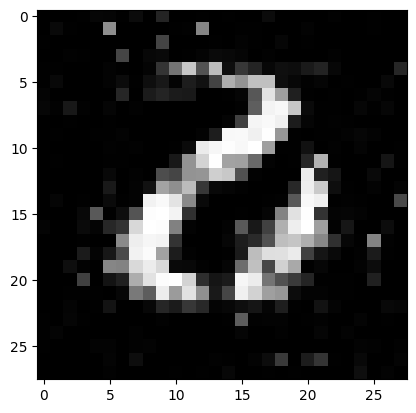

Ploting:  9


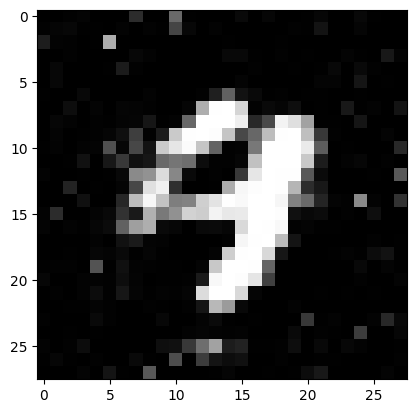

Ploting:  8


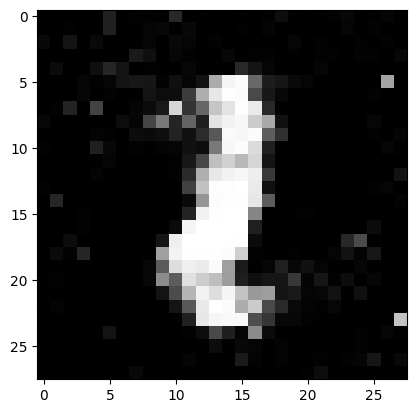

Ploting:  3


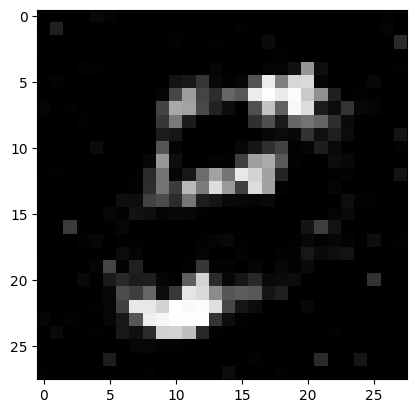

Ploting:  8


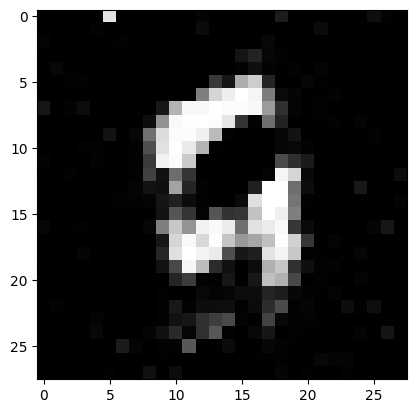

Epoch: 4800
loss_g: 1.64695143699646 	loss_d: 0.5932337045669556
Epoch: 4850
loss_g: 1.0722060203552246 	loss_d: 0.8326400518417358
Epoch: 4900
loss_g: 3.417313814163208 	loss_d: 0.8509493470191956
Epoch: 4950
loss_g: 3.1834349632263184 	loss_d: 0.6854207515716553
Epoch: 5000
loss_g: 1.8261879682540894 	loss_d: 0.8427021503448486
Ploting:  8


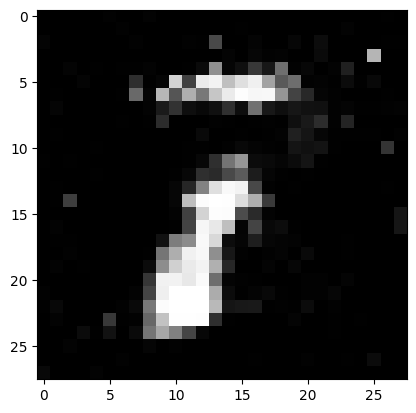

Ploting:  3


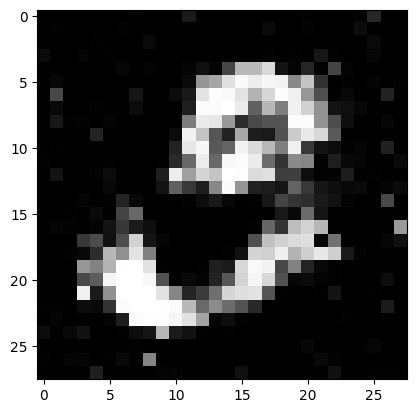

Ploting:  6


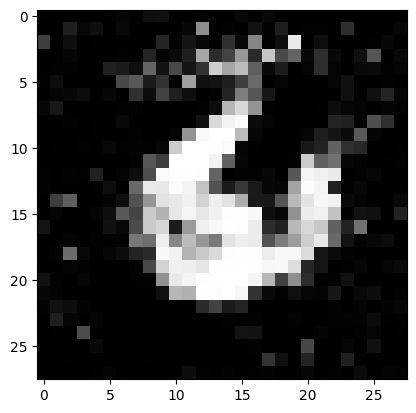

Ploting:  9


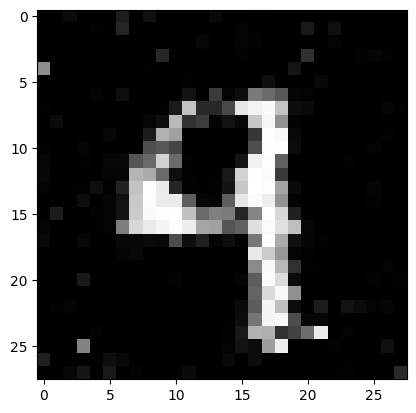

Ploting:  7


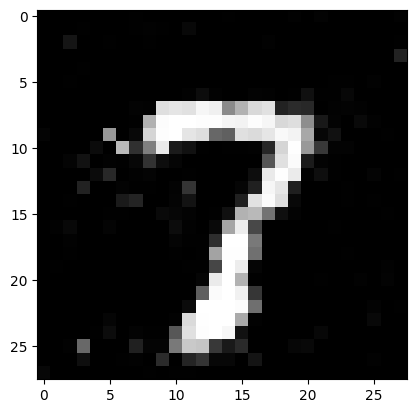

Epoch: 5050
loss_g: 1.927643060684204 	loss_d: 0.6299862265586853
Epoch: 5100
loss_g: 1.065169334411621 	loss_d: 0.7274608016014099
Epoch: 5150
loss_g: 1.2088912725448608 	loss_d: 0.8952022194862366
Epoch: 5200
loss_g: 1.5935378074645996 	loss_d: 0.5442734956741333
Epoch: 5250
loss_g: 1.8443591594696045 	loss_d: 0.808711588382721
Ploting:  7


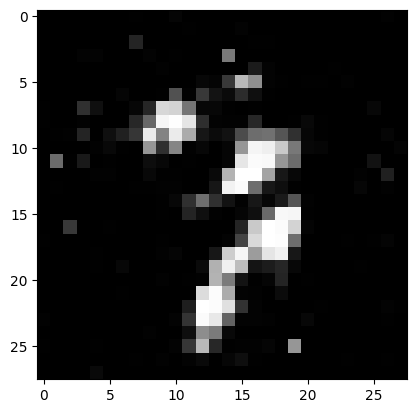

Ploting:  6


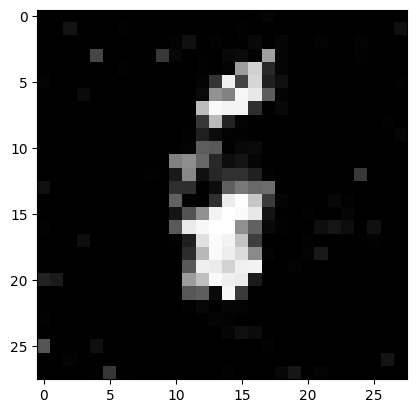

Ploting:  2


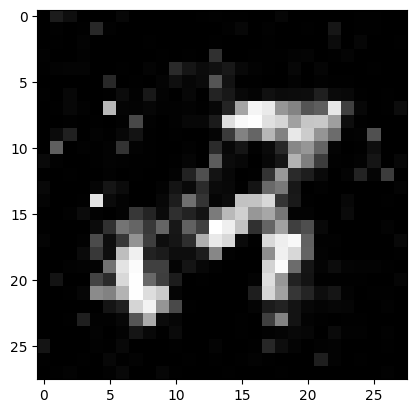

Ploting:  6


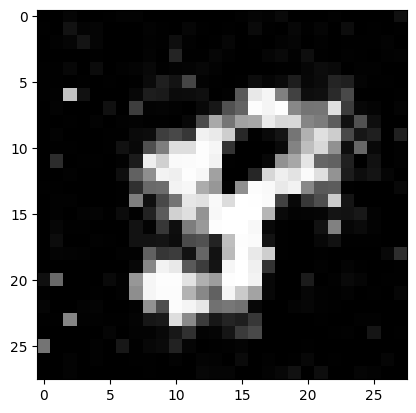

Ploting:  0


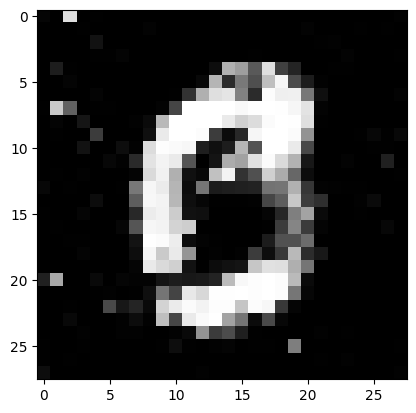

Epoch: 5300
loss_g: 1.4277465343475342 	loss_d: 0.783707857131958
Epoch: 5350
loss_g: 1.6889393329620361 	loss_d: 0.8049195408821106
Epoch: 5400
loss_g: 1.587828278541565 	loss_d: 0.7946343421936035
Epoch: 5450
loss_g: 1.6772114038467407 	loss_d: 0.8421742916107178
Epoch: 5500
loss_g: 1.8467156887054443 	loss_d: 0.6430200934410095
Ploting:  7


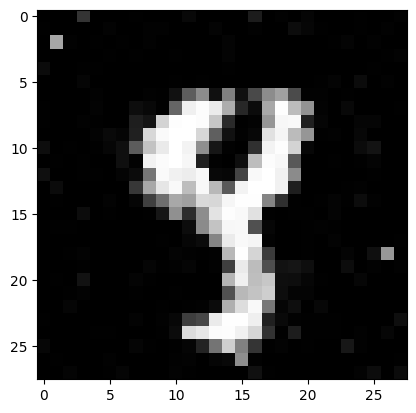

Ploting:  7


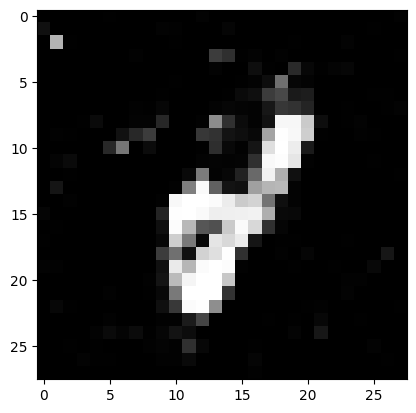

Ploting:  7


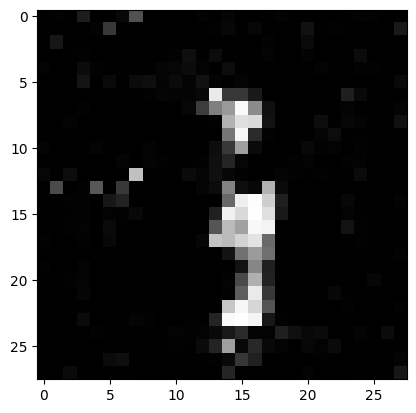

Ploting:  5


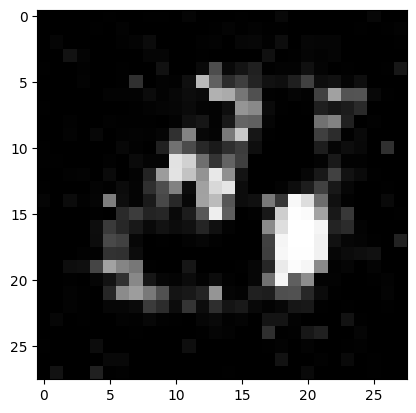

Ploting:  5


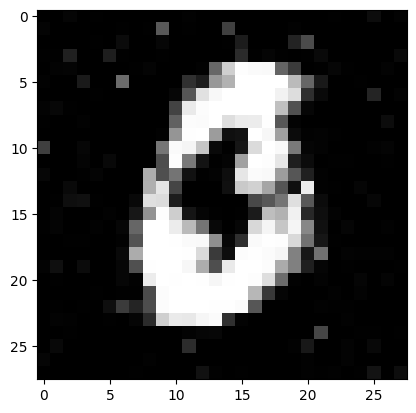

Epoch: 5550
loss_g: 1.9900957345962524 	loss_d: 0.6106728911399841
Epoch: 5600
loss_g: 2.00565505027771 	loss_d: 0.7088160514831543
Epoch: 5650
loss_g: 1.4084699153900146 	loss_d: 0.8697434663772583
Epoch: 5700
loss_g: 1.9760833978652954 	loss_d: 0.8585718274116516
Epoch: 5750
loss_g: 0.9557853937149048 	loss_d: 0.8873544335365295
Ploting:  4


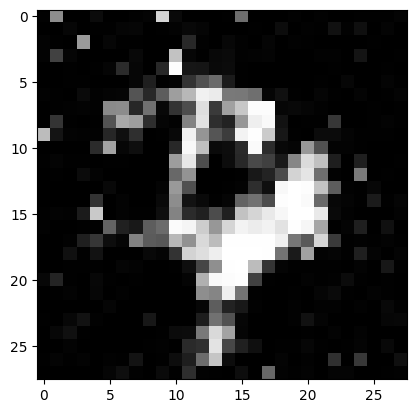

Ploting:  8


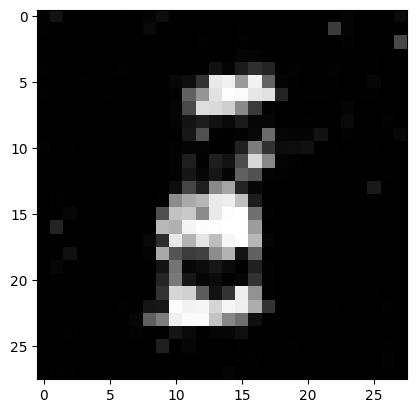

Ploting:  5


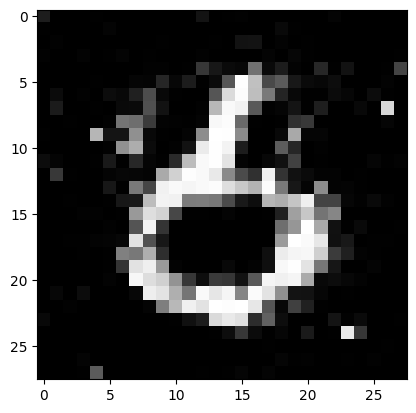

Ploting:  8


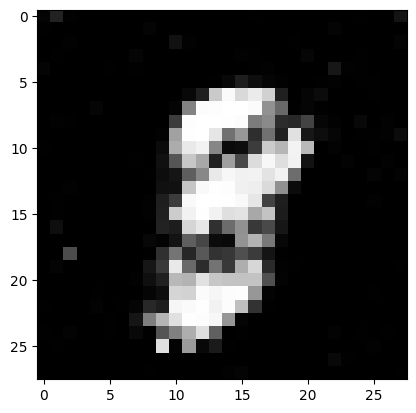

Ploting:  2


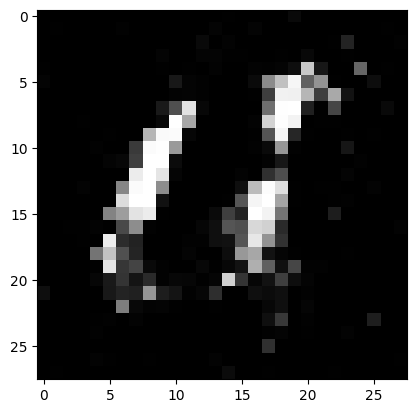

Epoch: 5800
loss_g: 2.4243457317352295 	loss_d: 0.841184139251709
Epoch: 5850
loss_g: 1.6204209327697754 	loss_d: 0.6631574630737305
Epoch: 5900
loss_g: 1.5166218280792236 	loss_d: 0.8863588571548462
Epoch: 5950
loss_g: 2.4065375328063965 	loss_d: 0.6401416063308716
Epoch: 6000
loss_g: 2.237840175628662 	loss_d: 0.7142742872238159
Ploting:  4


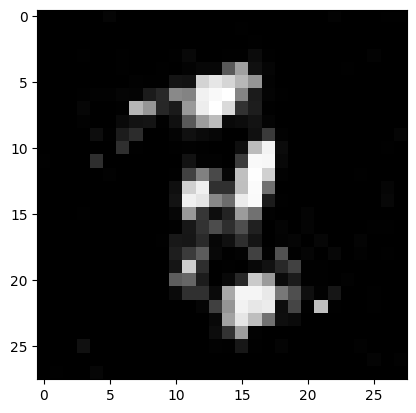

Ploting:  5


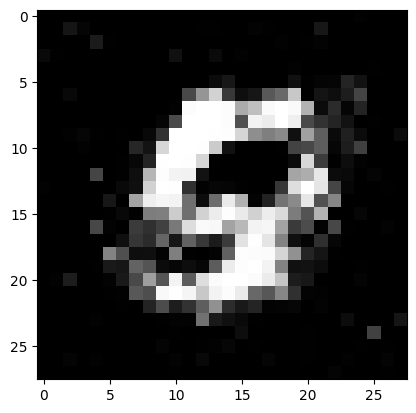

Ploting:  4


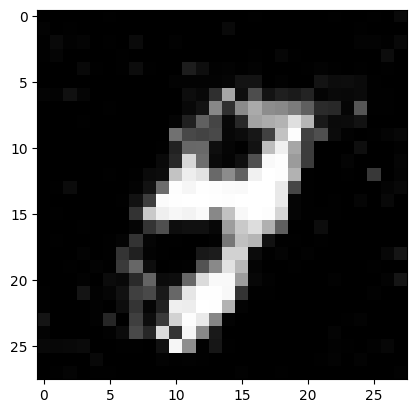

Ploting:  1


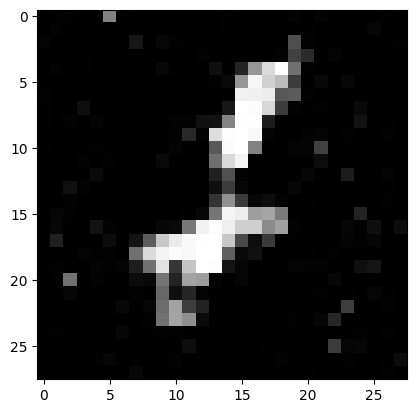

Ploting:  4


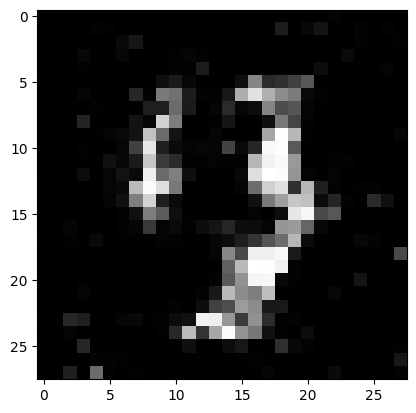

Epoch: 6050
loss_g: 1.9336832761764526 	loss_d: 0.6440753936767578
Epoch: 6100
loss_g: 0.928102433681488 	loss_d: 0.9868168830871582
Epoch: 6150
loss_g: 2.0725576877593994 	loss_d: 0.5768932104110718
Epoch: 6200
loss_g: 1.820704698562622 	loss_d: 0.7976585626602173
Epoch: 6250
loss_g: 2.2985289096832275 	loss_d: 0.6350074410438538
Ploting:  3


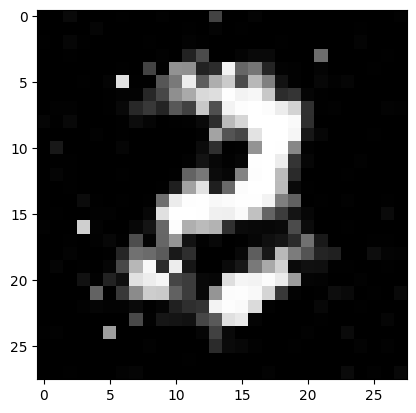

Ploting:  4


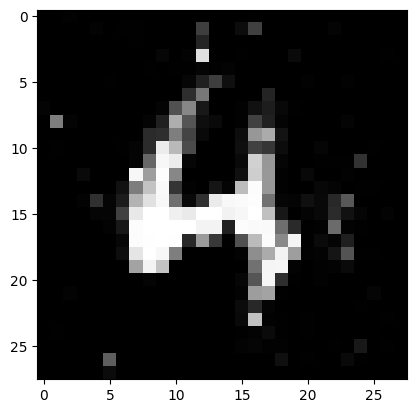

Ploting:  7


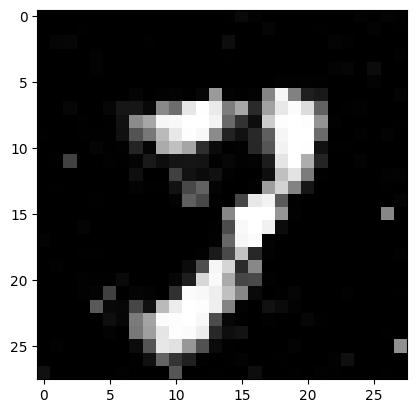

Ploting:  1


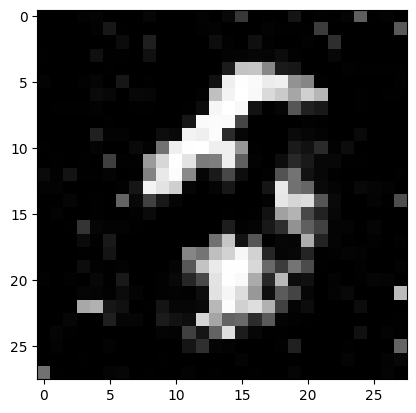

Ploting:  1


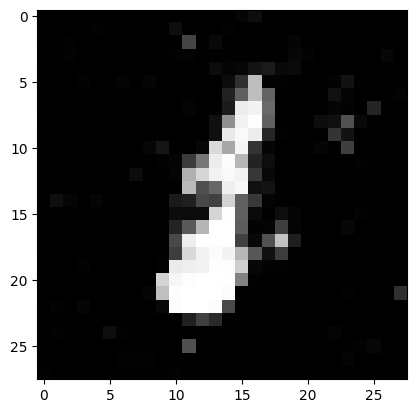

Epoch: 6300
loss_g: 2.144333600997925 	loss_d: 0.6801093816757202
Epoch: 6350
loss_g: 1.6974233388900757 	loss_d: 0.6716076135635376
Epoch: 6400
loss_g: 2.2332630157470703 	loss_d: 0.7316125631332397
Epoch: 6450
loss_g: 0.7669435739517212 	loss_d: 0.8956772685050964
Epoch: 6500
loss_g: 1.5226695537567139 	loss_d: 0.7347273826599121
Ploting:  9


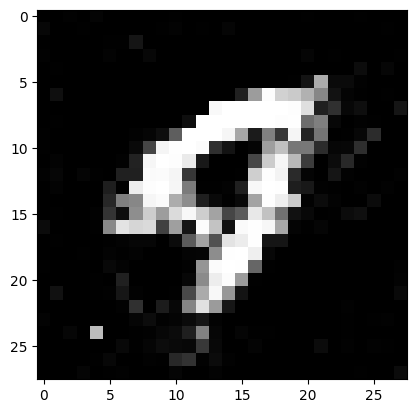

Ploting:  8


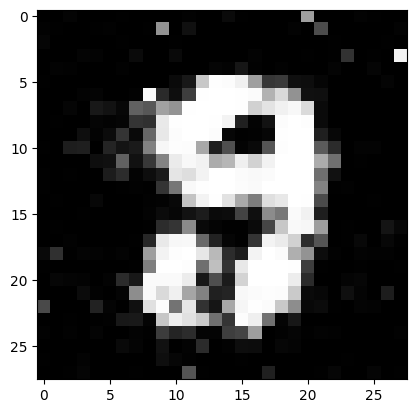

Ploting:  1


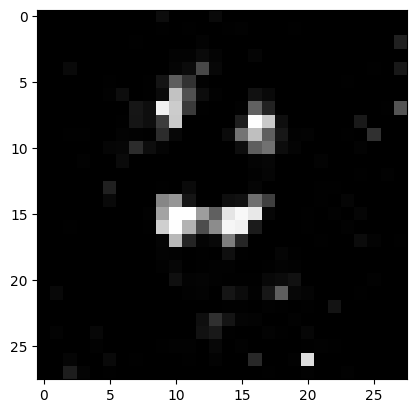

Ploting:  1


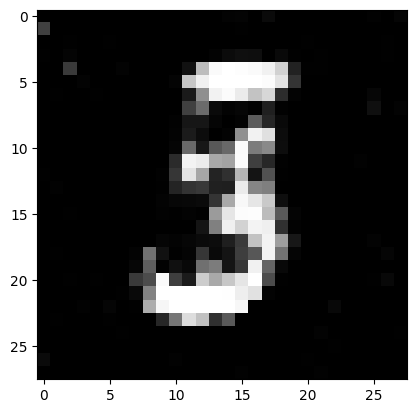

Ploting:  1


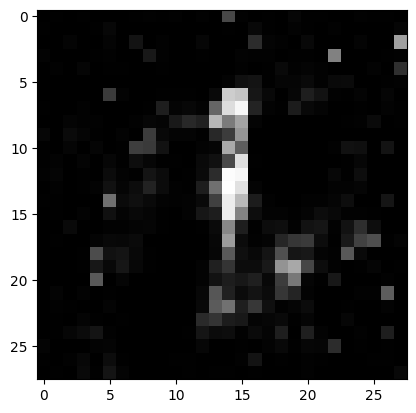

Epoch: 6550
loss_g: 3.2713842391967773 	loss_d: 0.9724637866020203
Epoch: 6600
loss_g: 1.5643221139907837 	loss_d: 0.6715146899223328
Epoch: 6650
loss_g: 3.6504244804382324 	loss_d: 1.1225403547286987
Epoch: 6700
loss_g: 2.1278305053710938 	loss_d: 0.8443180322647095
Epoch: 6750
loss_g: 1.5407662391662598 	loss_d: 0.752167820930481
Ploting:  3


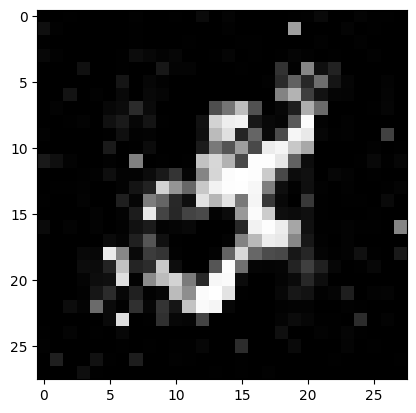

Ploting:  1


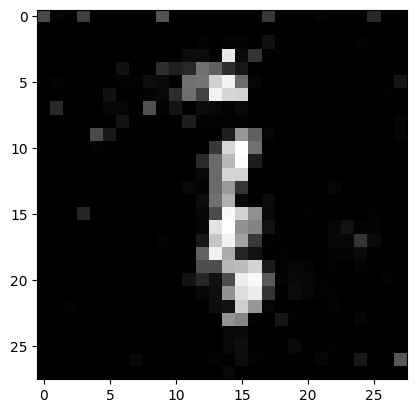

Ploting:  5


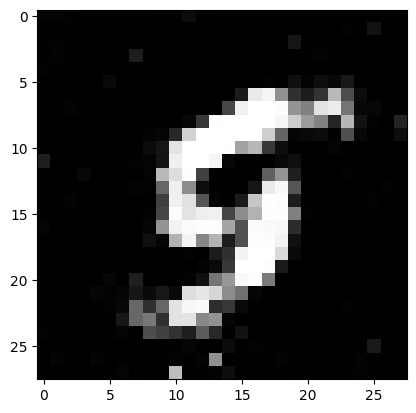

Ploting:  8


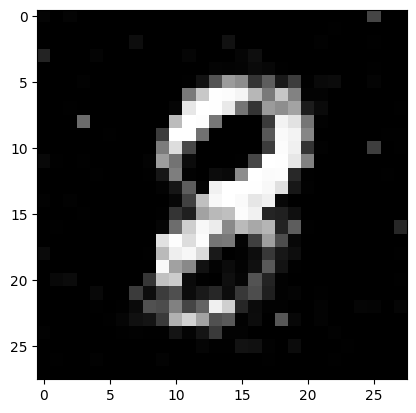

Ploting:  0


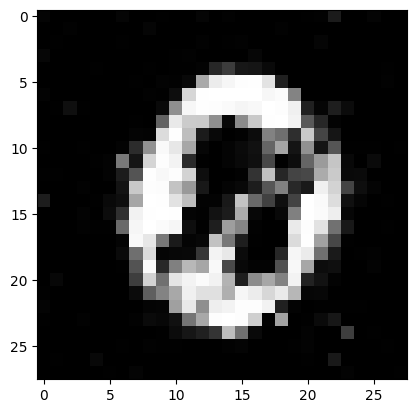

Epoch: 6800
loss_g: 1.8654394149780273 	loss_d: 0.8042430281639099
Epoch: 6850
loss_g: 1.3574203252792358 	loss_d: 0.9895461797714233
Epoch: 6900
loss_g: 1.7256097793579102 	loss_d: 0.8800530433654785
Epoch: 6950
loss_g: 1.0694072246551514 	loss_d: 0.9995725750923157
Epoch: 7000
loss_g: 1.2134714126586914 	loss_d: 1.110821008682251
Ploting:  6


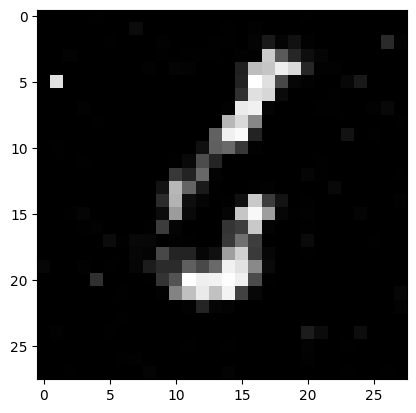

Ploting:  8


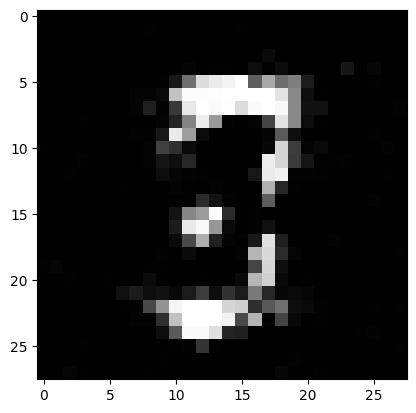

Ploting:  8


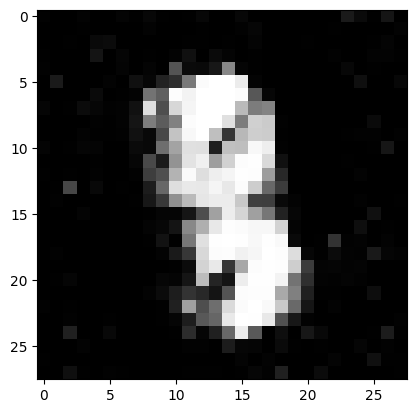

Ploting:  2


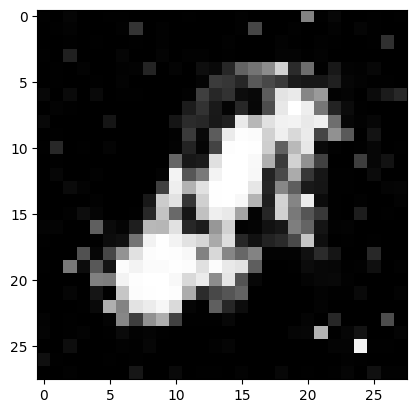

Ploting:  7


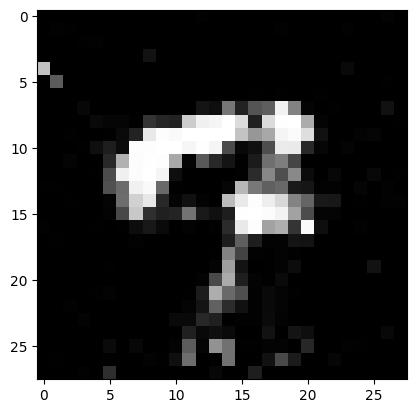

Epoch: 7050
loss_g: 1.9376801252365112 	loss_d: 0.6160985827445984
Epoch: 7100
loss_g: 1.0314314365386963 	loss_d: 1.0046911239624023
Epoch: 7150
loss_g: 1.5284830331802368 	loss_d: 0.8586813807487488
Epoch: 7200
loss_g: 1.3164916038513184 	loss_d: 1.145229458808899
Epoch: 7250
loss_g: 2.4044594764709473 	loss_d: 0.8334635496139526
Ploting:  5


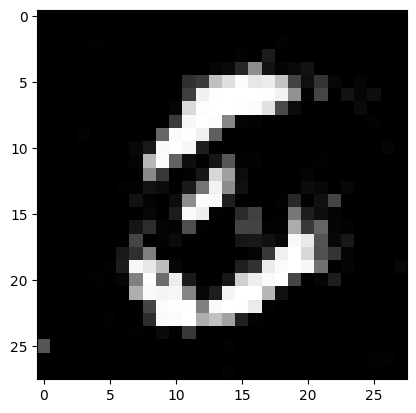

Ploting:  7


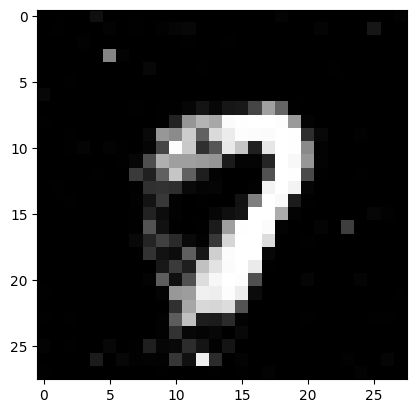

Ploting:  1


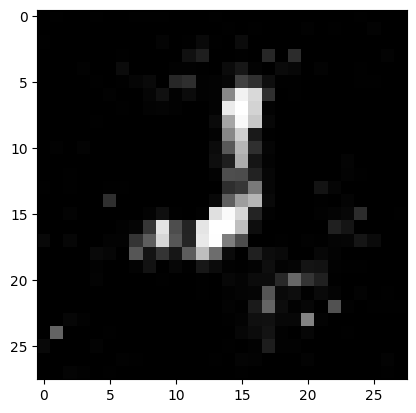

Ploting:  2


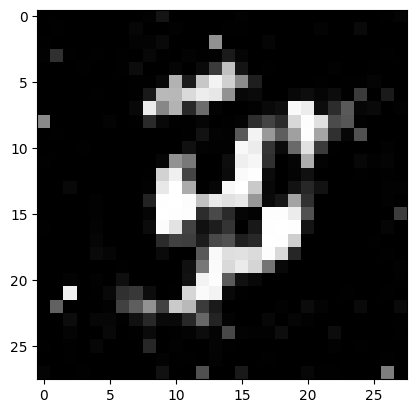

Ploting:  8


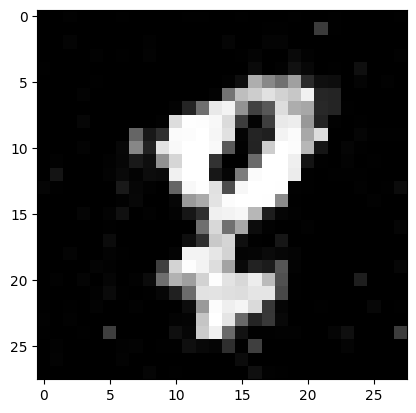

Epoch: 7300
loss_g: 1.5149908065795898 	loss_d: 0.7608687877655029
Epoch: 7350
loss_g: 1.4802324771881104 	loss_d: 0.8981819152832031
Epoch: 7400
loss_g: 2.067720890045166 	loss_d: 0.5917184352874756
Epoch: 7450
loss_g: 2.6596758365631104 	loss_d: 0.7045135498046875
Epoch: 7500
loss_g: 1.6356968879699707 	loss_d: 0.8160958886146545
Ploting:  9


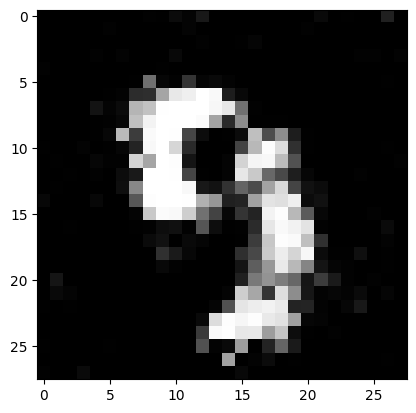

Ploting:  5


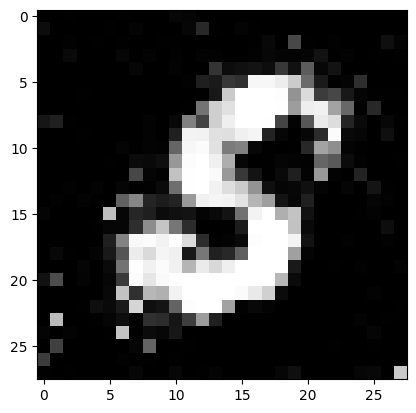

Ploting:  1


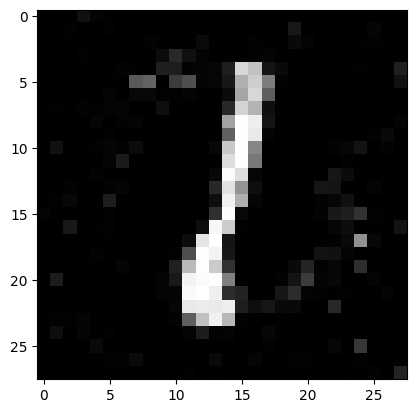

Ploting:  9


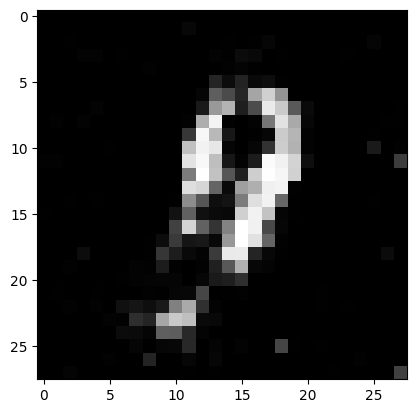

Ploting:  4


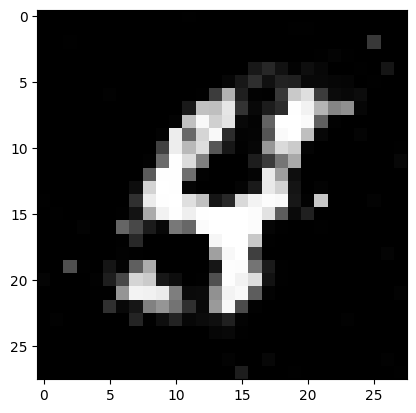

Epoch: 7550
loss_g: 2.0449934005737305 	loss_d: 0.8966231346130371
Epoch: 7600
loss_g: 2.6074929237365723 	loss_d: 0.9325855374336243
Epoch: 7650
loss_g: 1.8177440166473389 	loss_d: 0.6047862768173218
Epoch: 7700
loss_g: 1.5789837837219238 	loss_d: 0.8577090501785278
Epoch: 7750
loss_g: 1.8697364330291748 	loss_d: 0.8996240496635437
Ploting:  0


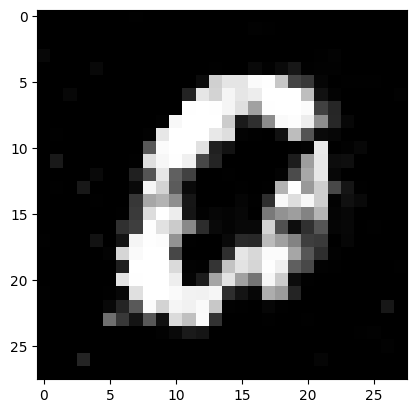

Ploting:  3


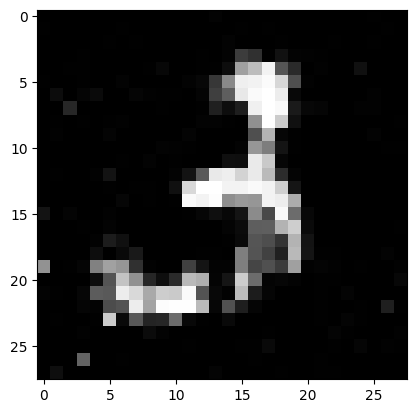

Ploting:  7


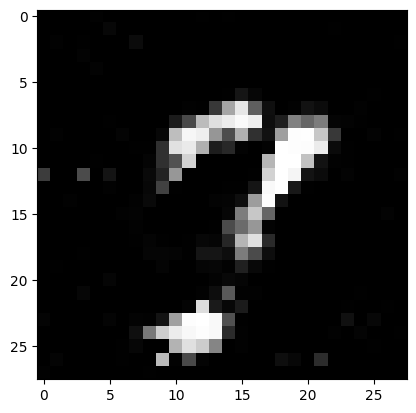

Ploting:  4


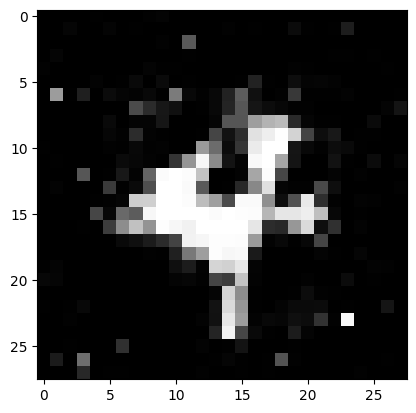

Ploting:  1


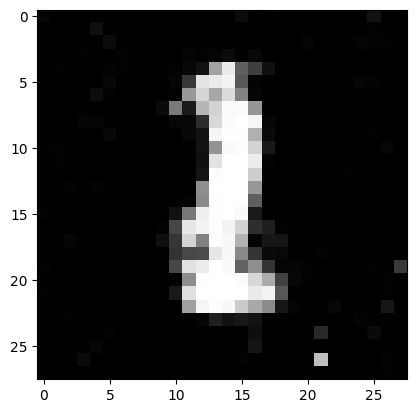

Epoch: 7800
loss_g: 1.999190330505371 	loss_d: 0.9220196008682251
Epoch: 7850
loss_g: 1.757946491241455 	loss_d: 0.890143871307373
Epoch: 7900
loss_g: 2.10710072517395 	loss_d: 0.904343843460083
Epoch: 7950
loss_g: 1.3302720785140991 	loss_d: 0.8904627561569214
Epoch: 8000
loss_g: 1.4437024593353271 	loss_d: 0.7397627234458923
Ploting:  7


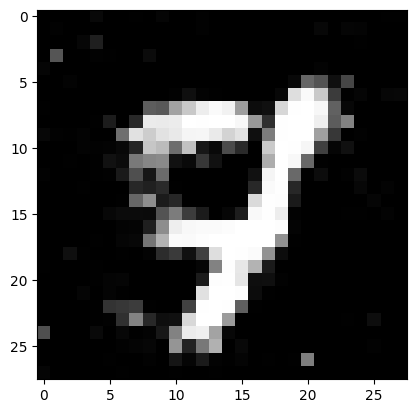

Ploting:  8


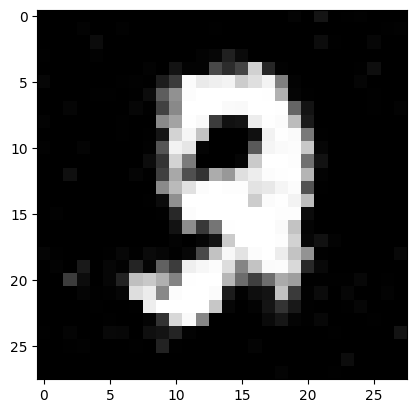

Ploting:  5


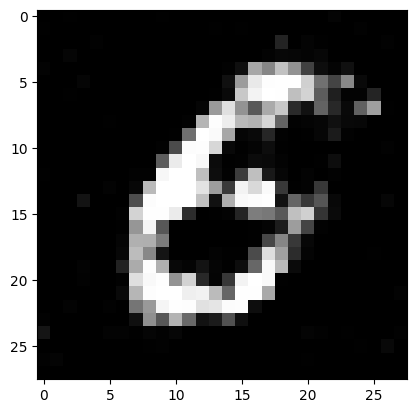

Ploting:  1


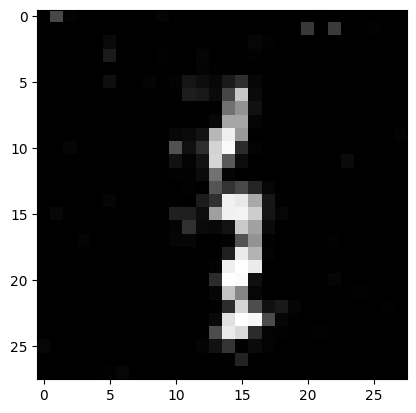

Ploting:  1


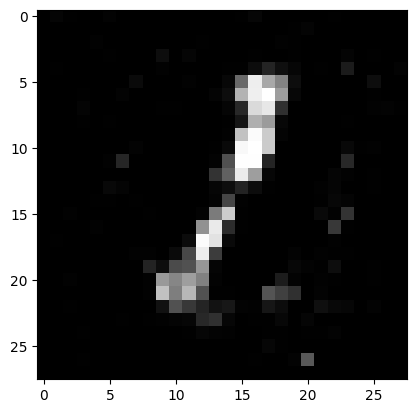

Epoch: 8050
loss_g: 1.3535377979278564 	loss_d: 0.7847778797149658
Epoch: 8100
loss_g: 1.1980572938919067 	loss_d: 0.7817860841751099
Epoch: 8150
loss_g: 1.3853530883789062 	loss_d: 0.7857668995857239
Epoch: 8200
loss_g: 1.4091367721557617 	loss_d: 0.9381062388420105
Epoch: 8250
loss_g: 1.3776427507400513 	loss_d: 0.8354678153991699
Ploting:  7


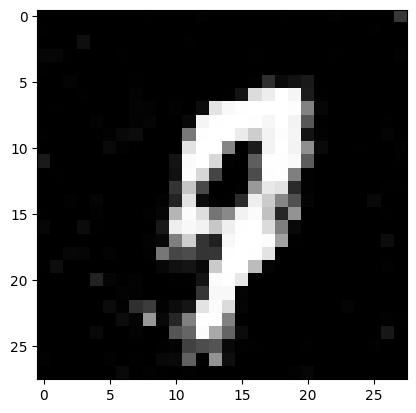

Ploting:  1


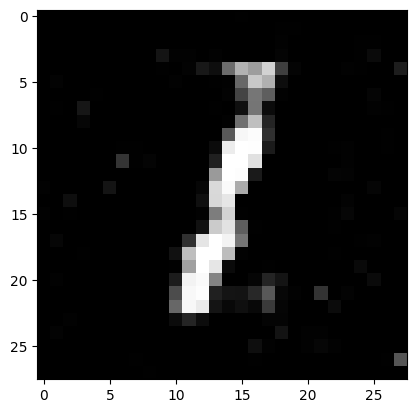

Ploting:  3


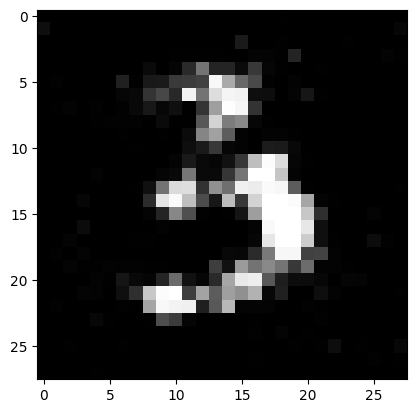

Ploting:  4


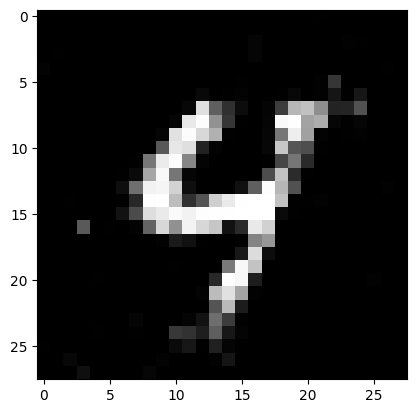

Ploting:  8


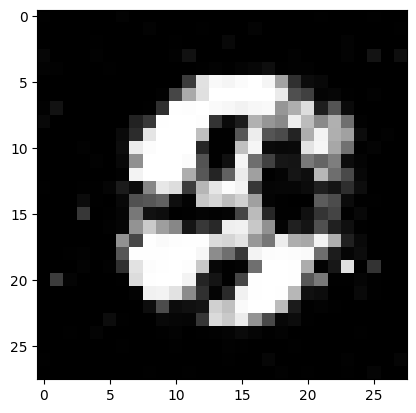

Epoch: 8300
loss_g: 2.0852062702178955 	loss_d: 0.9543613791465759
Epoch: 8350
loss_g: 1.9759830236434937 	loss_d: 0.7161612510681152
Epoch: 8400
loss_g: 1.1902668476104736 	loss_d: 0.937052845954895
Epoch: 8450
loss_g: 1.714082956314087 	loss_d: 0.7791992425918579
Epoch: 8500
loss_g: 1.0752933025360107 	loss_d: 0.8144345879554749
Ploting:  3


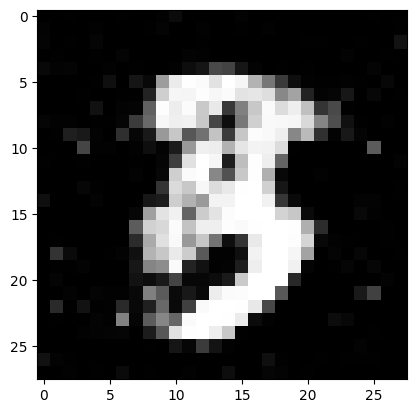

Ploting:  0


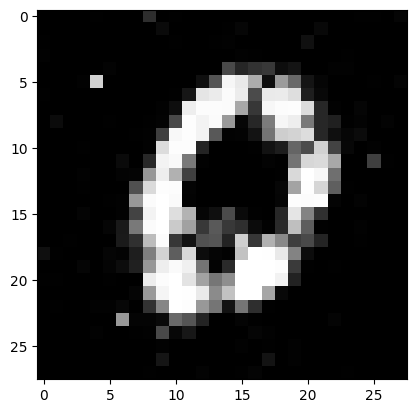

Ploting:  1


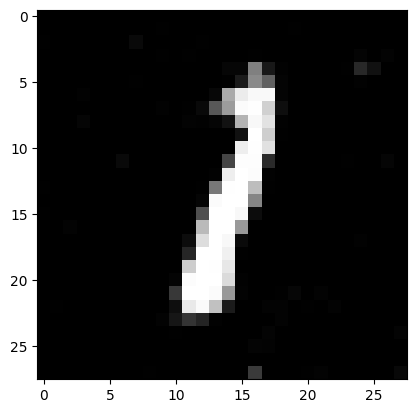

Ploting:  9


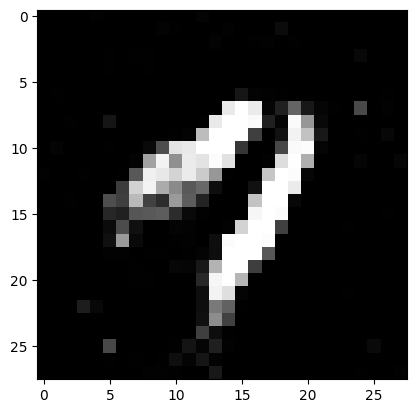

Ploting:  3


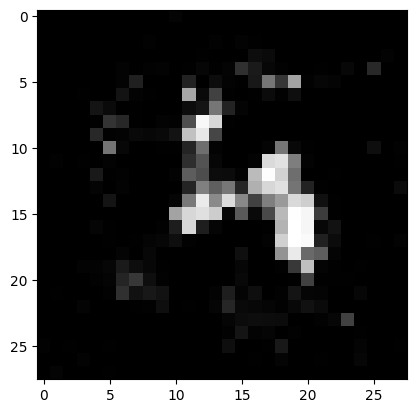

Epoch: 8550
loss_g: 0.7973875999450684 	loss_d: 0.8972859382629395
Epoch: 8600
loss_g: 1.9349117279052734 	loss_d: 0.9939346313476562
Epoch: 8650
loss_g: 1.7007176876068115 	loss_d: 0.745653510093689
Epoch: 8700
loss_g: 1.7246816158294678 	loss_d: 0.7948434352874756
Epoch: 8750
loss_g: 2.254207134246826 	loss_d: 0.9248805046081543
Ploting:  9


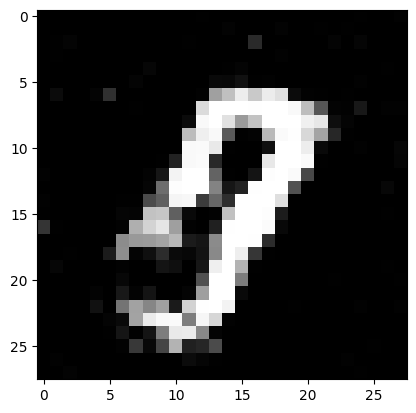

Ploting:  7


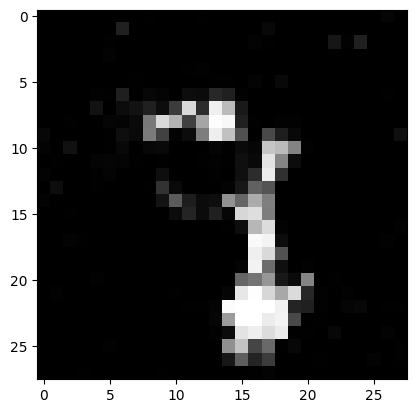

Ploting:  1


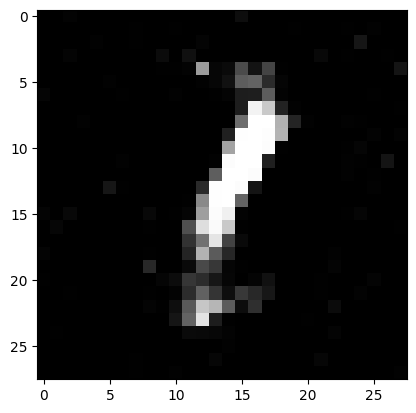

Ploting:  6


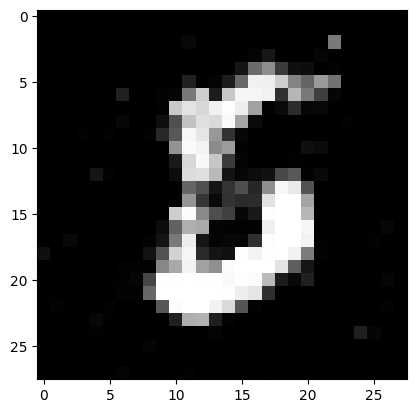

Ploting:  6


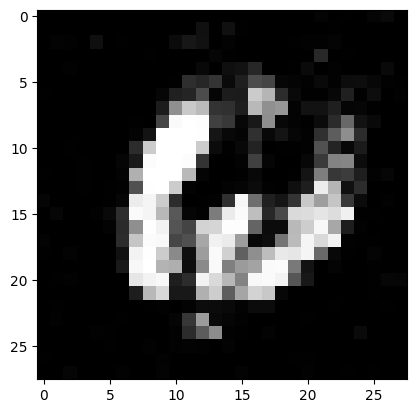

Epoch: 8800
loss_g: 0.8539686799049377 	loss_d: 1.027491569519043
Epoch: 8850
loss_g: 2.3007287979125977 	loss_d: 1.031083345413208
Epoch: 8900
loss_g: 2.146272659301758 	loss_d: 0.9447044134140015
Epoch: 8950
loss_g: 2.0494513511657715 	loss_d: 0.7141631841659546
Epoch: 9000
loss_g: 1.8718540668487549 	loss_d: 0.7949317097663879
Ploting:  6


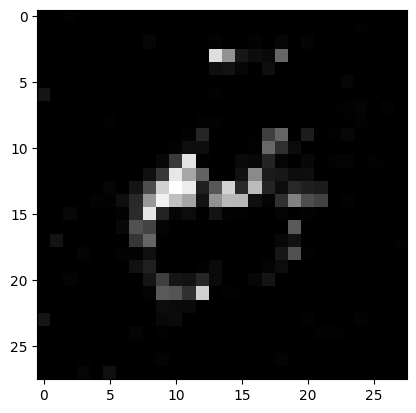

Ploting:  0


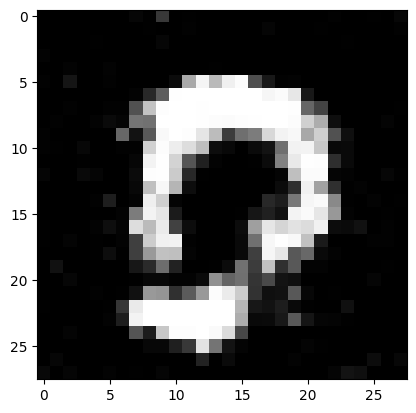

Ploting:  2


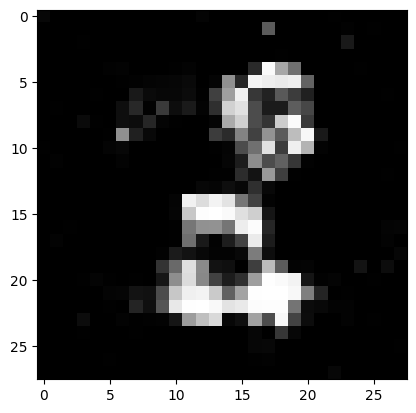

Ploting:  6


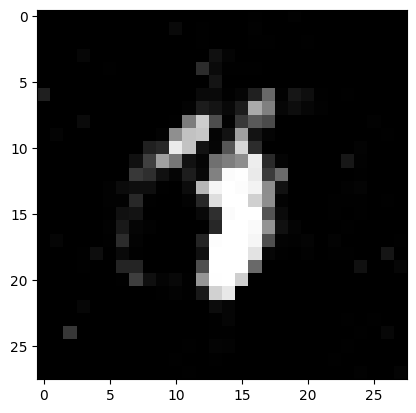

Ploting:  6


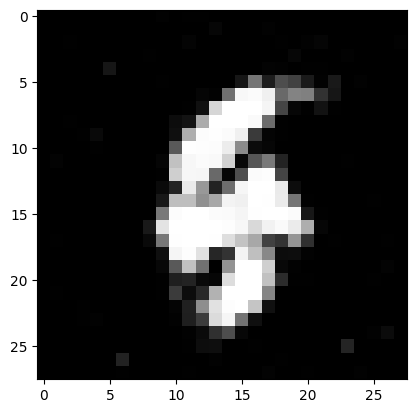

Epoch: 9050
loss_g: 1.629076361656189 	loss_d: 0.7677741050720215
Epoch: 9100
loss_g: 2.0808980464935303 	loss_d: 0.8131558895111084
Epoch: 9150
loss_g: 1.4685416221618652 	loss_d: 0.7223567962646484
Epoch: 9200
loss_g: 1.2707563638687134 	loss_d: 0.9594592452049255
Epoch: 9250
loss_g: 1.6011446714401245 	loss_d: 0.7672786116600037
Ploting:  2


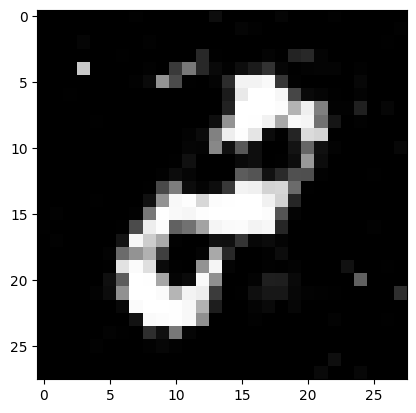

Ploting:  8


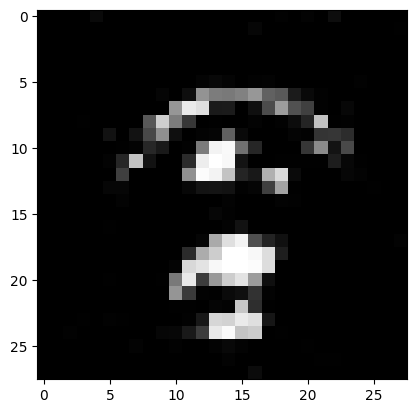

Ploting:  9


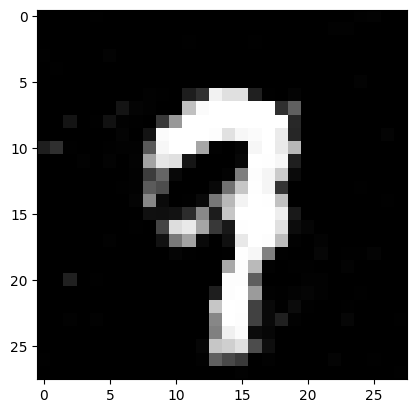

Ploting:  8


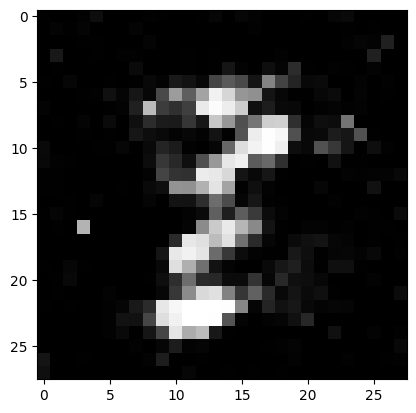

Ploting:  6


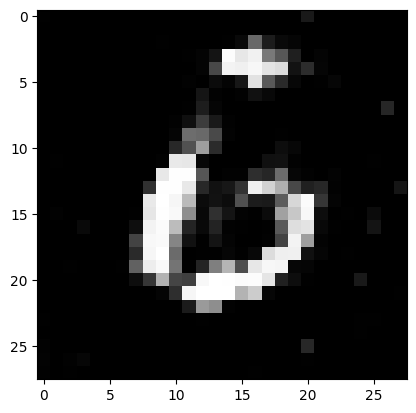

Epoch: 9300
loss_g: 1.3192737102508545 	loss_d: 0.8628436326980591
Epoch: 9350
loss_g: 1.6394362449645996 	loss_d: 0.8078266382217407
Epoch: 9400
loss_g: 1.5903863906860352 	loss_d: 0.8193301558494568
Epoch: 9450
loss_g: 1.406625509262085 	loss_d: 0.8974363803863525
Epoch: 9500
loss_g: 1.3093647956848145 	loss_d: 0.8914507627487183
Ploting:  3


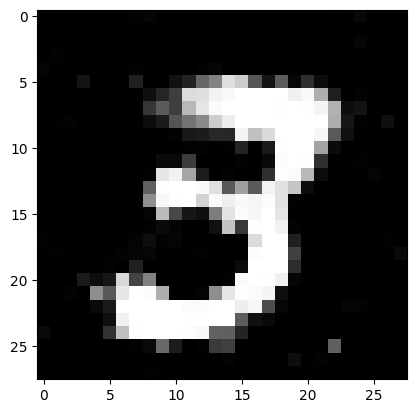

Ploting:  6


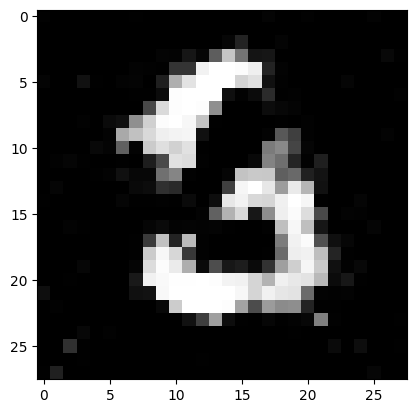

Ploting:  1


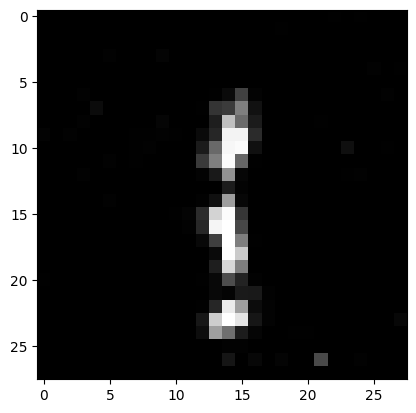

Ploting:  9


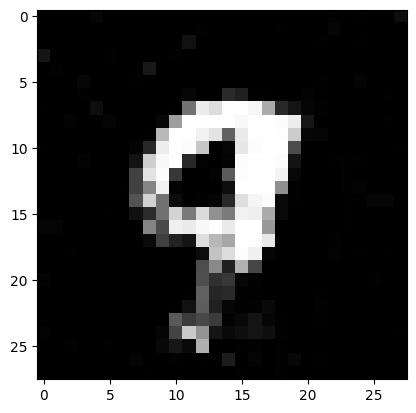

Ploting:  6


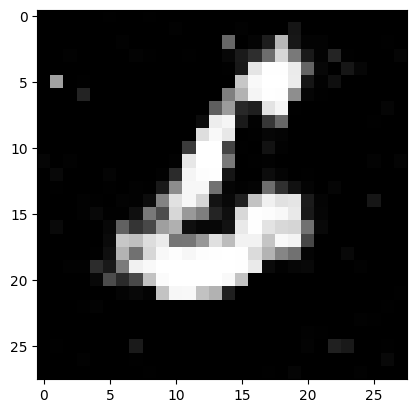

Epoch: 9550
loss_g: 1.4262640476226807 	loss_d: 0.8268052339553833
Epoch: 9600
loss_g: 2.3001816272735596 	loss_d: 0.9585542678833008
Epoch: 9650
loss_g: 1.9100894927978516 	loss_d: 0.8877003788948059
Epoch: 9700
loss_g: 1.4615516662597656 	loss_d: 0.9774045348167419
Epoch: 9750
loss_g: 0.7339858412742615 	loss_d: 1.047440528869629
Ploting:  9


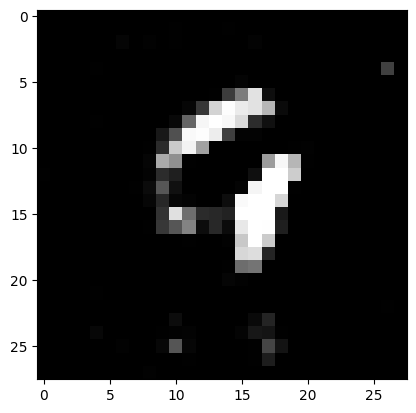

Ploting:  0


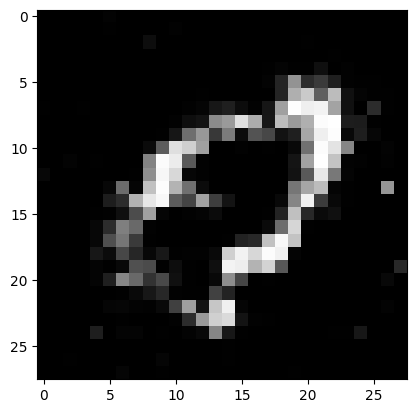

Ploting:  2


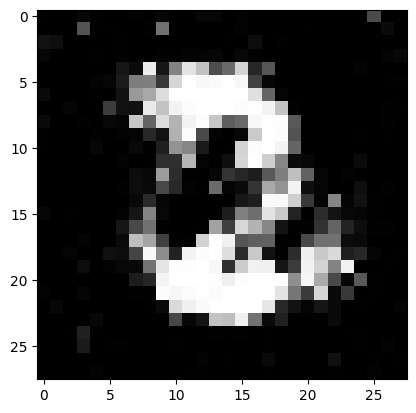

Ploting:  3


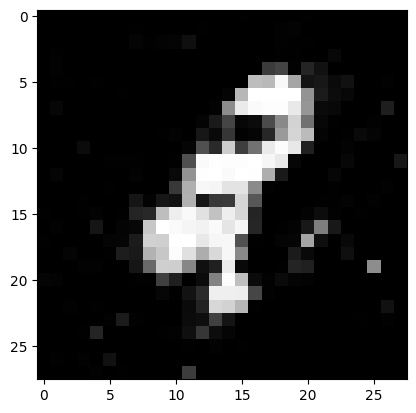

Ploting:  3


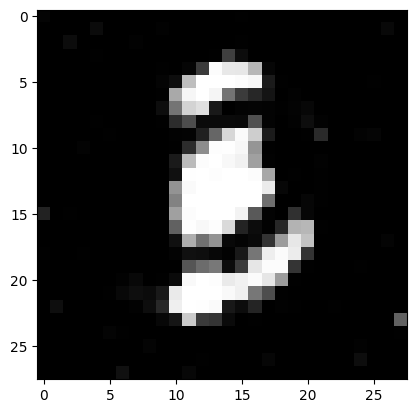

Epoch: 9800
loss_g: 0.9972208738327026 	loss_d: 1.0751901865005493
Epoch: 9850
loss_g: 1.5161763429641724 	loss_d: 0.8219241499900818
Epoch: 9900
loss_g: 1.7493692636489868 	loss_d: 0.7662988901138306
Epoch: 9950
loss_g: 1.6198828220367432 	loss_d: 0.8098663091659546
Epoch: 10000
loss_g: 1.3801628351211548 	loss_d: 1.043823480606079
Ploting:  6


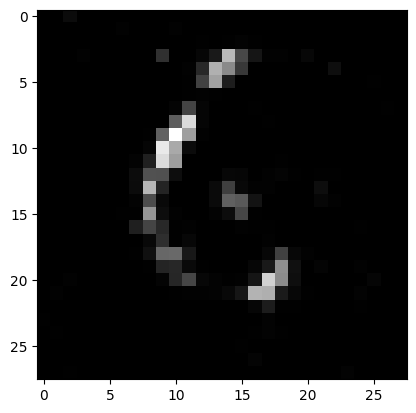

Ploting:  8


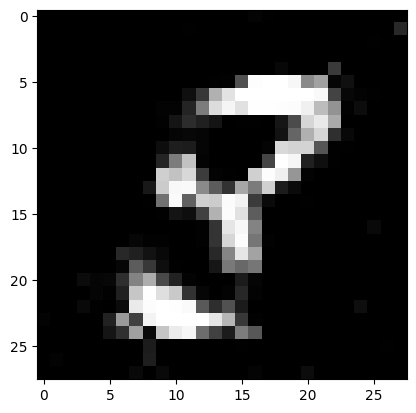

Ploting:  2


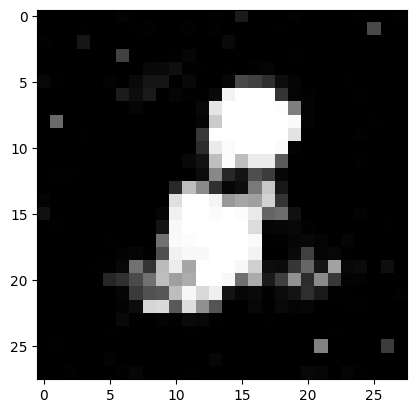

Ploting:  6


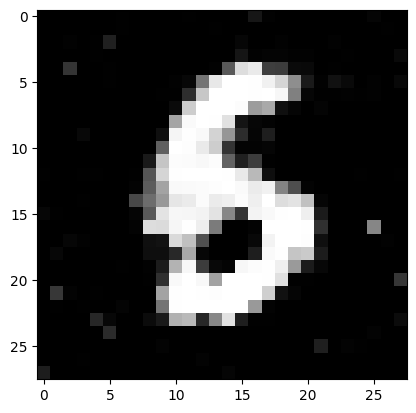

Ploting:  7


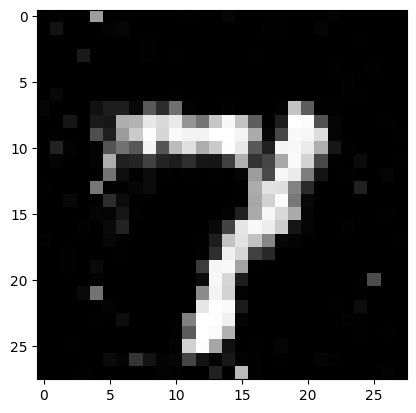

Epoch: 10050
loss_g: 1.1613699197769165 	loss_d: 0.9941724538803101
Epoch: 10100
loss_g: 1.1334896087646484 	loss_d: 0.914935290813446
Epoch: 10150
loss_g: 1.028376817703247 	loss_d: 1.0537257194519043
Epoch: 10200
loss_g: 1.4444797039031982 	loss_d: 1.017268180847168
Epoch: 10250
loss_g: 1.3827059268951416 	loss_d: 0.9566623568534851
Ploting:  4


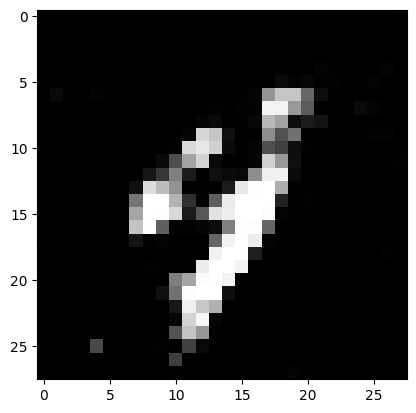

Ploting:  8


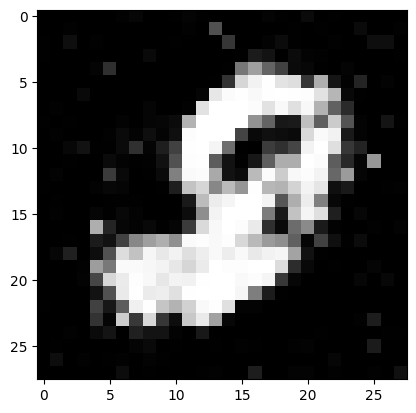

Ploting:  5


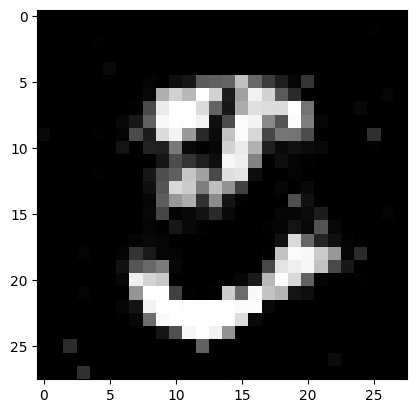

Ploting:  1


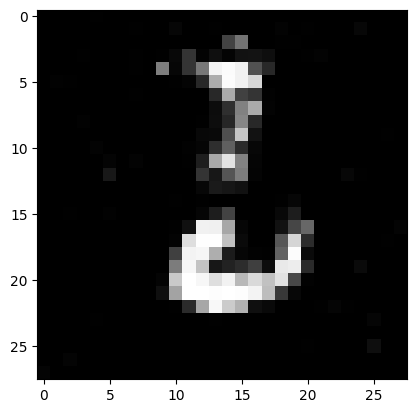

Ploting:  9


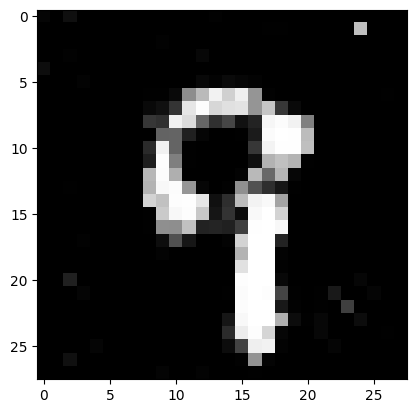

Epoch: 10300
loss_g: 0.8718394041061401 	loss_d: 1.0459920167922974
Epoch: 10350
loss_g: 1.3789323568344116 	loss_d: 0.7840954661369324
Epoch: 10400
loss_g: 1.3755161762237549 	loss_d: 0.8589975237846375
Epoch: 10450
loss_g: 1.24501633644104 	loss_d: 1.0082823038101196
Epoch: 10500
loss_g: 1.5712366104125977 	loss_d: 0.8906373977661133
Ploting:  7


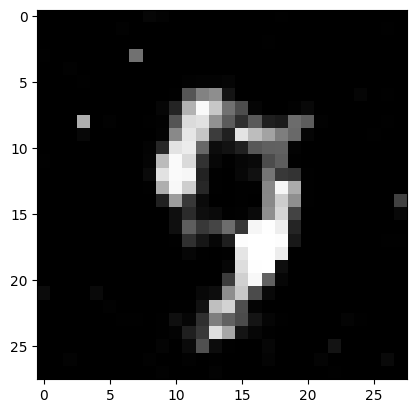

Ploting:  0


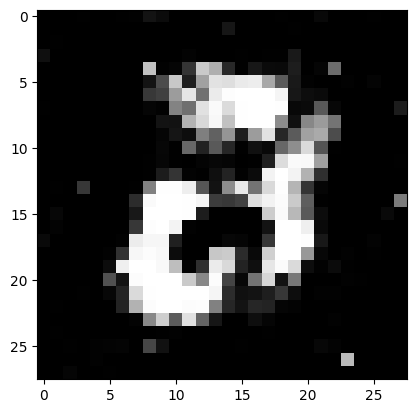

Ploting:  7


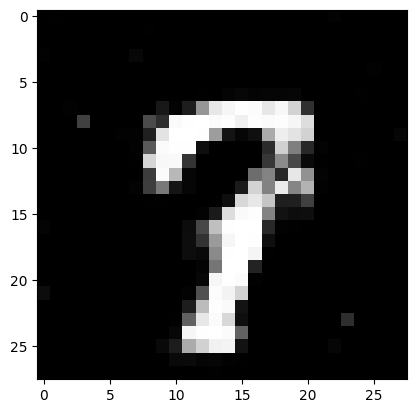

Ploting:  4


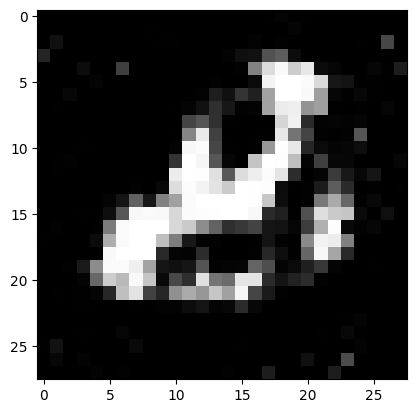

Ploting:  1


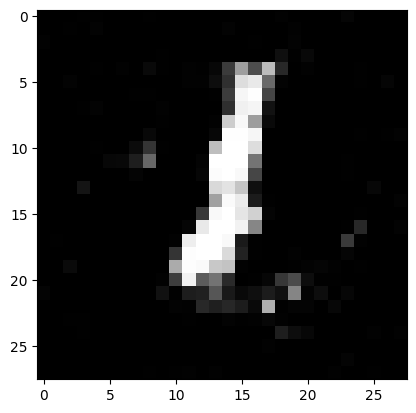

Epoch: 10550
loss_g: 1.3657987117767334 	loss_d: 0.8495311737060547
Epoch: 10600
loss_g: 1.2817275524139404 	loss_d: 0.9236372709274292
Epoch: 10650
loss_g: 1.1428136825561523 	loss_d: 0.8964297771453857
Epoch: 10700
loss_g: 1.7359764575958252 	loss_d: 0.7737487554550171
Epoch: 10750
loss_g: 1.564344882965088 	loss_d: 0.8663829565048218
Ploting:  0


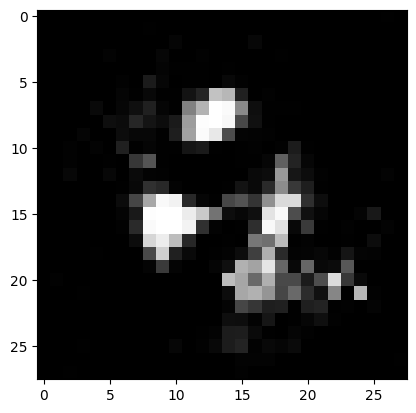

Ploting:  0


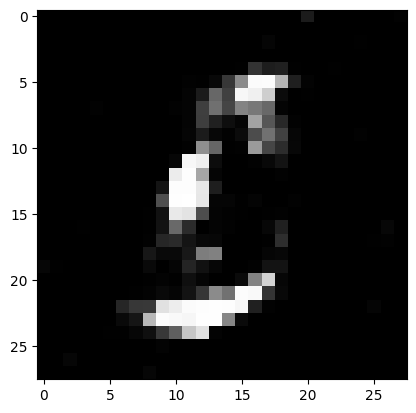

Ploting:  0


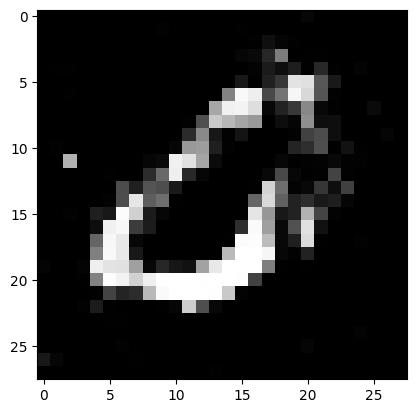

Ploting:  8


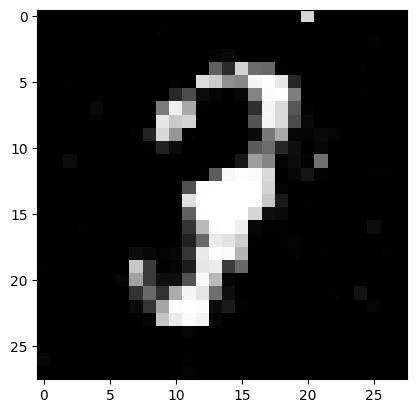

Ploting:  8


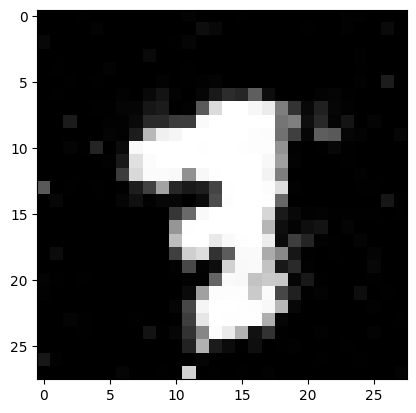

Epoch: 10800
loss_g: 1.5203619003295898 	loss_d: 0.9006670713424683
Epoch: 10850
loss_g: 1.3312602043151855 	loss_d: 0.9147273302078247
Epoch: 10900
loss_g: 1.3531452417373657 	loss_d: 0.9917119145393372
Epoch: 10950
loss_g: 1.5622189044952393 	loss_d: 0.9546986818313599
Epoch: 11000
loss_g: 1.3672268390655518 	loss_d: 0.9181526303291321
Ploting:  1


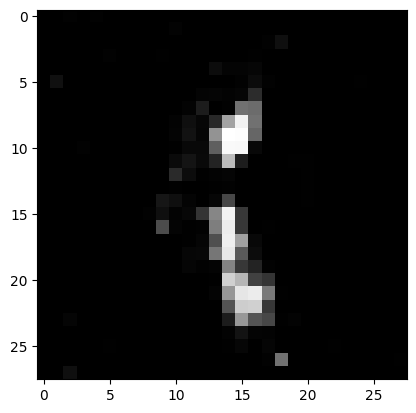

Ploting:  8


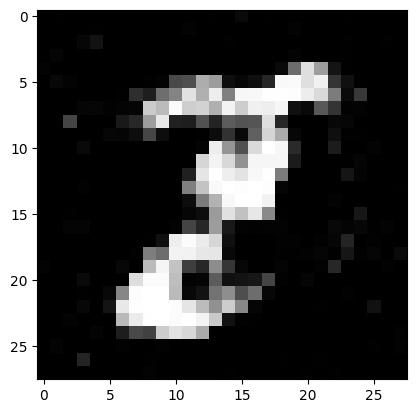

Ploting:  5


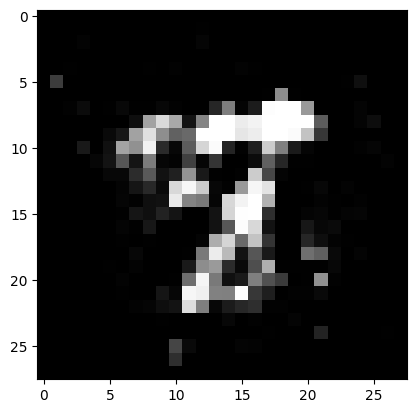

Ploting:  8


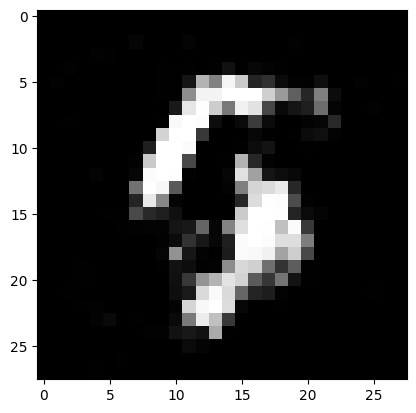

Ploting:  8


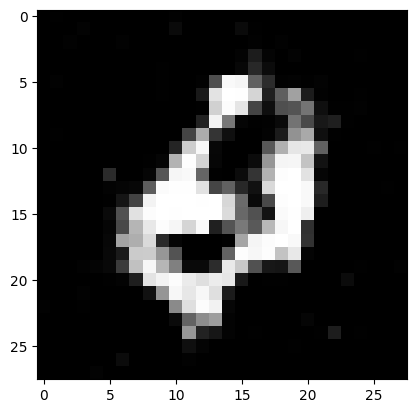

Epoch: 11050
loss_g: 1.319321870803833 	loss_d: 0.9899057745933533
Epoch: 11100
loss_g: 1.3933838605880737 	loss_d: 0.874339759349823
Epoch: 11150
loss_g: 1.4919525384902954 	loss_d: 0.9576877355575562
Epoch: 11200
loss_g: 2.250082492828369 	loss_d: 1.0917221307754517
Epoch: 11250
loss_g: 2.339878559112549 	loss_d: 1.1803689002990723
Ploting:  8


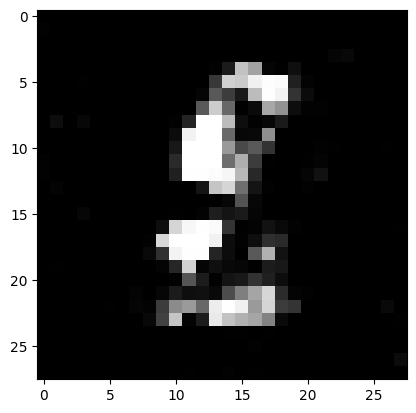

Ploting:  9


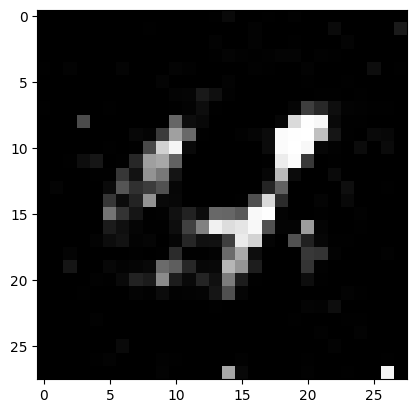

Ploting:  3


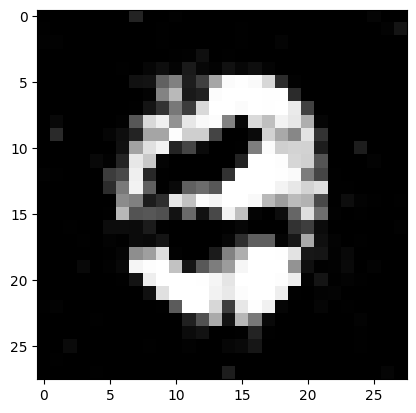

Ploting:  9


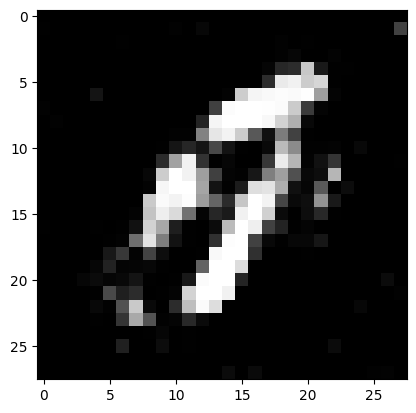

Ploting:  3


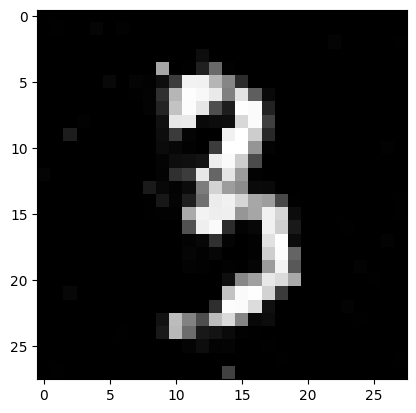

Epoch: 11300
loss_g: 0.7156850099563599 	loss_d: 1.2505548000335693
Epoch: 11350
loss_g: 1.1139150857925415 	loss_d: 0.9081101417541504
Epoch: 11400
loss_g: 1.029003381729126 	loss_d: 1.052272081375122
Epoch: 11450
loss_g: 1.3463101387023926 	loss_d: 0.8906646966934204
Epoch: 11500
loss_g: 1.1857218742370605 	loss_d: 1.033301830291748
Ploting:  1


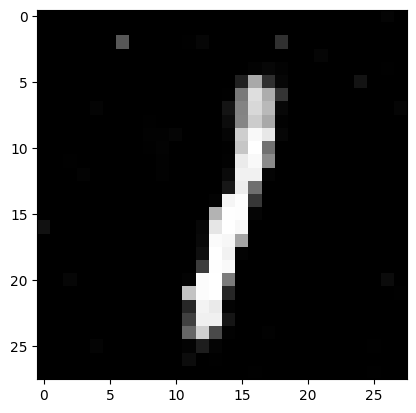

Ploting:  7


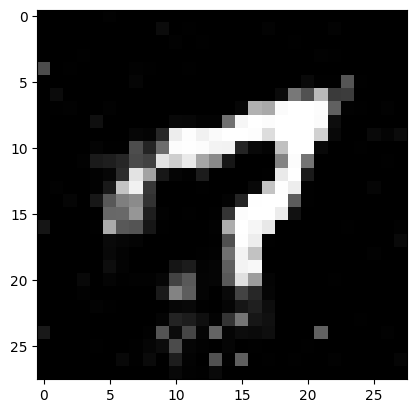

Ploting:  6


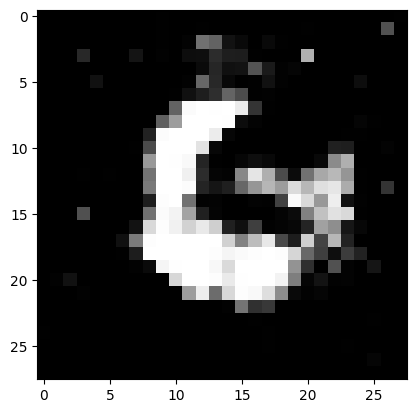

Ploting:  3


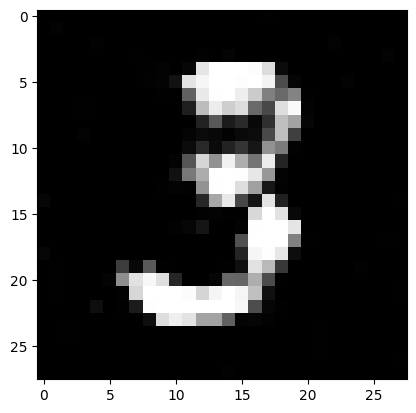

Ploting:  3


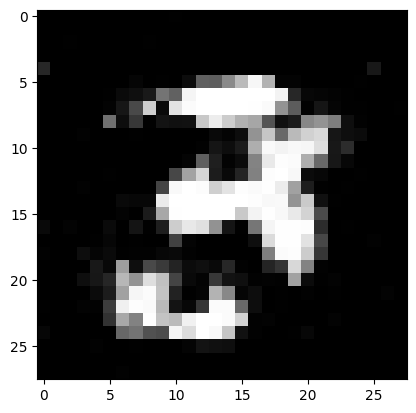

Epoch: 11550
loss_g: 1.2865779399871826 	loss_d: 0.9859644770622253
Epoch: 11600
loss_g: 1.4980608224868774 	loss_d: 0.8980960845947266
Epoch: 11650
loss_g: 1.5697195529937744 	loss_d: 0.8758010268211365
Epoch: 11700
loss_g: 1.5247540473937988 	loss_d: 0.9464263319969177
Epoch: 11750
loss_g: 1.2333800792694092 	loss_d: 0.9744707345962524
Ploting:  0


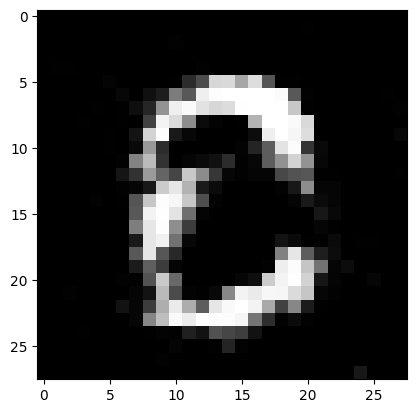

Ploting:  6


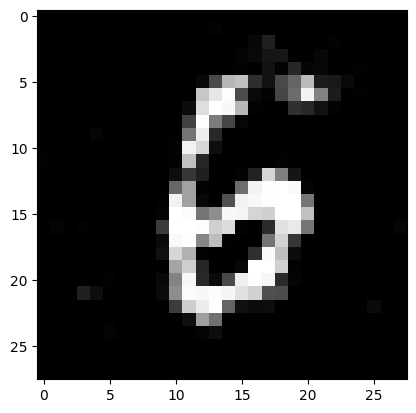

Ploting:  6


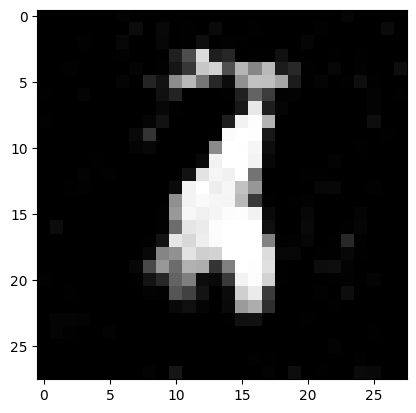

Ploting:  0


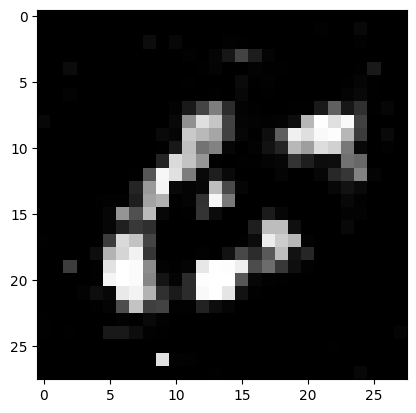

Ploting:  9


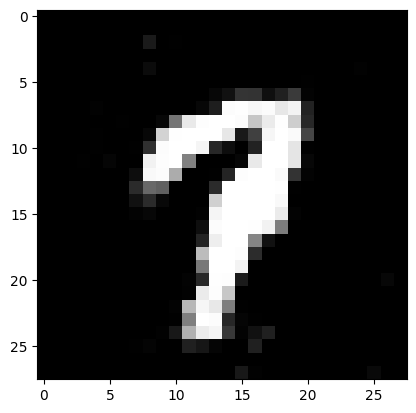

Epoch: 11800
loss_g: 1.2614517211914062 	loss_d: 0.940880537033081
Epoch: 11850
loss_g: 0.7301191091537476 	loss_d: 1.1932297945022583
Epoch: 11900
loss_g: 1.4280012845993042 	loss_d: 0.940010666847229
Epoch: 11950
loss_g: 1.2412548065185547 	loss_d: 1.2728544473648071
Epoch: 12000
loss_g: 1.4725896120071411 	loss_d: 0.7982164621353149
Ploting:  3


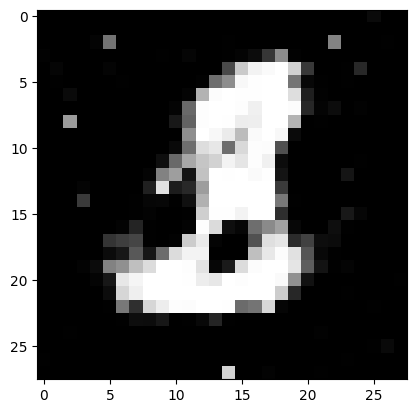

Ploting:  4


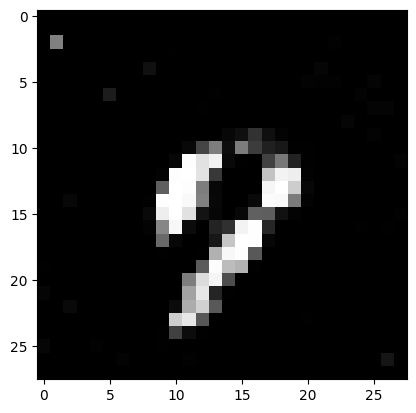

Ploting:  7


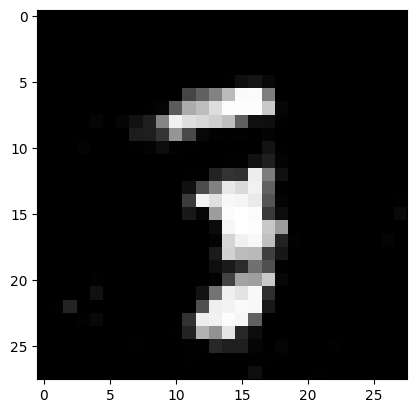

Ploting:  9


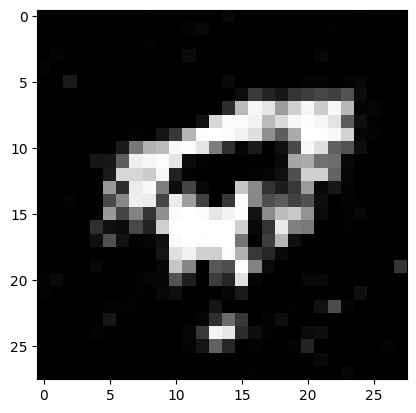

Ploting:  0


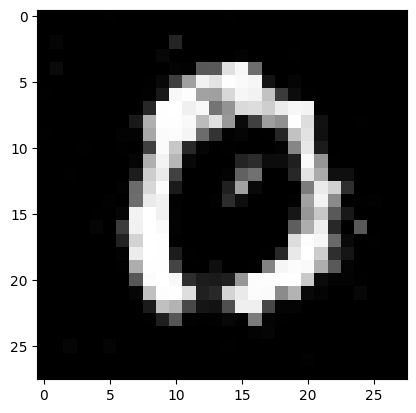

Epoch: 12050
loss_g: 1.5817506313323975 	loss_d: 1.0961802005767822
Epoch: 12100
loss_g: 1.2384750843048096 	loss_d: 0.9200520515441895
Epoch: 12150
loss_g: 1.2620849609375 	loss_d: 1.1145069599151611
Epoch: 12200
loss_g: 1.227308750152588 	loss_d: 1.0700018405914307
Epoch: 12250
loss_g: 1.2928632497787476 	loss_d: 0.8748948574066162
Ploting:  4


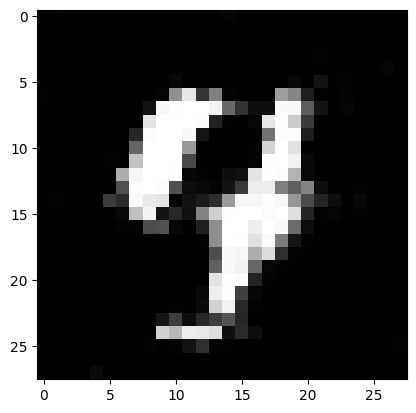

Ploting:  2


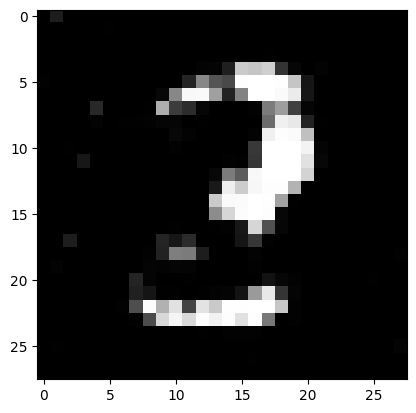

Ploting:  3


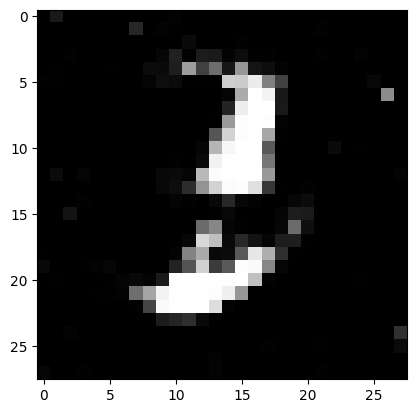

Ploting:  0


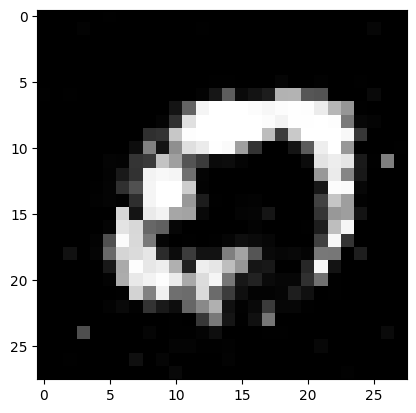

Ploting:  6


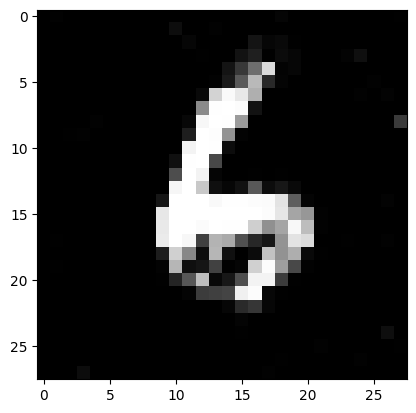

Epoch: 12300
loss_g: 0.7220039963722229 	loss_d: 1.0114599466323853
Epoch: 12350
loss_g: 2.0094552040100098 	loss_d: 1.2742432355880737
Epoch: 12400
loss_g: 1.4091033935546875 	loss_d: 1.0398590564727783
Epoch: 12450
loss_g: 1.4095242023468018 	loss_d: 0.9600470662117004
Epoch: 12500
loss_g: 1.2473869323730469 	loss_d: 0.9934717416763306
Ploting:  0


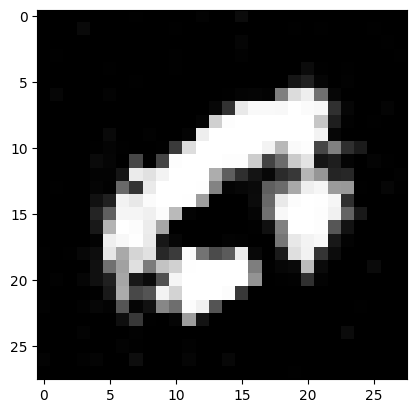

Ploting:  2


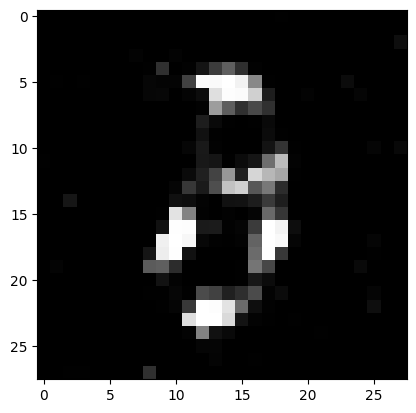

Ploting:  8


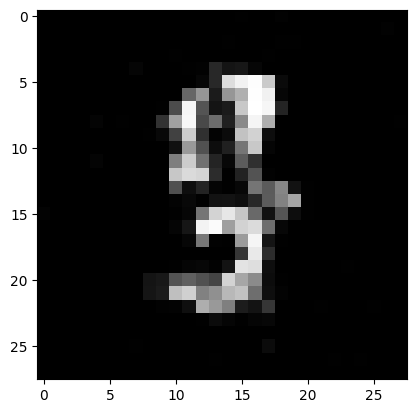

Ploting:  2


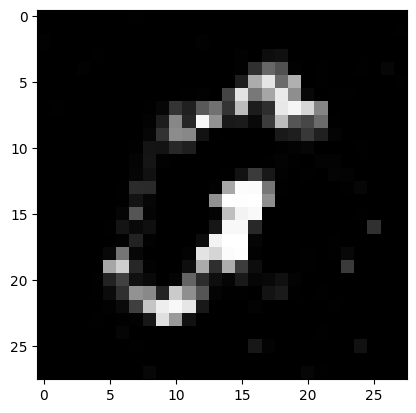

Ploting:  8


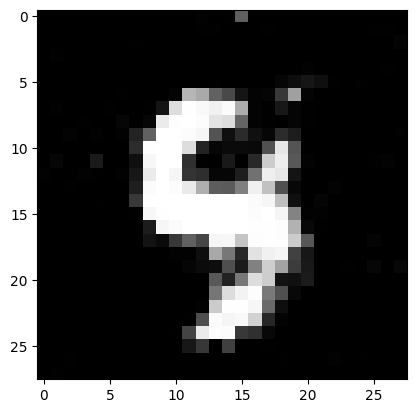

Epoch: 12550
loss_g: 1.2786011695861816 	loss_d: 0.9624453783035278
Epoch: 12600
loss_g: 1.1687167882919312 	loss_d: 0.9014606475830078
Epoch: 12650
loss_g: 0.9934466481208801 	loss_d: 0.9966550469398499
Epoch: 12700
loss_g: 1.2051348686218262 	loss_d: 1.0130623579025269
Epoch: 12750
loss_g: 1.1820790767669678 	loss_d: 1.1087470054626465
Ploting:  9


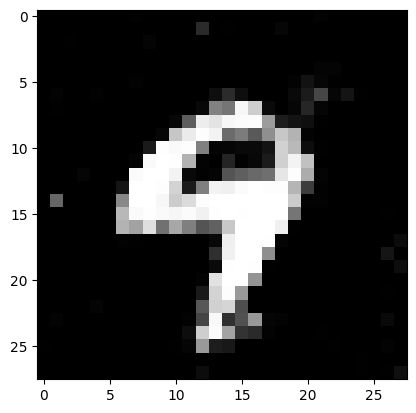

Ploting:  0


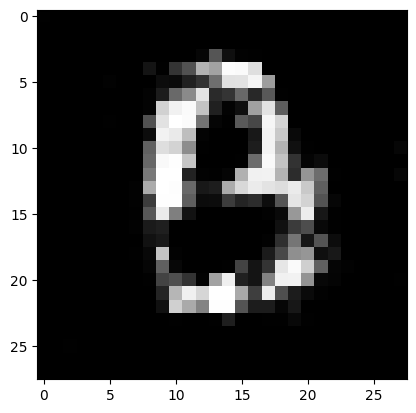

Ploting:  0


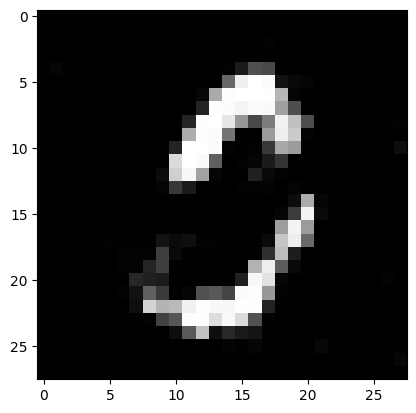

Ploting:  2


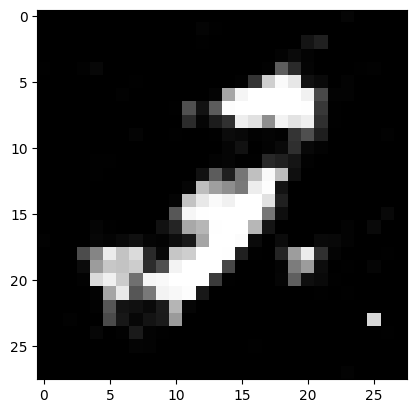

Ploting:  5


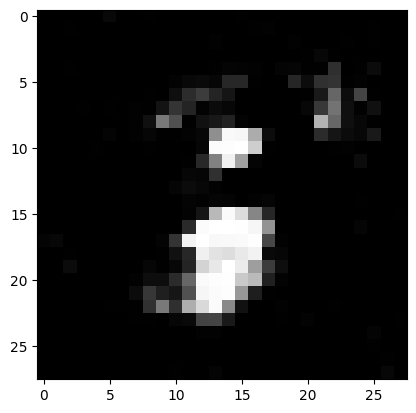

Epoch: 12800
loss_g: 1.4861457347869873 	loss_d: 1.0078561305999756
Epoch: 12850
loss_g: 0.963579535484314 	loss_d: 1.0170246362686157
Epoch: 12900
loss_g: 1.0667541027069092 	loss_d: 1.0693385601043701
Epoch: 12950
loss_g: 1.1046979427337646 	loss_d: 0.9072589874267578
Epoch: 13000
loss_g: 0.9796551465988159 	loss_d: 1.0446146726608276
Ploting:  1


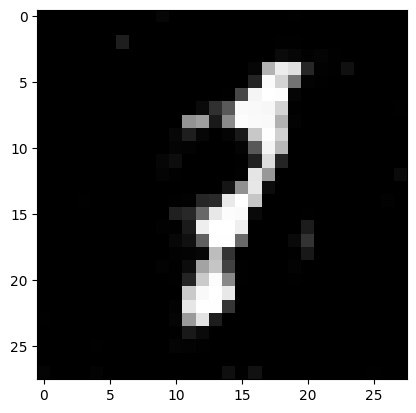

Ploting:  3


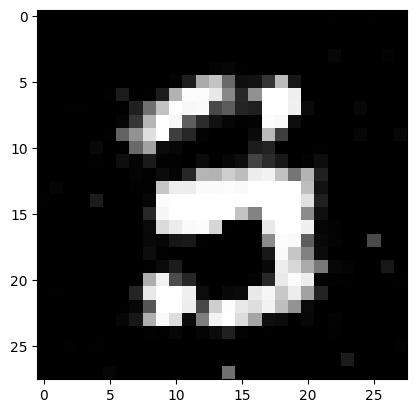

Ploting:  0


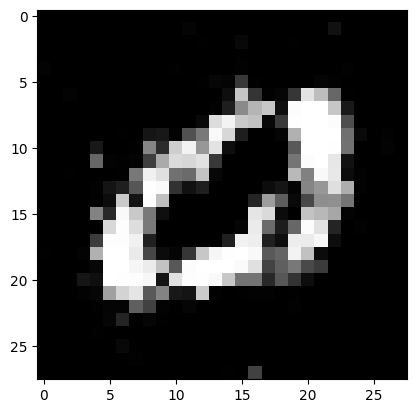

Ploting:  1


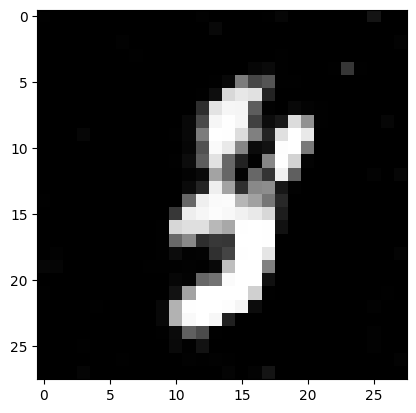

Ploting:  1


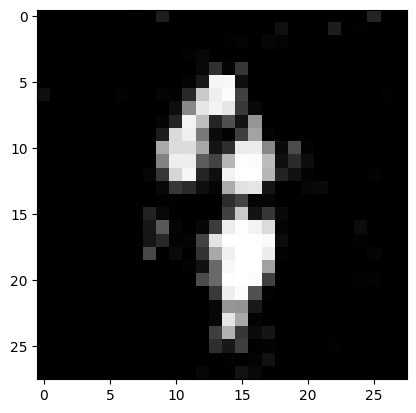

Epoch: 13050
loss_g: 1.6027581691741943 	loss_d: 1.0591216087341309
Epoch: 13100
loss_g: 1.6907488107681274 	loss_d: 0.9497977495193481
Epoch: 13150
loss_g: 1.3317058086395264 	loss_d: 0.9810811877250671
Epoch: 13200
loss_g: 1.0979925394058228 	loss_d: 0.9500346183776855
Epoch: 13250
loss_g: 1.6117701530456543 	loss_d: 0.9038165211677551
Ploting:  3


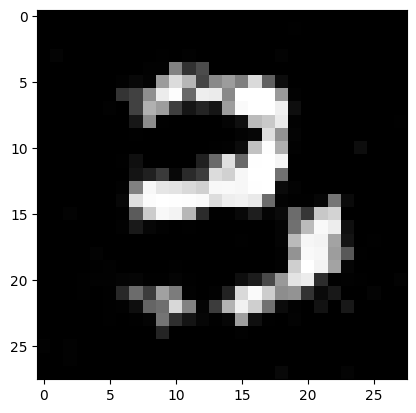

Ploting:  8


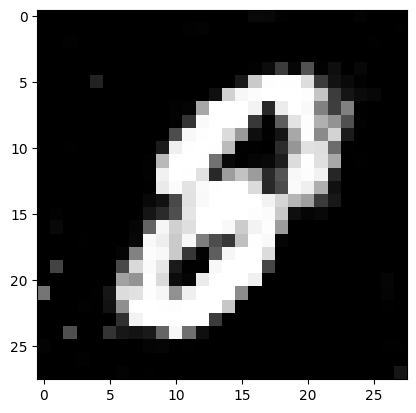

Ploting:  1


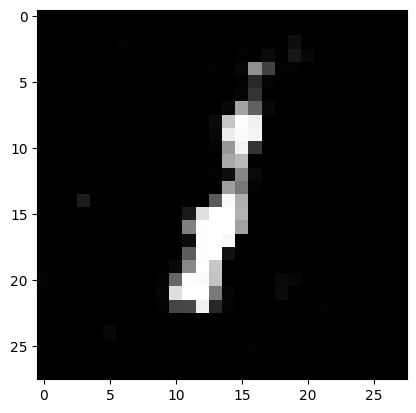

Ploting:  8


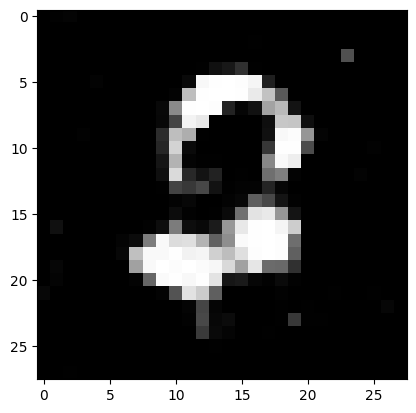

Ploting:  7


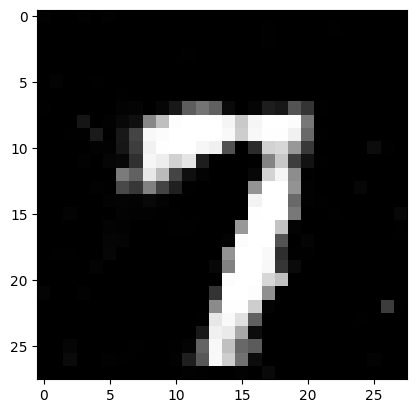

Epoch: 13300
loss_g: 1.163574457168579 	loss_d: 0.8923355340957642
Epoch: 13350
loss_g: 1.1377863883972168 	loss_d: 1.0995440483093262
Epoch: 13400
loss_g: 1.2540194988250732 	loss_d: 0.938831627368927
Epoch: 13450
loss_g: 1.1404266357421875 	loss_d: 0.9006331562995911
Epoch: 13500
loss_g: 1.4430241584777832 	loss_d: 0.9425888657569885
Ploting:  8


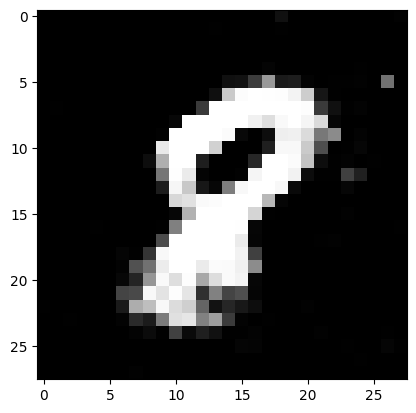

Ploting:  3


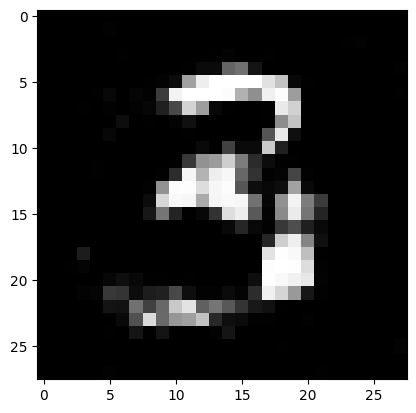

Ploting:  9


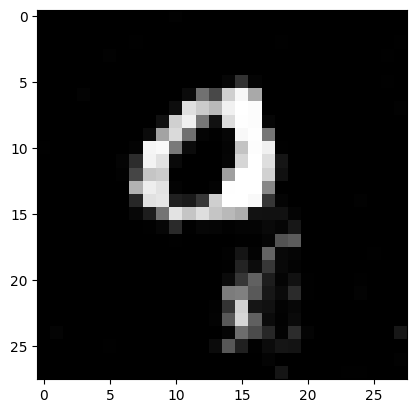

Ploting:  6


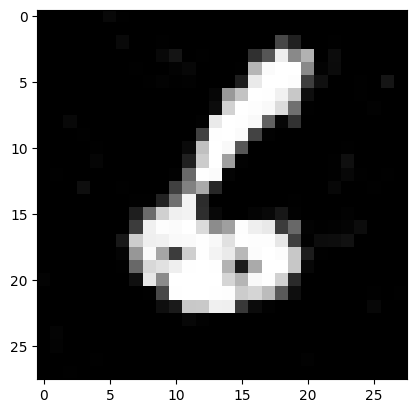

Ploting:  7


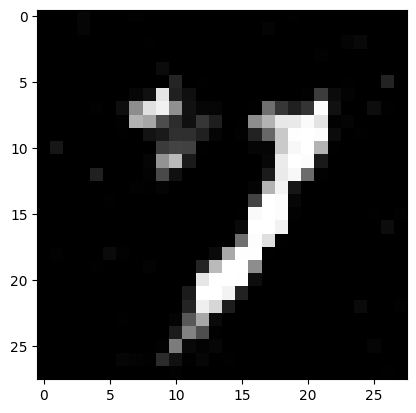

Epoch: 13550
loss_g: 1.0909805297851562 	loss_d: 1.0745501518249512
Epoch: 13600
loss_g: 1.4749062061309814 	loss_d: 0.9474860429763794
Epoch: 13650
loss_g: 1.1178252696990967 	loss_d: 0.9019984602928162
Epoch: 13700
loss_g: 0.7528989315032959 	loss_d: 1.2907840013504028
Epoch: 13750
loss_g: 1.226025938987732 	loss_d: 0.9859839677810669
Ploting:  8


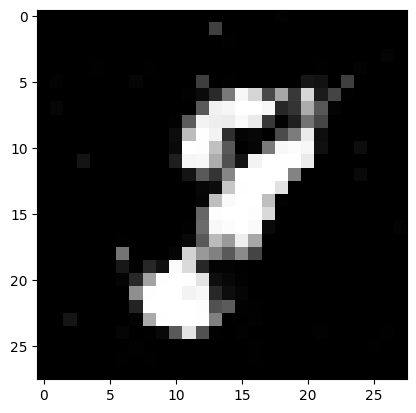

Ploting:  0


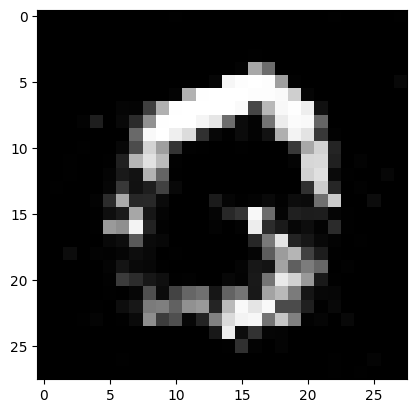

Ploting:  6


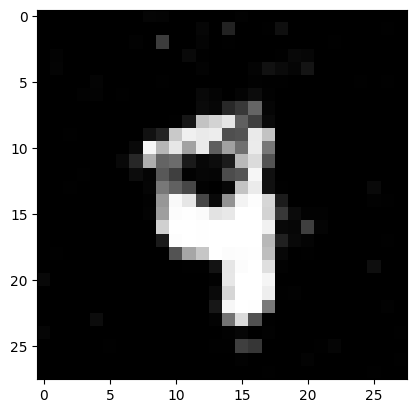

Ploting:  0


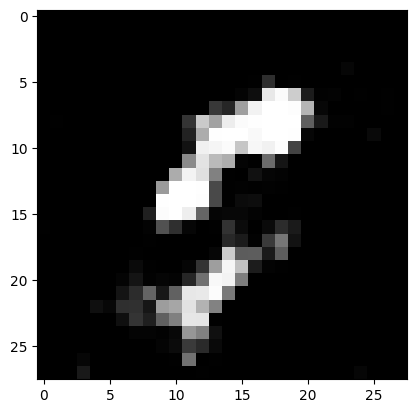

Ploting:  6


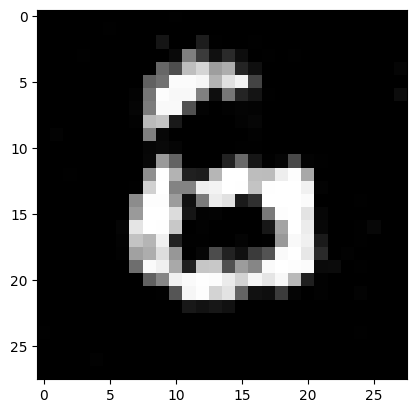

Epoch: 13800
loss_g: 1.0651835203170776 	loss_d: 1.0581555366516113
Epoch: 13850
loss_g: 1.670116662979126 	loss_d: 1.0100481510162354
Epoch: 13900
loss_g: 1.0759752988815308 	loss_d: 1.0927188396453857
Epoch: 13950
loss_g: 1.3301078081130981 	loss_d: 1.1291218996047974
Epoch: 14000
loss_g: 0.8824975490570068 	loss_d: 1.087606430053711
Ploting:  7


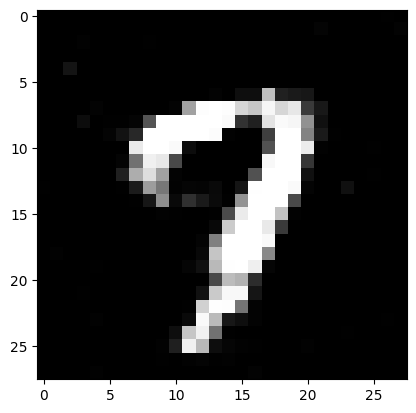

Ploting:  1


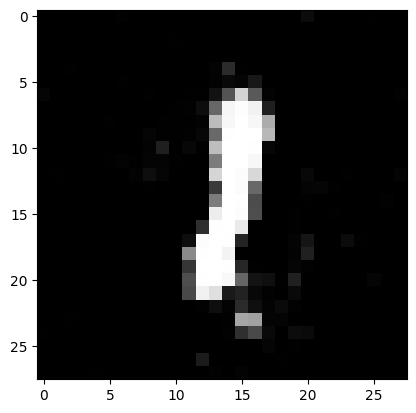

Ploting:  3


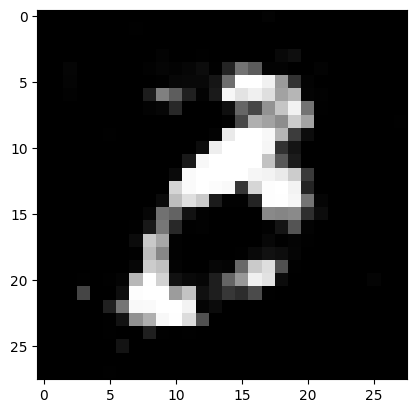

Ploting:  5


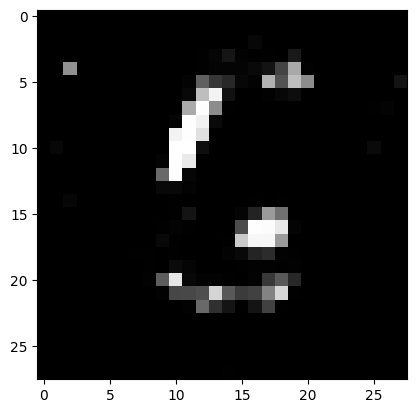

Ploting:  5


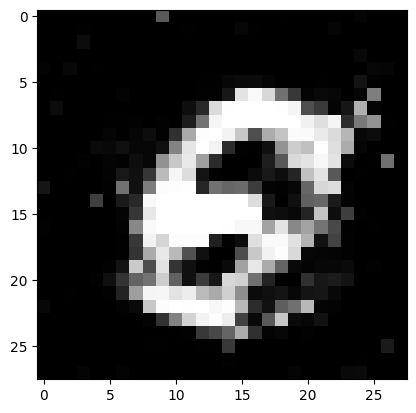

Epoch: 14050
loss_g: 1.2188297510147095 	loss_d: 0.8802779912948608
Epoch: 14100
loss_g: 1.8047082424163818 	loss_d: 1.2022024393081665
Epoch: 14150
loss_g: 1.35795259475708 	loss_d: 1.0652673244476318
Epoch: 14200
loss_g: 0.8406380414962769 	loss_d: 1.217498540878296
Epoch: 14250
loss_g: 1.5346812009811401 	loss_d: 0.9401842355728149
Ploting:  0


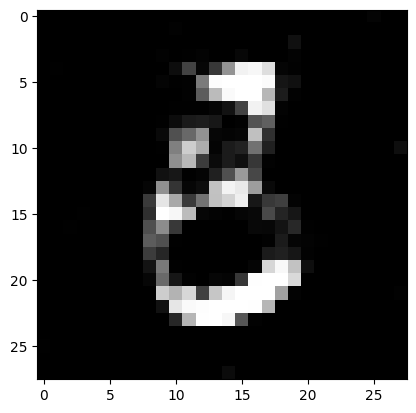

Ploting:  0


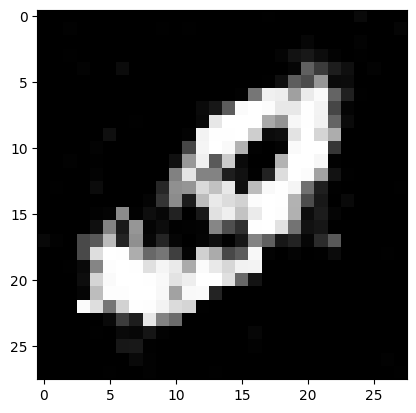

Ploting:  0


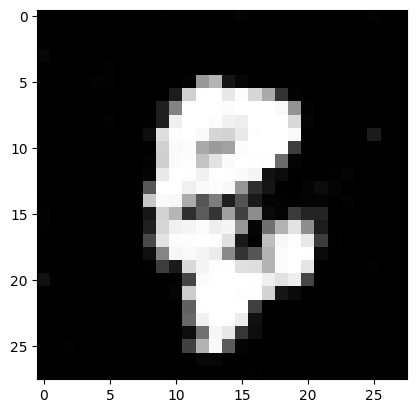

Ploting:  5


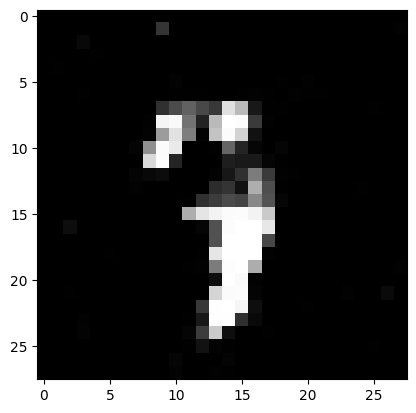

Ploting:  0


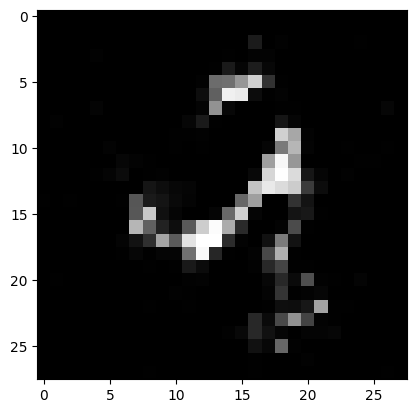

Epoch: 14300
loss_g: 1.212573528289795 	loss_d: 0.9137014150619507
Epoch: 14350
loss_g: 1.4445576667785645 	loss_d: 0.9887027740478516
Epoch: 14400
loss_g: 1.0491224527359009 	loss_d: 1.0704691410064697
Epoch: 14450
loss_g: 1.4360783100128174 	loss_d: 1.061889410018921
Epoch: 14500
loss_g: 1.4056792259216309 	loss_d: 0.991531252861023
Ploting:  4


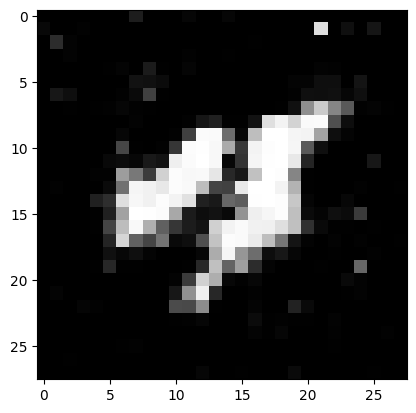

Ploting:  8


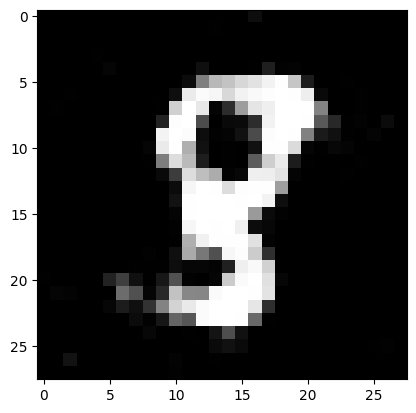

Ploting:  1


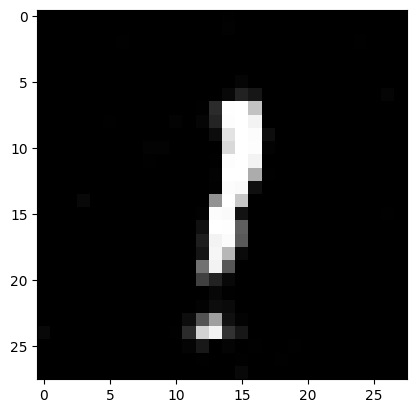

Ploting:  0


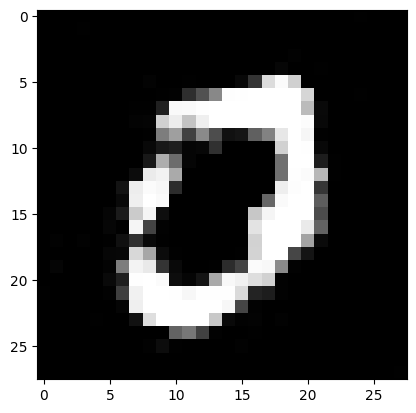

Ploting:  6


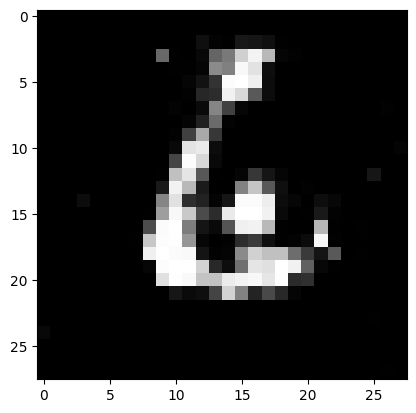

Epoch: 14550
loss_g: 1.0378215312957764 	loss_d: 1.0955557823181152
Epoch: 14600
loss_g: 1.3360575437545776 	loss_d: 1.0967724323272705
Epoch: 14650
loss_g: 1.2425763607025146 	loss_d: 1.0312328338623047
Epoch: 14700
loss_g: 0.8330968618392944 	loss_d: 1.0989640951156616
Epoch: 14750
loss_g: 0.9157567024230957 	loss_d: 0.9922574758529663
Ploting:  0


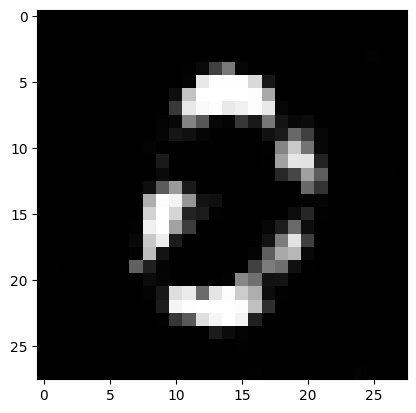

Ploting:  5


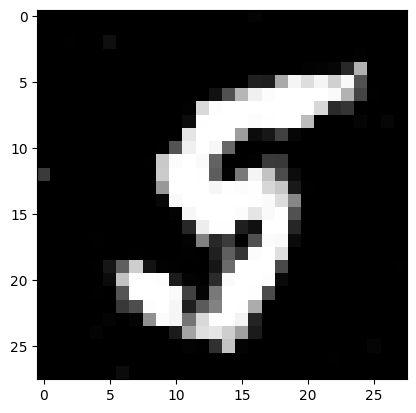

Ploting:  7


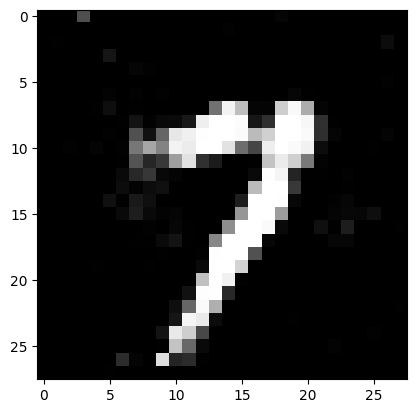

Ploting:  3


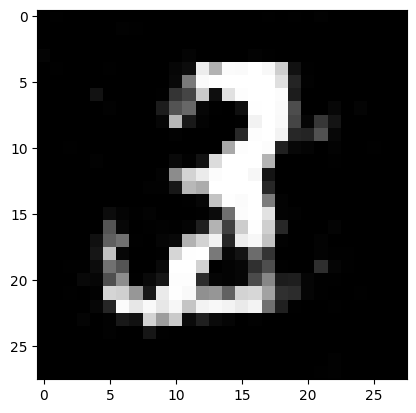

Ploting:  6


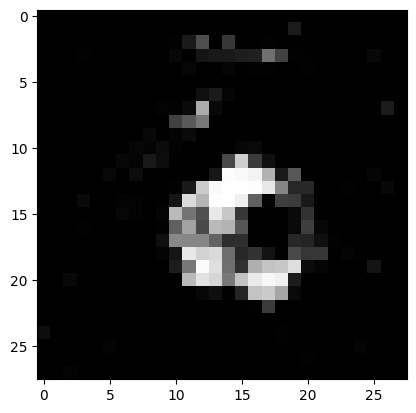

Epoch: 14800
loss_g: 1.6376773118972778 	loss_d: 0.9483739733695984
Epoch: 14850
loss_g: 0.9678003191947937 	loss_d: 0.9770976901054382
Epoch: 14900
loss_g: 1.280196189880371 	loss_d: 1.1942968368530273
Epoch: 14950
loss_g: 1.168698787689209 	loss_d: 0.9468148350715637
Epoch: 15000
loss_g: 1.1248953342437744 	loss_d: 0.9706344604492188
Ploting:  3


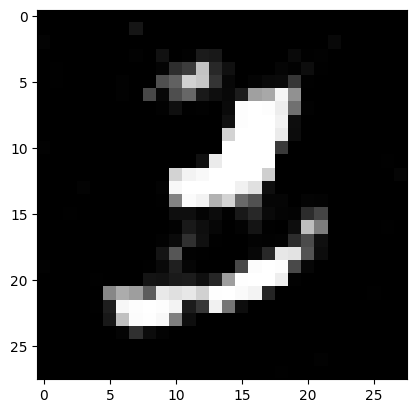

Ploting:  8


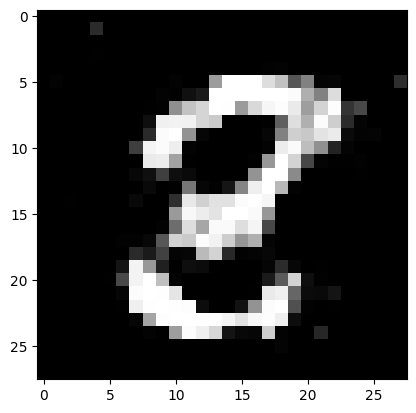

Ploting:  1


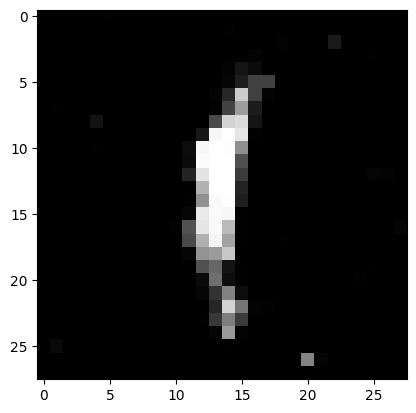

Ploting:  7


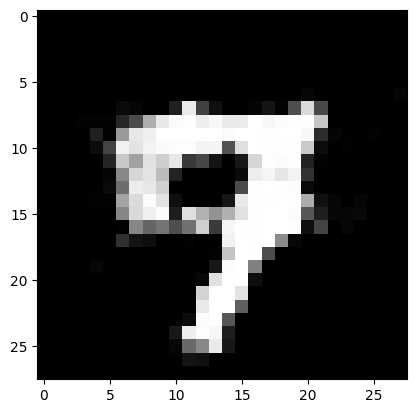

Ploting:  6


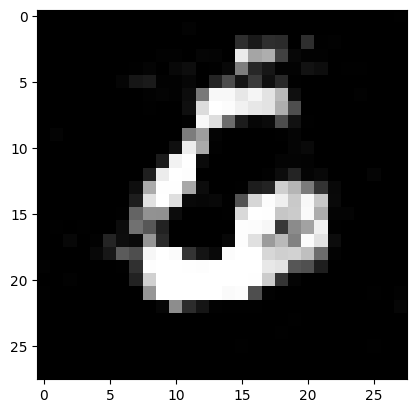

Epoch: 15050
loss_g: 1.2046695947647095 	loss_d: 1.121738076210022
Epoch: 15100
loss_g: 1.0011515617370605 	loss_d: 0.7963395714759827
Epoch: 15150
loss_g: 0.913475751876831 	loss_d: 1.2528342008590698
Epoch: 15200
loss_g: 1.1188459396362305 	loss_d: 0.9870801568031311
Epoch: 15250
loss_g: 1.133817195892334 	loss_d: 1.049344778060913
Ploting:  8


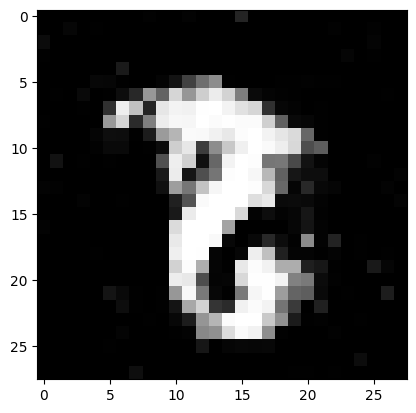

Ploting:  9


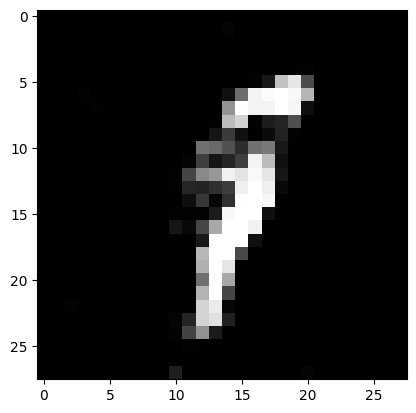

Ploting:  5


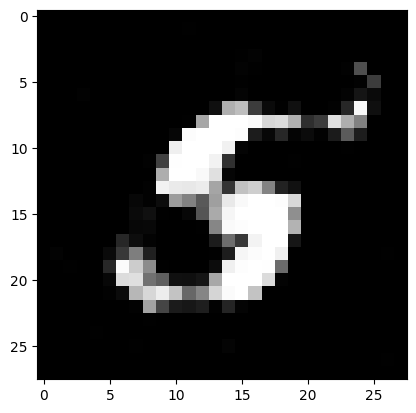

Ploting:  0


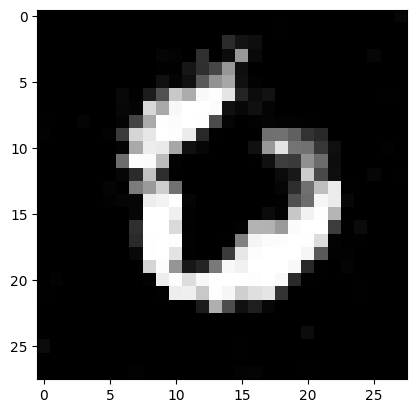

Ploting:  3


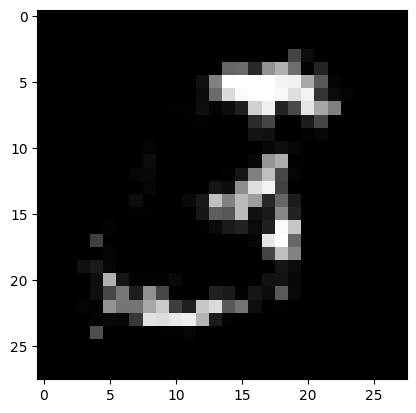

Epoch: 15300
loss_g: 1.9358004331588745 	loss_d: 1.1406548023223877
Epoch: 15350
loss_g: 1.1889255046844482 	loss_d: 1.0378782749176025
Epoch: 15400
loss_g: 1.1454651355743408 	loss_d: 0.9329198598861694
Epoch: 15450
loss_g: 0.9477556943893433 	loss_d: 1.227487564086914
Epoch: 15500
loss_g: 0.9793283939361572 	loss_d: 0.9463987350463867
Ploting:  6


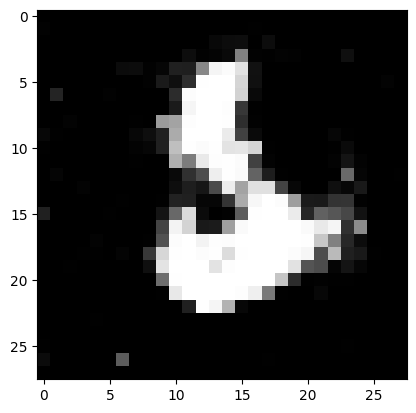

Ploting:  9


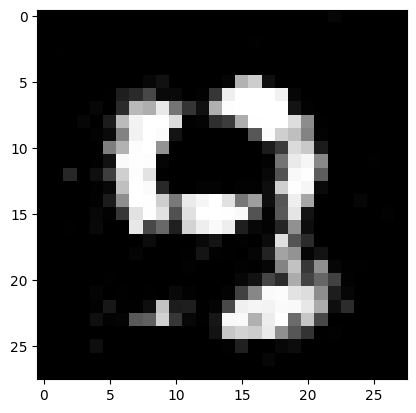

Ploting:  9


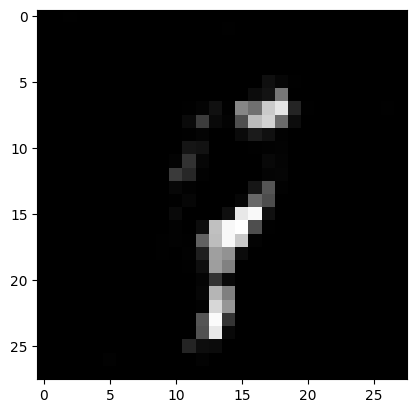

Ploting:  9


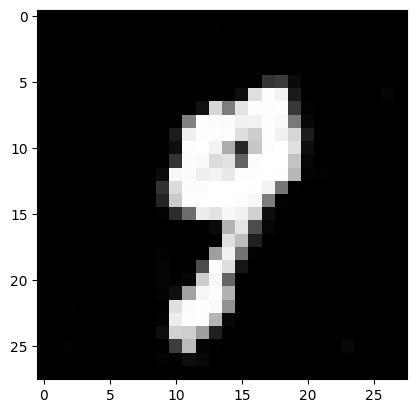

Ploting:  5


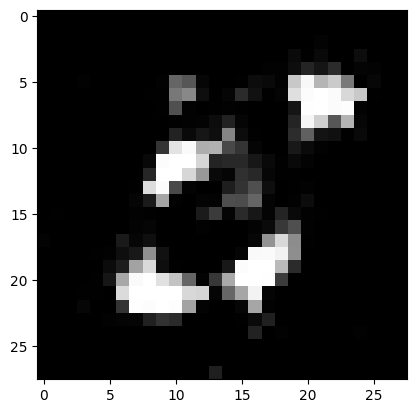

Epoch: 15550
loss_g: 1.1628882884979248 	loss_d: 0.9119822978973389
Epoch: 15600
loss_g: 0.9799462556838989 	loss_d: 1.1727434396743774
Epoch: 15650
loss_g: 0.6310873031616211 	loss_d: 1.2198830842971802
Epoch: 15700
loss_g: 1.1773751974105835 	loss_d: 1.1041591167449951
Epoch: 15750
loss_g: 1.6101105213165283 	loss_d: 1.0699588060379028
Ploting:  8


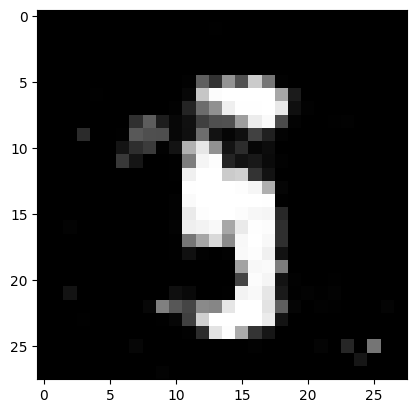

Ploting:  6


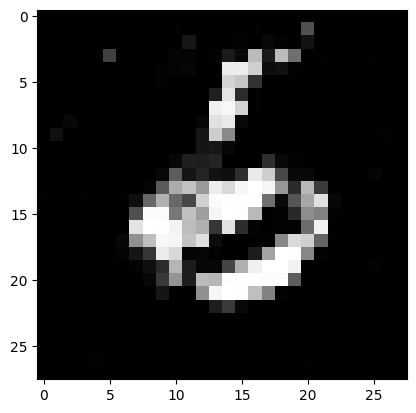

Ploting:  4


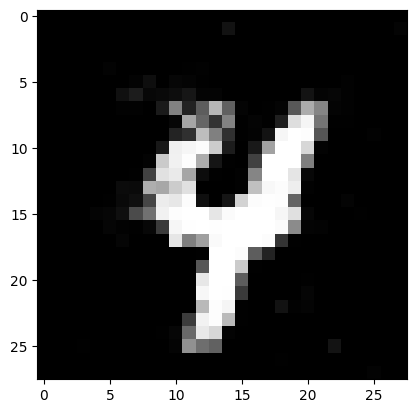

Ploting:  0


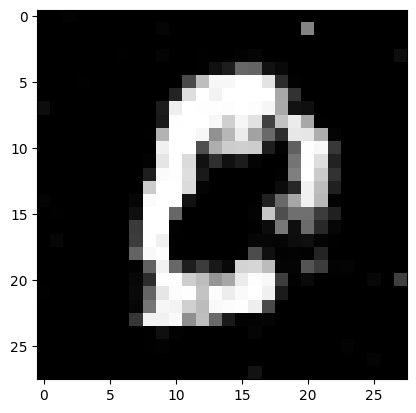

Ploting:  1


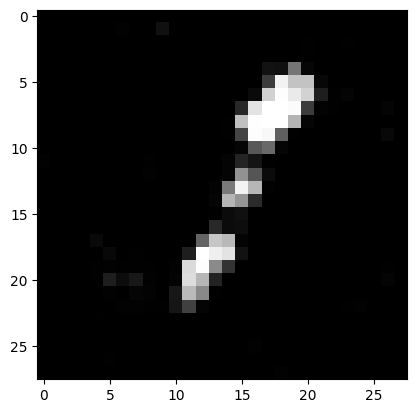

Epoch: 15800
loss_g: 1.2797801494598389 	loss_d: 0.9876977801322937
Epoch: 15850
loss_g: 1.2371704578399658 	loss_d: 0.9877142906188965
Epoch: 15900
loss_g: 0.8777251243591309 	loss_d: 1.1542651653289795
Epoch: 15950
loss_g: 1.4182990789413452 	loss_d: 1.0637543201446533
Epoch: 16000
loss_g: 1.6093553304672241 	loss_d: 1.271817684173584
Ploting:  8


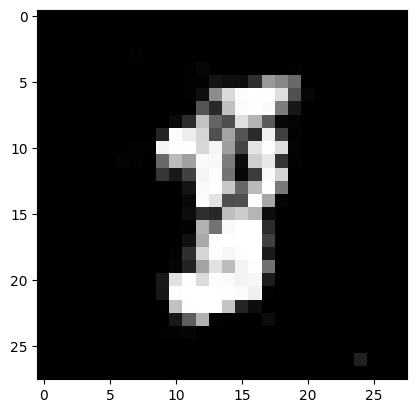

Ploting:  5


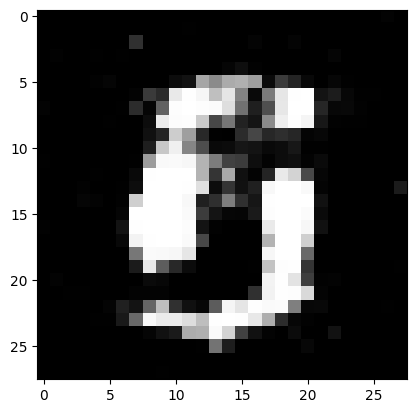

Ploting:  1


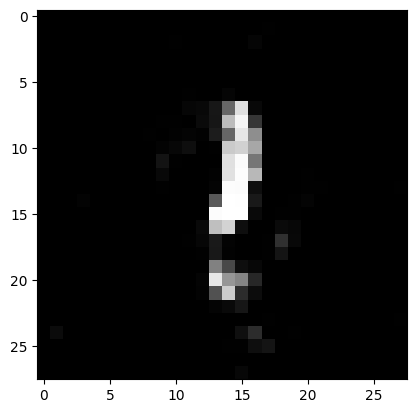

Ploting:  5


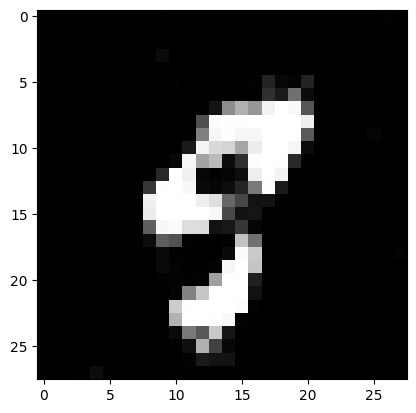

Ploting:  2


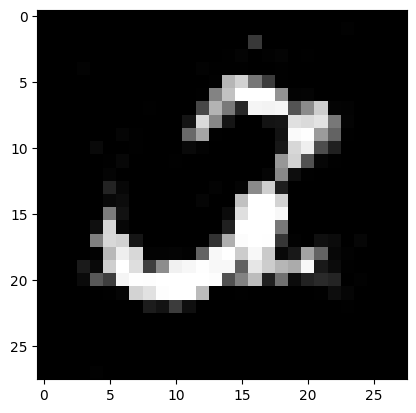

Epoch: 16050
loss_g: 1.4460514783859253 	loss_d: 1.076486349105835
Epoch: 16100
loss_g: 1.1274912357330322 	loss_d: 1.0480464696884155
Epoch: 16150
loss_g: 1.0853310823440552 	loss_d: 1.1242921352386475
Epoch: 16200
loss_g: 1.2406558990478516 	loss_d: 0.9800114631652832
Epoch: 16250
loss_g: 1.169087529182434 	loss_d: 1.0184543132781982
Ploting:  3


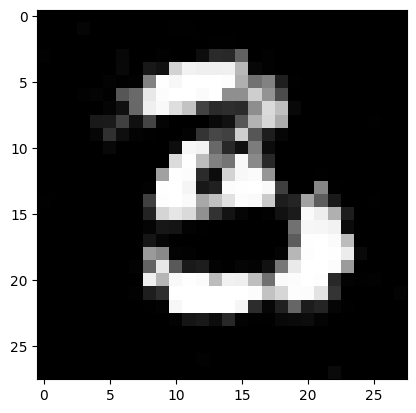

Ploting:  9


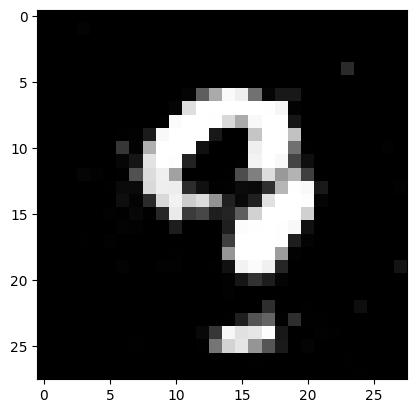

Ploting:  4


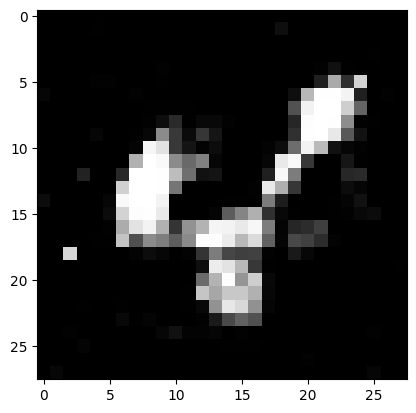

Ploting:  1


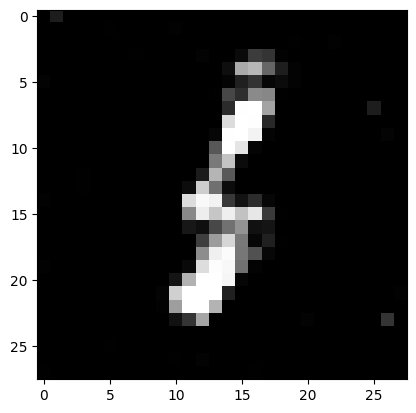

Ploting:  8


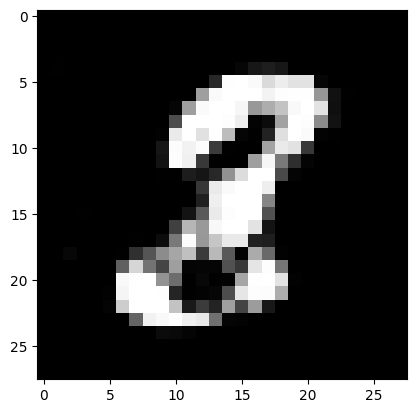

Epoch: 16300
loss_g: 1.048779010772705 	loss_d: 1.0119882822036743
Epoch: 16350
loss_g: 1.265409231185913 	loss_d: 1.060678482055664
Epoch: 16400
loss_g: 1.4703565835952759 	loss_d: 0.9696402549743652
Epoch: 16450
loss_g: 1.2094817161560059 	loss_d: 1.0652689933776855
Epoch: 16500
loss_g: 0.9893709421157837 	loss_d: 0.9828470349311829
Ploting:  1


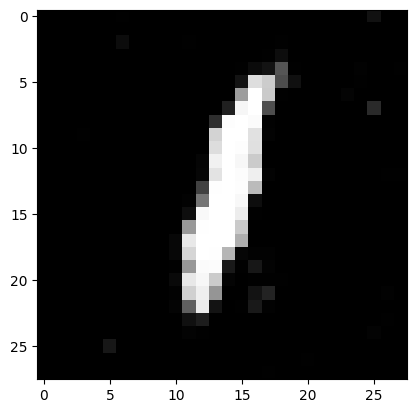

Ploting:  3


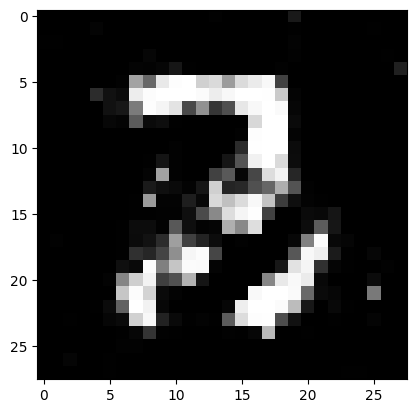

Ploting:  7


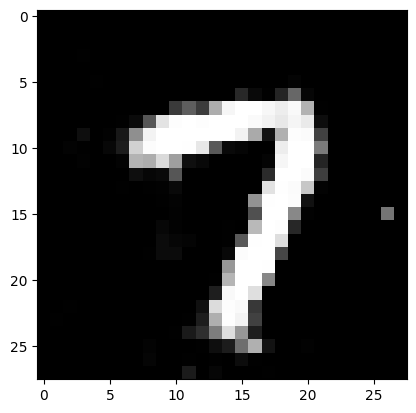

Ploting:  5


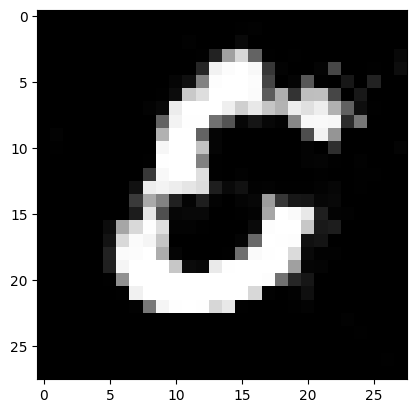

Ploting:  4


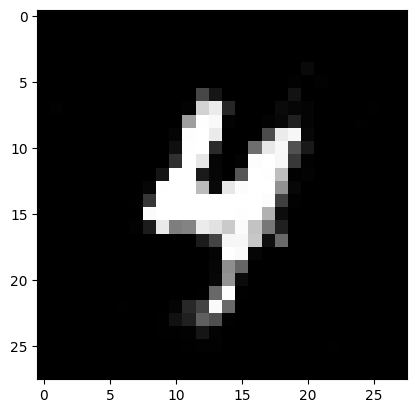

Epoch: 16550
loss_g: 1.092355489730835 	loss_d: 1.1372666358947754
Epoch: 16600
loss_g: 1.0376410484313965 	loss_d: 1.0846856832504272
Epoch: 16650
loss_g: 1.4923856258392334 	loss_d: 1.0592331886291504
Epoch: 16700
loss_g: 1.407301425933838 	loss_d: 1.1530637741088867
Epoch: 16750
loss_g: 0.9560648202896118 	loss_d: 1.1518875360488892
Ploting:  8


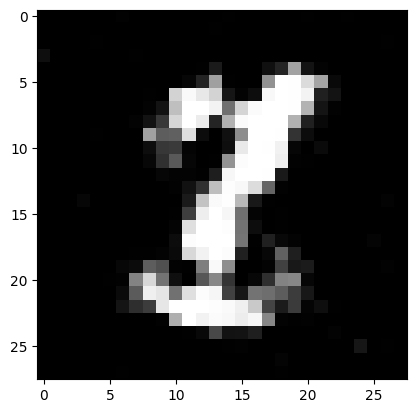

Ploting:  0


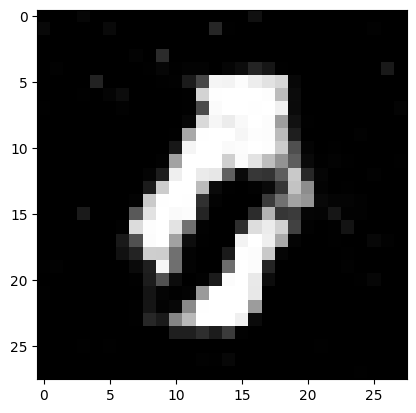

Ploting:  5


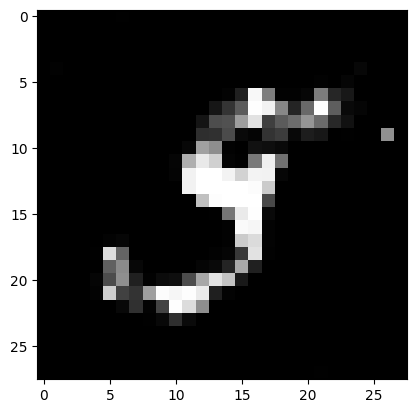

Ploting:  8


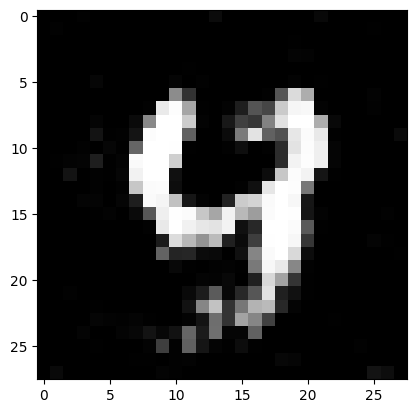

Ploting:  6


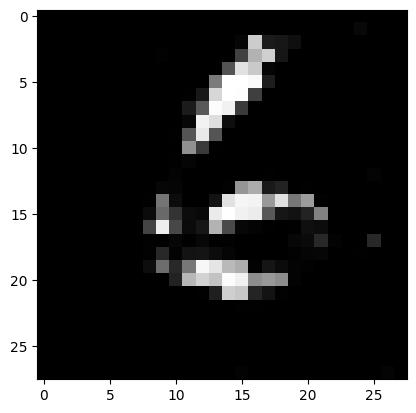

Epoch: 16800
loss_g: 0.8796192407608032 	loss_d: 0.9743895530700684
Epoch: 16850
loss_g: 1.0645456314086914 	loss_d: 0.9625443816184998
Epoch: 16900
loss_g: 1.5187067985534668 	loss_d: 1.091550350189209
Epoch: 16950
loss_g: 1.0348927974700928 	loss_d: 1.125748634338379
Epoch: 17000
loss_g: 1.5022846460342407 	loss_d: 1.0898867845535278
Ploting:  9


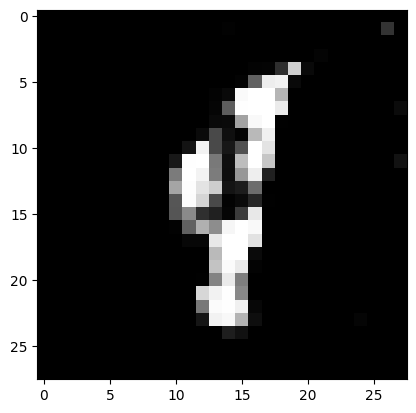

Ploting:  7


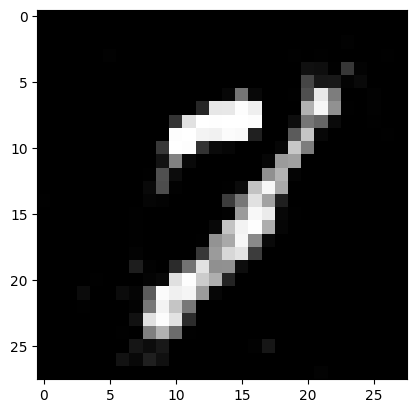

Ploting:  3


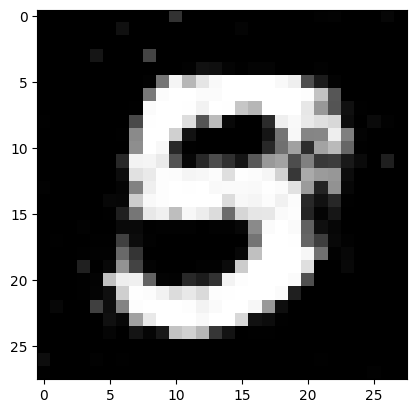

Ploting:  9


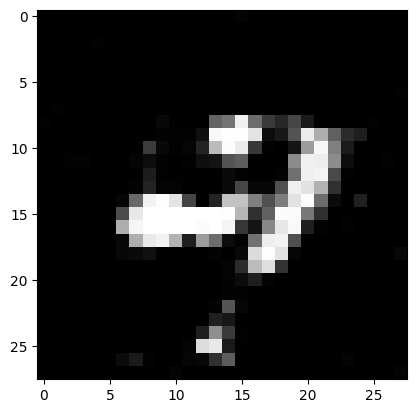

Ploting:  2


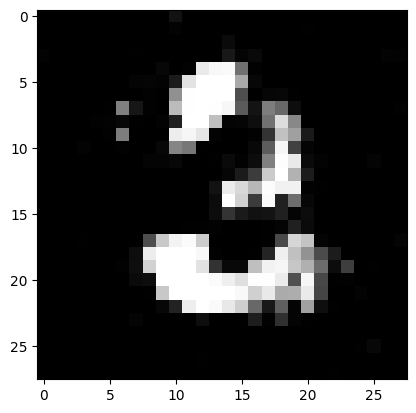

Epoch: 17050
loss_g: 0.9680358171463013 	loss_d: 0.9872353672981262
Epoch: 17100
loss_g: 1.3234062194824219 	loss_d: 1.1793904304504395
Epoch: 17150
loss_g: 0.8863070011138916 	loss_d: 1.1769521236419678
Epoch: 17200
loss_g: 1.3779077529907227 	loss_d: 0.9636948108673096
Epoch: 17250
loss_g: 1.2974379062652588 	loss_d: 1.1496142148971558
Ploting:  1


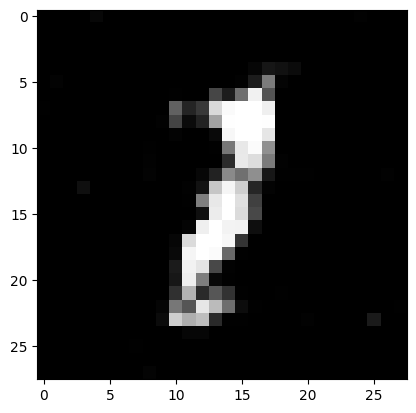

Ploting:  3


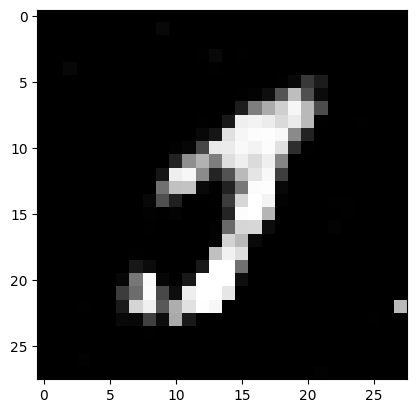

Ploting:  6


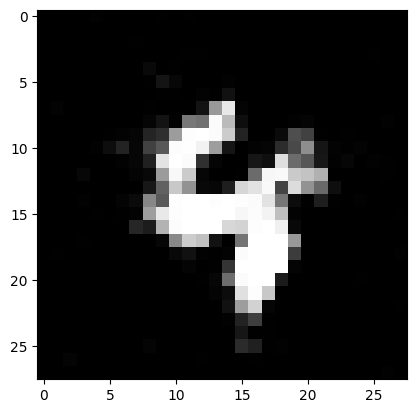

Ploting:  3


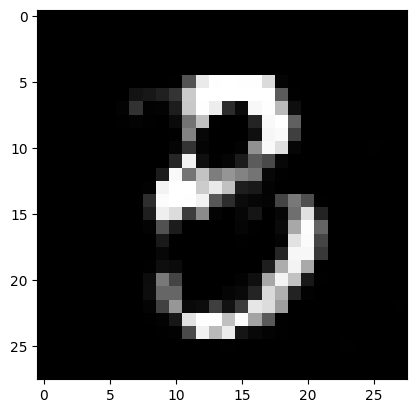

Ploting:  2


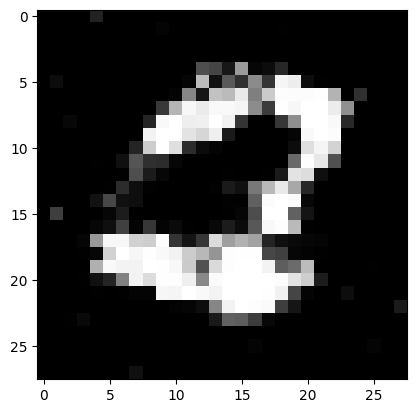

Epoch: 17300
loss_g: 1.279953956604004 	loss_d: 1.193363070487976
Epoch: 17350
loss_g: 1.5926406383514404 	loss_d: 1.2612234354019165
Epoch: 17400
loss_g: 0.6354131698608398 	loss_d: 1.625638484954834
Epoch: 17450
loss_g: 1.1543526649475098 	loss_d: 1.070383906364441
Epoch: 17500
loss_g: 1.7505837678909302 	loss_d: 1.1589221954345703
Ploting:  7


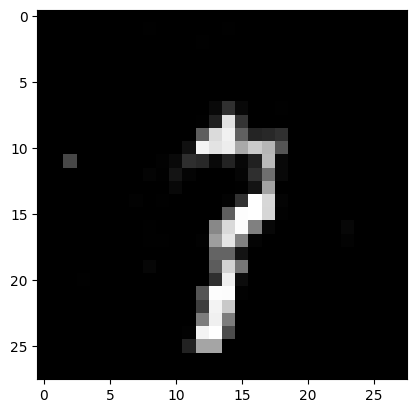

Ploting:  2


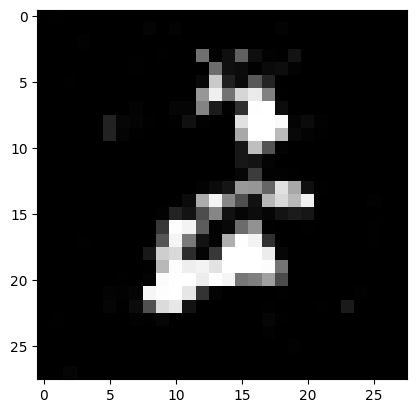

Ploting:  8


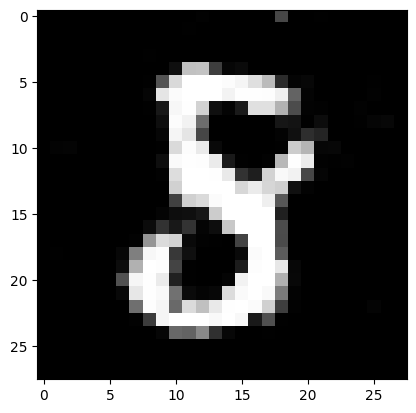

Ploting:  5


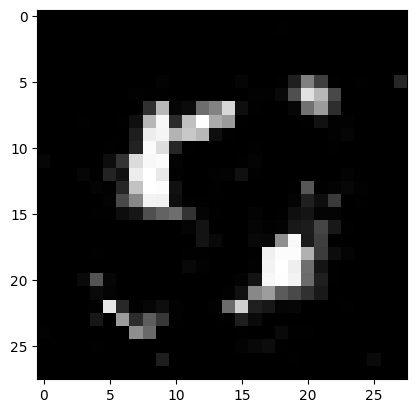

Ploting:  8


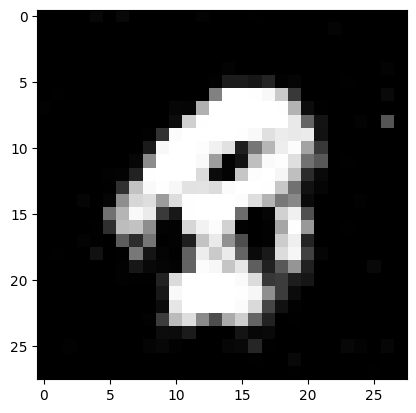

Epoch: 17550
loss_g: 1.1566801071166992 	loss_d: 1.0101604461669922
Epoch: 17600
loss_g: 1.1841233968734741 	loss_d: 1.050022006034851
Epoch: 17650
loss_g: 0.8946928977966309 	loss_d: 0.9819577932357788
Epoch: 17700
loss_g: 1.0763804912567139 	loss_d: 1.148014783859253
Epoch: 17750
loss_g: 1.7179436683654785 	loss_d: 1.0217175483703613
Ploting:  5


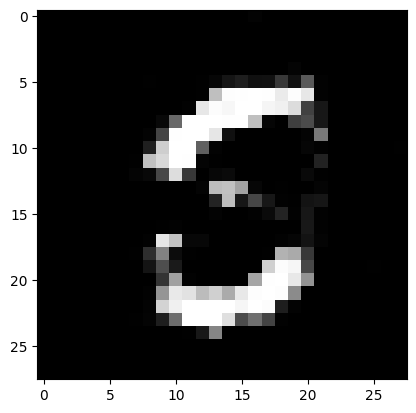

Ploting:  7


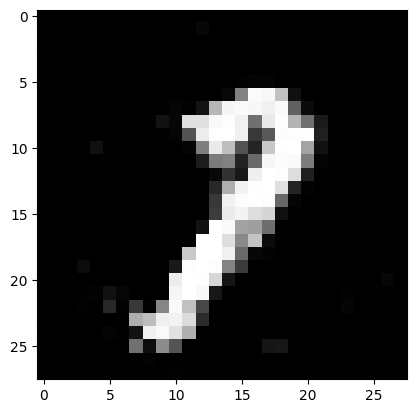

Ploting:  4


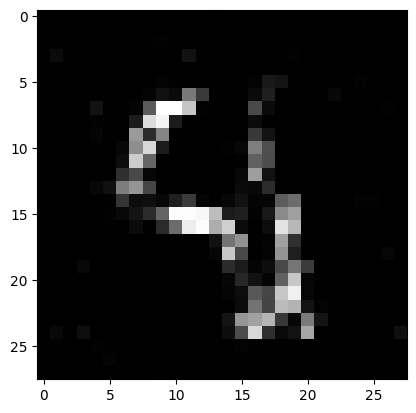

Ploting:  4


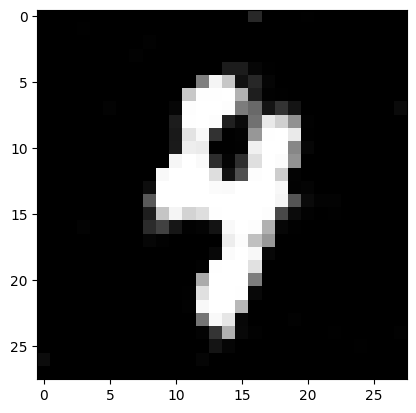

Ploting:  5


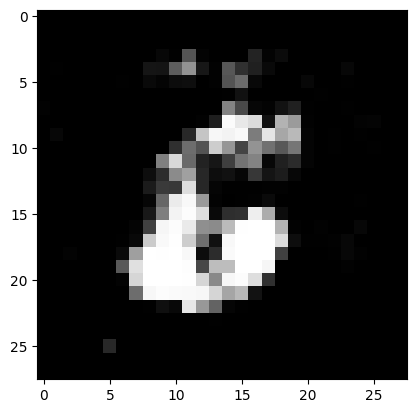

Epoch: 17800
loss_g: 0.9752230644226074 	loss_d: 1.0155580043792725
Epoch: 17850
loss_g: 1.0934339761734009 	loss_d: 1.0622881650924683
Epoch: 17900
loss_g: 1.0168635845184326 	loss_d: 1.1395649909973145
Epoch: 17950
loss_g: 1.1034693717956543 	loss_d: 1.0179169178009033
Epoch: 18000
loss_g: 0.763083815574646 	loss_d: 1.0667654275894165
Ploting:  6


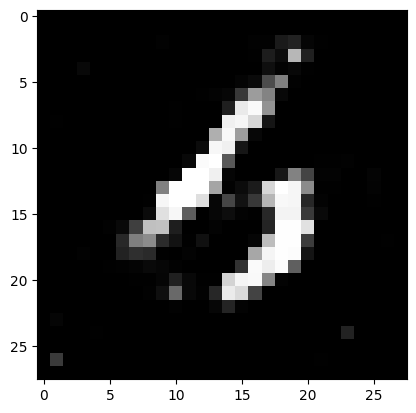

Ploting:  9


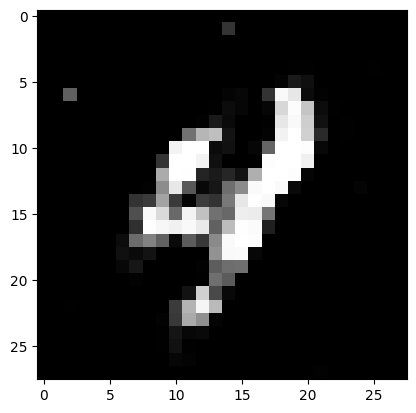

Ploting:  1


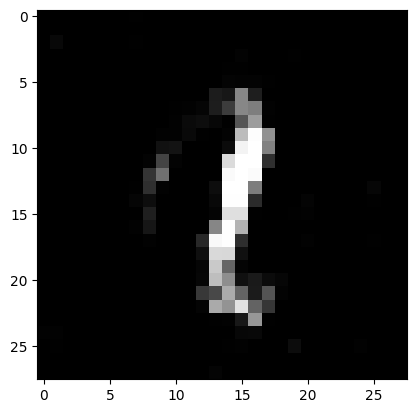

Ploting:  2


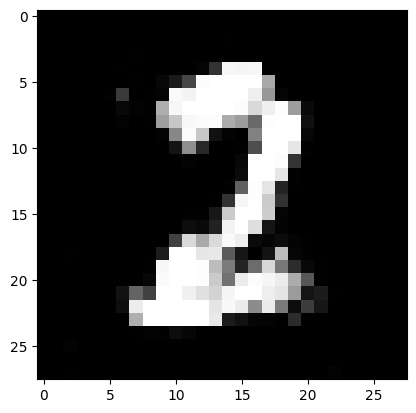

Ploting:  5


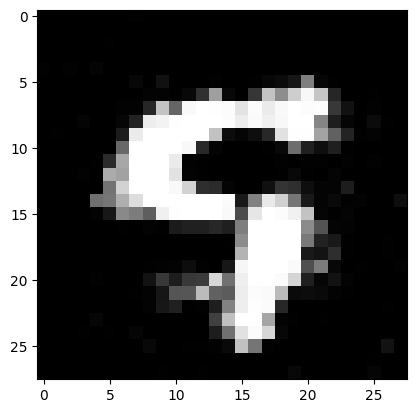

Epoch: 18050
loss_g: 1.1923649311065674 	loss_d: 1.0071344375610352
Epoch: 18100
loss_g: 1.0932819843292236 	loss_d: 0.9717975854873657
Epoch: 18150
loss_g: 1.1742684841156006 	loss_d: 1.0224030017852783
Epoch: 18200
loss_g: 1.2177526950836182 	loss_d: 0.9163167476654053
Epoch: 18250
loss_g: 1.2007807493209839 	loss_d: 1.14211106300354
Ploting:  2


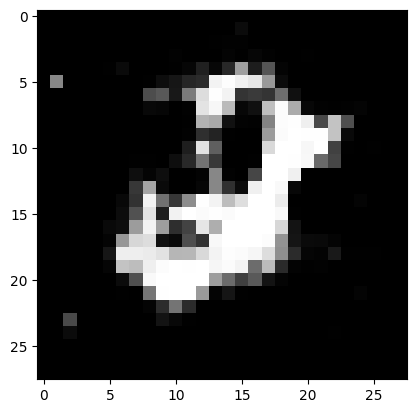

Ploting:  3


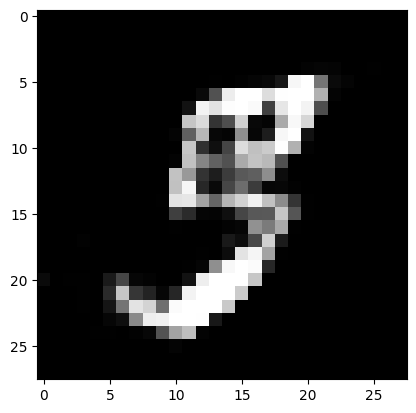

Ploting:  6


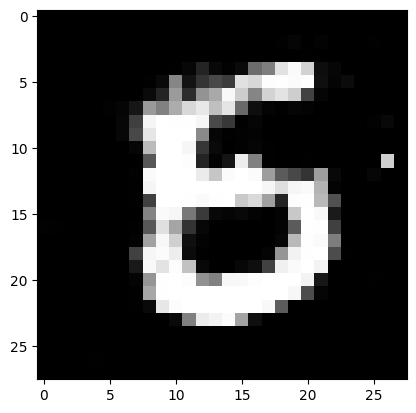

Ploting:  1


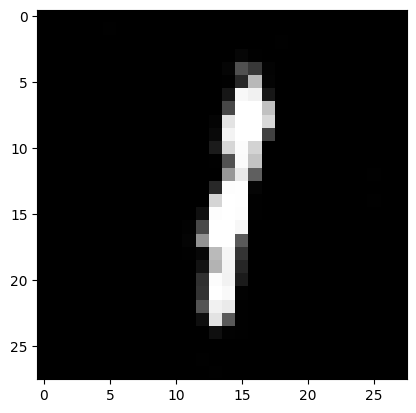

Ploting:  7


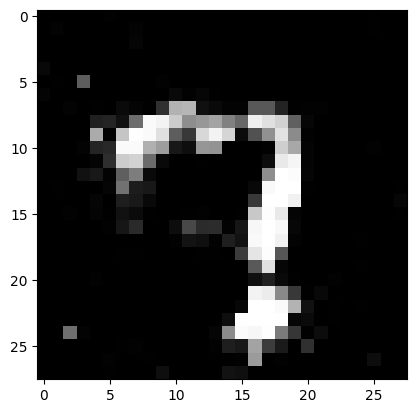

Epoch: 18300
loss_g: 1.4754884243011475 	loss_d: 1.0199588537216187
Epoch: 18350
loss_g: 0.9483537673950195 	loss_d: 1.108000636100769
Epoch: 18400
loss_g: 1.2734767198562622 	loss_d: 1.277160882949829
Epoch: 18450
loss_g: 0.8750883340835571 	loss_d: 1.1857123374938965
Epoch: 18500
loss_g: 0.9186444282531738 	loss_d: 1.0242787599563599
Ploting:  1


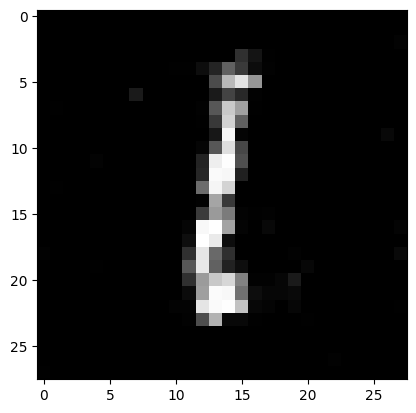

Ploting:  0


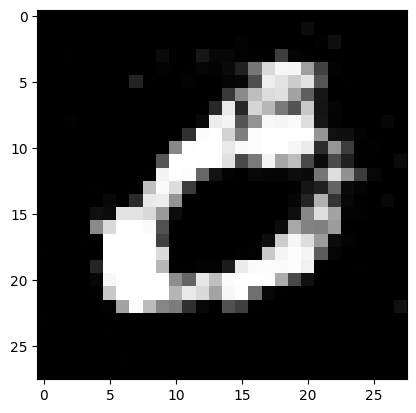

Ploting:  9


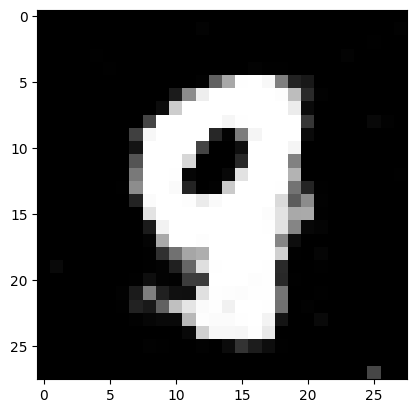

Ploting:  9


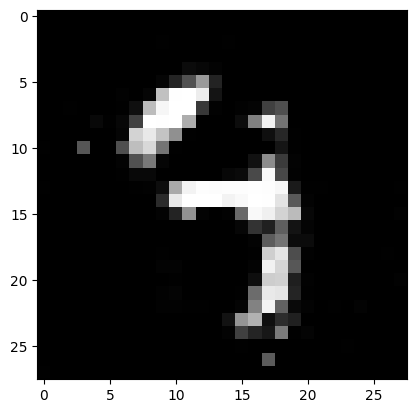

Ploting:  9


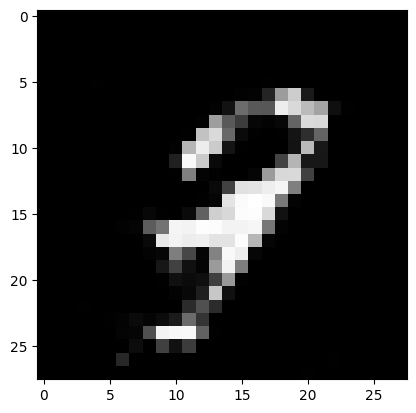

Epoch: 18550
loss_g: 1.021776556968689 	loss_d: 1.0156136751174927
Epoch: 18600
loss_g: 0.825353741645813 	loss_d: 1.1067441701889038
Epoch: 18650
loss_g: 1.0511698722839355 	loss_d: 1.1432363986968994
Epoch: 18700
loss_g: 1.1331255435943604 	loss_d: 1.033910870552063
Epoch: 18750
loss_g: 1.25874662399292 	loss_d: 1.1413424015045166
Ploting:  3


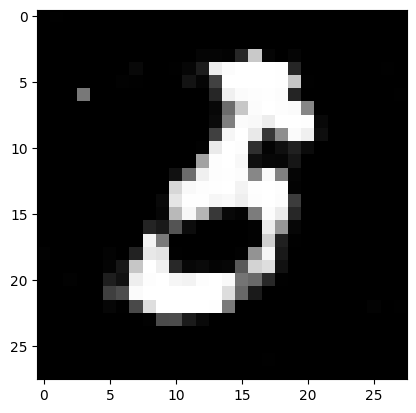

Ploting:  9


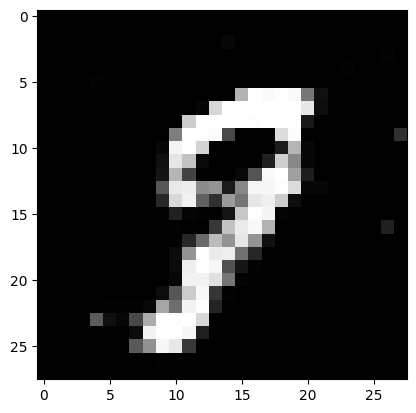

Ploting:  1


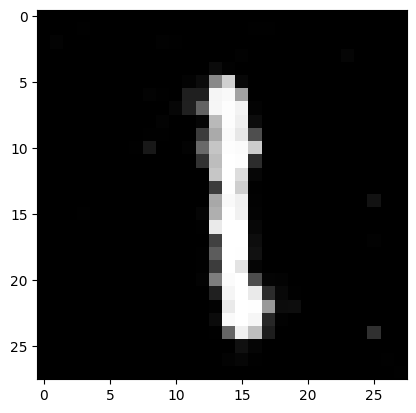

Ploting:  2


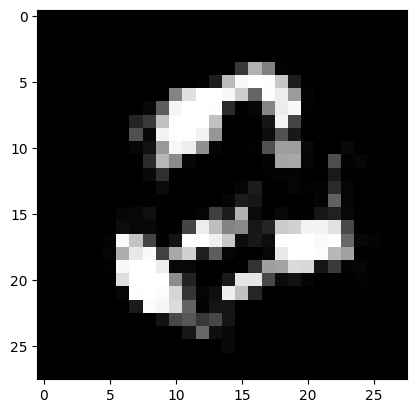

Ploting:  4


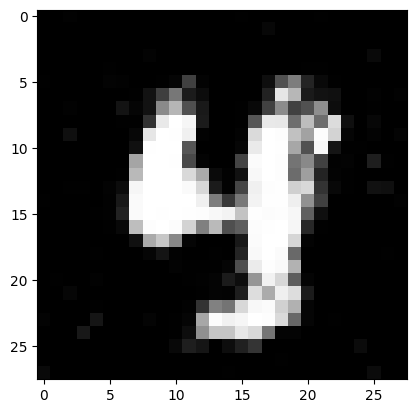

Epoch: 18800
loss_g: 1.933842420578003 	loss_d: 1.3407871723175049
Epoch: 18850
loss_g: 1.5894137620925903 	loss_d: 1.037009835243225
Epoch: 18900
loss_g: 0.8946430683135986 	loss_d: 1.1073600053787231
Epoch: 18950
loss_g: 0.9566059708595276 	loss_d: 1.0994808673858643
Epoch: 19000
loss_g: 0.85040283203125 	loss_d: 1.2406671047210693
Ploting:  6


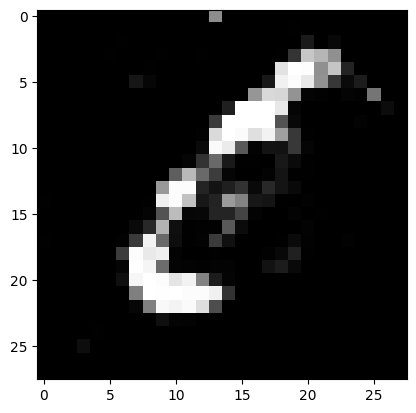

Ploting:  2


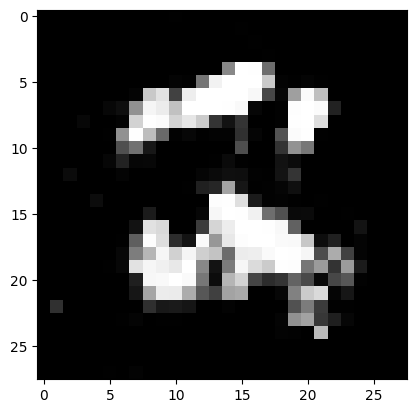

Ploting:  4


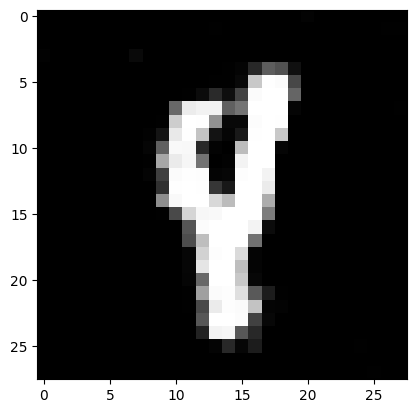

Ploting:  4


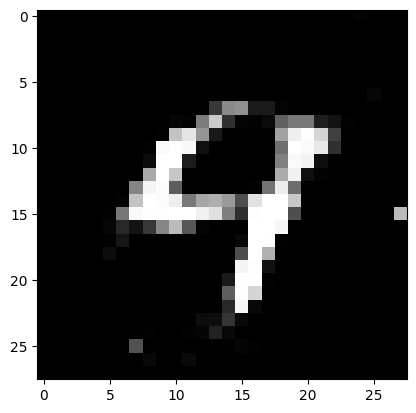

Ploting:  3


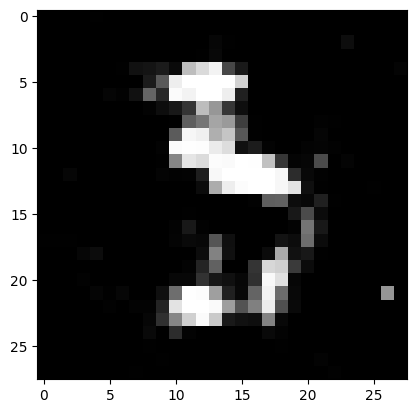

Epoch: 19050
loss_g: 0.8287919759750366 	loss_d: 1.0956814289093018
Epoch: 19100
loss_g: 2.4288415908813477 	loss_d: 1.4160053730010986
Epoch: 19150
loss_g: 1.0321519374847412 	loss_d: 1.101780652999878
Epoch: 19200
loss_g: 1.0763821601867676 	loss_d: 1.0880061388015747
Epoch: 19250
loss_g: 1.2607917785644531 	loss_d: 1.0666205883026123
Ploting:  7


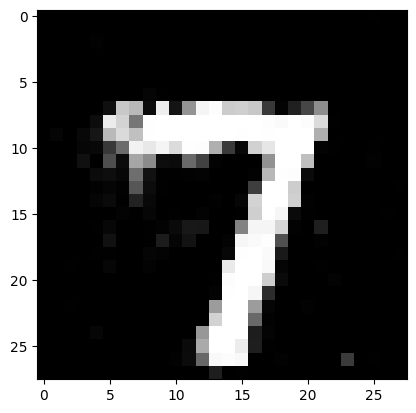

Ploting:  3


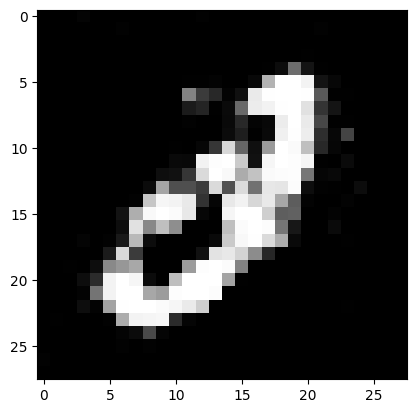

Ploting:  6


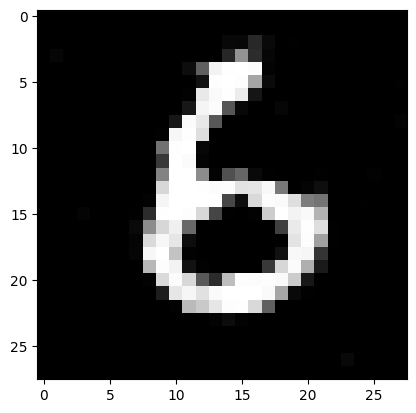

Ploting:  8


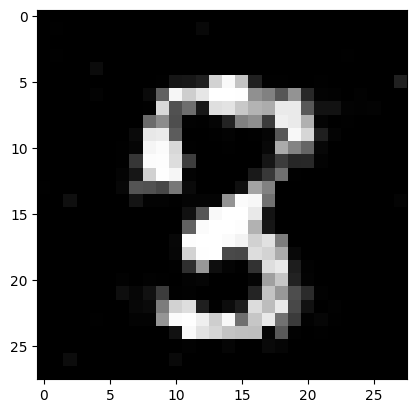

Ploting:  1


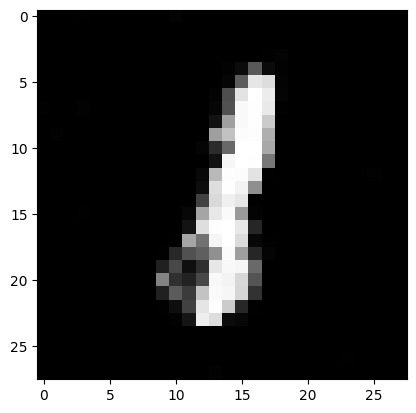

Epoch: 19300
loss_g: 0.8830083012580872 	loss_d: 1.015536904335022
Epoch: 19350
loss_g: 1.4582908153533936 	loss_d: 1.164536476135254
Epoch: 19400
loss_g: 1.036865234375 	loss_d: 1.060820460319519
Epoch: 19450
loss_g: 1.1004968881607056 	loss_d: 1.0254671573638916
Epoch: 19500
loss_g: 1.126644253730774 	loss_d: 1.1508944034576416
Ploting:  6


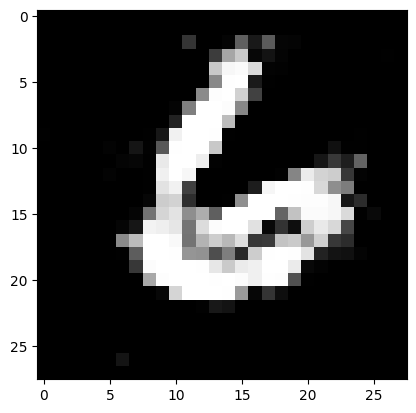

Ploting:  4


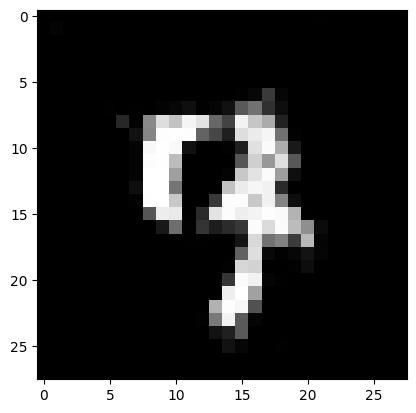

Ploting:  3


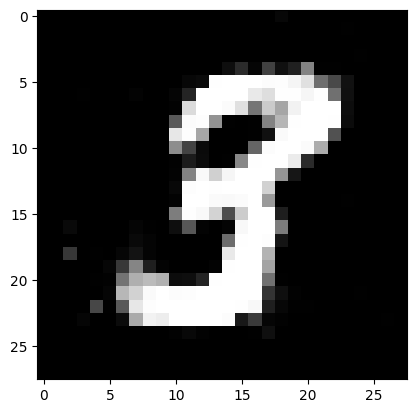

Ploting:  1


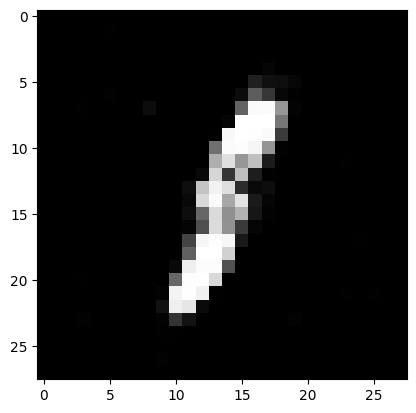

Ploting:  5


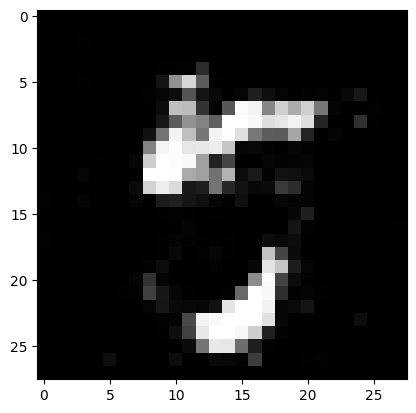

Epoch: 19550
loss_g: 1.2754690647125244 	loss_d: 1.082594633102417
Epoch: 19600
loss_g: 1.4664605855941772 	loss_d: 1.1268770694732666
Epoch: 19650
loss_g: 1.514613151550293 	loss_d: 1.0754753351211548
Epoch: 19700
loss_g: 1.7256901264190674 	loss_d: 0.9360127449035645
Epoch: 19750
loss_g: 1.421702265739441 	loss_d: 1.0795714855194092
Ploting:  7


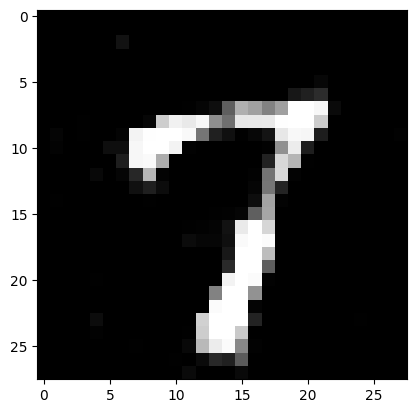

Ploting:  6


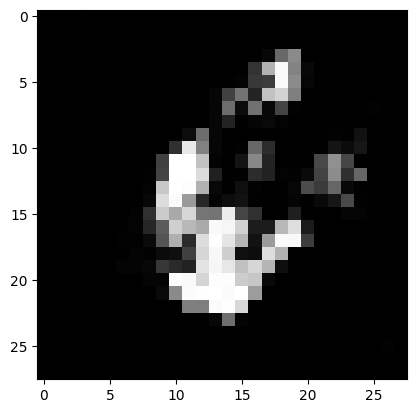

Ploting:  9


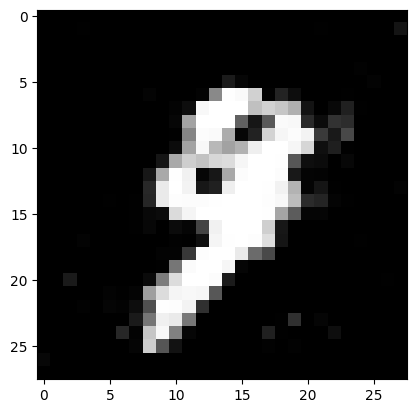

Ploting:  2


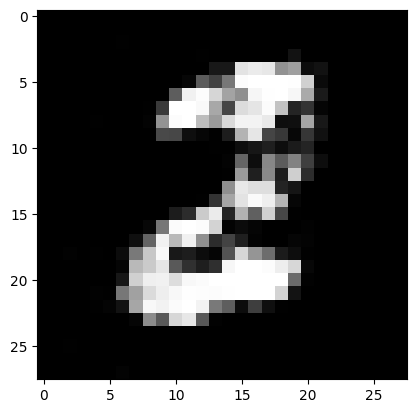

Ploting:  3


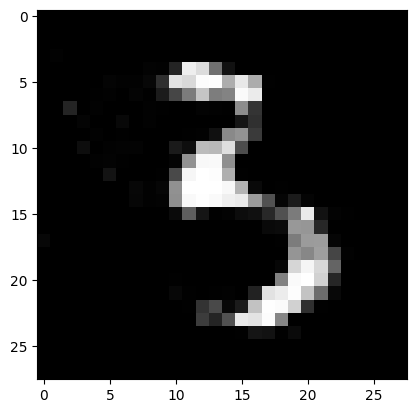

Epoch: 19800
loss_g: 1.0682063102722168 	loss_d: 1.045220971107483
Epoch: 19850
loss_g: 0.8601087331771851 	loss_d: 1.1197378635406494
Epoch: 19900
loss_g: 1.2210527658462524 	loss_d: 1.1694626808166504
Epoch: 19950
loss_g: 0.9491109848022461 	loss_d: 1.023921012878418
Epoch: 20000
loss_g: 1.0261468887329102 	loss_d: 1.0570569038391113
Ploting:  5


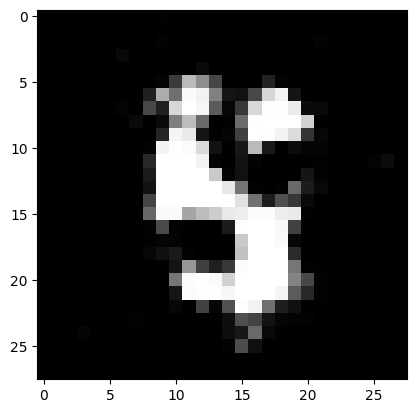

Ploting:  9


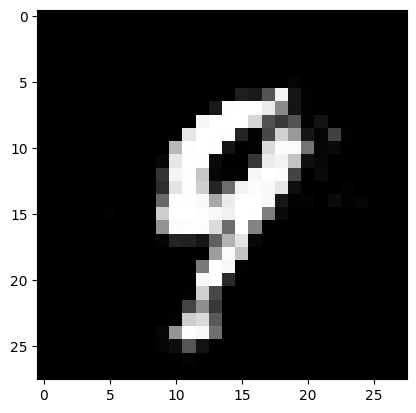

Ploting:  1


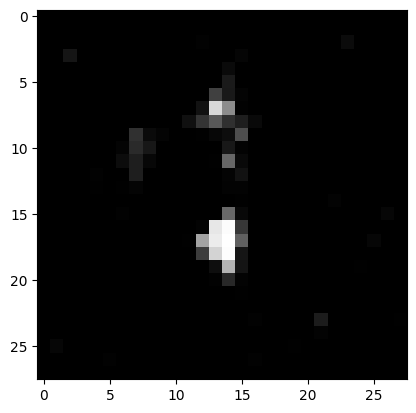

Ploting:  3


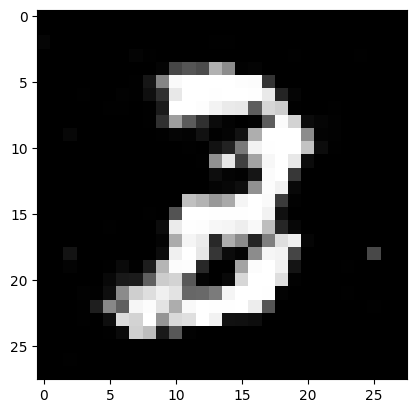

Ploting:  5


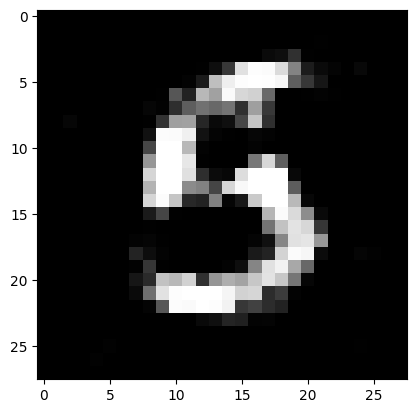

Epoch: 20050
loss_g: 0.6123446226119995 	loss_d: 1.1483490467071533
Epoch: 20100
loss_g: 1.0057165622711182 	loss_d: 1.1964187622070312
Epoch: 20150
loss_g: 0.8452396392822266 	loss_d: 1.106959581375122
Epoch: 20200
loss_g: 1.5399092435836792 	loss_d: 1.1362895965576172
Epoch: 20250
loss_g: 1.0920212268829346 	loss_d: 1.087052583694458
Ploting:  6


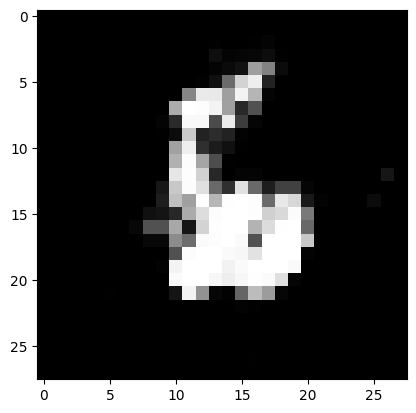

Ploting:  0


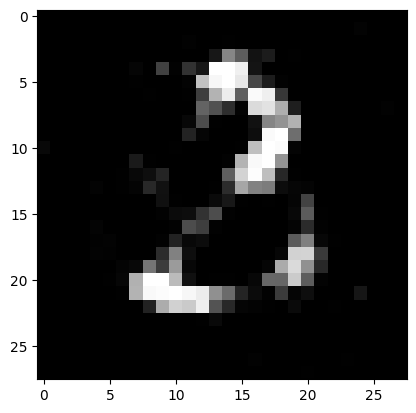

Ploting:  7


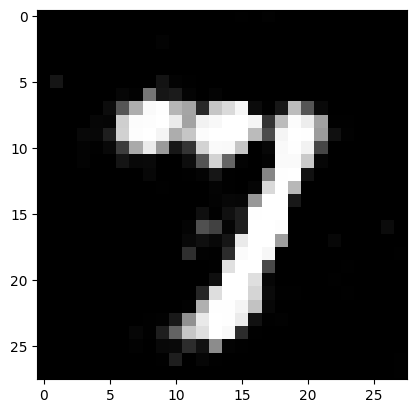

Ploting:  9


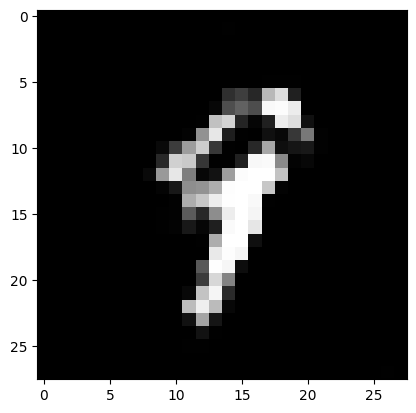

Ploting:  0


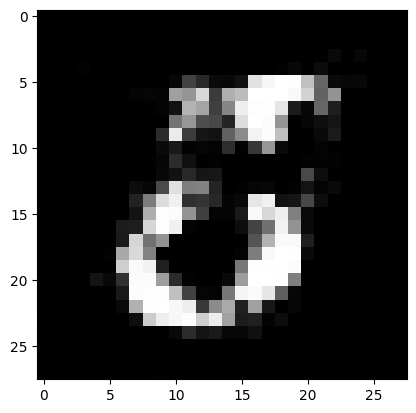

Epoch: 20300
loss_g: 1.1380890607833862 	loss_d: 1.0575456619262695
Epoch: 20350
loss_g: 1.2383462190628052 	loss_d: 1.1059789657592773
Epoch: 20400
loss_g: 1.1179603338241577 	loss_d: 1.093888521194458
Epoch: 20450
loss_g: 1.1772093772888184 	loss_d: 1.175157070159912
Epoch: 20500
loss_g: 1.4994546175003052 	loss_d: 1.0644642114639282
Ploting:  6


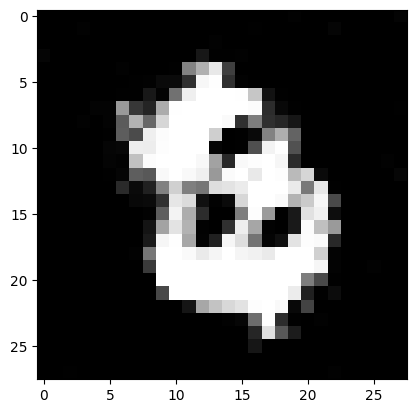

Ploting:  1


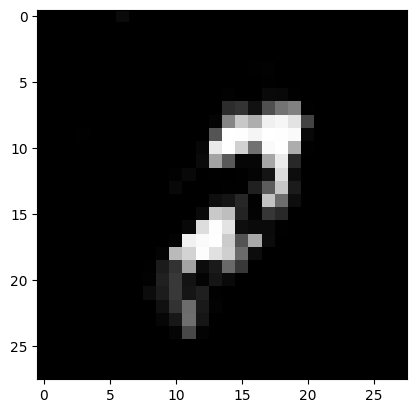

Ploting:  3


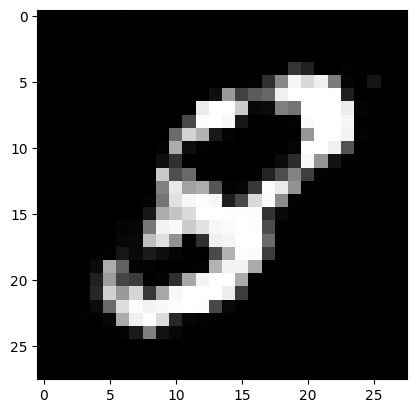

Ploting:  3


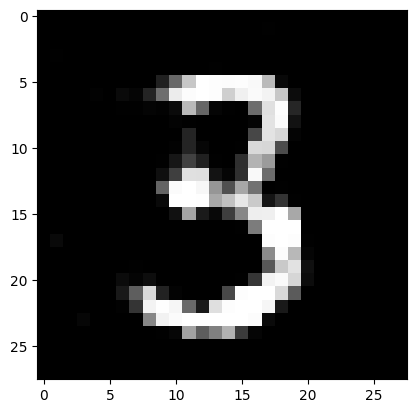

Ploting:  1


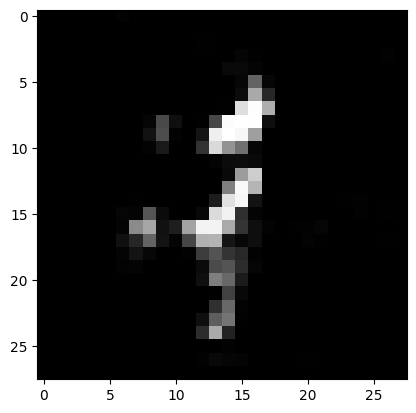

Epoch: 20550
loss_g: 0.8425511121749878 	loss_d: 1.0369808673858643
Epoch: 20600
loss_g: 1.4357339143753052 	loss_d: 1.0067377090454102
Epoch: 20650
loss_g: 1.2201281785964966 	loss_d: 1.1328606605529785
Epoch: 20700
loss_g: 1.1124730110168457 	loss_d: 1.097374439239502
Epoch: 20750
loss_g: 0.9064379930496216 	loss_d: 1.0723543167114258
Ploting:  7


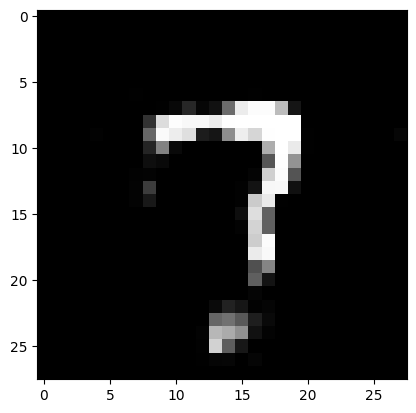

Ploting:  6


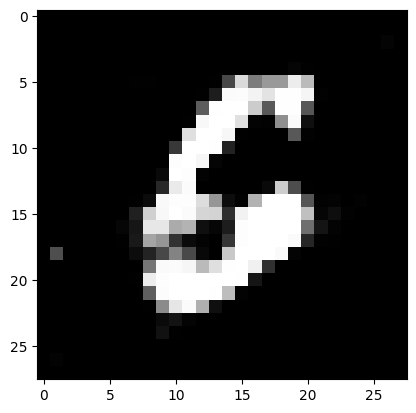

Ploting:  1


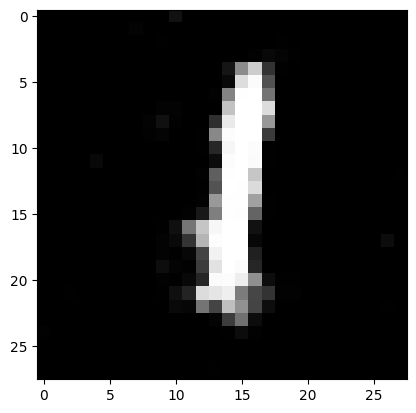

Ploting:  8


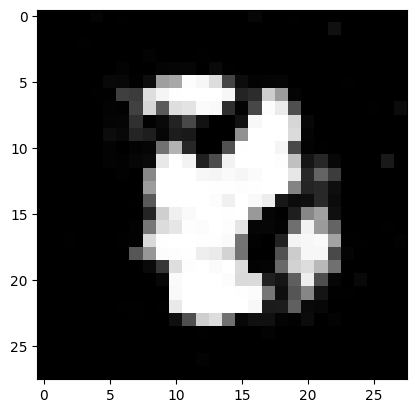

Ploting:  8


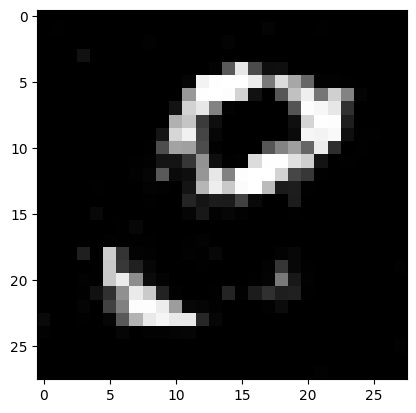

Epoch: 20800
loss_g: 1.1936049461364746 	loss_d: 1.014059066772461
Epoch: 20850
loss_g: 1.6772055625915527 	loss_d: 1.1806955337524414
Epoch: 20900
loss_g: 1.218231201171875 	loss_d: 1.0241166353225708
Epoch: 20950
loss_g: 0.9492255449295044 	loss_d: 1.264034390449524
Epoch: 21000
loss_g: 1.0133228302001953 	loss_d: 1.1080553531646729
Ploting:  3


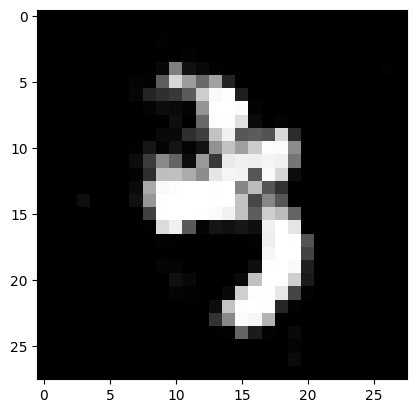

Ploting:  2


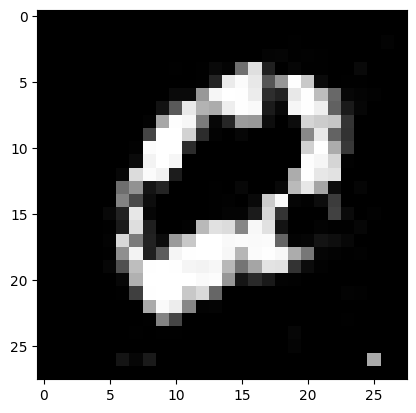

Ploting:  3


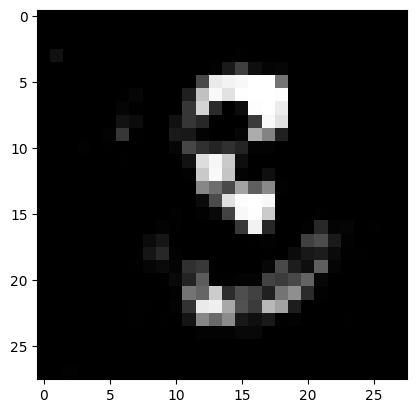

Ploting:  4


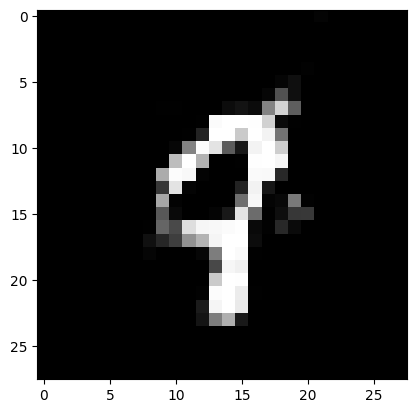

Ploting:  3


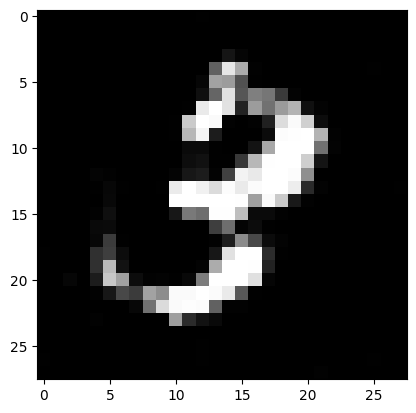

Epoch: 21050
loss_g: 1.0595932006835938 	loss_d: 1.0355981588363647
Epoch: 21100
loss_g: 1.0023671388626099 	loss_d: 1.1032774448394775
Epoch: 21150
loss_g: 1.1624486446380615 	loss_d: 1.1112911701202393
Epoch: 21200
loss_g: 1.9689363241195679 	loss_d: 1.3882620334625244
Epoch: 21250
loss_g: 0.906761884689331 	loss_d: 1.2614860534667969
Ploting:  0


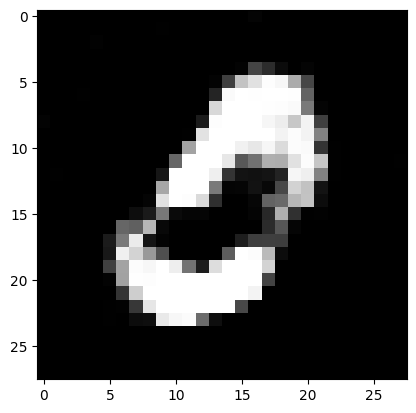

Ploting:  7


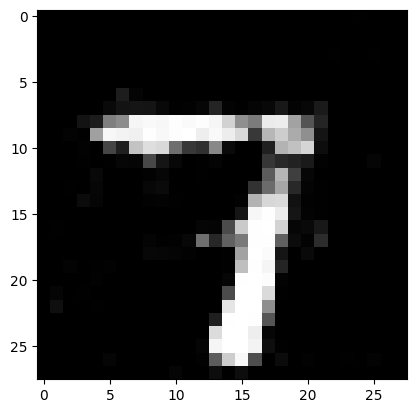

Ploting:  8


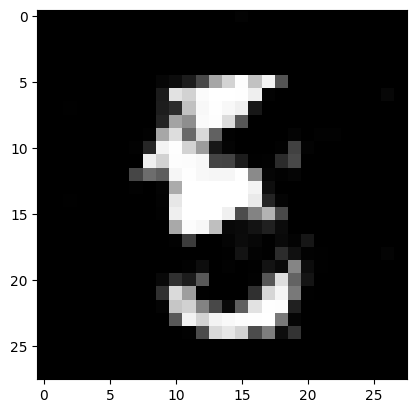

Ploting:  1


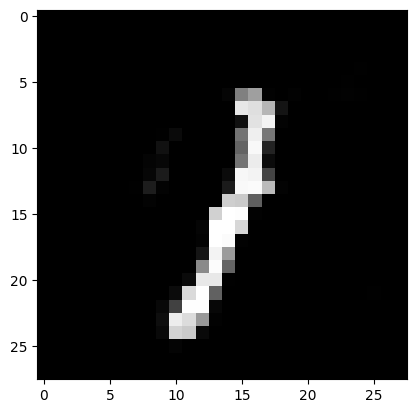

Ploting:  2


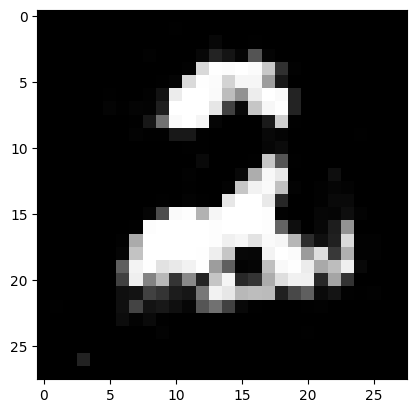

Epoch: 21300
loss_g: 1.3696151971817017 	loss_d: 1.0552775859832764
Epoch: 21350
loss_g: 0.9830238819122314 	loss_d: 1.0487279891967773
Epoch: 21400
loss_g: 1.1045536994934082 	loss_d: 0.9924970269203186
Epoch: 21450
loss_g: 1.343925952911377 	loss_d: 1.085260033607483
Epoch: 21500
loss_g: 1.0231324434280396 	loss_d: 1.2635197639465332
Ploting:  2


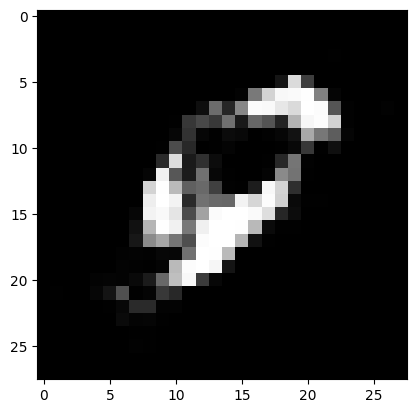

Ploting:  8


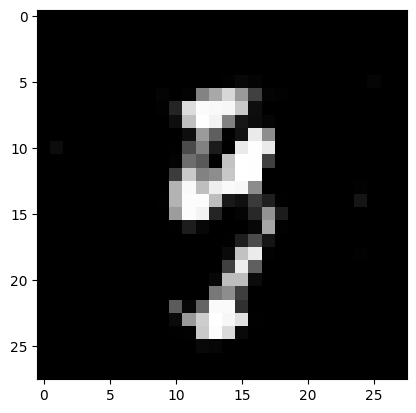

Ploting:  6


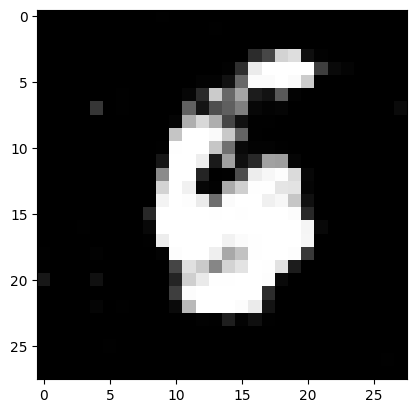

Ploting:  2


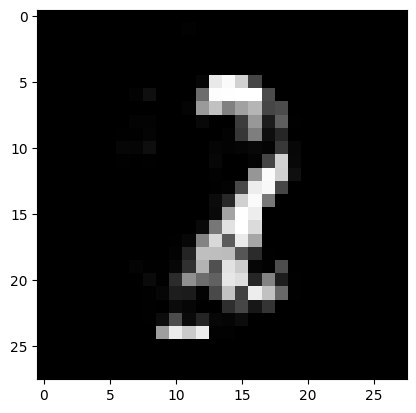

Ploting:  0


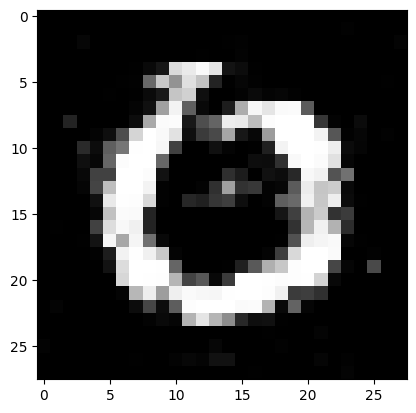

Epoch: 21550
loss_g: 0.9043899774551392 	loss_d: 1.1801234483718872
Epoch: 21600
loss_g: 1.1117877960205078 	loss_d: 1.1308729648590088
Epoch: 21650
loss_g: 0.8242842555046082 	loss_d: 1.1681067943572998
Epoch: 21700
loss_g: 1.068951964378357 	loss_d: 1.0948987007141113
Epoch: 21750
loss_g: 0.9281352162361145 	loss_d: 1.0356855392456055
Ploting:  3


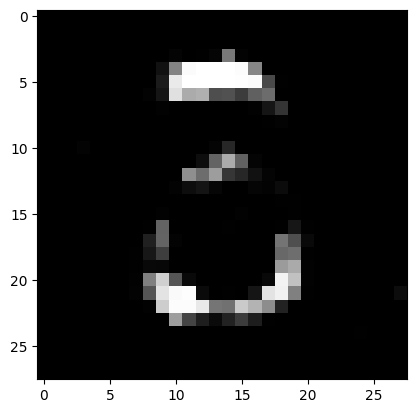

Ploting:  9


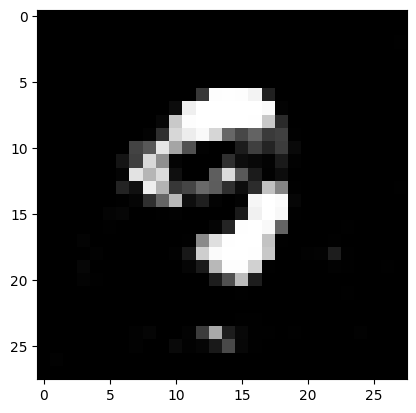

Ploting:  8


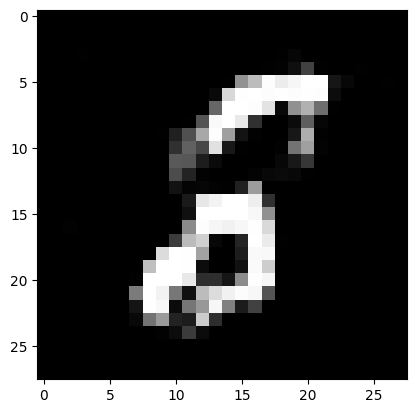

Ploting:  4


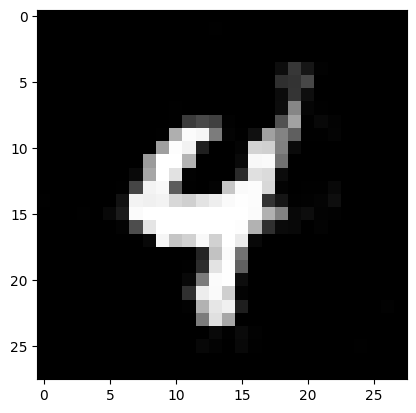

Ploting:  3


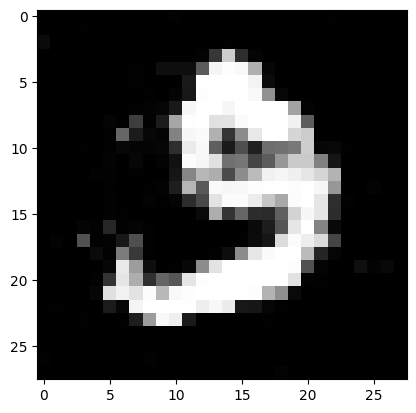

Epoch: 21800
loss_g: 1.0354013442993164 	loss_d: 1.1399030685424805
Epoch: 21850
loss_g: 0.8463413715362549 	loss_d: 1.2545242309570312
Epoch: 21900
loss_g: 1.1952919960021973 	loss_d: 1.1225751638412476
Epoch: 21950
loss_g: 1.0971300601959229 	loss_d: 1.1063599586486816
Epoch: 22000
loss_g: 1.01487398147583 	loss_d: 1.0355418920516968
Ploting:  7


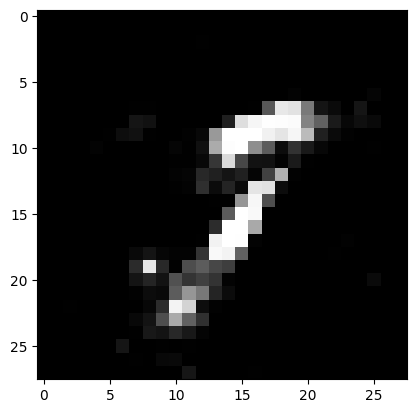

Ploting:  7


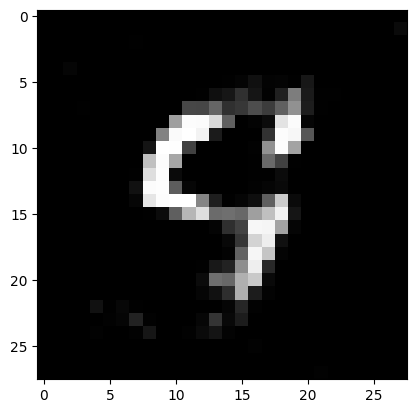

Ploting:  9


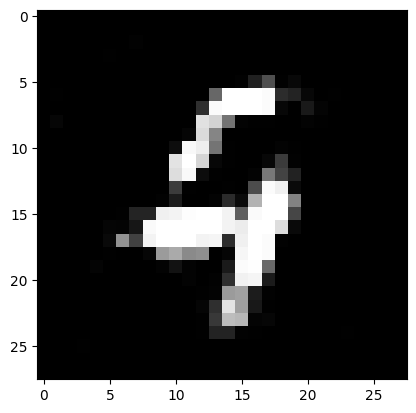

Ploting:  2


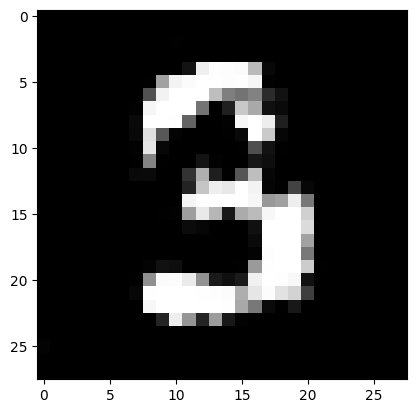

Ploting:  2


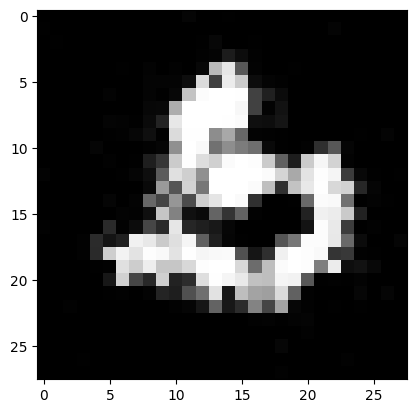

Epoch: 22050
loss_g: 1.459996223449707 	loss_d: 1.0900022983551025
Epoch: 22100
loss_g: 0.9475027322769165 	loss_d: 1.0780541896820068
Epoch: 22150
loss_g: 0.8785169720649719 	loss_d: 1.3004108667373657
Epoch: 22200
loss_g: 1.0159635543823242 	loss_d: 1.1412376165390015
Epoch: 22250
loss_g: 0.8509693145751953 	loss_d: 1.2752623558044434
Ploting:  0


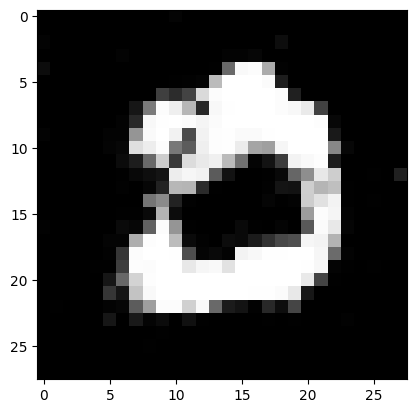

Ploting:  8


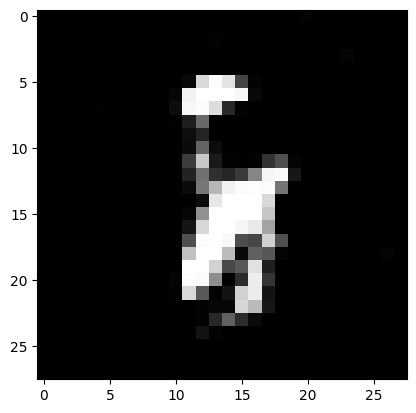

Ploting:  8


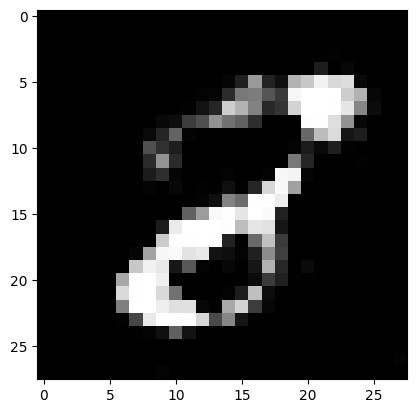

Ploting:  9


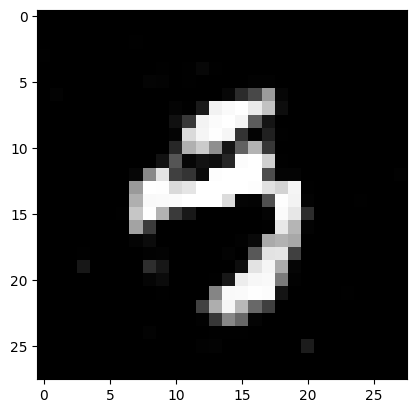

Ploting:  4


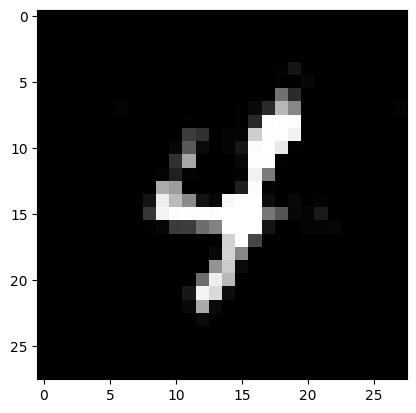

Epoch: 22300
loss_g: 1.2276275157928467 	loss_d: 1.2902355194091797
Epoch: 22350
loss_g: 1.122013807296753 	loss_d: 1.0542798042297363
Epoch: 22400
loss_g: 1.2861485481262207 	loss_d: 1.1051385402679443
Epoch: 22450
loss_g: 0.8137184381484985 	loss_d: 1.3613810539245605
Epoch: 22500
loss_g: 0.98943692445755 	loss_d: 0.9917396306991577
Ploting:  5


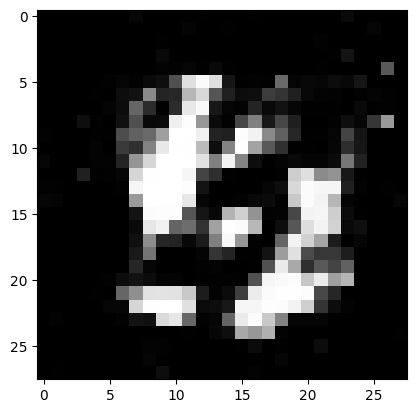

Ploting:  9


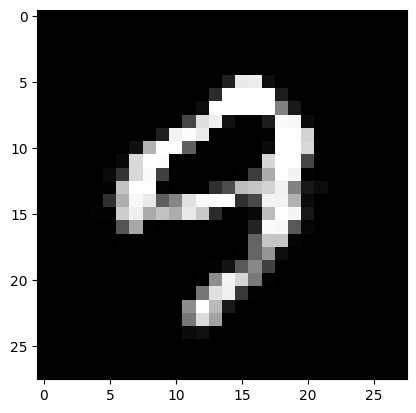

Ploting:  9


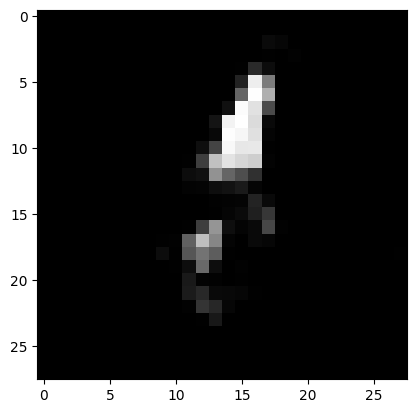

Ploting:  2


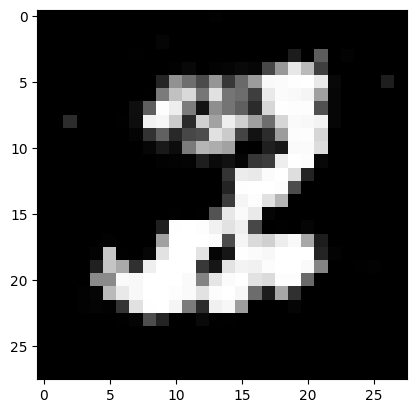

Ploting:  4


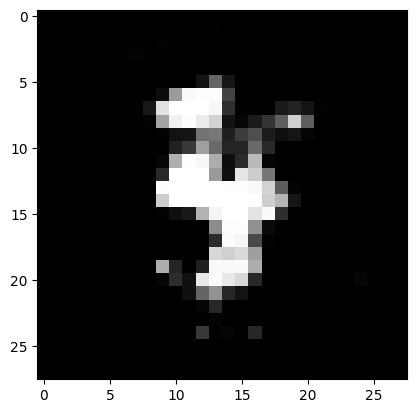

Epoch: 22550
loss_g: 0.9992230534553528 	loss_d: 1.0617992877960205
Epoch: 22600
loss_g: 1.2806612253189087 	loss_d: 1.1463563442230225
Epoch: 22650
loss_g: 0.7736194133758545 	loss_d: 1.0911997556686401
Epoch: 22700
loss_g: 1.3603835105895996 	loss_d: 1.2124600410461426
Epoch: 22750
loss_g: 1.4765065908432007 	loss_d: 1.235884189605713
Ploting:  5


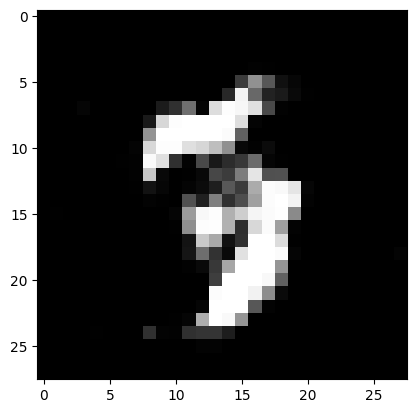

Ploting:  3


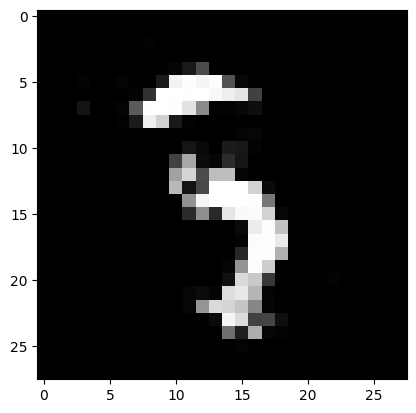

Ploting:  2


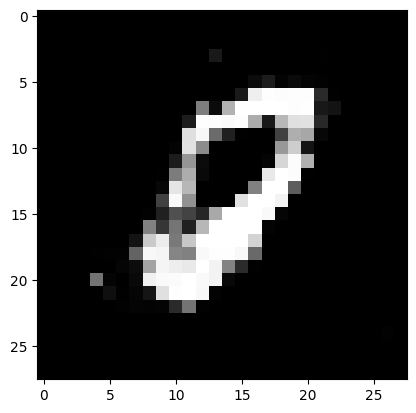

Ploting:  0


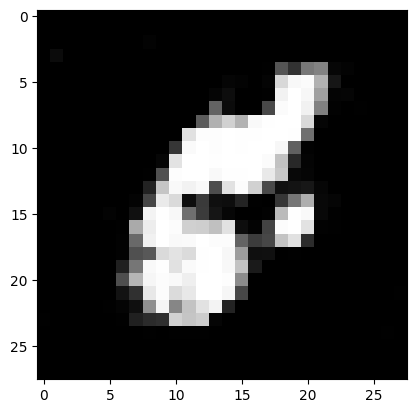

Ploting:  0


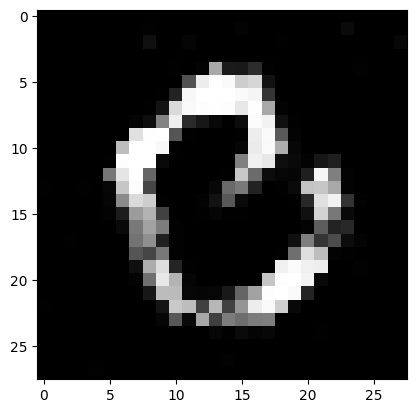

Epoch: 22800
loss_g: 1.5237526893615723 	loss_d: 1.3027716875076294
Epoch: 22850
loss_g: 1.208498477935791 	loss_d: 1.048795223236084
Epoch: 22900
loss_g: 1.2285761833190918 	loss_d: 1.162087082862854
Epoch: 22950
loss_g: 1.2525007724761963 	loss_d: 1.0680097341537476
Epoch: 23000
loss_g: 0.8740973472595215 	loss_d: 1.2527110576629639
Ploting:  7


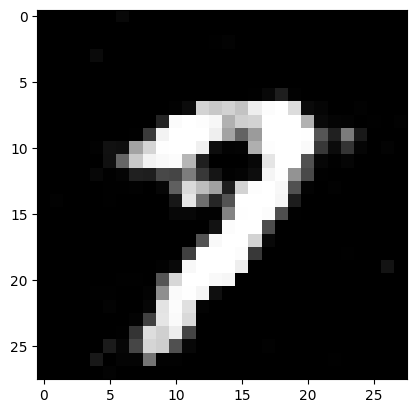

Ploting:  2


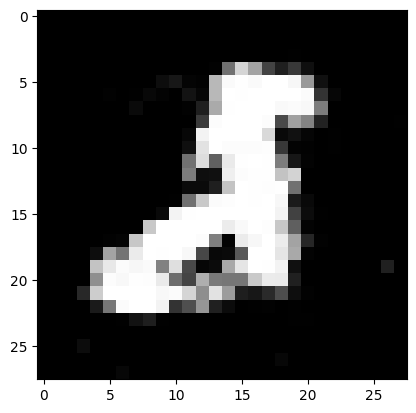

Ploting:  1


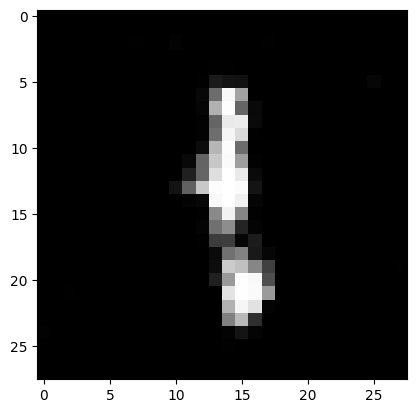

Ploting:  0


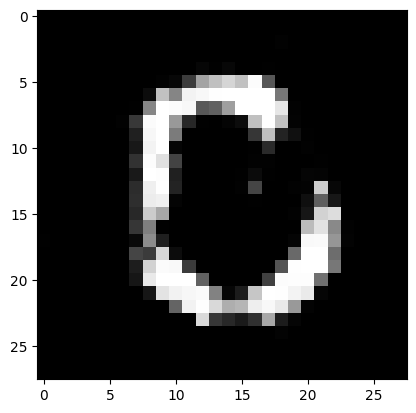

Ploting:  4


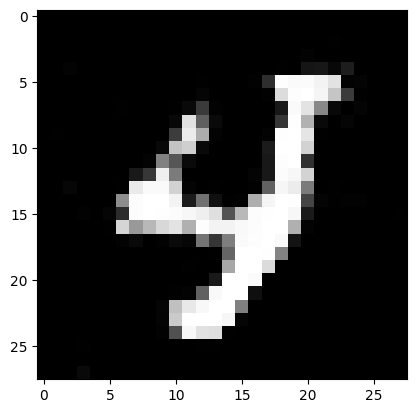

Epoch: 23050
loss_g: 0.9987469911575317 	loss_d: 1.1263418197631836
Epoch: 23100
loss_g: 0.8062206506729126 	loss_d: 1.2726223468780518
Epoch: 23150
loss_g: 1.019970417022705 	loss_d: 1.1804521083831787
Epoch: 23200
loss_g: 1.1780047416687012 	loss_d: 1.1154283285140991
Epoch: 23250
loss_g: 0.9942893981933594 	loss_d: 1.1964988708496094
Ploting:  6


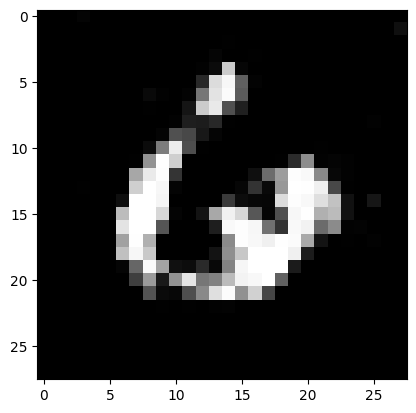

Ploting:  9


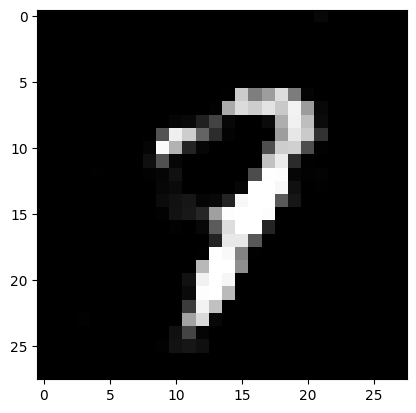

Ploting:  5


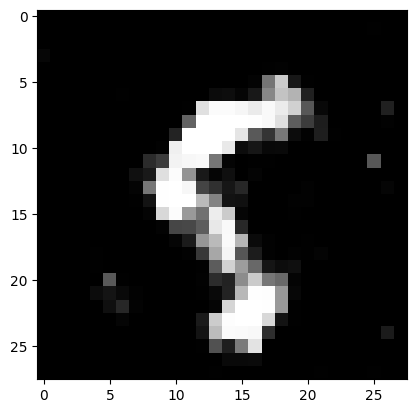

Ploting:  8


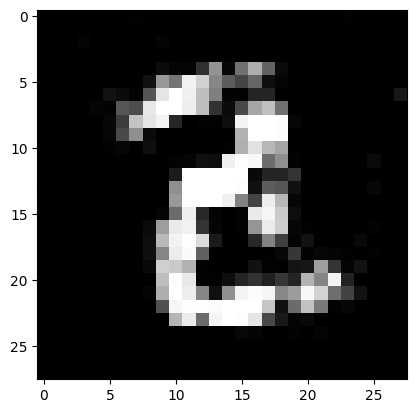

Ploting:  8


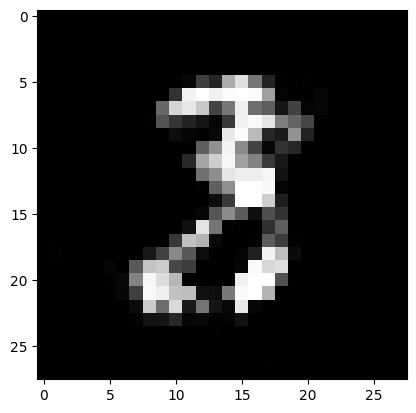

Epoch: 23300
loss_g: 1.1792726516723633 	loss_d: 1.0614219903945923
Epoch: 23350
loss_g: 1.2192277908325195 	loss_d: 0.939755380153656
Epoch: 23400
loss_g: 1.2269093990325928 	loss_d: 1.2221131324768066
Epoch: 23450
loss_g: 1.3020529747009277 	loss_d: 1.0344161987304688
Epoch: 23500
loss_g: 0.9028528928756714 	loss_d: 1.1427438259124756
Ploting:  1


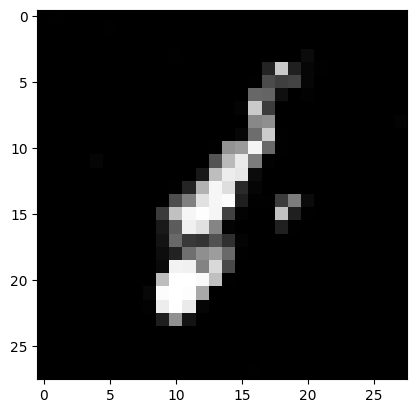

Ploting:  0


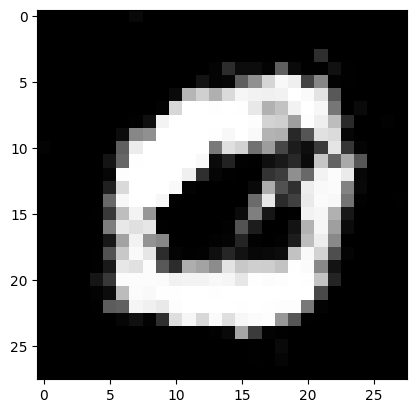

Ploting:  7


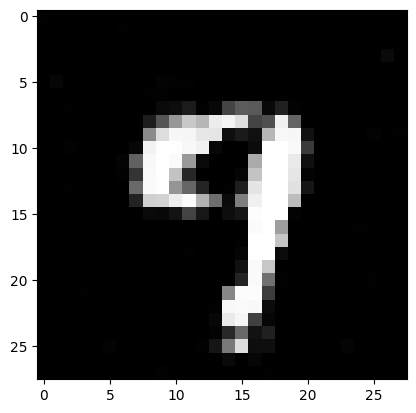

Ploting:  2


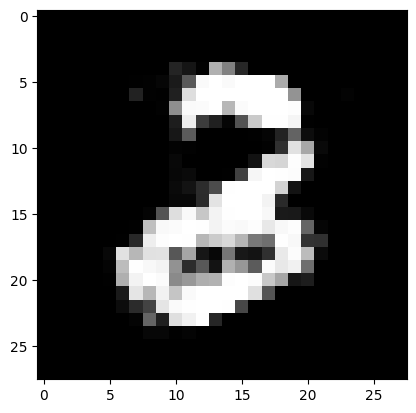

Ploting:  1


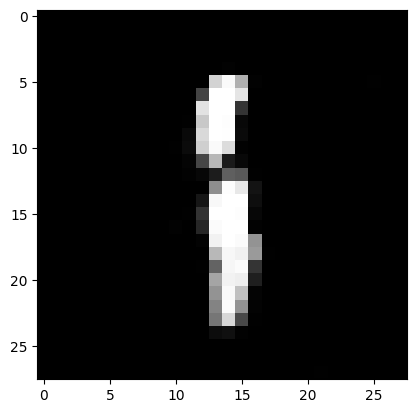

Epoch: 23550
loss_g: 0.7134131193161011 	loss_d: 1.1285357475280762
Epoch: 23600
loss_g: 1.110689401626587 	loss_d: 0.987243115901947
Epoch: 23650
loss_g: 0.8304556012153625 	loss_d: 1.1267259120941162
Epoch: 23700
loss_g: 0.7513085007667542 	loss_d: 1.1733226776123047
Epoch: 23750
loss_g: 0.7668114900588989 	loss_d: 0.9346814155578613
Ploting:  6


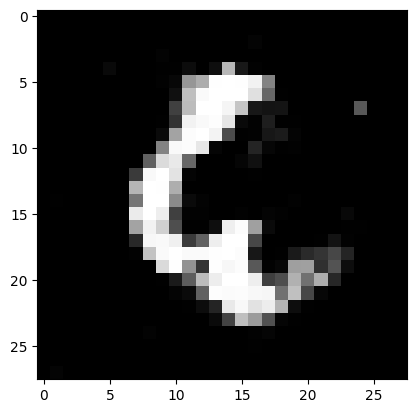

Ploting:  1


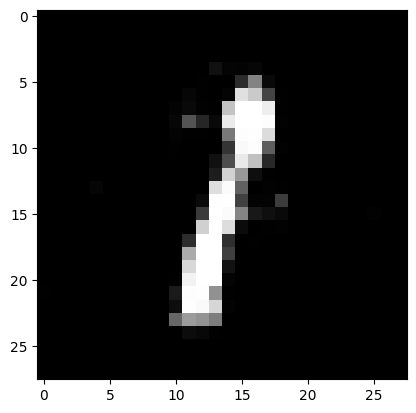

Ploting:  3


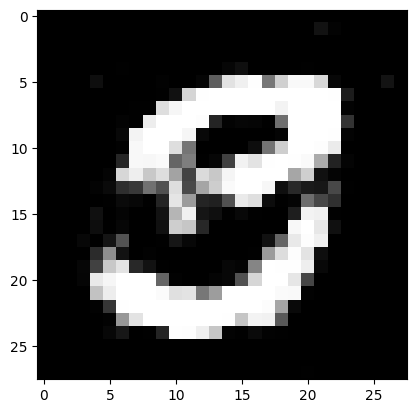

Ploting:  6


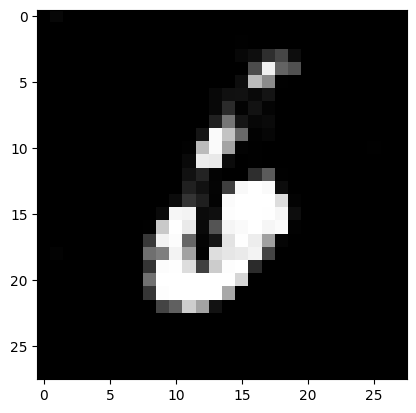

Ploting:  4


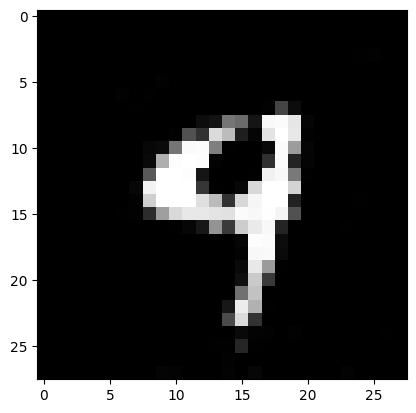

Epoch: 23800
loss_g: 0.9669654369354248 	loss_d: 1.1023075580596924
Epoch: 23850
loss_g: 1.023730754852295 	loss_d: 1.1531245708465576
Epoch: 23900
loss_g: 1.08499276638031 	loss_d: 0.9722017049789429
Epoch: 23950
loss_g: 0.907612681388855 	loss_d: 1.1241246461868286
Epoch: 24000
loss_g: 0.8805020451545715 	loss_d: 1.172845482826233
Ploting:  8


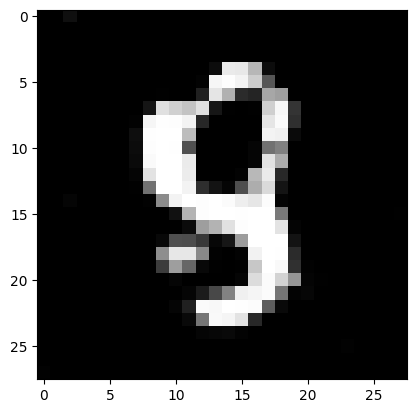

Ploting:  3


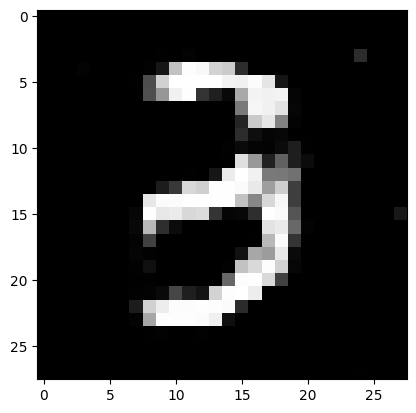

Ploting:  1


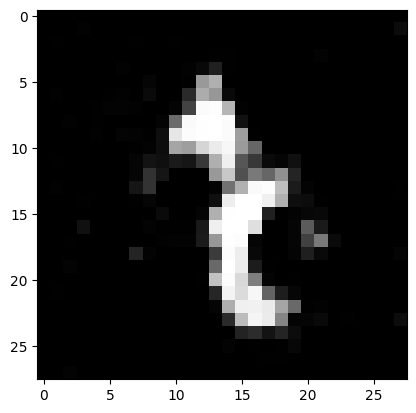

Ploting:  8


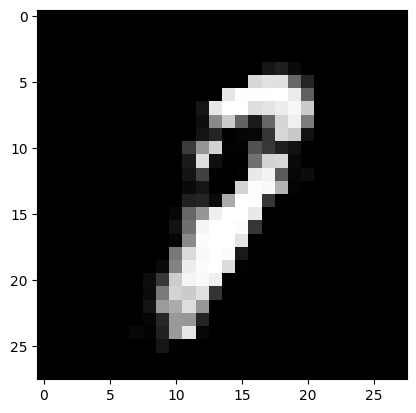

Ploting:  0


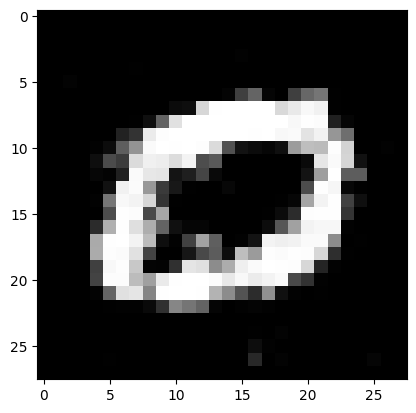

Epoch: 24050
loss_g: 1.1718058586120605 	loss_d: 1.108959436416626
Epoch: 24100
loss_g: 1.1555161476135254 	loss_d: 1.1339654922485352
Epoch: 24150
loss_g: 1.245439887046814 	loss_d: 1.12391996383667
Epoch: 24200
loss_g: 1.0431840419769287 	loss_d: 1.104407548904419
Epoch: 24250
loss_g: 1.011100172996521 	loss_d: 1.0782923698425293
Ploting:  9


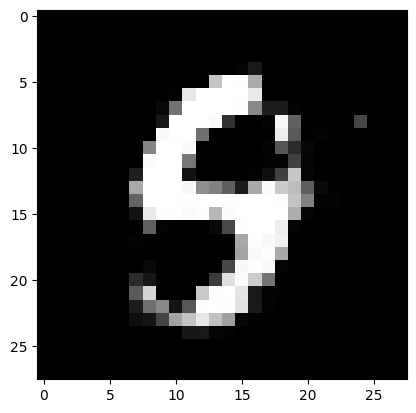

Ploting:  3


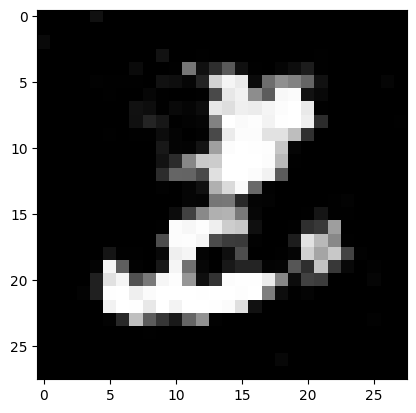

Ploting:  4


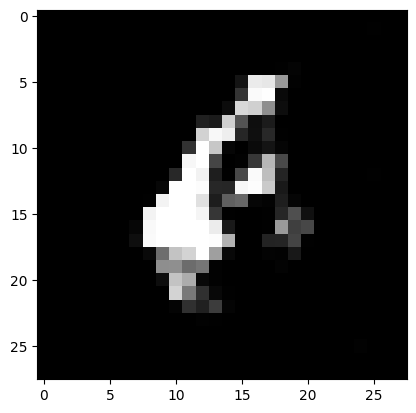

Ploting:  9


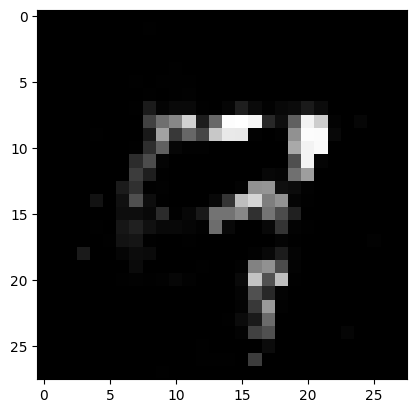

Ploting:  7


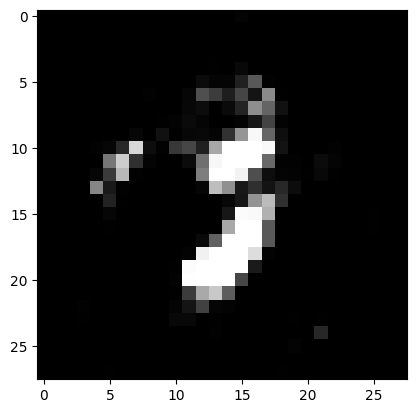

Epoch: 24300
loss_g: 1.5207334756851196 	loss_d: 1.2215875387191772
Epoch: 24350
loss_g: 0.9677784442901611 	loss_d: 1.1104340553283691
Epoch: 24400
loss_g: 1.2170329093933105 	loss_d: 1.1076596975326538
Epoch: 24450
loss_g: 1.0931228399276733 	loss_d: 1.158520221710205
Epoch: 24500
loss_g: 1.0245094299316406 	loss_d: 1.1145998239517212
Ploting:  3


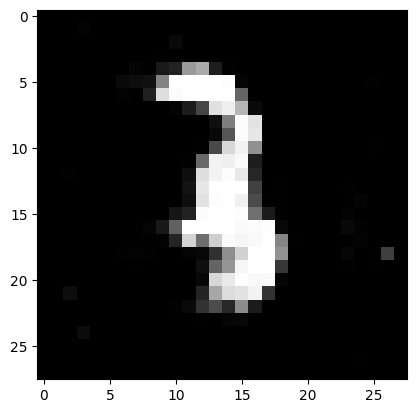

Ploting:  9


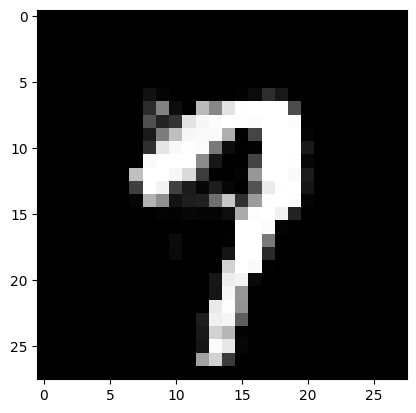

Ploting:  0


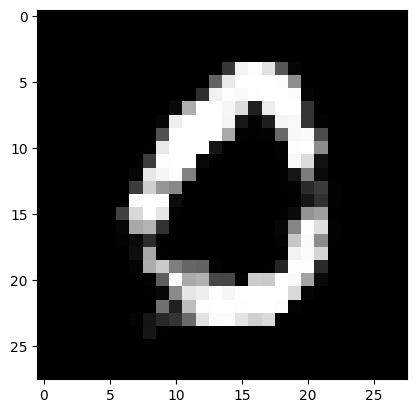

Ploting:  3


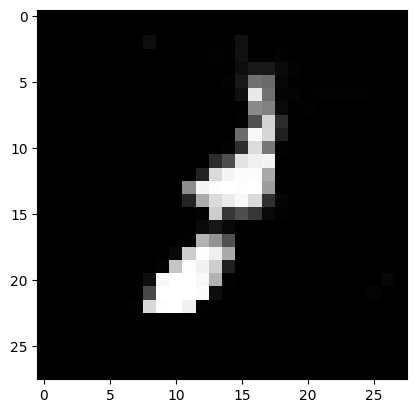

Ploting:  8


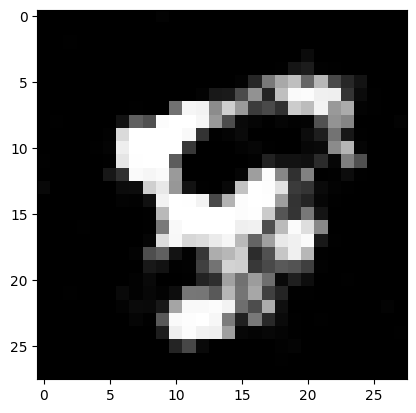

Epoch: 24550
loss_g: 1.4203400611877441 	loss_d: 1.2659966945648193
Epoch: 24600
loss_g: 0.8442898988723755 	loss_d: 1.0584251880645752
Epoch: 24650
loss_g: 0.9451161026954651 	loss_d: 1.0607670545578003
Epoch: 24700
loss_g: 1.1154494285583496 	loss_d: 1.0013757944107056
Epoch: 24750
loss_g: 1.1679373979568481 	loss_d: 1.0407427549362183
Ploting:  3


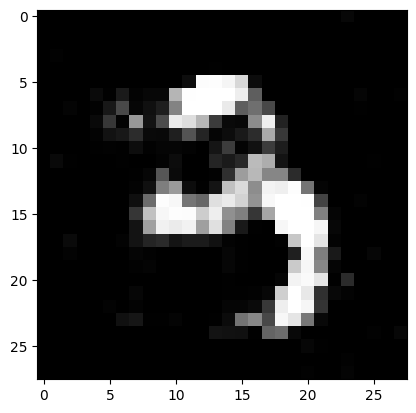

Ploting:  3


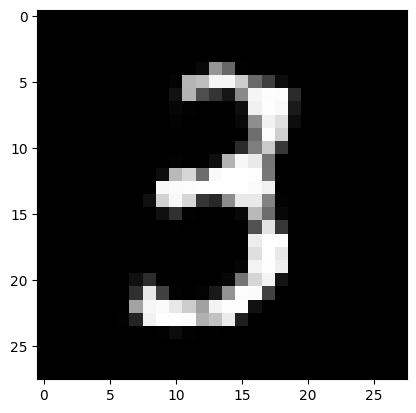

Ploting:  8


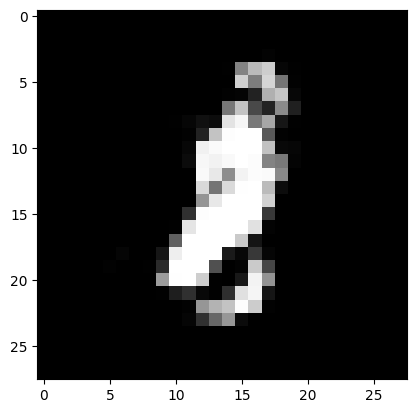

Ploting:  9


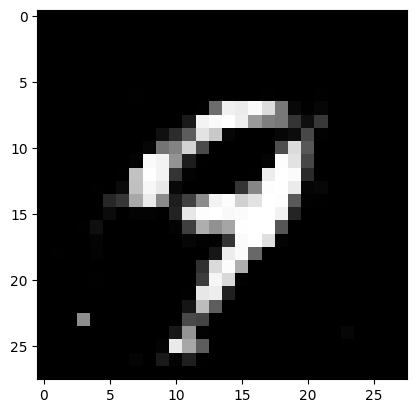

Ploting:  0


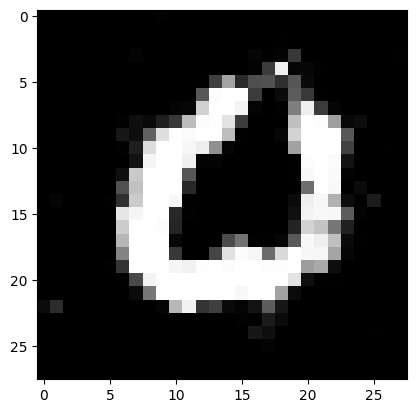

Epoch: 24800
loss_g: 1.3119488954544067 	loss_d: 1.0975637435913086
Epoch: 24850
loss_g: 1.0633463859558105 	loss_d: 1.1025333404541016
Epoch: 24900
loss_g: 1.0840193033218384 	loss_d: 1.1042498350143433
Epoch: 24950
loss_g: 0.9498378038406372 	loss_d: 1.121938705444336
Epoch: 25000
loss_g: 0.9224233627319336 	loss_d: 1.103759527206421
Ploting:  5


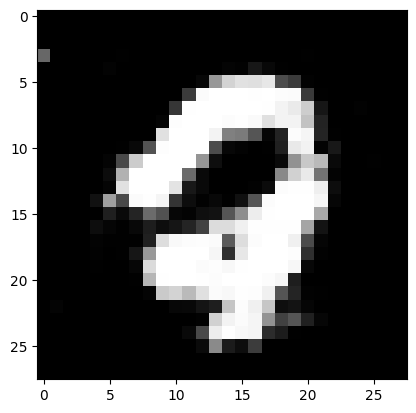

Ploting:  3


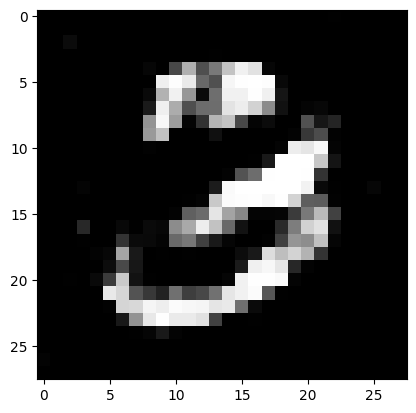

Ploting:  7


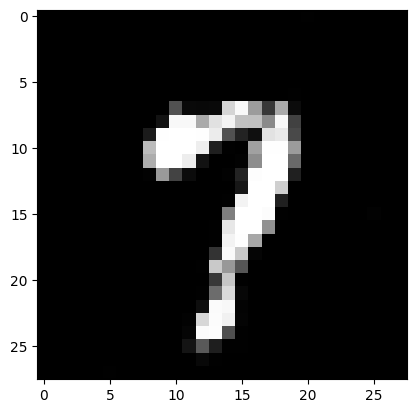

Ploting:  3


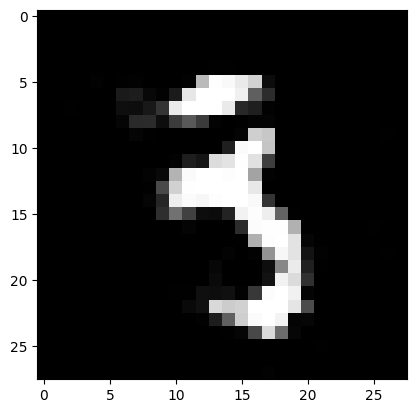

Ploting:  5


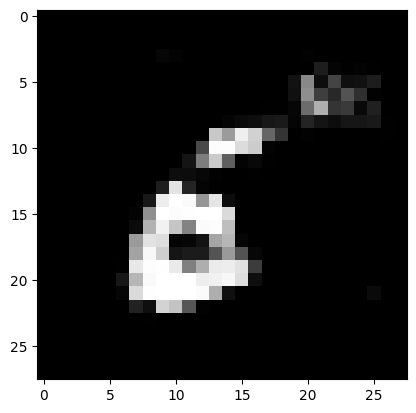

Epoch: 25050
loss_g: 1.0444693565368652 	loss_d: 1.0523297786712646
Epoch: 25100
loss_g: 1.1990869045257568 	loss_d: 1.111837387084961
Epoch: 25150
loss_g: 1.1414463520050049 	loss_d: 1.1192981004714966
Epoch: 25200
loss_g: 1.1845518350601196 	loss_d: 1.239778757095337
Epoch: 25250
loss_g: 1.0677578449249268 	loss_d: 1.3062094449996948
Ploting:  8


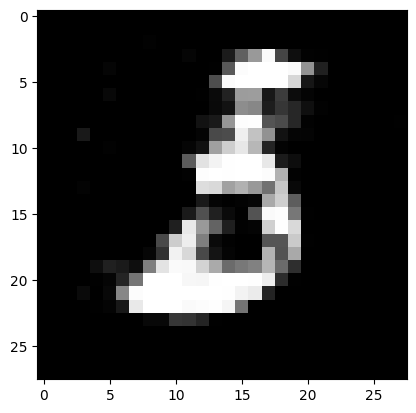

Ploting:  7


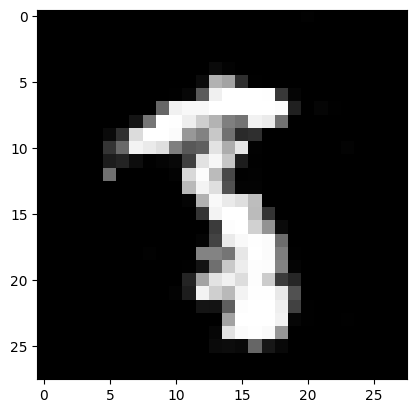

Ploting:  9


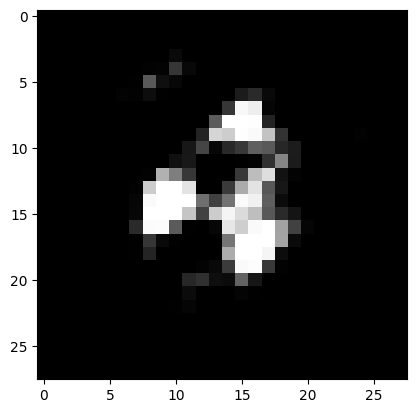

Ploting:  9


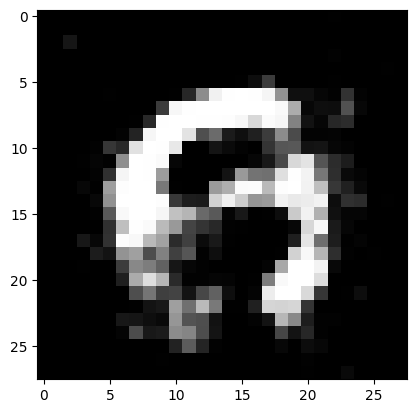

Ploting:  4


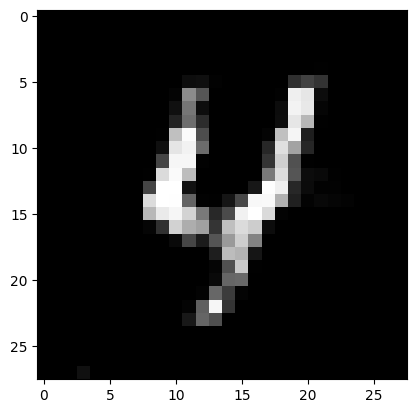

Epoch: 25300
loss_g: 0.7927446365356445 	loss_d: 1.1597740650177002
Epoch: 25350
loss_g: 1.0025012493133545 	loss_d: 1.1390169858932495
Epoch: 25400
loss_g: 1.1411352157592773 	loss_d: 1.2509396076202393
Epoch: 25450
loss_g: 1.2678208351135254 	loss_d: 1.048089623451233
Epoch: 25500
loss_g: 1.0586392879486084 	loss_d: 1.1678521633148193
Ploting:  5


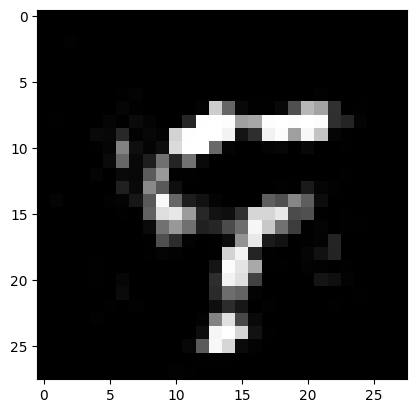

Ploting:  5


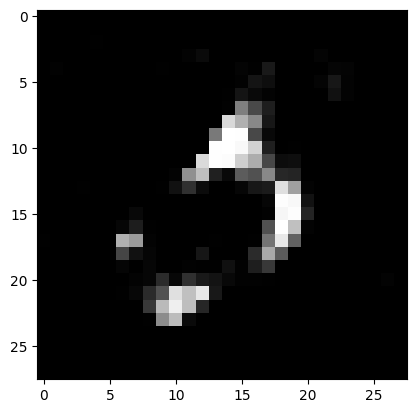

Ploting:  2


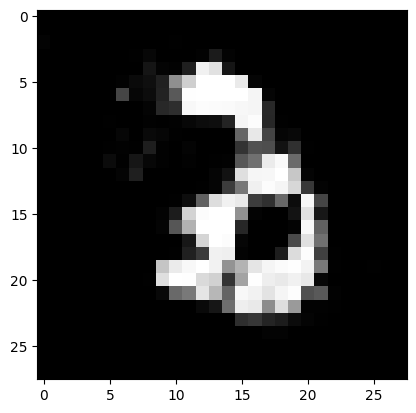

Ploting:  3


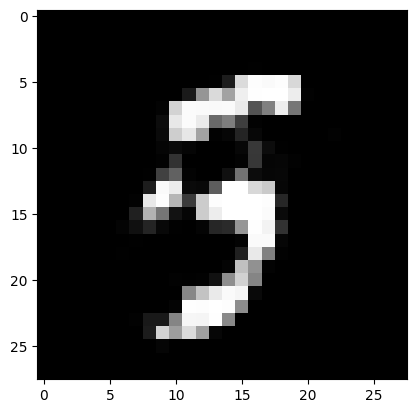

Ploting:  8


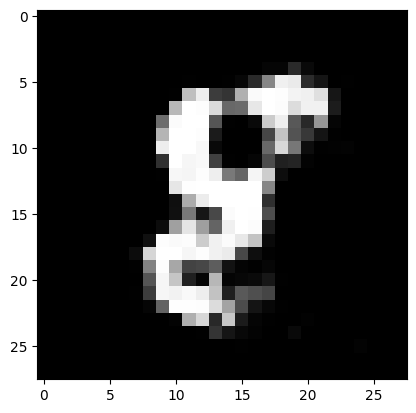

Epoch: 25550
loss_g: 0.9583696126937866 	loss_d: 1.092881441116333
Epoch: 25600
loss_g: 0.9827208518981934 	loss_d: 1.183175802230835
Epoch: 25650
loss_g: 0.9742648601531982 	loss_d: 1.0676392316818237
Epoch: 25700
loss_g: 1.1930227279663086 	loss_d: 1.2377673387527466
Epoch: 25750
loss_g: 0.9958837032318115 	loss_d: 1.0913788080215454
Ploting:  3


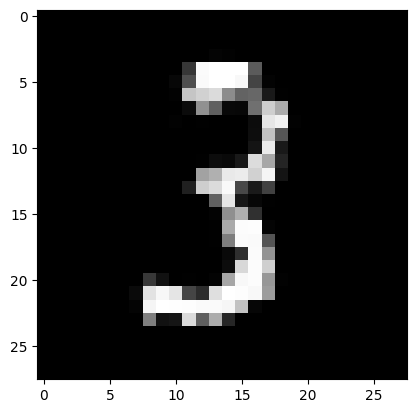

Ploting:  3


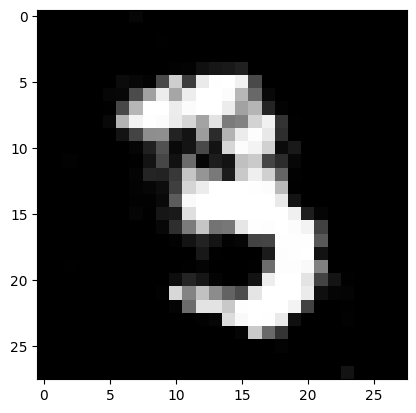

Ploting:  0


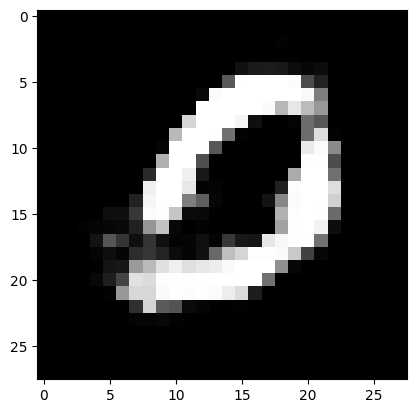

Ploting:  5


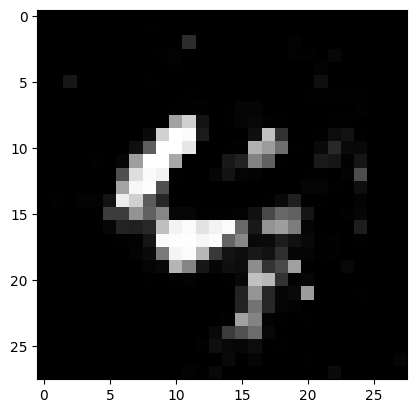

Ploting:  7


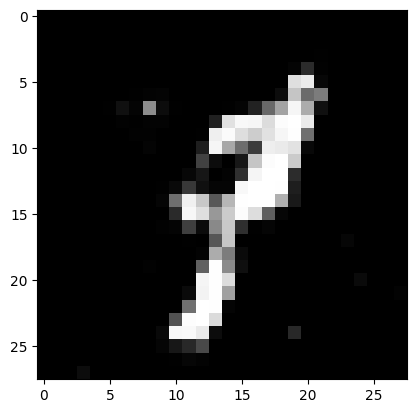

Epoch: 25800
loss_g: 0.9405220746994019 	loss_d: 1.162784457206726
Epoch: 25850
loss_g: 0.8534884452819824 	loss_d: 1.2324514389038086
Epoch: 25900
loss_g: 1.5295109748840332 	loss_d: 1.1979296207427979
Epoch: 25950
loss_g: 0.942652702331543 	loss_d: 1.1282076835632324
Epoch: 26000
loss_g: 1.3421292304992676 	loss_d: 1.2899631261825562
Ploting:  8


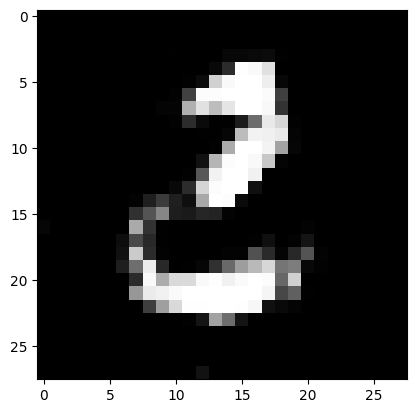

Ploting:  8


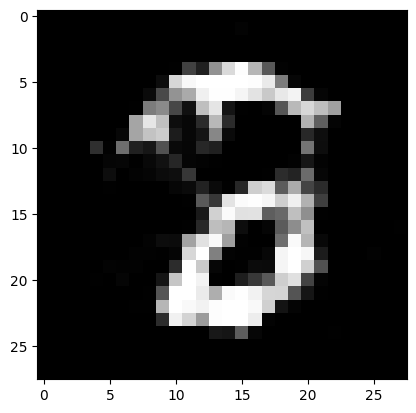

Ploting:  4


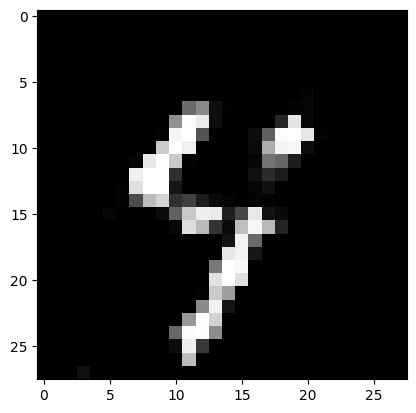

Ploting:  8


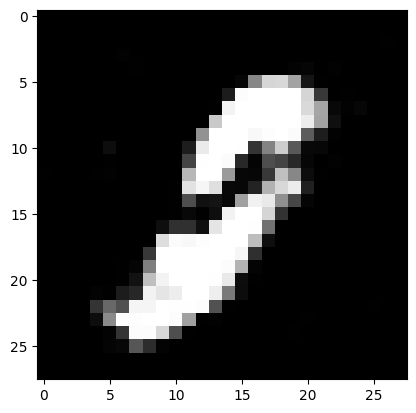

Ploting:  4


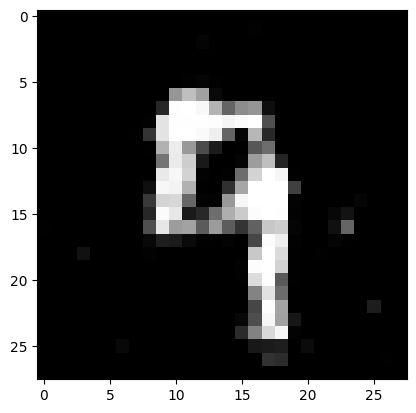

Epoch: 26050
loss_g: 1.0130305290222168 	loss_d: 1.0286743640899658
Epoch: 26100
loss_g: 1.155563235282898 	loss_d: 1.2094764709472656
Epoch: 26150
loss_g: 0.9897841215133667 	loss_d: 1.1455670595169067
Epoch: 26200
loss_g: 1.2286262512207031 	loss_d: 1.2628189325332642
Epoch: 26250
loss_g: 1.0094128847122192 	loss_d: 1.0716361999511719
Ploting:  5


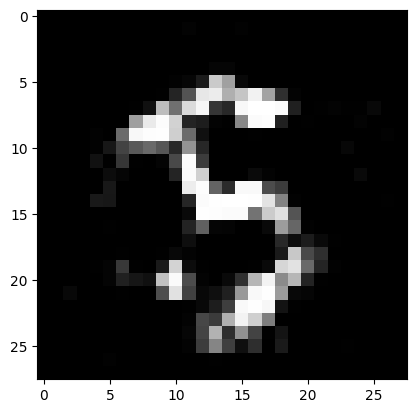

Ploting:  0


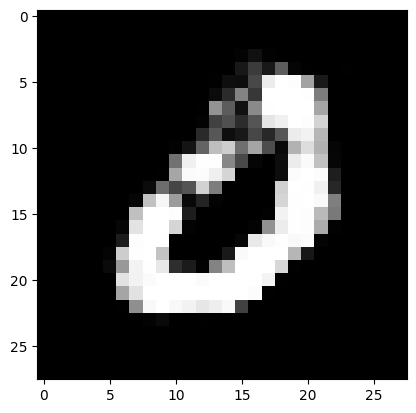

Ploting:  4


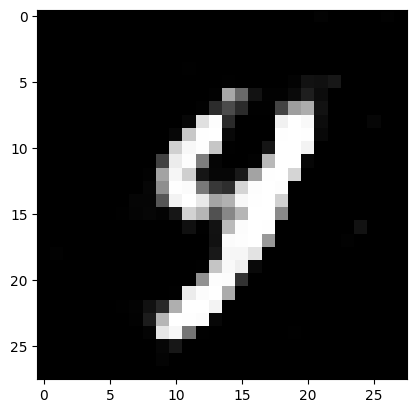

Ploting:  1


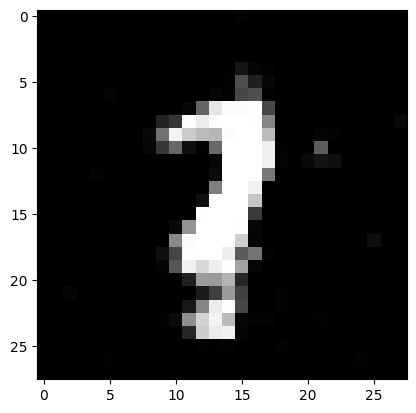

Ploting:  9


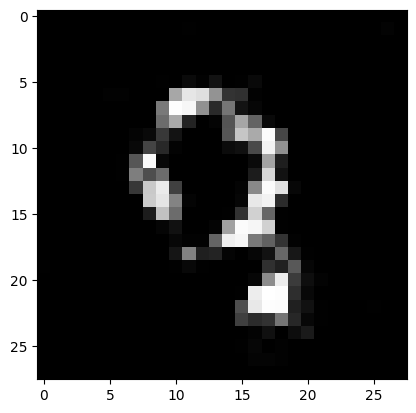

Epoch: 26300
loss_g: 1.0351653099060059 	loss_d: 1.0505363941192627
Epoch: 26350
loss_g: 0.9681864380836487 	loss_d: 1.1324059963226318
Epoch: 26400
loss_g: 1.1904706954956055 	loss_d: 1.1944773197174072
Epoch: 26450
loss_g: 1.2748675346374512 	loss_d: 1.1942797899246216
Epoch: 26500
loss_g: 0.6936013698577881 	loss_d: 1.2439278364181519
Ploting:  3


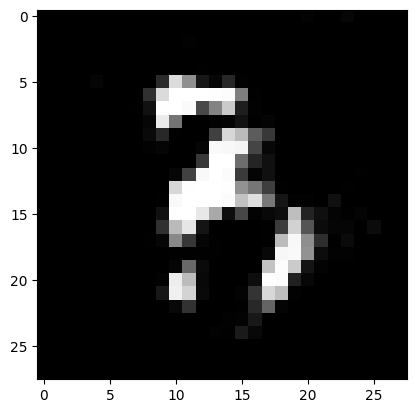

Ploting:  2


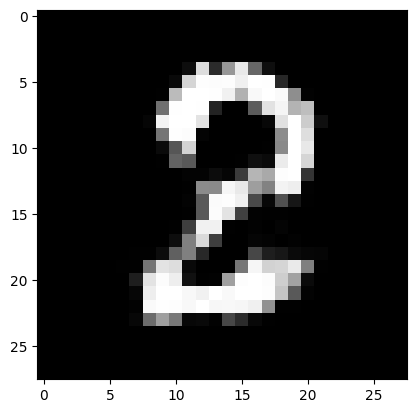

Ploting:  5


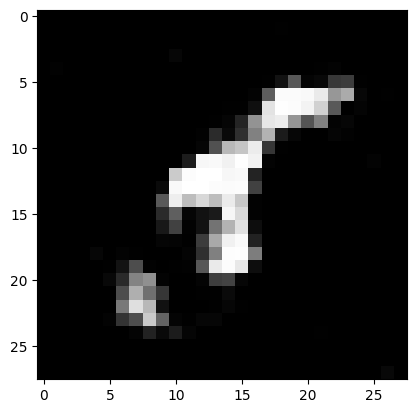

Ploting:  6


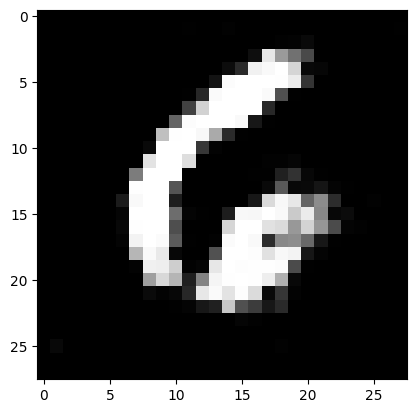

Ploting:  7


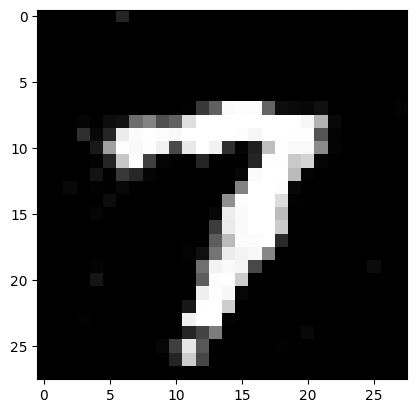

Epoch: 26550
loss_g: 1.4440076351165771 	loss_d: 1.177354335784912
Epoch: 26600
loss_g: 1.0957348346710205 	loss_d: 1.1508574485778809
Epoch: 26650
loss_g: 1.286429524421692 	loss_d: 1.3446037769317627
Epoch: 26700
loss_g: 1.3259788751602173 	loss_d: 1.0198251008987427
Epoch: 26750
loss_g: 1.3976051807403564 	loss_d: 1.1032707691192627
Ploting:  3


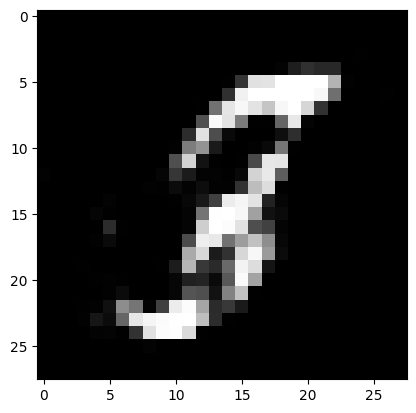

Ploting:  9


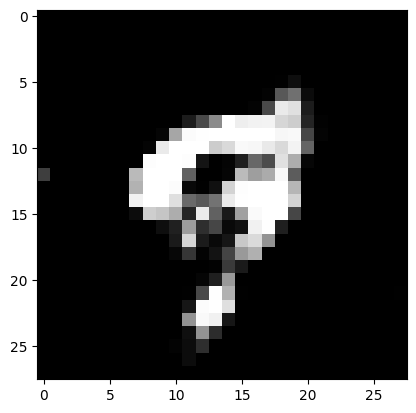

Ploting:  2


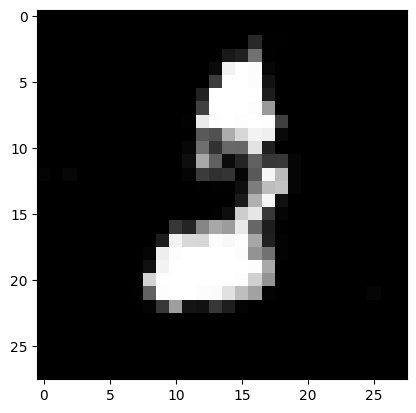

Ploting:  2


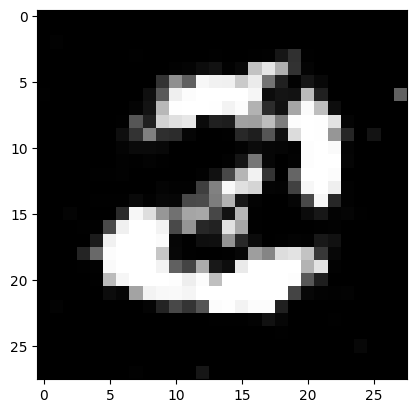

Ploting:  3


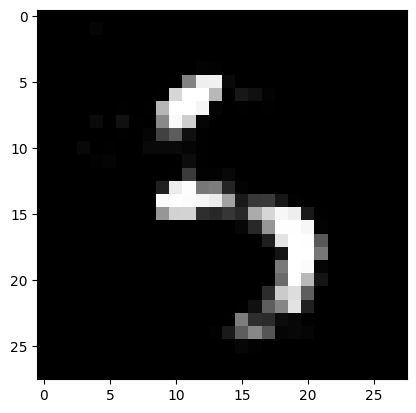

Epoch: 26800
loss_g: 1.2664592266082764 	loss_d: 1.1552209854125977
Epoch: 26850
loss_g: 1.095815896987915 	loss_d: 1.1164482831954956
Epoch: 26900
loss_g: 1.0538907051086426 	loss_d: 1.2077975273132324
Epoch: 26950
loss_g: 0.9300892949104309 	loss_d: 1.1796541213989258
Epoch: 27000
loss_g: 1.1137619018554688 	loss_d: 1.077437162399292
Ploting:  2


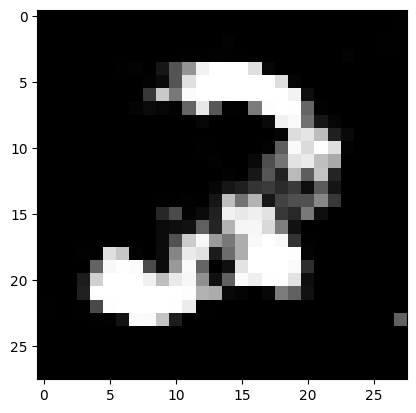

Ploting:  6


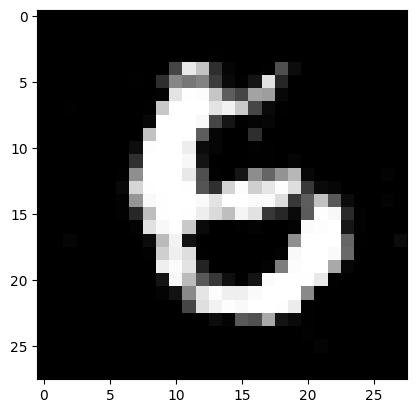

Ploting:  1


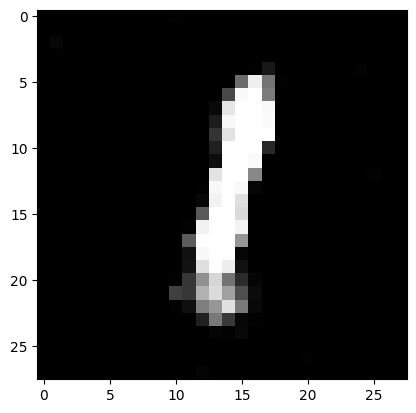

Ploting:  7


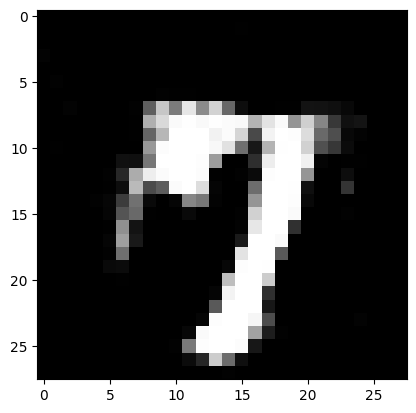

Ploting:  7


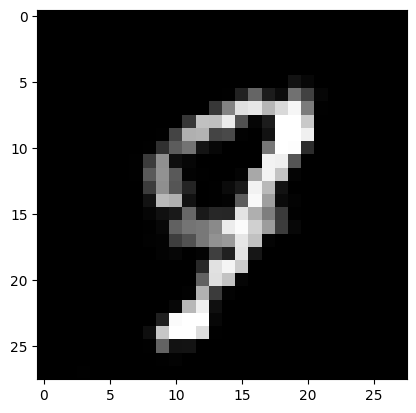

Epoch: 27050
loss_g: 1.4040327072143555 	loss_d: 1.066167950630188
Epoch: 27100
loss_g: 1.2976715564727783 	loss_d: 1.1523551940917969
Epoch: 27150
loss_g: 0.8639473915100098 	loss_d: 1.1249995231628418
Epoch: 27200
loss_g: 1.169260025024414 	loss_d: 1.0709350109100342
Epoch: 27250
loss_g: 0.9015945196151733 	loss_d: 1.1381592750549316
Ploting:  4


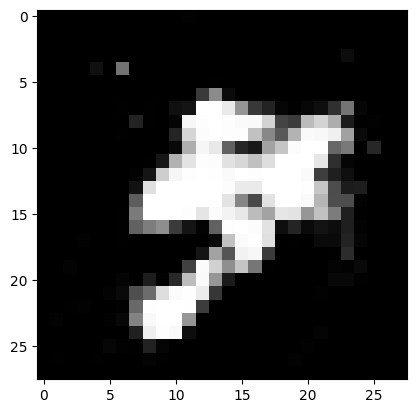

Ploting:  4


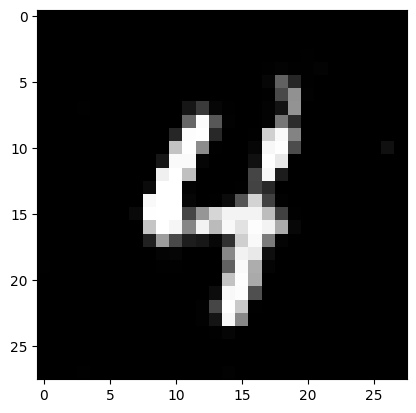

Ploting:  5


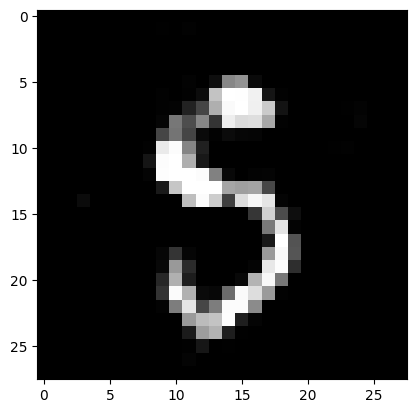

Ploting:  1


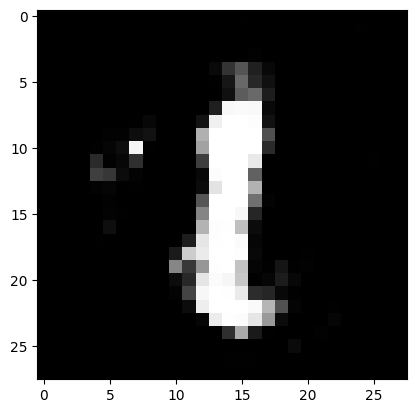

Ploting:  2


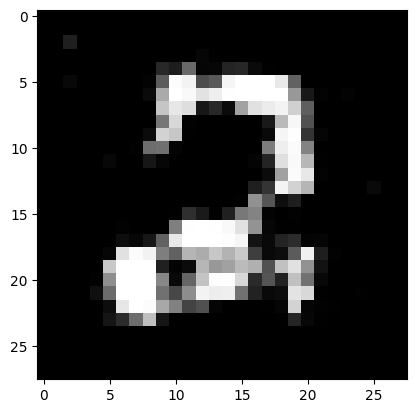

Epoch: 27300
loss_g: 1.4060499668121338 	loss_d: 1.2099075317382812
Epoch: 27350
loss_g: 1.4268877506256104 	loss_d: 1.2656797170639038
Epoch: 27400
loss_g: 0.9925503730773926 	loss_d: 1.2240259647369385
Epoch: 27450
loss_g: 0.9761055707931519 	loss_d: 1.2574595212936401
Epoch: 27500
loss_g: 1.2369158267974854 	loss_d: 1.1699086427688599
Ploting:  8


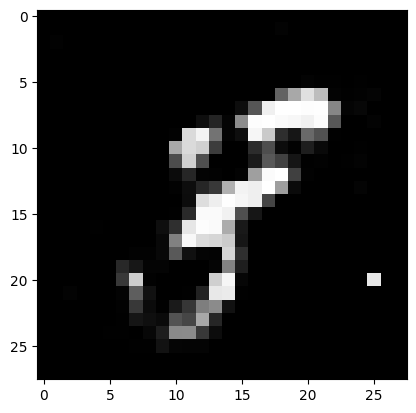

Ploting:  6


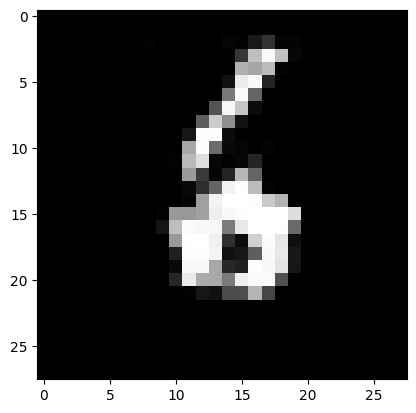

Ploting:  5


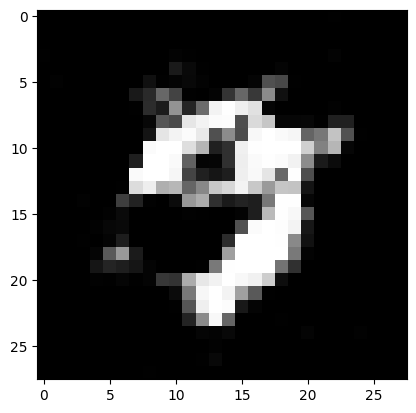

Ploting:  2


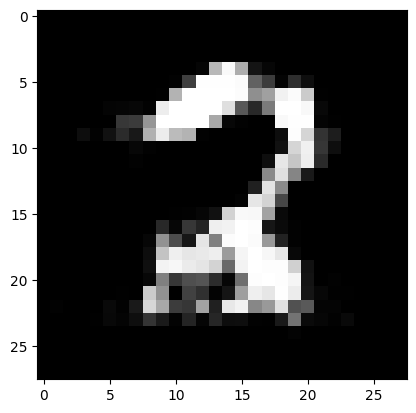

Ploting:  3


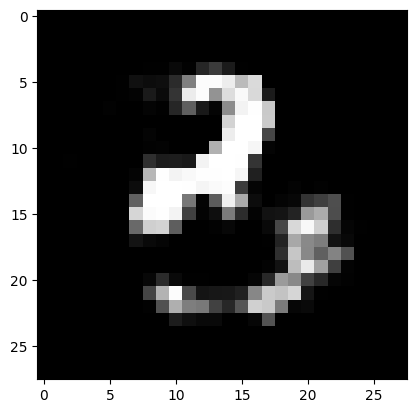

Epoch: 27550
loss_g: 1.0521141290664673 	loss_d: 1.160459041595459
Epoch: 27600
loss_g: 0.9926638603210449 	loss_d: 1.1288411617279053
Epoch: 27650
loss_g: 1.2528400421142578 	loss_d: 1.1289050579071045
Epoch: 27700
loss_g: 0.934812068939209 	loss_d: 1.0937646627426147
Epoch: 27750
loss_g: 1.1934401988983154 	loss_d: 1.215718150138855
Ploting:  5


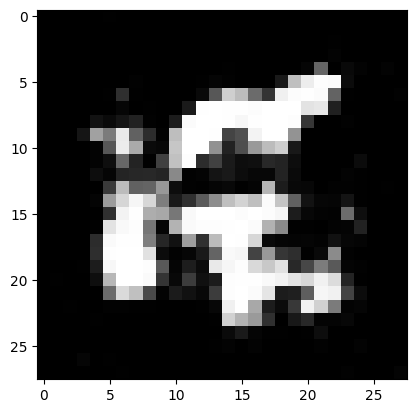

Ploting:  5


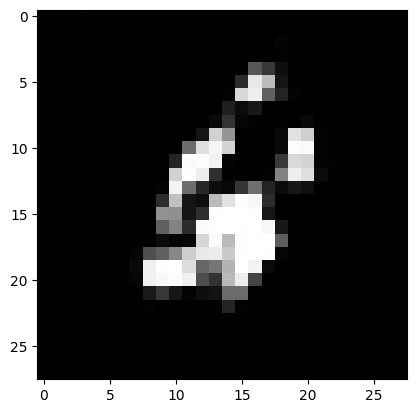

Ploting:  0


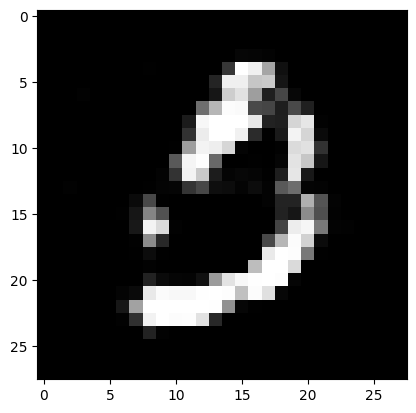

Ploting:  3


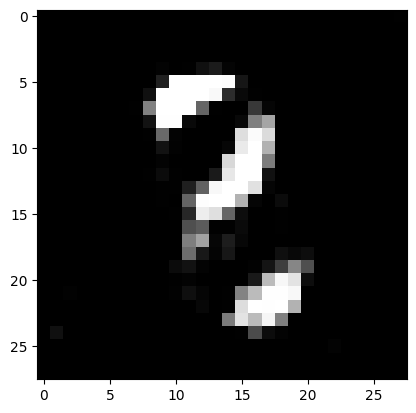

Ploting:  9


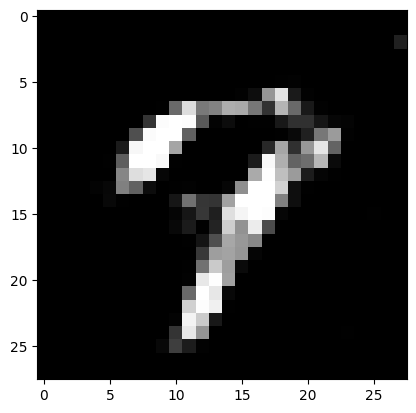

Epoch: 27800
loss_g: 1.1815526485443115 	loss_d: 1.1827112436294556
Epoch: 27850
loss_g: 0.9694907069206238 	loss_d: 1.1622684001922607
Epoch: 27900
loss_g: 0.7296046018600464 	loss_d: 1.4435555934906006
Epoch: 27950
loss_g: 0.8557817935943604 	loss_d: 1.003901720046997
Epoch: 28000
loss_g: 0.8436648845672607 	loss_d: 1.2133734226226807
Ploting:  7


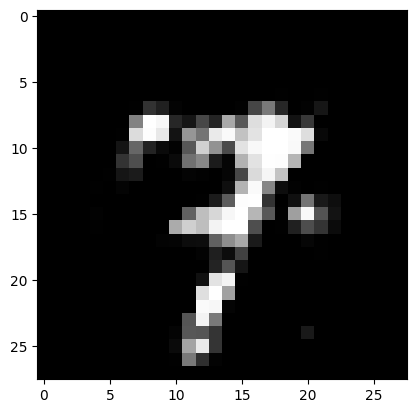

Ploting:  5


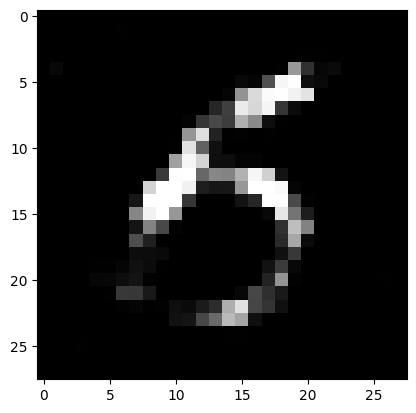

Ploting:  8


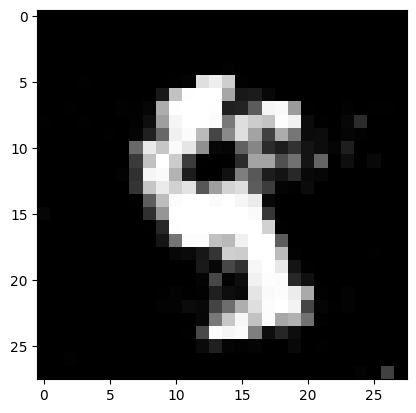

Ploting:  3


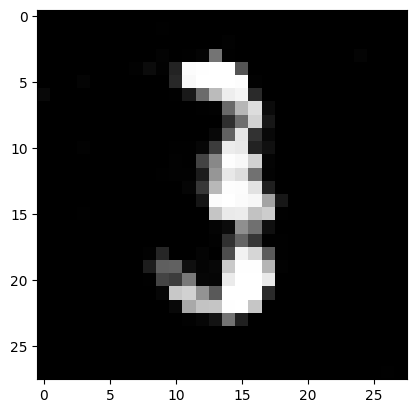

Ploting:  2


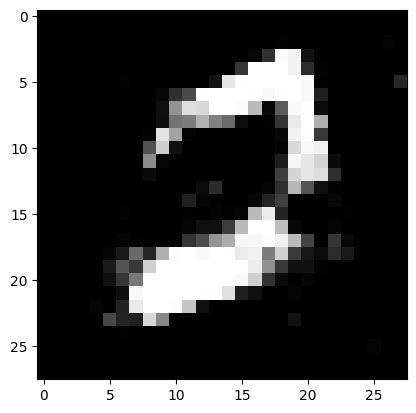

Epoch: 28050
loss_g: 1.2961342334747314 	loss_d: 1.20855712890625
Epoch: 28100
loss_g: 0.9922407865524292 	loss_d: 1.1006301641464233
Epoch: 28150
loss_g: 1.230212926864624 	loss_d: 1.073204517364502
Epoch: 28200
loss_g: 1.1396557092666626 	loss_d: 1.220045804977417
Epoch: 28250
loss_g: 1.3067662715911865 	loss_d: 1.2298213243484497
Ploting:  0


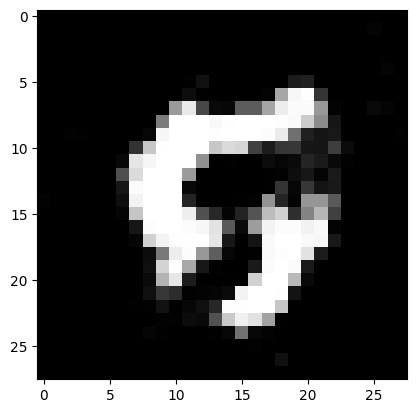

Ploting:  1


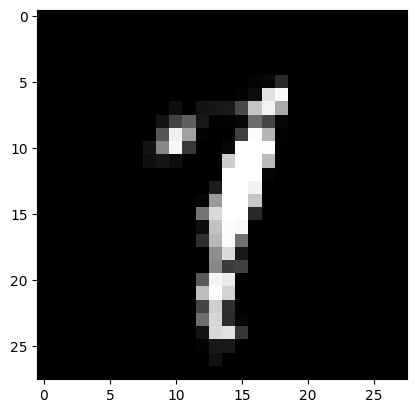

Ploting:  2


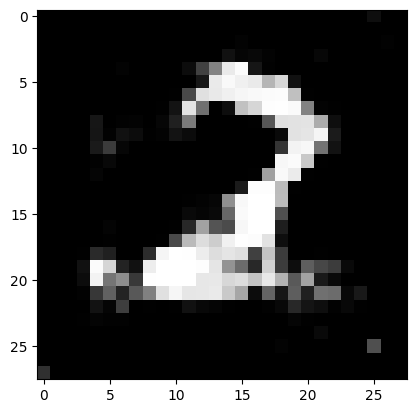

Ploting:  3


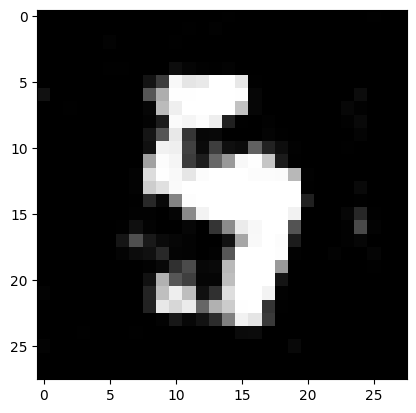

Ploting:  0


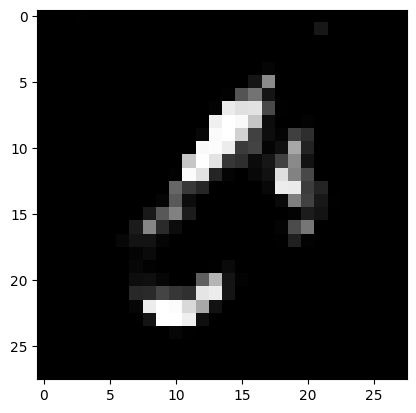

Epoch: 28300
loss_g: 0.9249511361122131 	loss_d: 1.1042042970657349
Epoch: 28350
loss_g: 0.9624135494232178 	loss_d: 1.0998826026916504
Epoch: 28400
loss_g: 1.1827189922332764 	loss_d: 1.1615641117095947
Epoch: 28450
loss_g: 1.1992781162261963 	loss_d: 1.0706983804702759
Epoch: 28500
loss_g: 1.0688608884811401 	loss_d: 1.1010518074035645
Ploting:  6


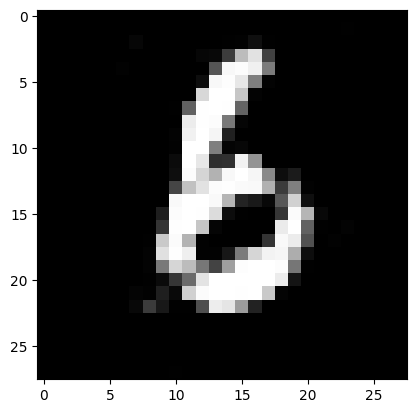

Ploting:  1


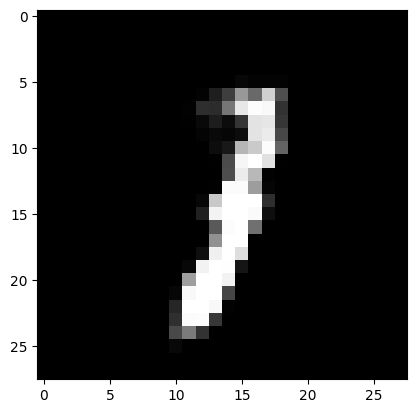

Ploting:  6


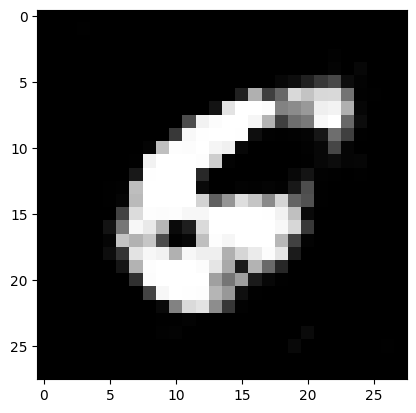

Ploting:  3


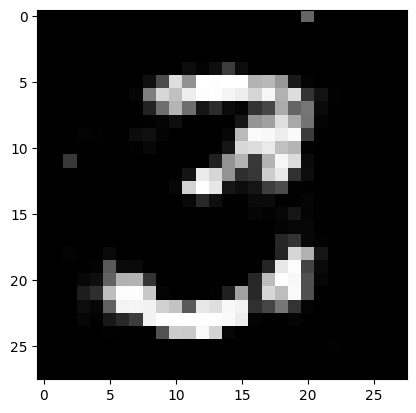

Ploting:  4


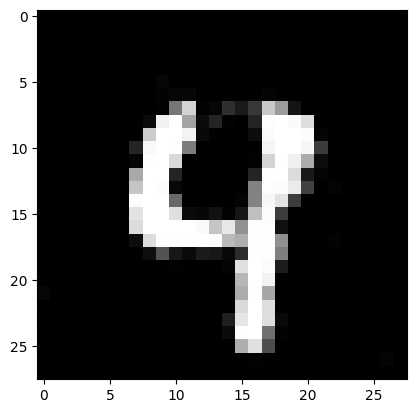

Epoch: 28550
loss_g: 1.2084578275680542 	loss_d: 1.1919087171554565
Epoch: 28600
loss_g: 1.439115285873413 	loss_d: 1.1826586723327637
Epoch: 28650
loss_g: 1.130577564239502 	loss_d: 1.1685514450073242
Epoch: 28700
loss_g: 0.9731266498565674 	loss_d: 1.2021832466125488
Epoch: 28750
loss_g: 0.9346351623535156 	loss_d: 1.0965687036514282
Ploting:  0


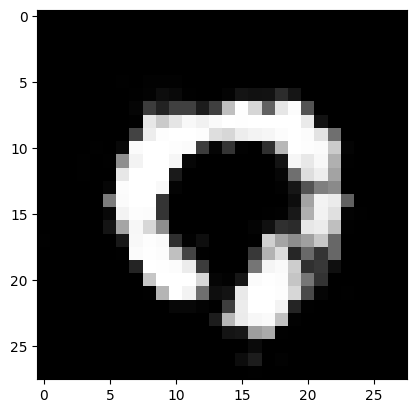

Ploting:  3


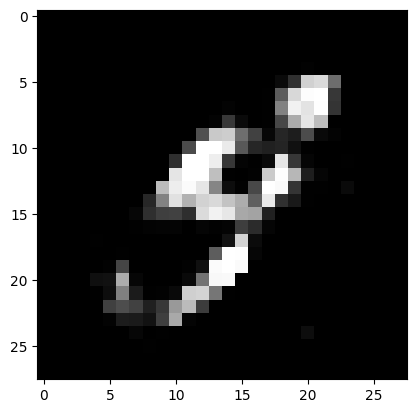

Ploting:  3


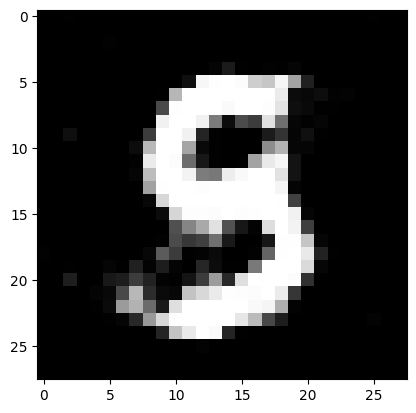

Ploting:  1


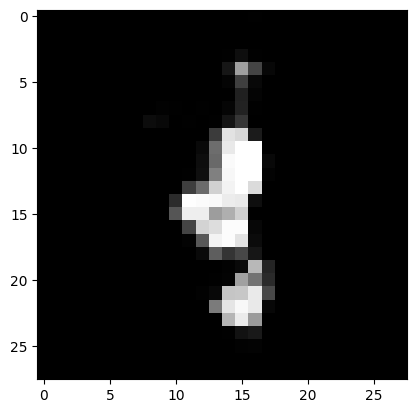

Ploting:  2


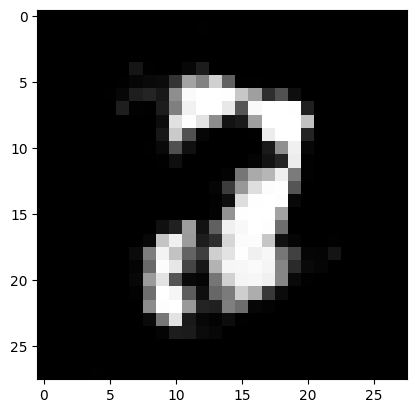

Epoch: 28800
loss_g: 0.9123550653457642 	loss_d: 1.0788021087646484
Epoch: 28850
loss_g: 1.657670259475708 	loss_d: 1.3080695867538452
Epoch: 28900
loss_g: 0.9389227032661438 	loss_d: 1.1040819883346558
Epoch: 28950
loss_g: 1.3700828552246094 	loss_d: 1.144851803779602
Epoch: 29000
loss_g: 1.0513184070587158 	loss_d: 1.1442840099334717
Ploting:  9


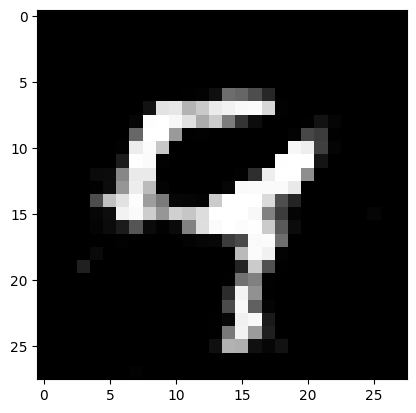

Ploting:  0


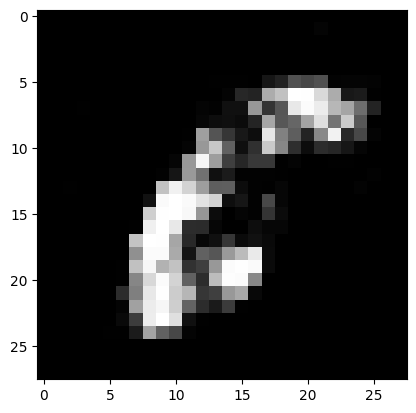

Ploting:  7


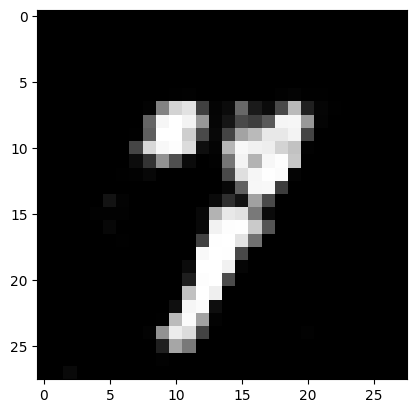

Ploting:  0


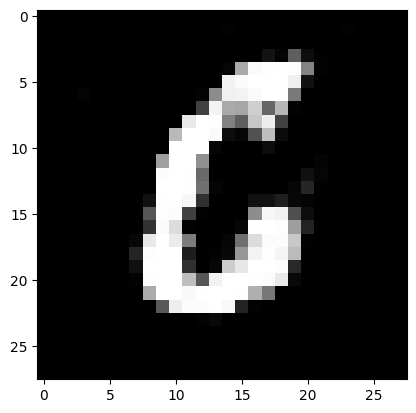

Ploting:  3


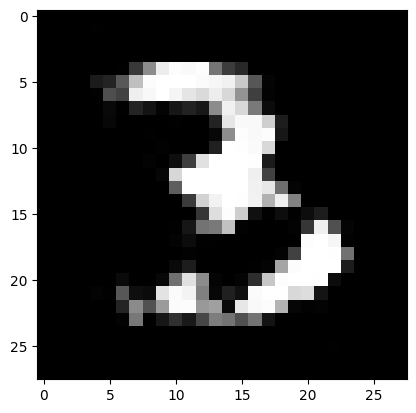

Epoch: 29050
loss_g: 1.2646512985229492 	loss_d: 1.0808887481689453
Epoch: 29100
loss_g: 1.5739901065826416 	loss_d: 1.3768243789672852
Epoch: 29150
loss_g: 0.9369691610336304 	loss_d: 1.1806700229644775
Epoch: 29200
loss_g: 1.288362979888916 	loss_d: 1.0915011167526245
Epoch: 29250
loss_g: 0.874147891998291 	loss_d: 1.029721736907959
Ploting:  0


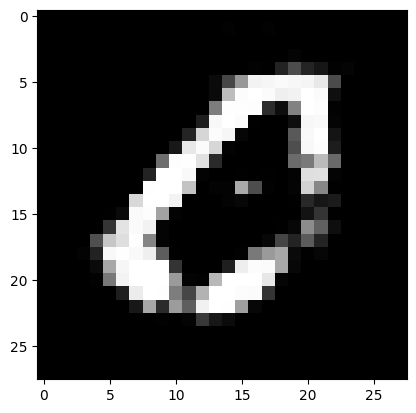

Ploting:  1


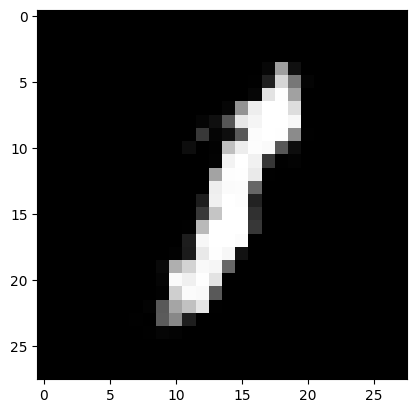

Ploting:  0


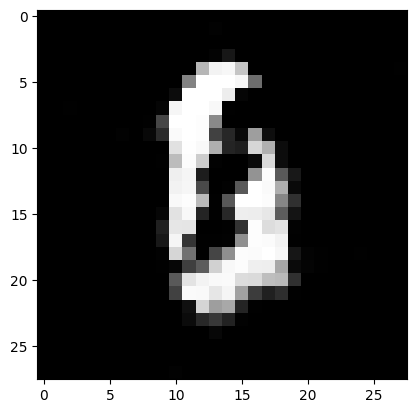

Ploting:  4


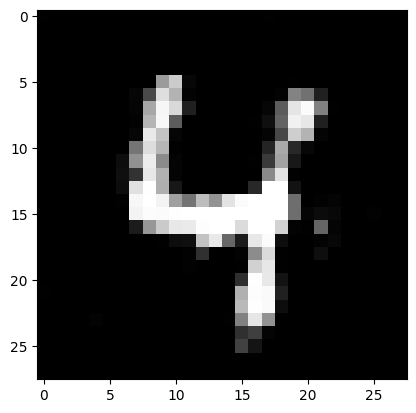

Ploting:  9


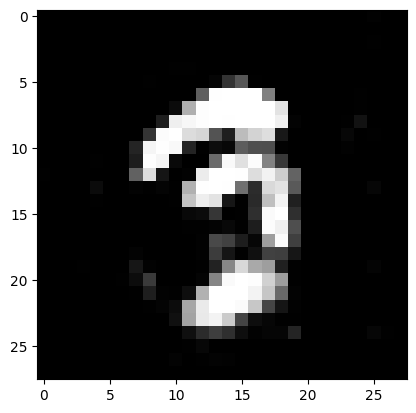

Epoch: 29300
loss_g: 0.9049423336982727 	loss_d: 1.1499574184417725
Epoch: 29350
loss_g: 1.2281272411346436 	loss_d: 1.2109297513961792
Epoch: 29400
loss_g: 0.8746203184127808 	loss_d: 1.1880195140838623
Epoch: 29450
loss_g: 1.0806514024734497 	loss_d: 1.227379560470581
Epoch: 29500
loss_g: 1.123328447341919 	loss_d: 1.0710874795913696
Ploting:  9


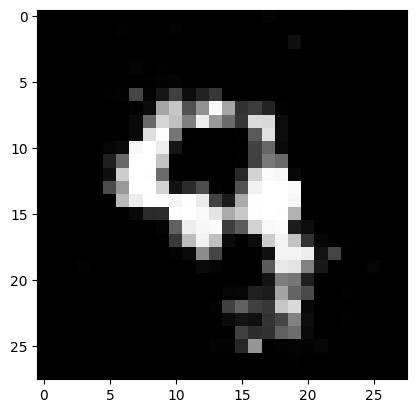

Ploting:  0


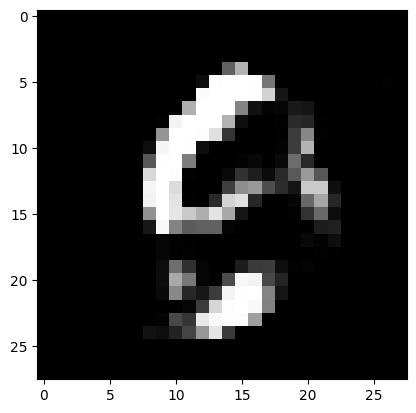

Ploting:  0


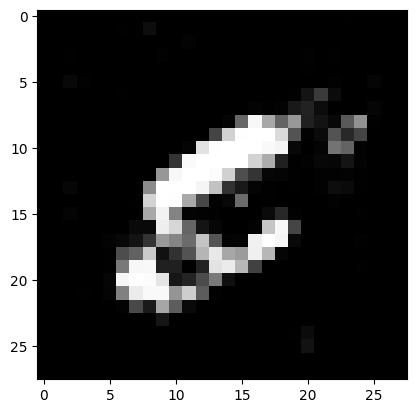

Ploting:  3


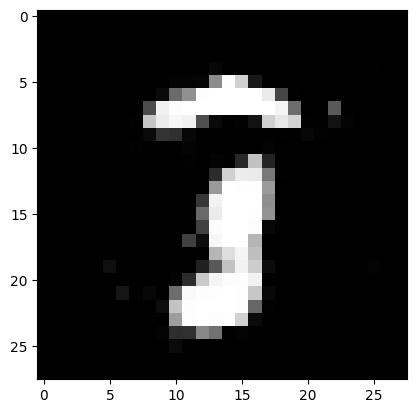

Ploting:  0


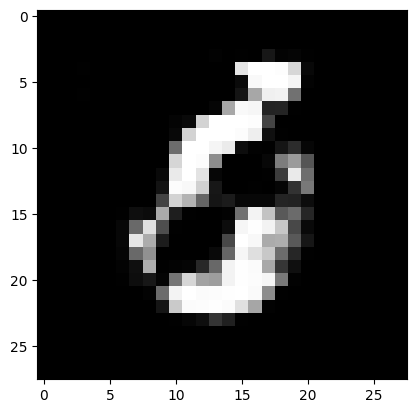

Epoch: 29550
loss_g: 0.9437258839607239 	loss_d: 1.303765058517456
Epoch: 29600
loss_g: 1.191110372543335 	loss_d: 1.0715970993041992
Epoch: 29650
loss_g: 1.334277868270874 	loss_d: 1.2926675081253052
Epoch: 29700
loss_g: 1.0896388292312622 	loss_d: 1.2129051685333252
Epoch: 29750
loss_g: 1.2337827682495117 	loss_d: 1.1742112636566162
Ploting:  9


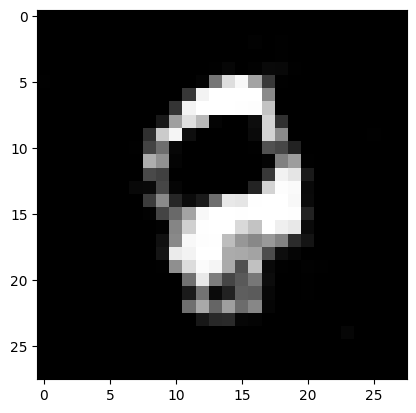

Ploting:  4


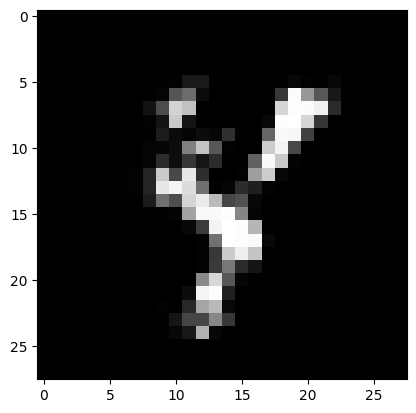

Ploting:  9


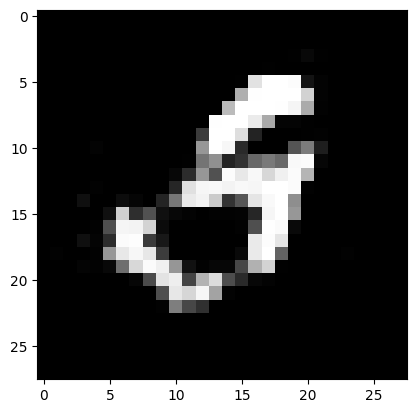

Ploting:  0


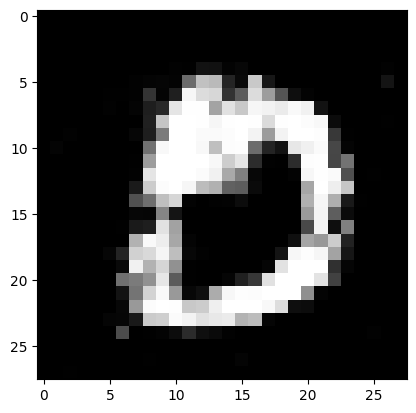

Ploting:  9


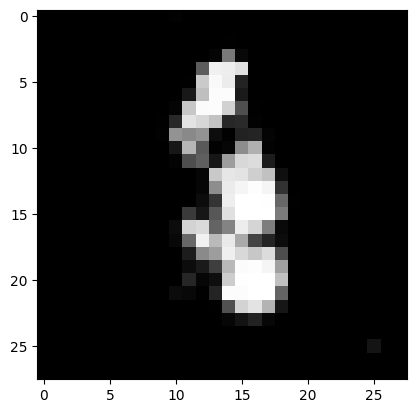

Epoch: 29800
loss_g: 0.8658171892166138 	loss_d: 1.2115861177444458
Epoch: 29850
loss_g: 1.3476706743240356 	loss_d: 1.0773632526397705
Epoch: 29900
loss_g: 1.0170414447784424 	loss_d: 1.2296868562698364
Epoch: 29950
loss_g: 0.7166838049888611 	loss_d: 1.2216920852661133
Epoch: 30000
loss_g: 1.00464928150177 	loss_d: 1.034941554069519
Ploting:  4


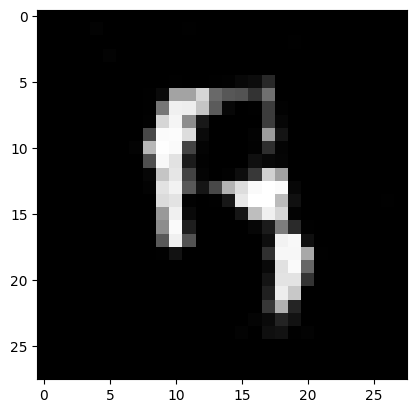

Ploting:  4


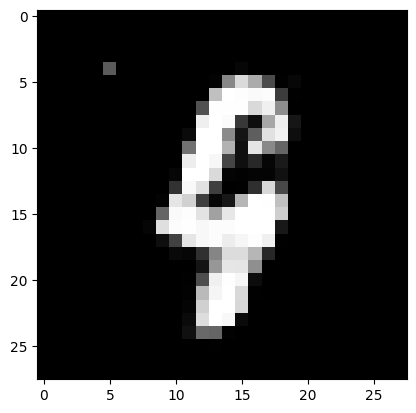

Ploting:  7


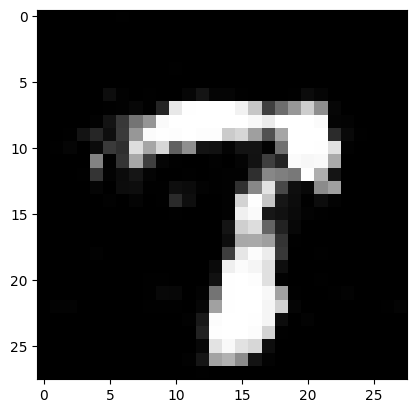

Ploting:  1


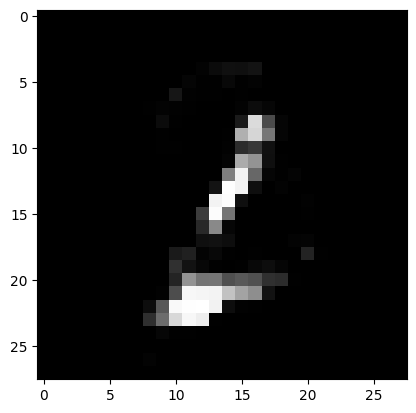

Ploting:  8


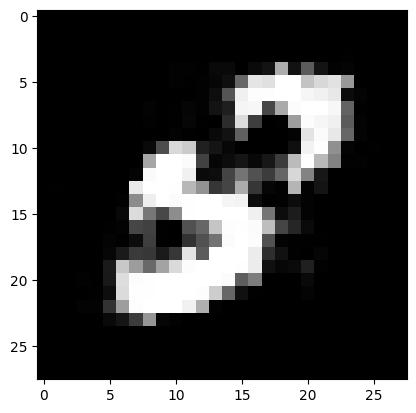

Epoch: 30050
loss_g: 0.5445401668548584 	loss_d: 1.4033042192459106
Epoch: 30100
loss_g: 0.8969434499740601 	loss_d: 1.2449853420257568
Epoch: 30150
loss_g: 1.188605546951294 	loss_d: 1.2240265607833862
Epoch: 30200
loss_g: 1.1867942810058594 	loss_d: 1.301997184753418
Epoch: 30250
loss_g: 1.098986029624939 	loss_d: 1.090011477470398
Ploting:  3


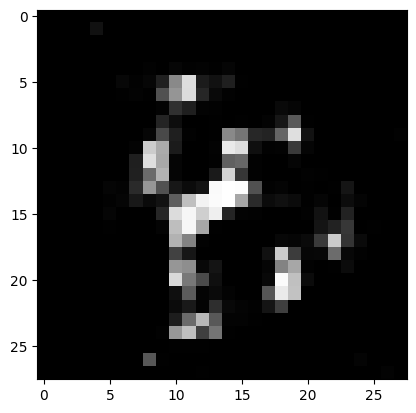

Ploting:  9


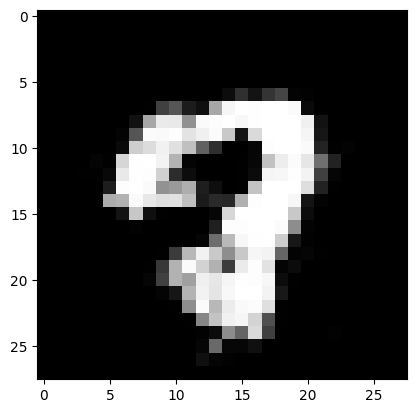

Ploting:  5


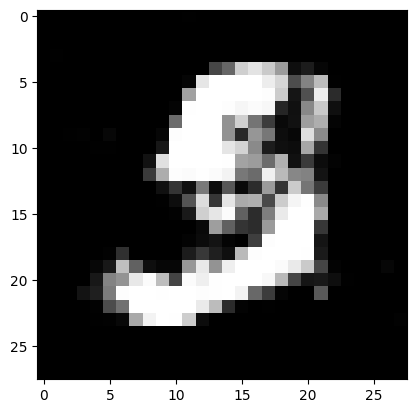

Ploting:  4


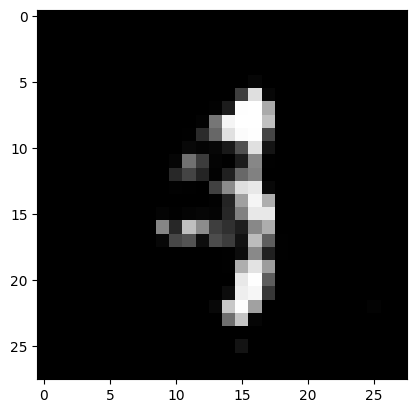

Ploting:  3


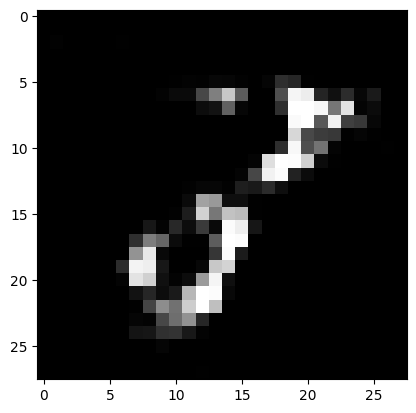

Epoch: 30300
loss_g: 1.4252328872680664 	loss_d: 1.086163878440857
Epoch: 30350
loss_g: 1.3649706840515137 	loss_d: 1.1685047149658203
Epoch: 30400
loss_g: 0.9866631627082825 	loss_d: 1.1046947240829468
Epoch: 30450
loss_g: 1.126720666885376 	loss_d: 1.1499865055084229
Epoch: 30500
loss_g: 1.0901987552642822 	loss_d: 1.0662007331848145
Ploting:  0


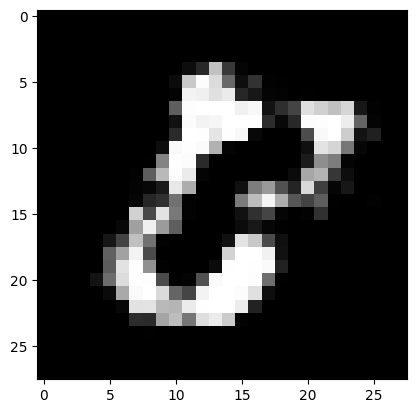

Ploting:  6


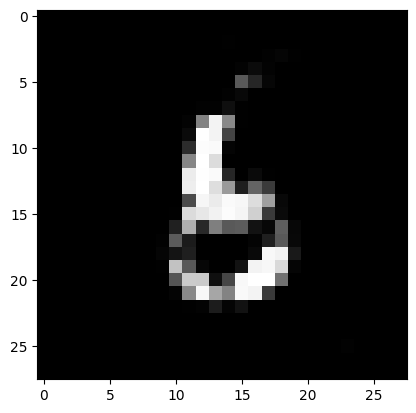

Ploting:  1


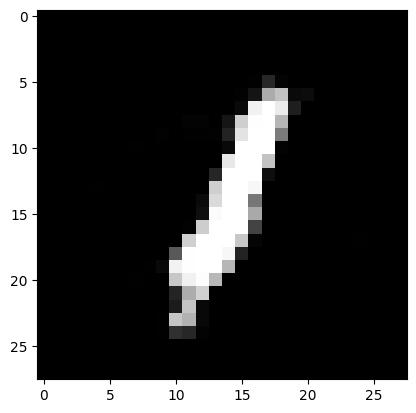

Ploting:  4


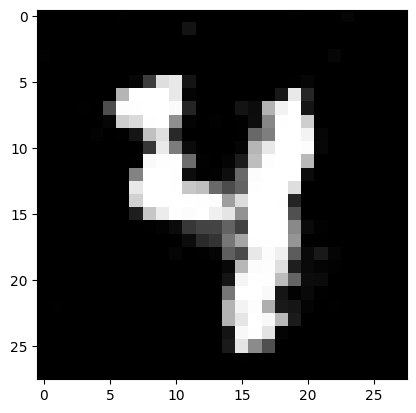

Ploting:  0


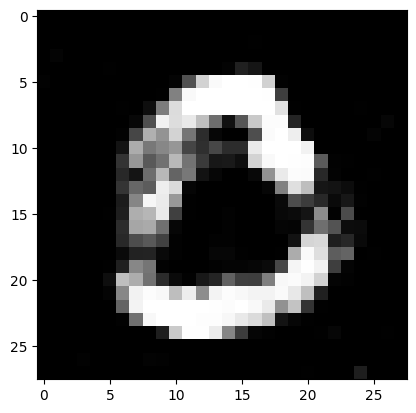

Epoch: 30550
loss_g: 1.0208574533462524 	loss_d: 1.2085094451904297
Epoch: 30600
loss_g: 0.9829295873641968 	loss_d: 1.0865291357040405
Epoch: 30650
loss_g: 1.020772099494934 	loss_d: 1.270954966545105
Epoch: 30700
loss_g: 1.072052001953125 	loss_d: 1.2206413745880127
Epoch: 30750
loss_g: 0.9593148231506348 	loss_d: 1.131190299987793
Ploting:  9


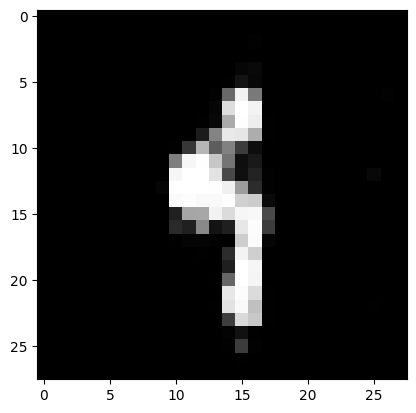

Ploting:  2


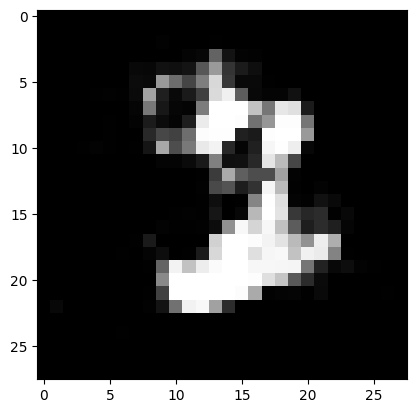

Ploting:  9


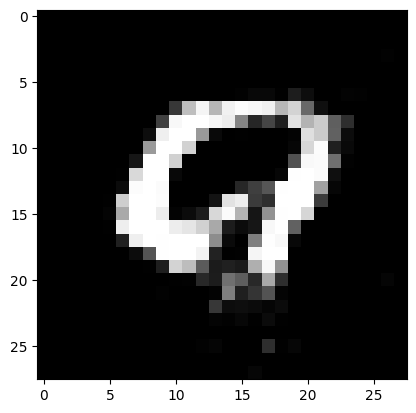

Ploting:  7


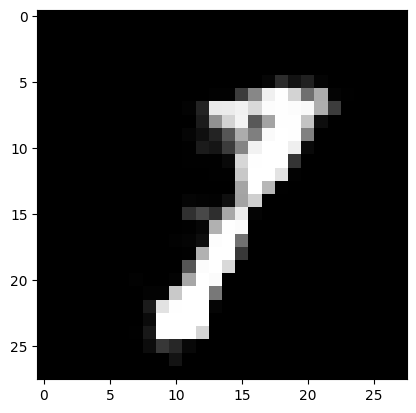

Ploting:  3


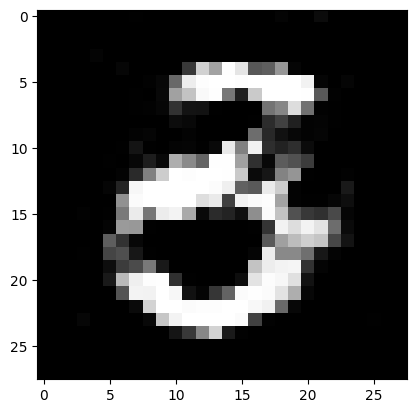

Epoch: 30800
loss_g: 0.901655912399292 	loss_d: 1.2286368608474731
Epoch: 30850
loss_g: 1.0974684953689575 	loss_d: 1.1702244281768799
Epoch: 30900
loss_g: 0.9677013754844666 	loss_d: 1.1030247211456299
Epoch: 30950
loss_g: 1.059877872467041 	loss_d: 1.1354963779449463
Epoch: 31000
loss_g: 1.1013774871826172 	loss_d: 1.1094088554382324
Ploting:  5


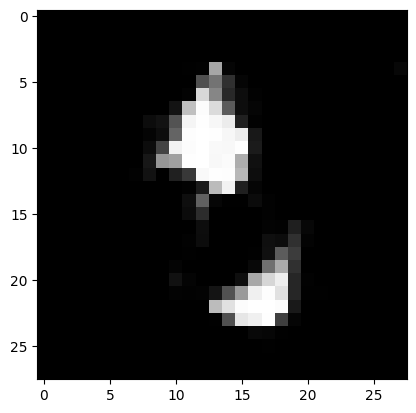

Ploting:  8


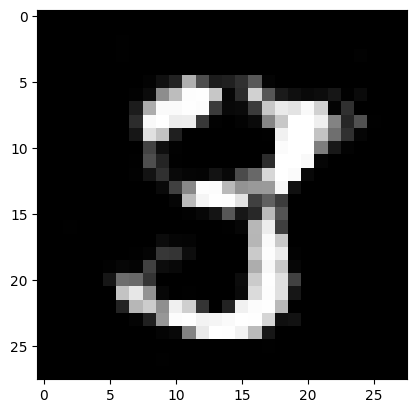

Ploting:  6


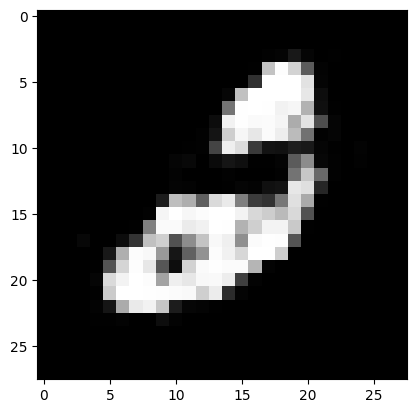

Ploting:  6


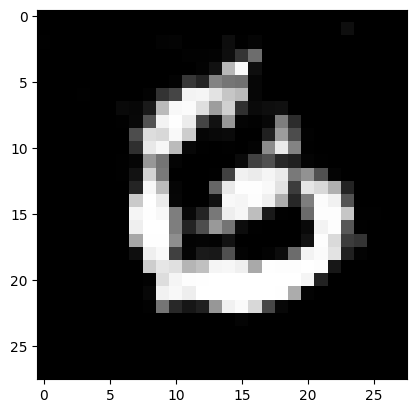

Ploting:  4


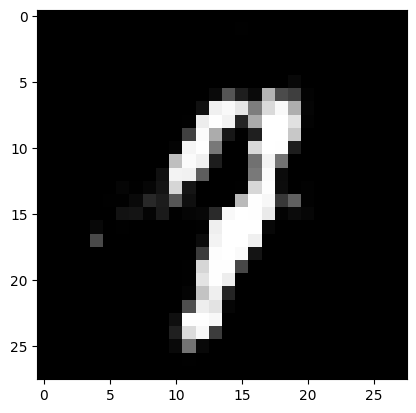

Epoch: 31050
loss_g: 1.0163722038269043 	loss_d: 1.2593580484390259
Epoch: 31100
loss_g: 0.9070839285850525 	loss_d: 1.183111310005188
Epoch: 31150
loss_g: 0.9517626762390137 	loss_d: 1.0974702835083008
Epoch: 31200
loss_g: 0.9387631416320801 	loss_d: 1.2094959020614624
Epoch: 31250
loss_g: 0.9233556985855103 	loss_d: 1.099334478378296
Ploting:  5


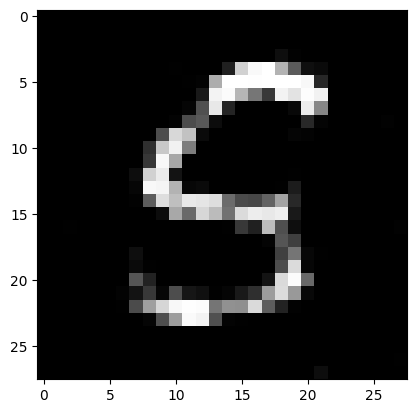

Ploting:  9


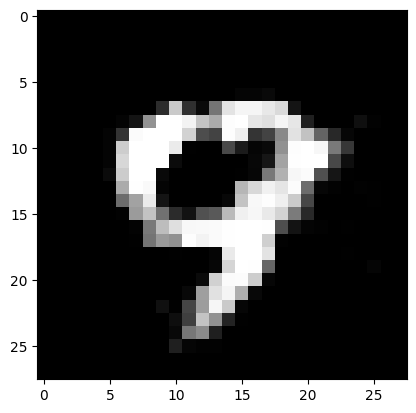

Ploting:  5


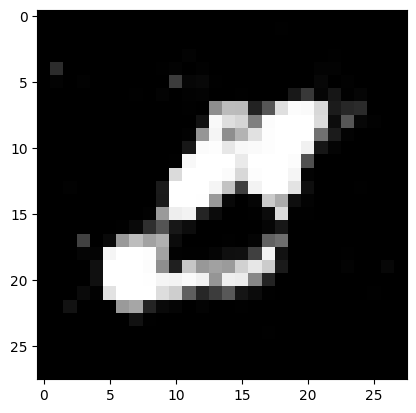

Ploting:  1


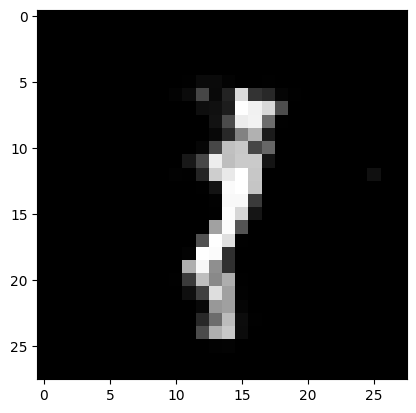

Ploting:  6


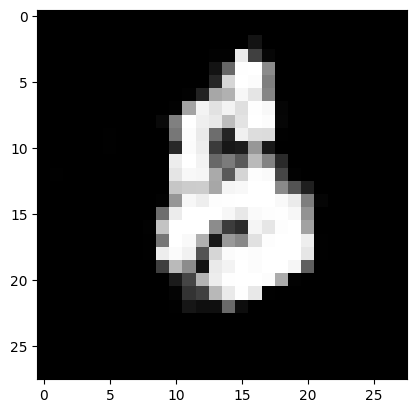

Epoch: 31300
loss_g: 1.2614667415618896 	loss_d: 1.2508376836776733
Epoch: 31350
loss_g: 0.9200440645217896 	loss_d: 1.129204511642456
Epoch: 31400
loss_g: 0.9923006296157837 	loss_d: 1.1796414852142334
Epoch: 31450
loss_g: 0.9798686504364014 	loss_d: 1.1873795986175537
Epoch: 31500
loss_g: 0.8540527820587158 	loss_d: 1.1577599048614502
Ploting:  3


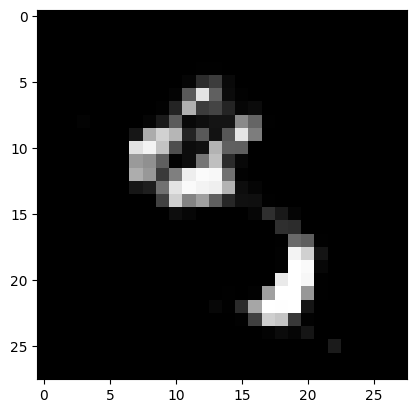

Ploting:  7


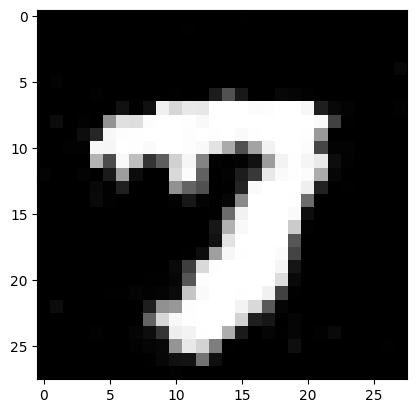

Ploting:  7


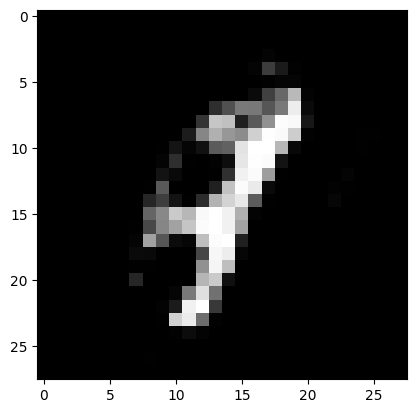

Ploting:  9


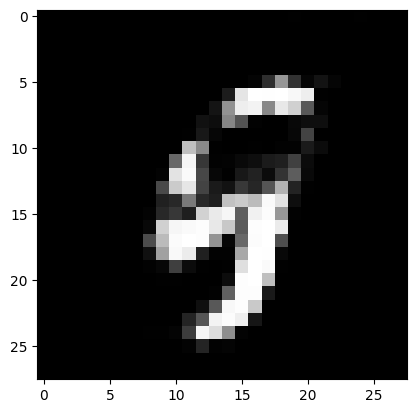

Ploting:  2


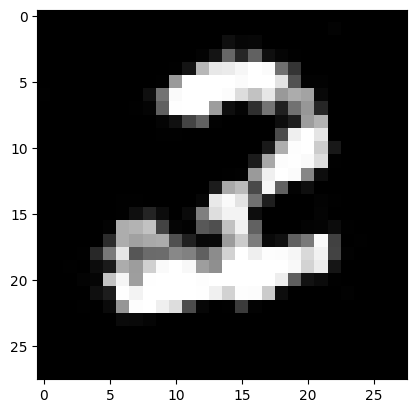

Epoch: 31550
loss_g: 0.7319039106369019 	loss_d: 1.1874470710754395
Epoch: 31600
loss_g: 1.0409090518951416 	loss_d: 1.2967238426208496
Epoch: 31650
loss_g: 1.244299292564392 	loss_d: 1.2191323041915894
Epoch: 31700
loss_g: 0.7592865228652954 	loss_d: 1.1934230327606201
Epoch: 31750
loss_g: 1.344037413597107 	loss_d: 1.138768196105957
Ploting:  5


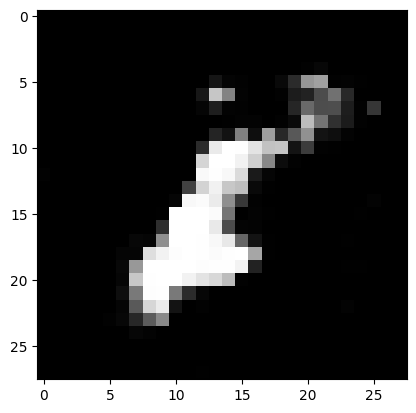

Ploting:  9


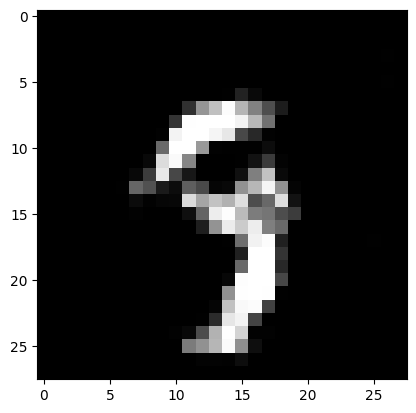

Ploting:  9


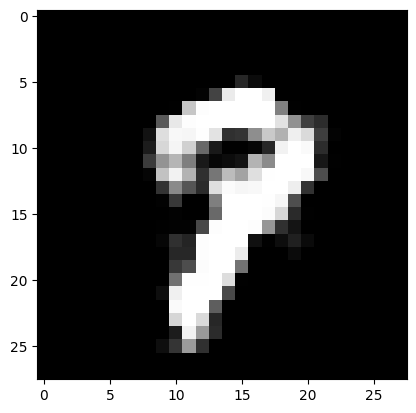

Ploting:  0


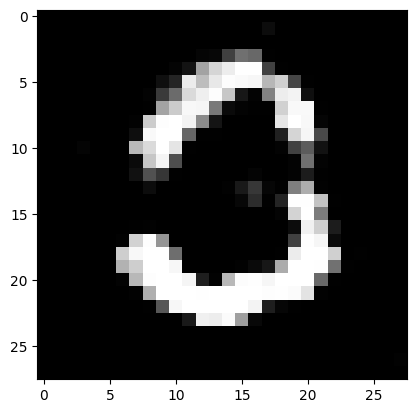

Ploting:  4


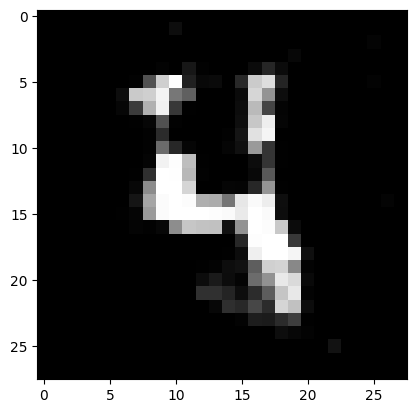

Epoch: 31800
loss_g: 0.8768519759178162 	loss_d: 1.1492955684661865
Epoch: 31850
loss_g: 0.9274219870567322 	loss_d: 1.2116445302963257
Epoch: 31900
loss_g: 0.9699568748474121 	loss_d: 1.3038935661315918
Epoch: 31950
loss_g: 0.8901515603065491 	loss_d: 1.111565113067627
Epoch: 32000
loss_g: 1.1263147592544556 	loss_d: 1.2174392938613892
Ploting:  1


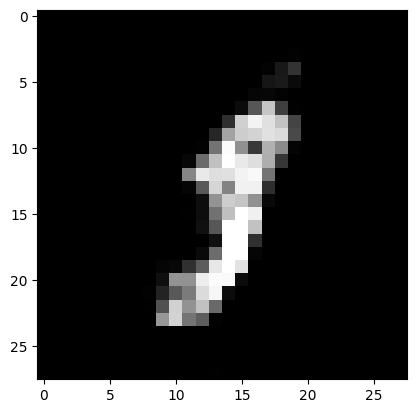

Ploting:  1


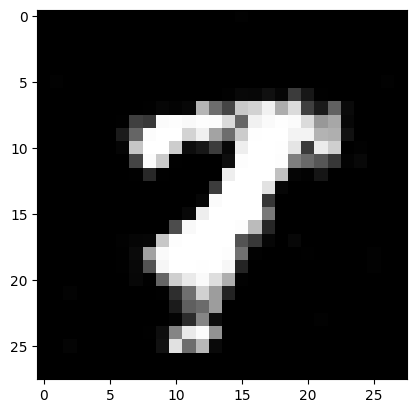

Ploting:  5


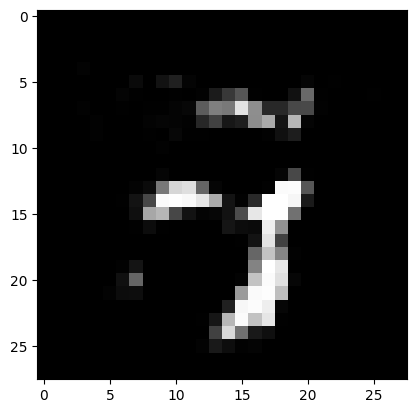

Ploting:  6


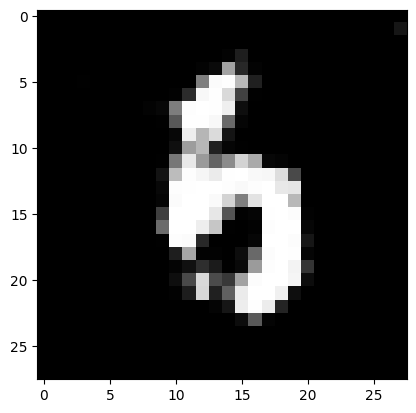

Ploting:  0


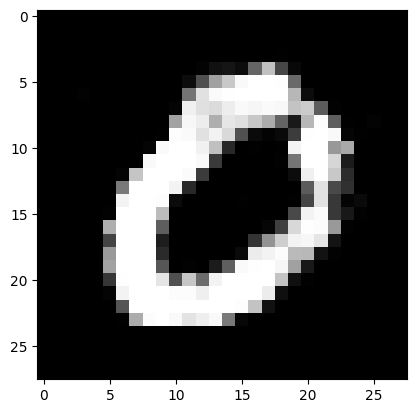

Epoch: 32050
loss_g: 0.9243385791778564 	loss_d: 1.0909759998321533
Epoch: 32100
loss_g: 0.9782452583312988 	loss_d: 1.2341487407684326
Epoch: 32150
loss_g: 1.3138339519500732 	loss_d: 1.1408889293670654
Epoch: 32200
loss_g: 1.0004380941390991 	loss_d: 1.162468671798706
Epoch: 32250
loss_g: 0.9320107698440552 	loss_d: 1.3098201751708984
Ploting:  8


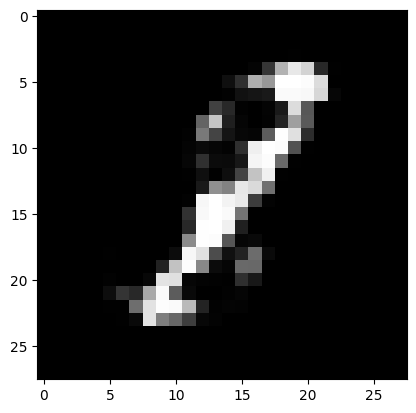

Ploting:  7


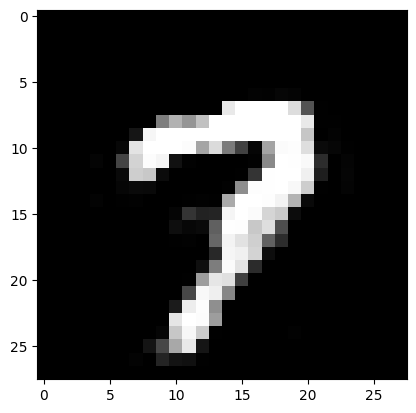

Ploting:  7


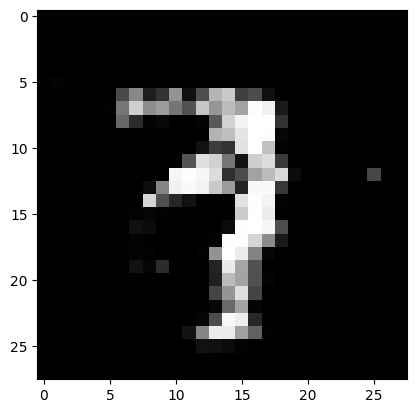

Ploting:  6


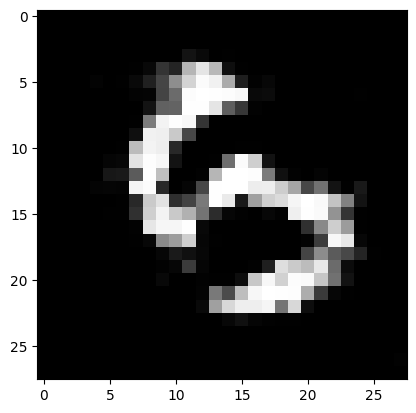

Ploting:  6


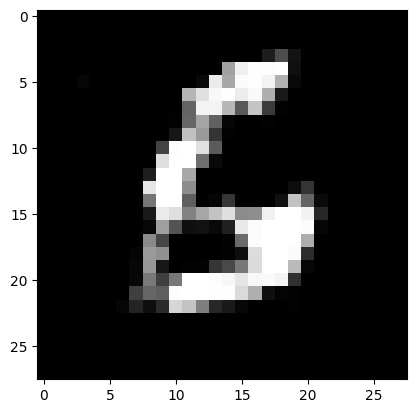

Epoch: 32300
loss_g: 1.0577795505523682 	loss_d: 1.1703752279281616
Epoch: 32350
loss_g: 1.3199801445007324 	loss_d: 1.180800437927246
Epoch: 32400
loss_g: 0.7860788106918335 	loss_d: 1.2749512195587158
Epoch: 32450
loss_g: 0.9655696153640747 	loss_d: 1.1097431182861328
Epoch: 32500
loss_g: 0.9808269739151001 	loss_d: 1.2508108615875244
Ploting:  2


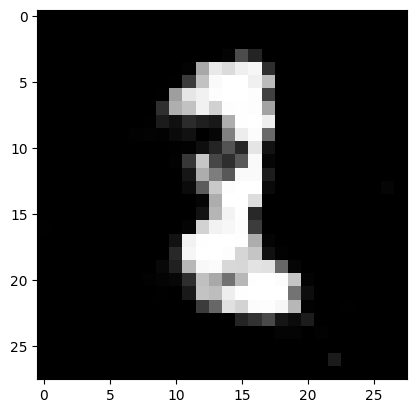

Ploting:  3


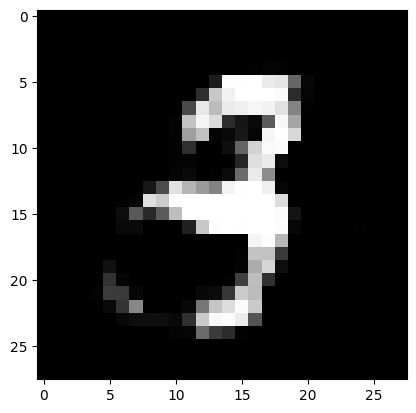

Ploting:  2


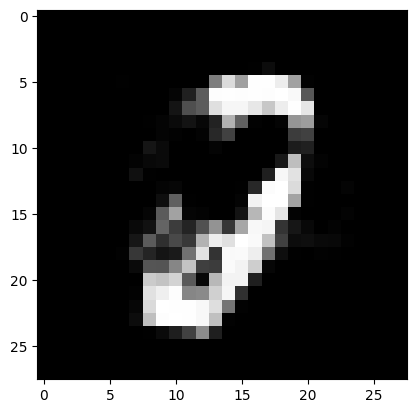

Ploting:  5


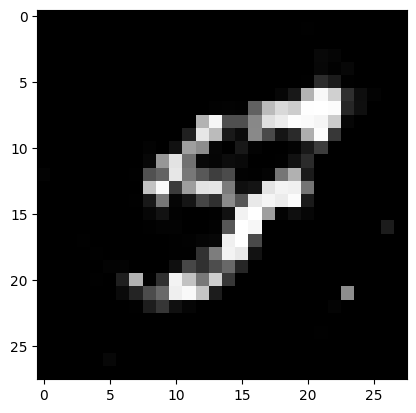

Ploting:  0


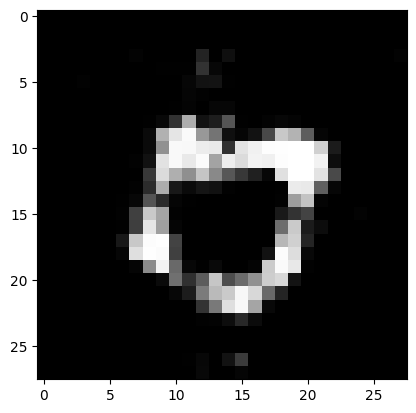

Epoch: 32550
loss_g: 0.8080231547355652 	loss_d: 1.1077104806900024
Epoch: 32600
loss_g: 1.182133674621582 	loss_d: 1.1681206226348877
Epoch: 32650
loss_g: 0.9198907613754272 	loss_d: 1.0180338621139526
Epoch: 32700
loss_g: 1.0211375951766968 	loss_d: 1.1764285564422607
Epoch: 32750
loss_g: 1.0691825151443481 	loss_d: 1.2960326671600342
Ploting:  2


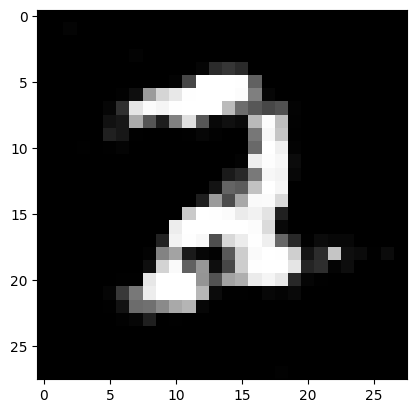

Ploting:  7


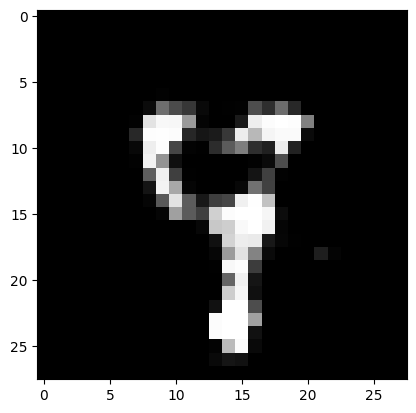

Ploting:  9


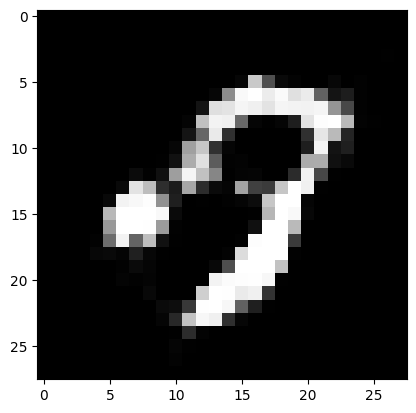

Ploting:  5


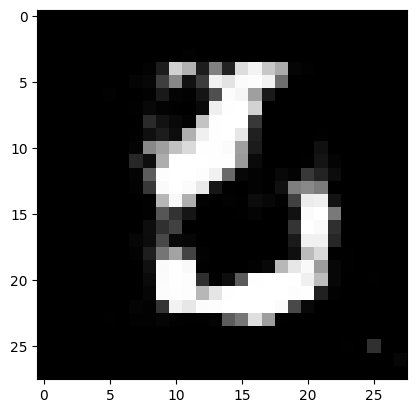

Ploting:  9


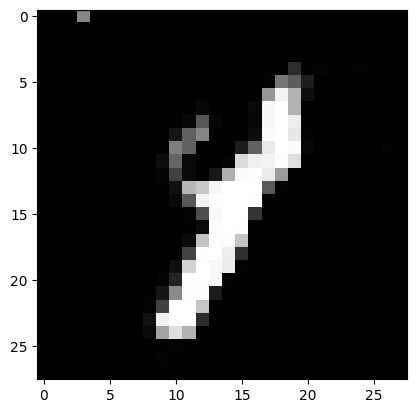

Epoch: 32800
loss_g: 1.0544034242630005 	loss_d: 1.1035062074661255
Epoch: 32850
loss_g: 1.0666025876998901 	loss_d: 1.1431670188903809
Epoch: 32900
loss_g: 1.1484761238098145 	loss_d: 1.1512614488601685
Epoch: 32950
loss_g: 1.0616620779037476 	loss_d: 1.0886716842651367
Epoch: 33000
loss_g: 0.889055609703064 	loss_d: 1.236682653427124
Ploting:  1


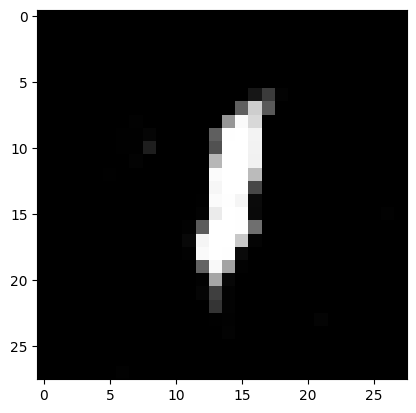

Ploting:  5


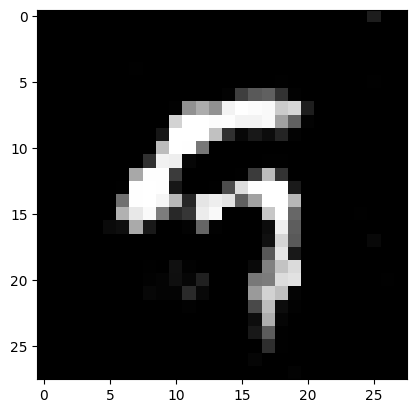

Ploting:  8


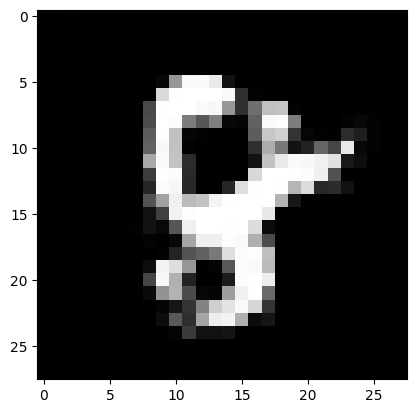

Ploting:  3


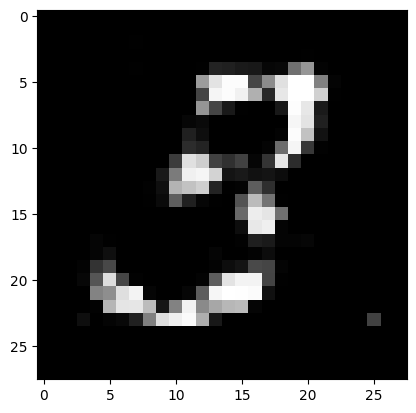

Ploting:  0


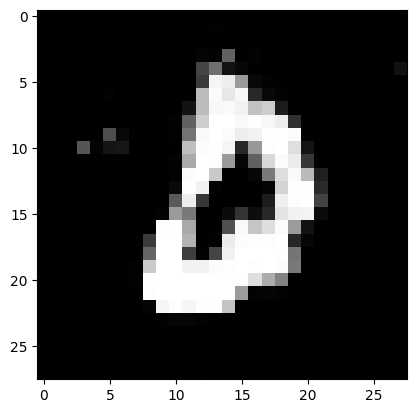

Epoch: 33050
loss_g: 0.8969246745109558 	loss_d: 1.2432658672332764
Epoch: 33100
loss_g: 1.12881600856781 	loss_d: 1.093487024307251
Epoch: 33150
loss_g: 0.7546899318695068 	loss_d: 1.1844655275344849
Epoch: 33200
loss_g: 1.049267292022705 	loss_d: 1.1249144077301025
Epoch: 33250
loss_g: 0.9041739702224731 	loss_d: 1.0671716928482056
Ploting:  7


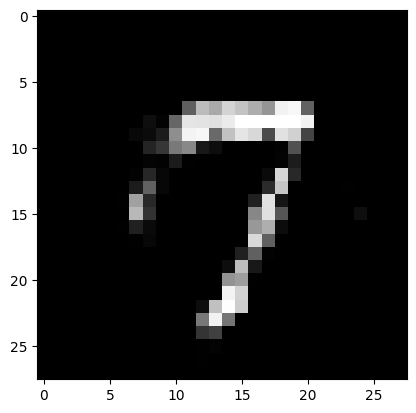

Ploting:  6


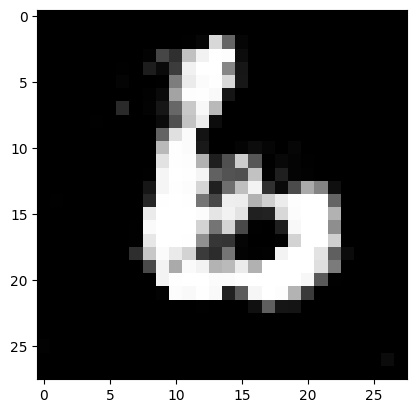

Ploting:  1


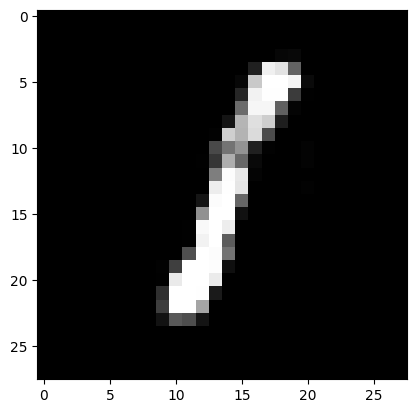

Ploting:  8


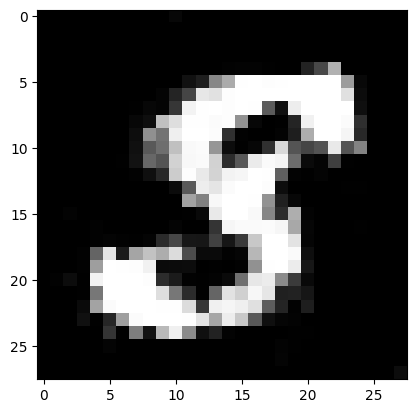

Ploting:  9


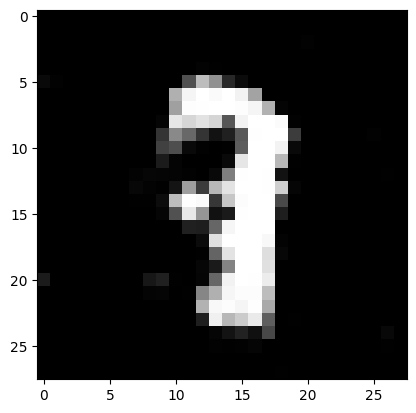

Epoch: 33300
loss_g: 1.1773086786270142 	loss_d: 1.206741452217102
Epoch: 33350
loss_g: 0.9025914072990417 	loss_d: 1.2128245830535889
Epoch: 33400
loss_g: 1.3321292400360107 	loss_d: 1.183353304862976
Epoch: 33450
loss_g: 1.4194252490997314 	loss_d: 1.0497316122055054
Epoch: 33500
loss_g: 1.1432541608810425 	loss_d: 1.2498915195465088
Ploting:  5


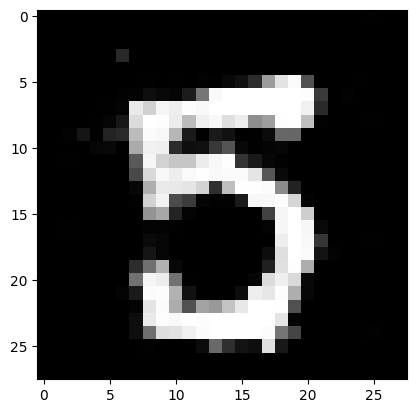

Ploting:  4


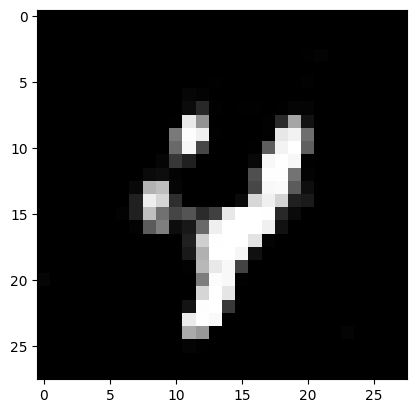

Ploting:  8


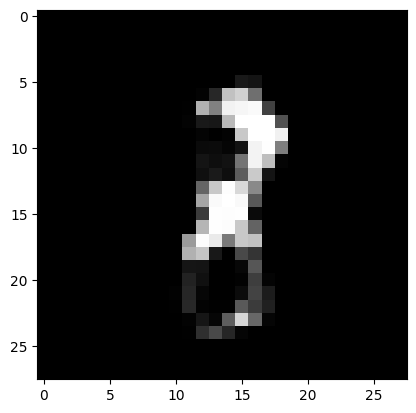

Ploting:  6


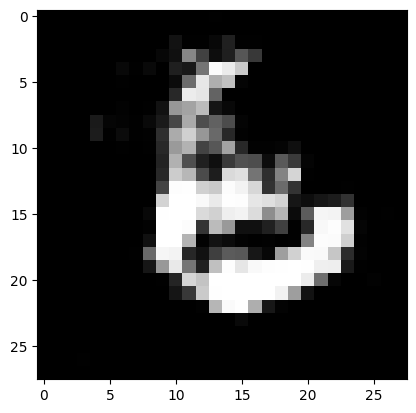

Ploting:  0


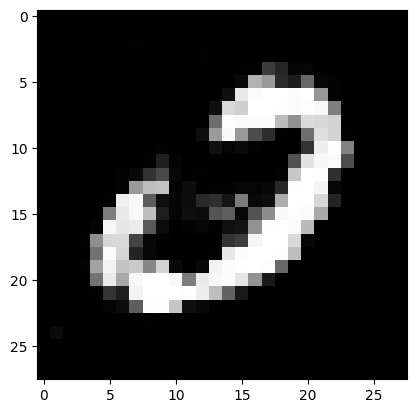

Epoch: 33550
loss_g: 1.0589849948883057 	loss_d: 1.1882100105285645
Epoch: 33600
loss_g: 0.9549904465675354 	loss_d: 1.1786168813705444
Epoch: 33650
loss_g: 0.9358608722686768 	loss_d: 1.204107403755188
Epoch: 33700
loss_g: 1.0376415252685547 	loss_d: 1.1618775129318237
Epoch: 33750
loss_g: 0.9278247356414795 	loss_d: 1.1642110347747803
Ploting:  3


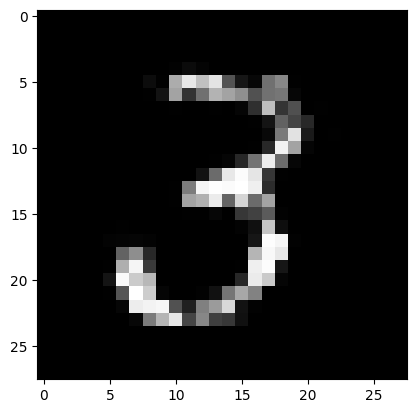

Ploting:  6


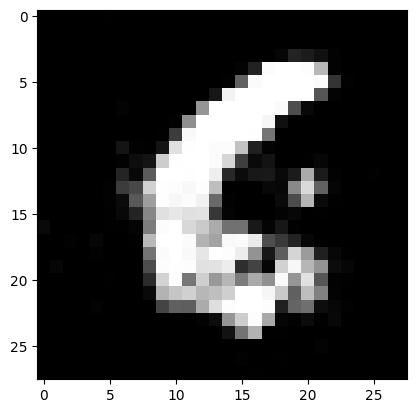

Ploting:  7


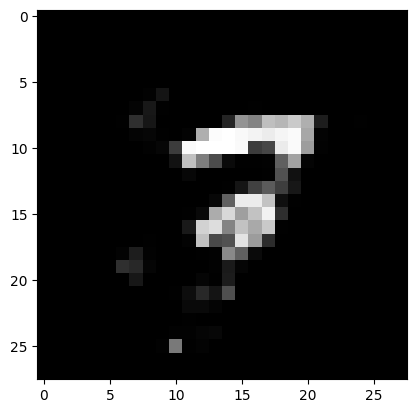

Ploting:  6


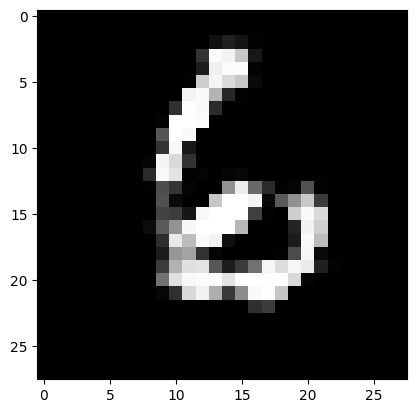

Ploting:  7


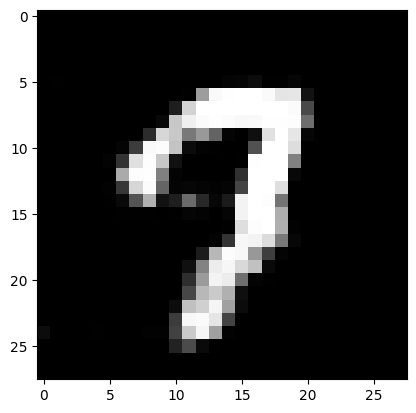

Epoch: 33800
loss_g: 0.6075097322463989 	loss_d: 1.131361484527588
Epoch: 33850
loss_g: 0.9053622484207153 	loss_d: 1.1658368110656738
Epoch: 33900
loss_g: 1.5355256795883179 	loss_d: 1.187894344329834
Epoch: 33950
loss_g: 1.144651174545288 	loss_d: 1.1292567253112793
Epoch: 34000
loss_g: 1.2068805694580078 	loss_d: 1.1776123046875
Ploting:  8


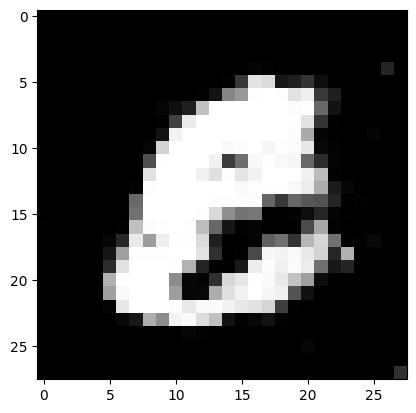

Ploting:  4


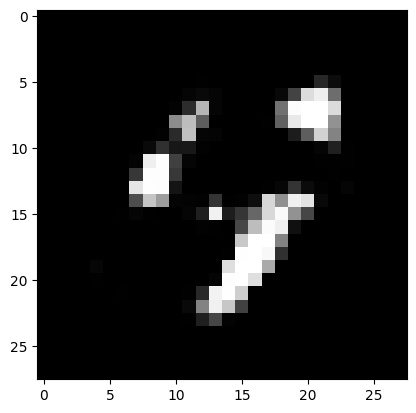

Ploting:  1


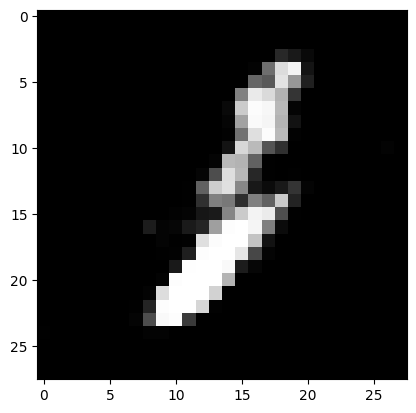

Ploting:  8


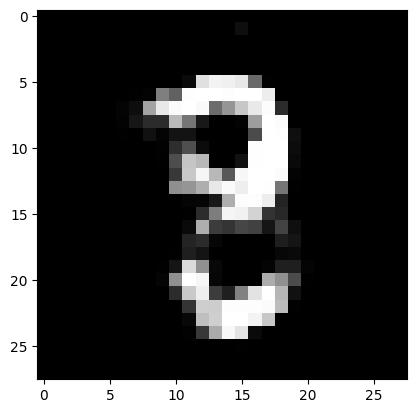

Ploting:  1


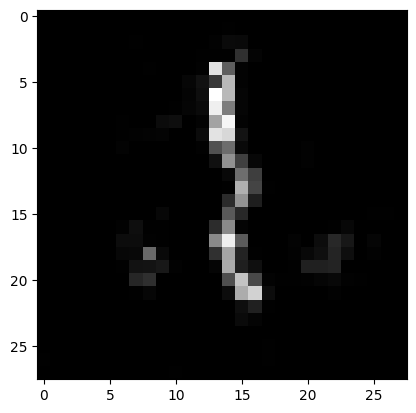

Epoch: 34050
loss_g: 1.024010419845581 	loss_d: 1.2057429552078247
Epoch: 34100
loss_g: 1.2292988300323486 	loss_d: 1.142688274383545
Epoch: 34150
loss_g: 0.9038755893707275 	loss_d: 1.1523618698120117
Epoch: 34200
loss_g: 0.9039174914360046 	loss_d: 1.2845258712768555
Epoch: 34250
loss_g: 1.0073260068893433 	loss_d: 1.2487730979919434
Ploting:  7


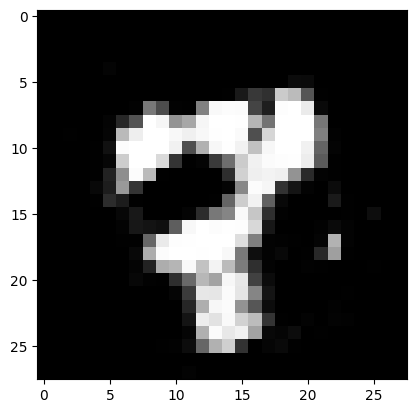

Ploting:  5


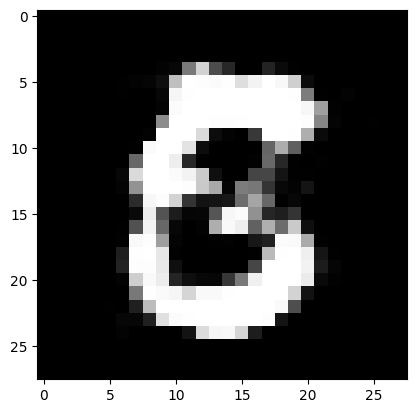

Ploting:  4


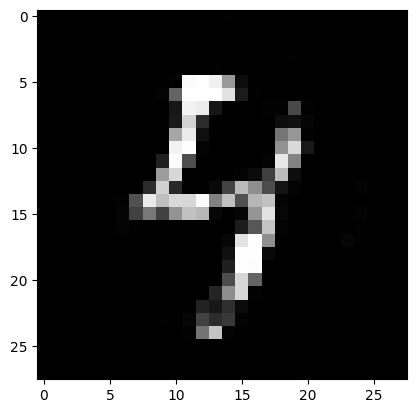

Ploting:  5


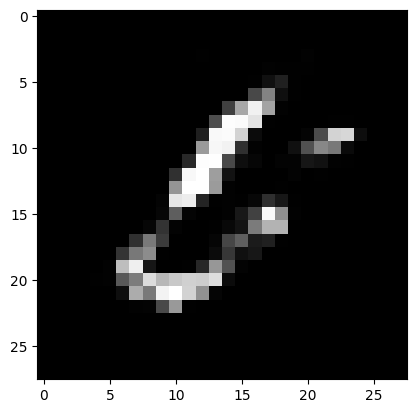

Ploting:  6


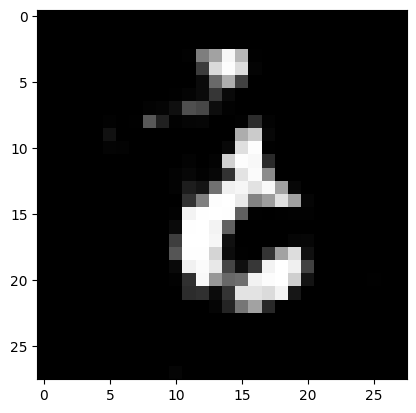

Epoch: 34300
loss_g: 1.1498751640319824 	loss_d: 1.0820726156234741
Epoch: 34350
loss_g: 1.0890650749206543 	loss_d: 1.1703730821609497
Epoch: 34400
loss_g: 0.7114594578742981 	loss_d: 1.1434426307678223
Epoch: 34450
loss_g: 0.9912186861038208 	loss_d: 1.1749171018600464
Epoch: 34500
loss_g: 0.8141918182373047 	loss_d: 1.1771366596221924
Ploting:  5


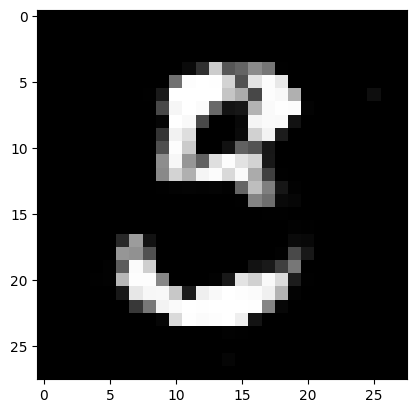

Ploting:  4


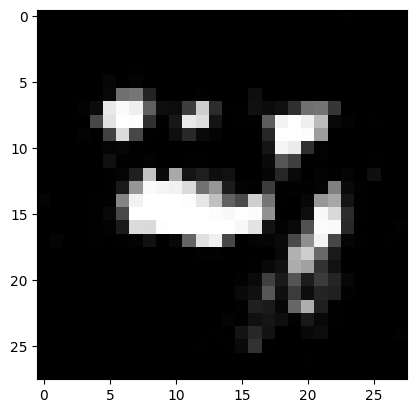

Ploting:  6


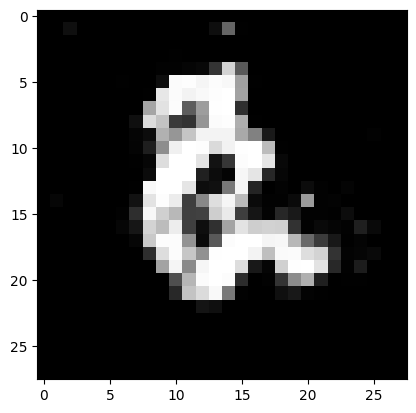

Ploting:  9


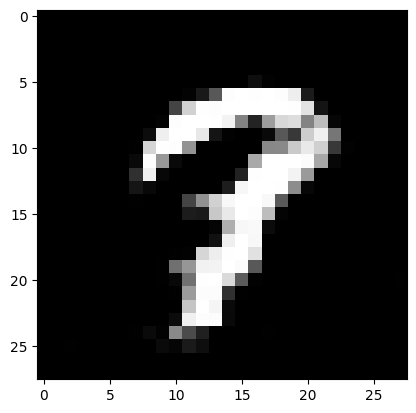

Ploting:  6


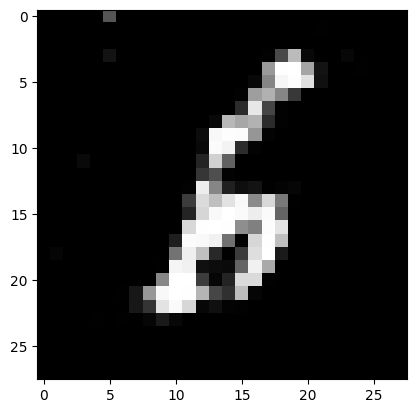

Epoch: 34550
loss_g: 1.3967313766479492 	loss_d: 1.2109438180923462
Epoch: 34600
loss_g: 1.3259491920471191 	loss_d: 1.1523725986480713
Epoch: 34650
loss_g: 1.0105197429656982 	loss_d: 1.1981768608093262
Epoch: 34700
loss_g: 0.7885550260543823 	loss_d: 1.2263511419296265
Epoch: 34750
loss_g: 1.5787665843963623 	loss_d: 1.2179903984069824
Ploting:  6


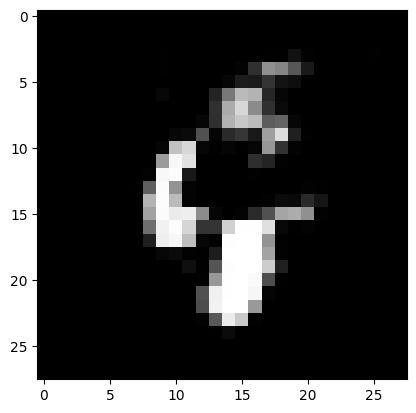

Ploting:  8


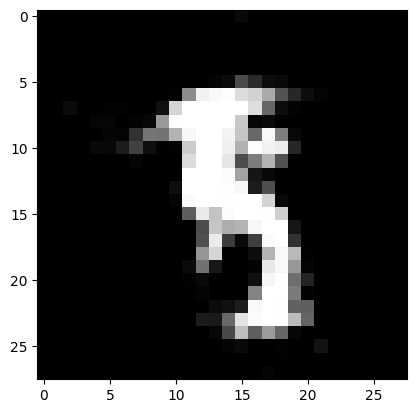

Ploting:  6


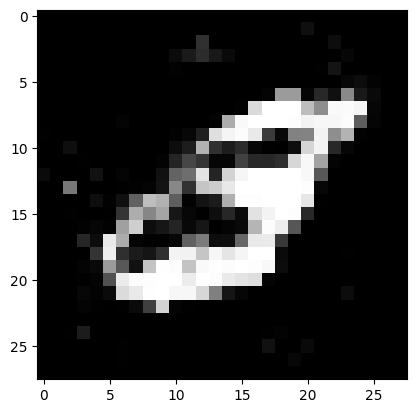

Ploting:  6


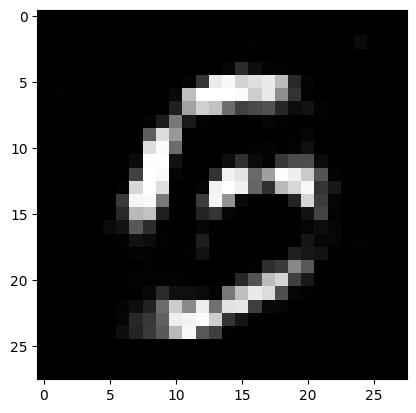

Ploting:  2


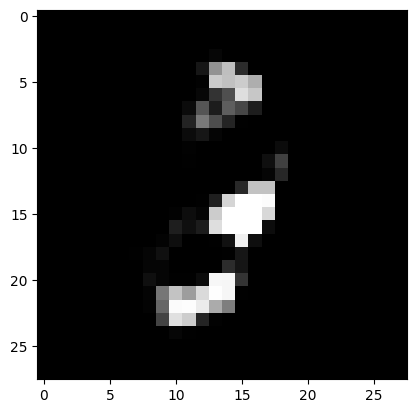

Epoch: 34800
loss_g: 1.2084851264953613 	loss_d: 1.126762866973877
Epoch: 34850
loss_g: 1.2062358856201172 	loss_d: 1.1739790439605713
Epoch: 34900
loss_g: 1.385331630706787 	loss_d: 1.092929720878601
Epoch: 34950
loss_g: 1.0967068672180176 	loss_d: 1.1592347621917725
Epoch: 35000
loss_g: 1.0798537731170654 	loss_d: 1.2002836465835571
Ploting:  9


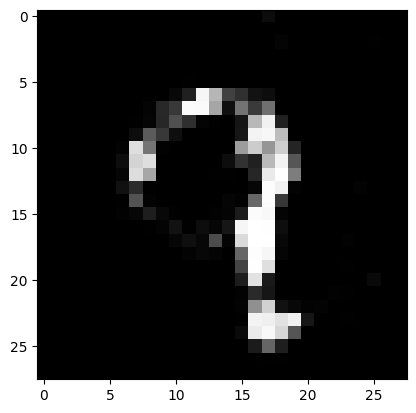

Ploting:  6


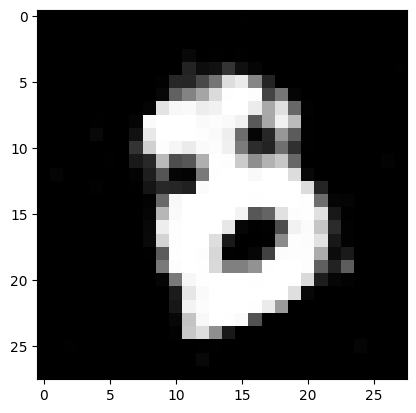

Ploting:  1


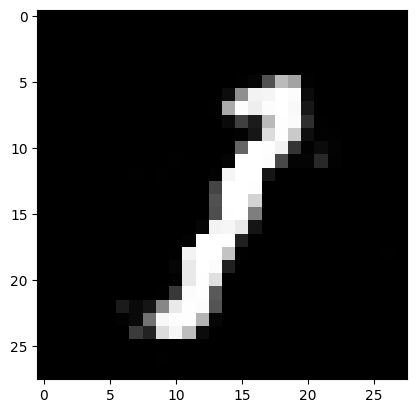

Ploting:  6


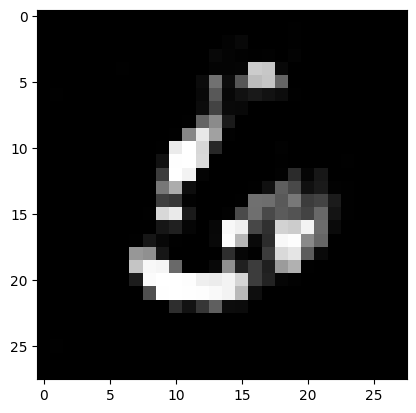

Ploting:  5


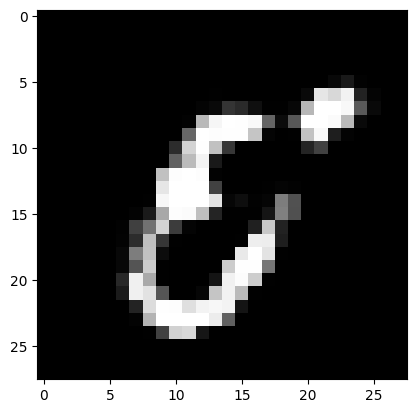

Epoch: 35050
loss_g: 0.7799605131149292 	loss_d: 1.2826220989227295
Epoch: 35100
loss_g: 1.105257511138916 	loss_d: 1.1228764057159424
Epoch: 35150
loss_g: 1.0557546615600586 	loss_d: 1.1776325702667236
Epoch: 35200
loss_g: 1.0886080265045166 	loss_d: 1.1701061725616455
Epoch: 35250
loss_g: 0.9655596613883972 	loss_d: 1.0875170230865479
Ploting:  1


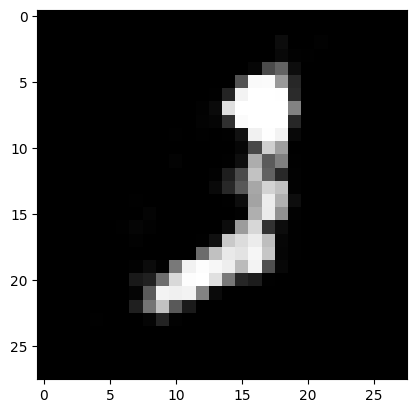

Ploting:  4


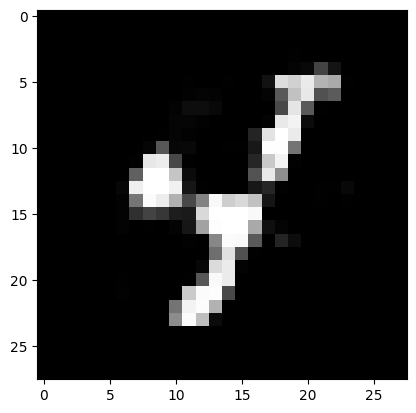

Ploting:  9


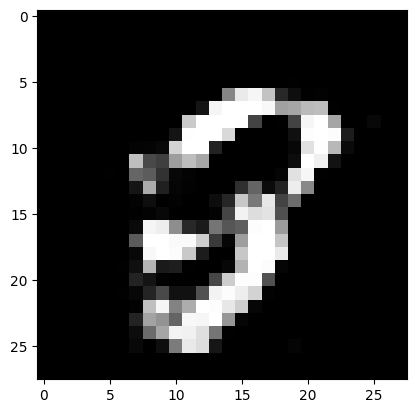

Ploting:  1


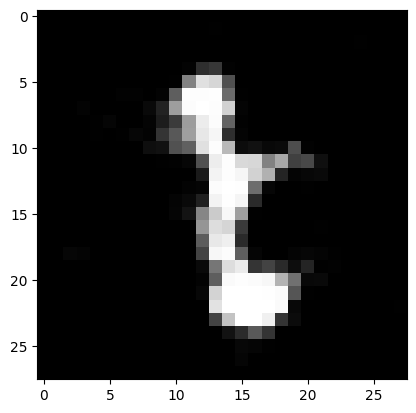

Ploting:  3


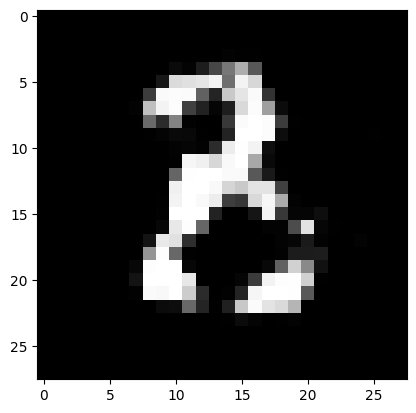

Epoch: 35300
loss_g: 1.2285834550857544 	loss_d: 1.2235279083251953
Epoch: 35350
loss_g: 0.8628615140914917 	loss_d: 1.1889724731445312
Epoch: 35400
loss_g: 0.8828647136688232 	loss_d: 1.1908704042434692
Epoch: 35450
loss_g: 0.8564548492431641 	loss_d: 1.2481861114501953
Epoch: 35500
loss_g: 0.8837810754776001 	loss_d: 1.1551569700241089
Ploting:  8


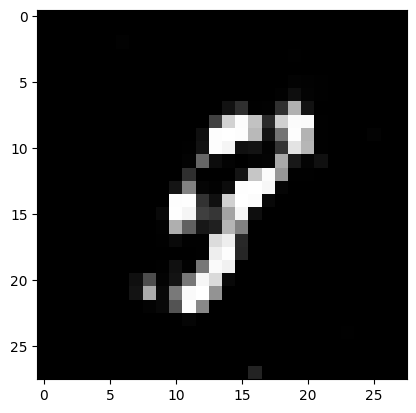

Ploting:  3


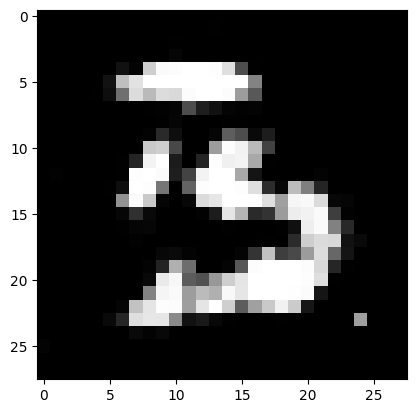

Ploting:  0


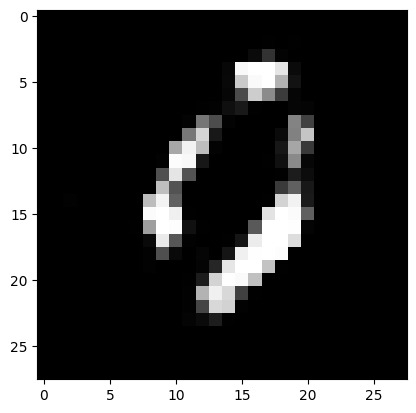

Ploting:  3


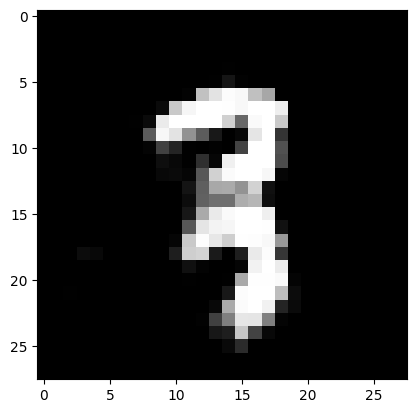

Ploting:  5


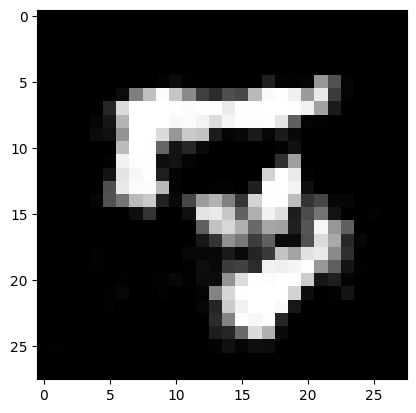

Epoch: 35550
loss_g: 0.9154508113861084 	loss_d: 1.203916072845459
Epoch: 35600
loss_g: 0.7761068344116211 	loss_d: 1.1299121379852295
Epoch: 35650
loss_g: 1.1773535013198853 	loss_d: 1.196061611175537
Epoch: 35700
loss_g: 1.0325393676757812 	loss_d: 1.0635454654693604
Epoch: 35750
loss_g: 1.260606288909912 	loss_d: 1.2401928901672363
Ploting:  1


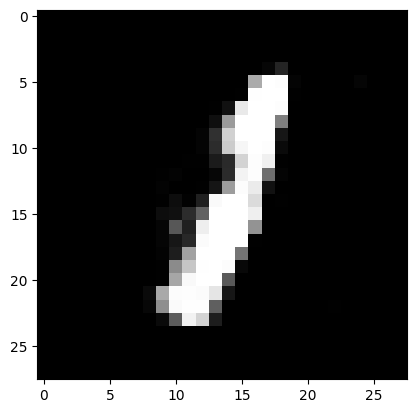

Ploting:  8


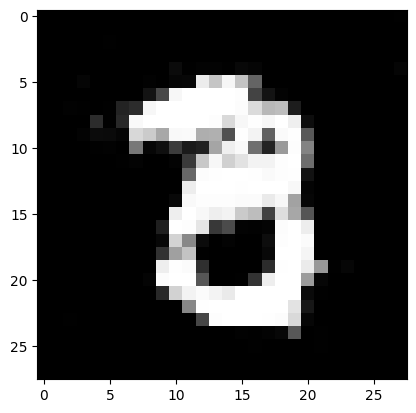

Ploting:  1


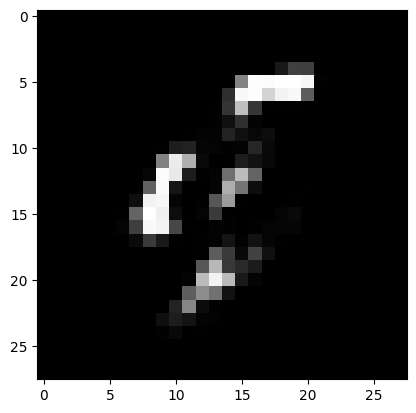

Ploting:  4


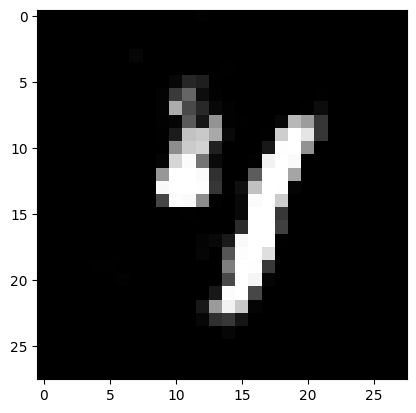

Ploting:  6


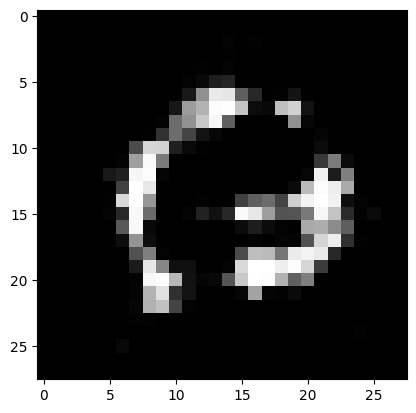

Epoch: 35800
loss_g: 0.8121492862701416 	loss_d: 1.1806408166885376
Epoch: 35850
loss_g: 1.0321084260940552 	loss_d: 1.169633388519287
Epoch: 35900
loss_g: 1.1019924879074097 	loss_d: 1.1932122707366943
Epoch: 35950
loss_g: 1.0119314193725586 	loss_d: 1.2012600898742676
Epoch: 36000
loss_g: 1.1439263820648193 	loss_d: 1.289199709892273
Ploting:  8


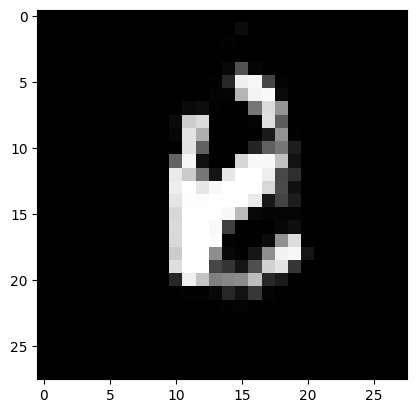

Ploting:  7


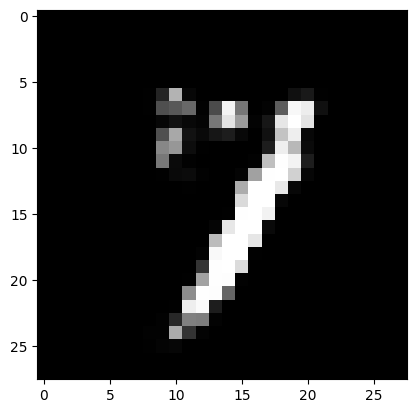

Ploting:  3


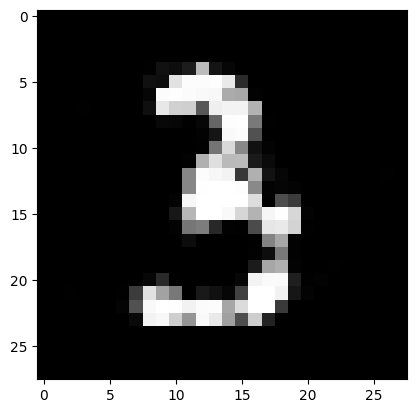

Ploting:  0


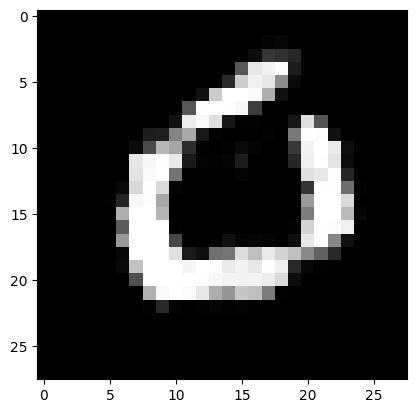

Ploting:  5


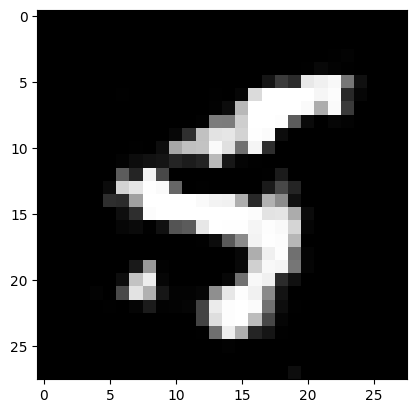

Epoch: 36050
loss_g: 0.9229007959365845 	loss_d: 1.2972614765167236
Epoch: 36100
loss_g: 0.7858754992485046 	loss_d: 1.2563351392745972
Epoch: 36150
loss_g: 0.9619498252868652 	loss_d: 1.2055556774139404
Epoch: 36200
loss_g: 1.1898610591888428 	loss_d: 1.1112604141235352
Epoch: 36250
loss_g: 1.1262784004211426 	loss_d: 1.1745038032531738
Ploting:  3


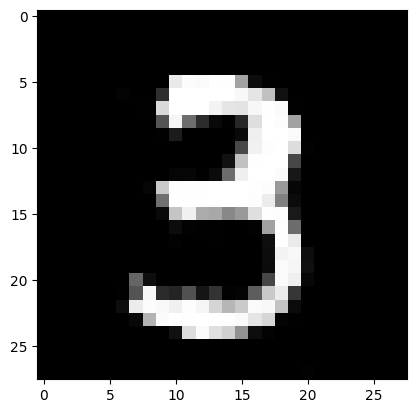

Ploting:  2


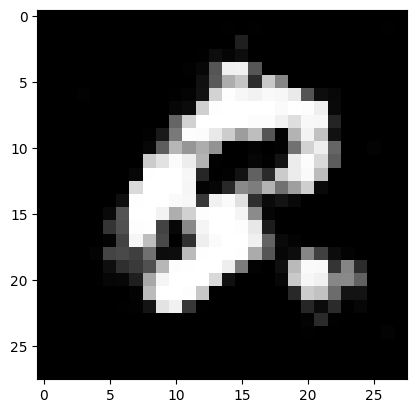

Ploting:  4


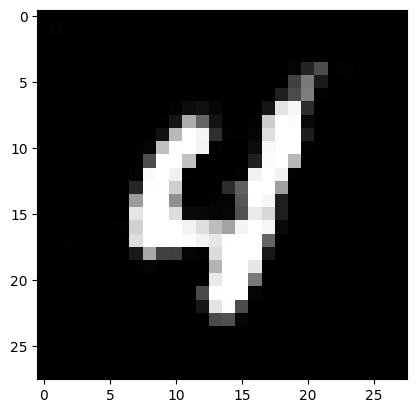

Ploting:  6


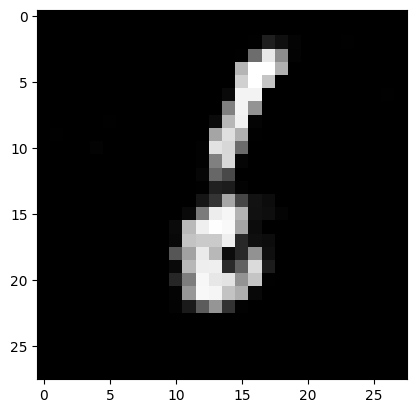

Ploting:  5


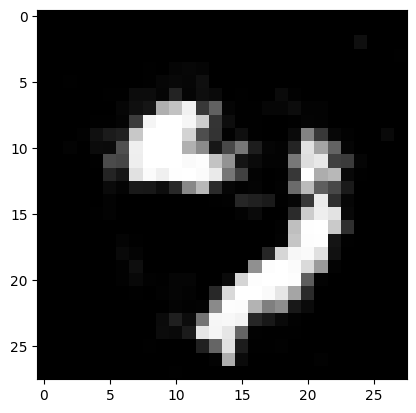

Epoch: 36300
loss_g: 0.8382797241210938 	loss_d: 1.164902687072754
Epoch: 36350
loss_g: 0.866161584854126 	loss_d: 1.0671181678771973
Epoch: 36400
loss_g: 1.1352773904800415 	loss_d: 1.184903860092163
Epoch: 36450
loss_g: 1.0710878372192383 	loss_d: 1.1964317560195923
Epoch: 36500
loss_g: 0.8492258787155151 	loss_d: 1.1557629108428955
Ploting:  9


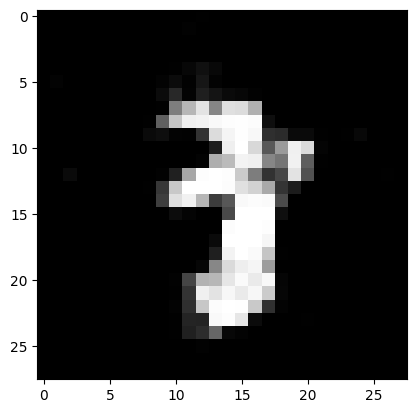

Ploting:  9


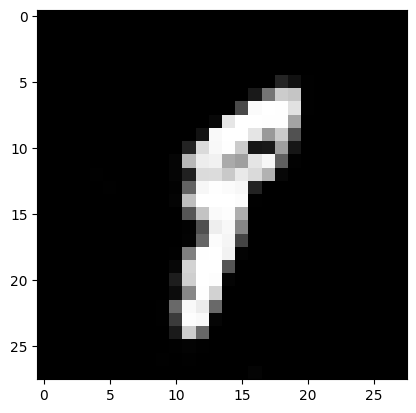

Ploting:  0


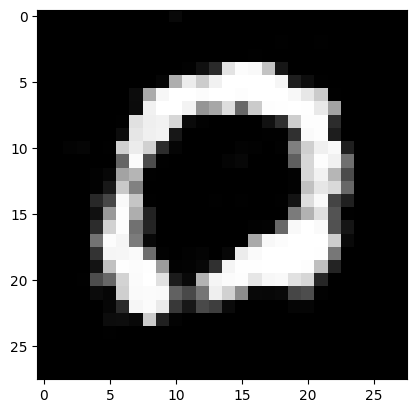

Ploting:  6


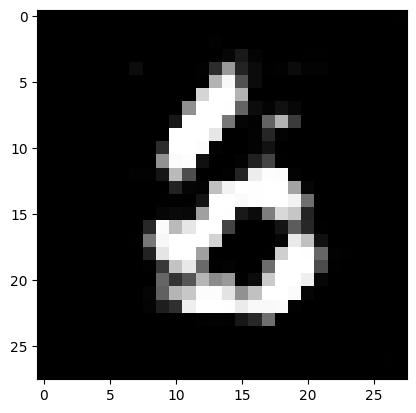

Ploting:  4


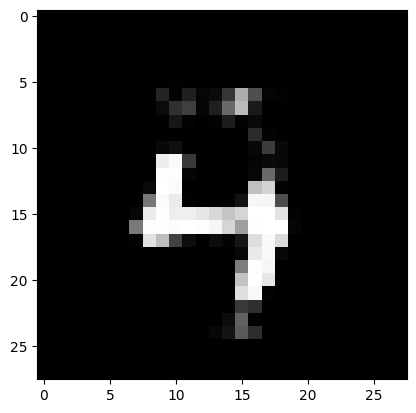

Epoch: 36550
loss_g: 1.1323732137680054 	loss_d: 1.291589379310608
Epoch: 36600
loss_g: 1.0514360666275024 	loss_d: 1.263170838356018
Epoch: 36650
loss_g: 1.082068920135498 	loss_d: 1.1480339765548706
Epoch: 36700
loss_g: 1.0337094068527222 	loss_d: 1.2161788940429688
Epoch: 36750
loss_g: 1.1162755489349365 	loss_d: 1.2183119058609009
Ploting:  7


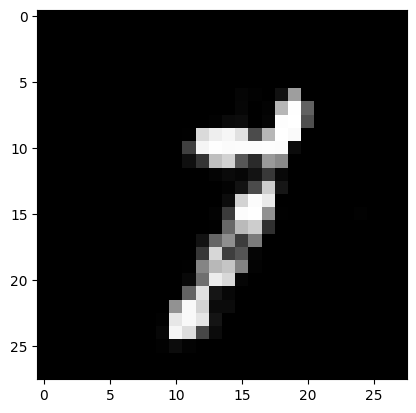

Ploting:  2


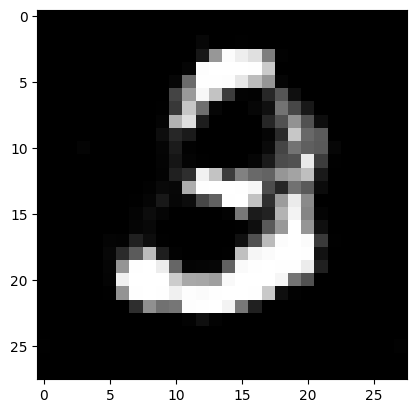

Ploting:  2


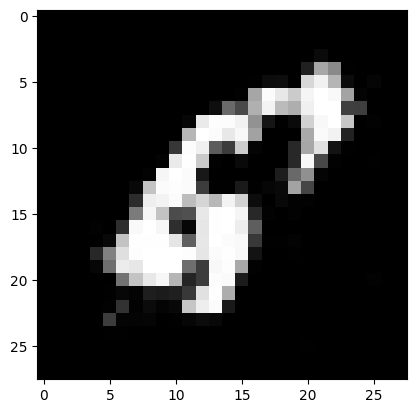

Ploting:  2


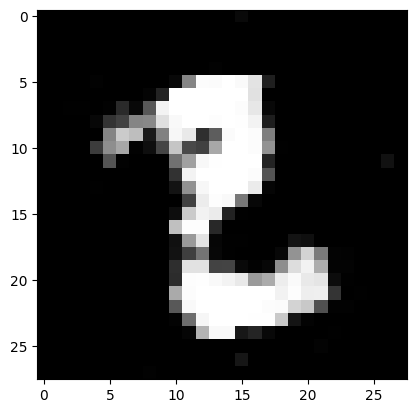

Ploting:  4


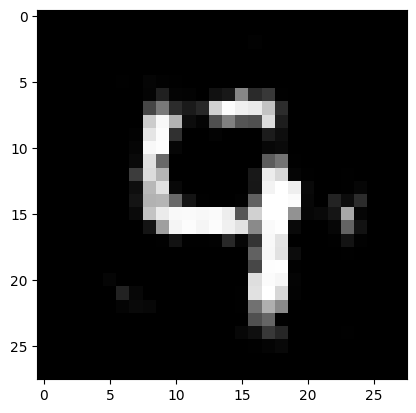

Epoch: 36800
loss_g: 1.1122456789016724 	loss_d: 1.1489148139953613
Epoch: 36850
loss_g: 1.0092215538024902 	loss_d: 1.1364535093307495
Epoch: 36900
loss_g: 1.0614392757415771 	loss_d: 1.1928060054779053
Epoch: 36950
loss_g: 1.312159776687622 	loss_d: 1.2829985618591309
Epoch: 37000
loss_g: 1.1121896505355835 	loss_d: 1.1882038116455078
Ploting:  0


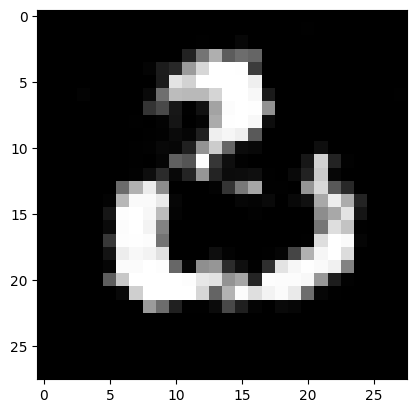

Ploting:  8


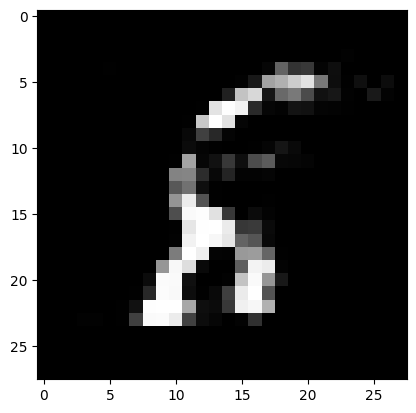

Ploting:  7


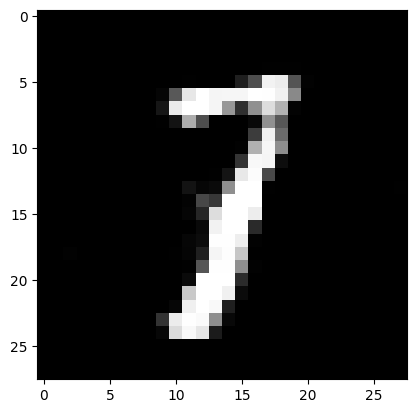

Ploting:  9


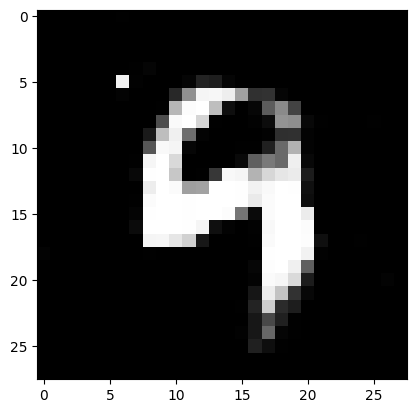

Ploting:  7


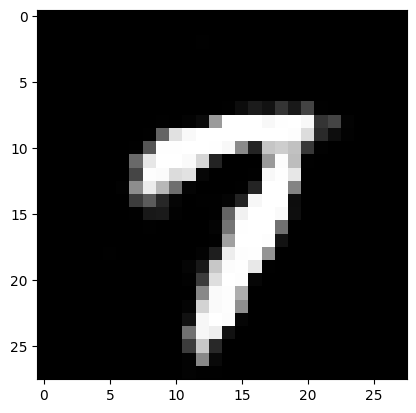

Epoch: 37050
loss_g: 0.9070453643798828 	loss_d: 1.0960091352462769
Epoch: 37100
loss_g: 0.893474817276001 	loss_d: 1.2804539203643799
Epoch: 37150
loss_g: 0.9195334315299988 	loss_d: 1.1619501113891602
Epoch: 37200
loss_g: 1.0319464206695557 	loss_d: 1.2069509029388428
Epoch: 37250
loss_g: 0.888697624206543 	loss_d: 1.2170288562774658
Ploting:  6


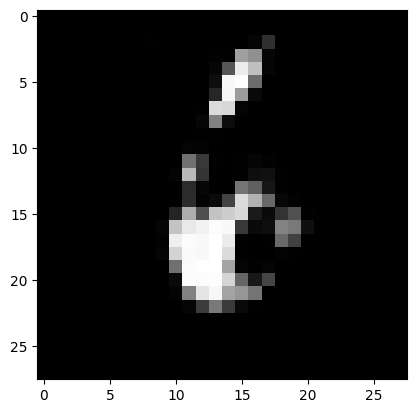

Ploting:  8


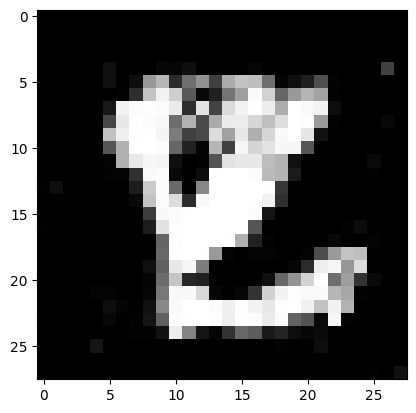

Ploting:  7


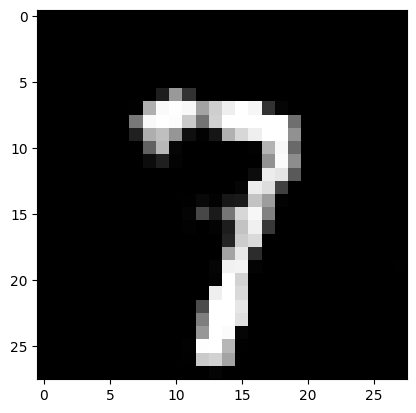

Ploting:  5


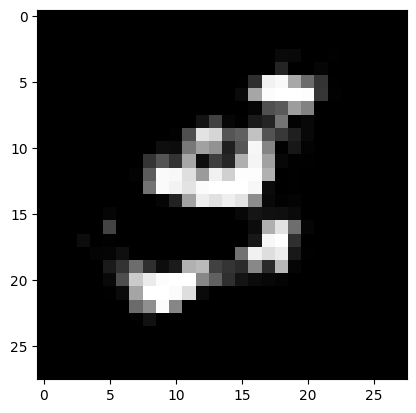

Ploting:  0


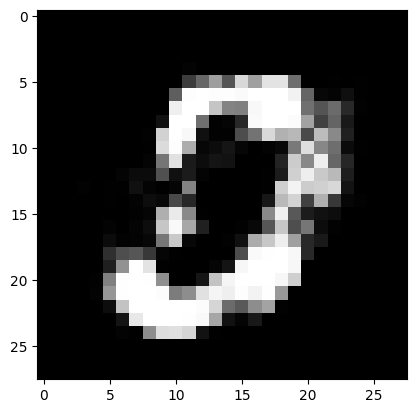

Epoch: 37300
loss_g: 1.0569639205932617 	loss_d: 1.1152541637420654
Epoch: 37350
loss_g: 0.8329526782035828 	loss_d: 1.2688976526260376
Epoch: 37400
loss_g: 1.152083158493042 	loss_d: 1.289206624031067
Epoch: 37450
loss_g: 0.9509149789810181 	loss_d: 1.1713426113128662
Epoch: 37500
loss_g: 0.6700435876846313 	loss_d: 1.1100772619247437
Ploting:  9


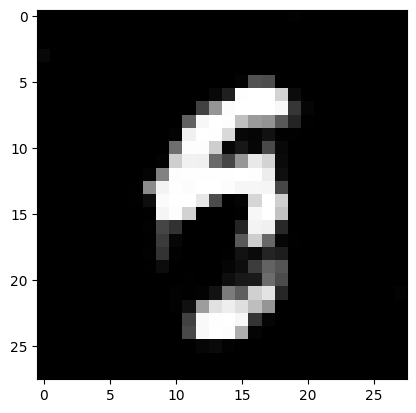

Ploting:  2


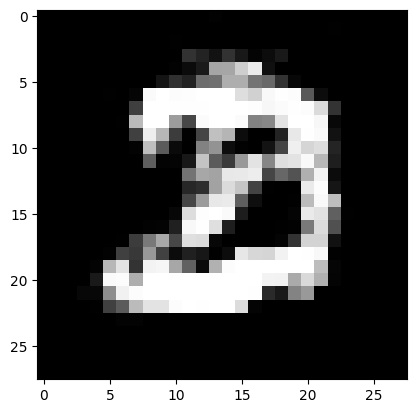

Ploting:  4


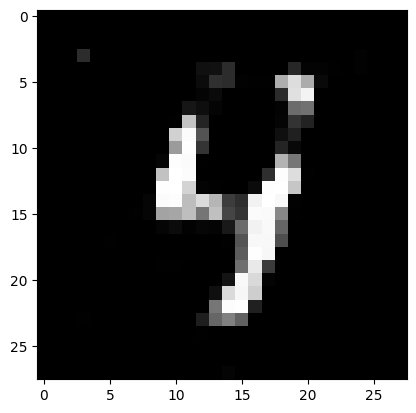

Ploting:  9


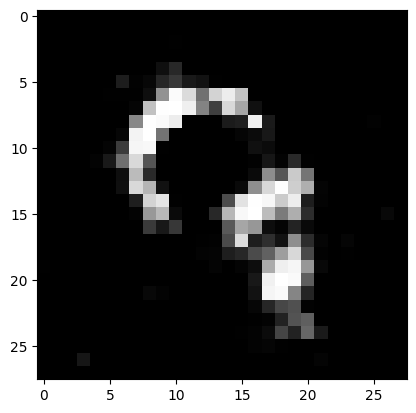

Ploting:  7


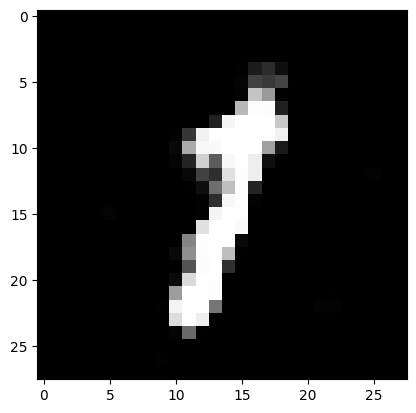

Epoch: 37550
loss_g: 1.0536326169967651 	loss_d: 1.2861394882202148
Epoch: 37600
loss_g: 1.2676653861999512 	loss_d: 1.1932440996170044
Epoch: 37650
loss_g: 1.0371408462524414 	loss_d: 1.2530301809310913
Epoch: 37700
loss_g: 0.7417144179344177 	loss_d: 1.232853889465332
Epoch: 37750
loss_g: 0.7736694812774658 	loss_d: 1.2713065147399902
Ploting:  6


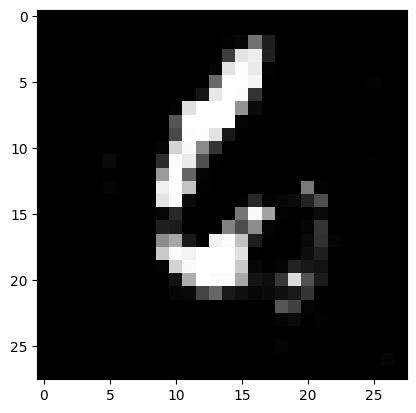

Ploting:  3


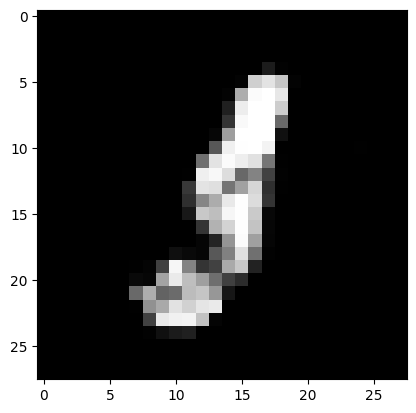

Ploting:  4


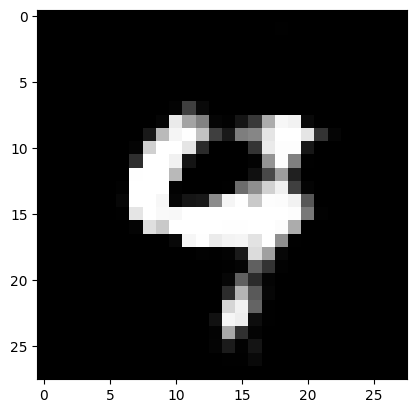

Ploting:  3


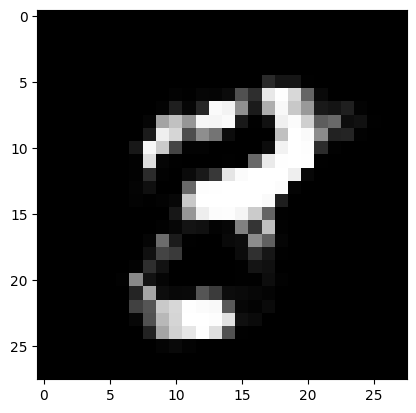

Ploting:  3


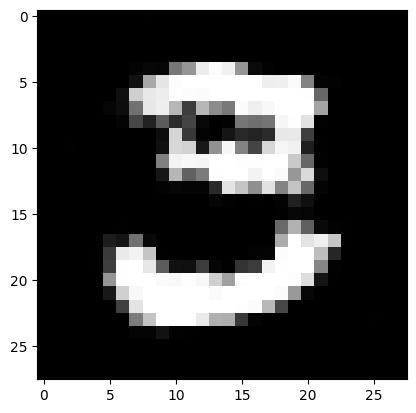

Epoch: 37800
loss_g: 1.0882656574249268 	loss_d: 1.1194220781326294
Epoch: 37850
loss_g: 1.0045711994171143 	loss_d: 1.1269471645355225
Epoch: 37900
loss_g: 0.9270645380020142 	loss_d: 1.0808547735214233
Epoch: 37950
loss_g: 0.8997846841812134 	loss_d: 1.154456377029419
Epoch: 38000
loss_g: 1.2267746925354004 	loss_d: 1.1340844631195068
Ploting:  8


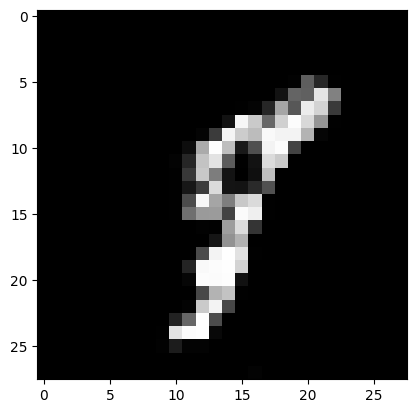

Ploting:  2


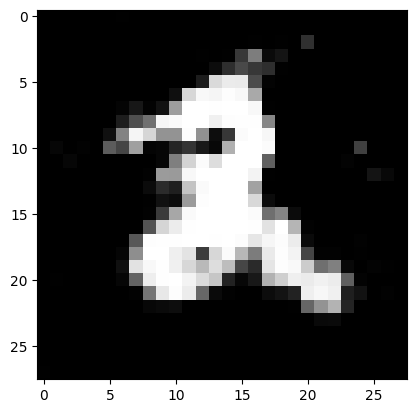

Ploting:  0


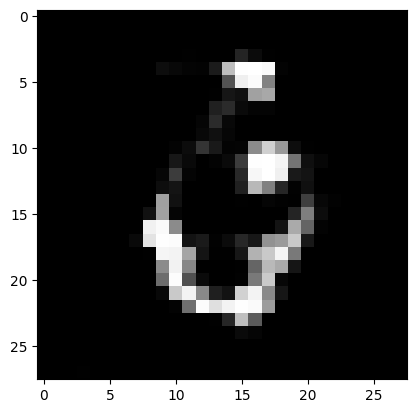

Ploting:  3


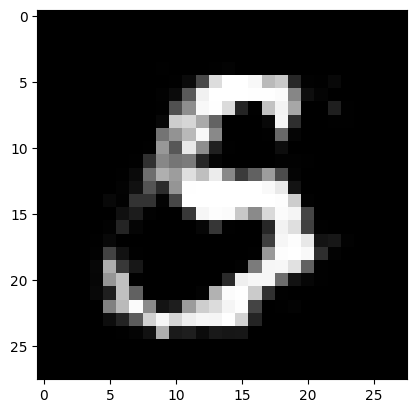

Ploting:  2


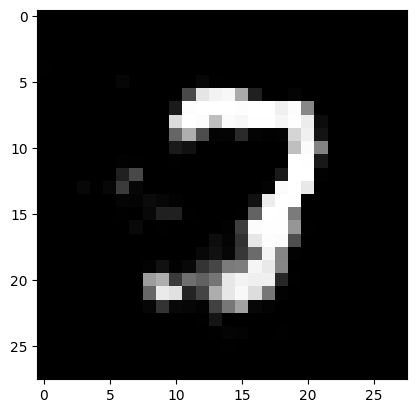

Epoch: 38050
loss_g: 1.2448763847351074 	loss_d: 1.1573057174682617
Epoch: 38100
loss_g: 1.0276768207550049 	loss_d: 1.1506339311599731
Epoch: 38150
loss_g: 0.9762976169586182 	loss_d: 1.1000571250915527
Epoch: 38200
loss_g: 1.1216613054275513 	loss_d: 1.257929801940918
Epoch: 38250
loss_g: 1.248337745666504 	loss_d: 1.3091098070144653
Ploting:  6


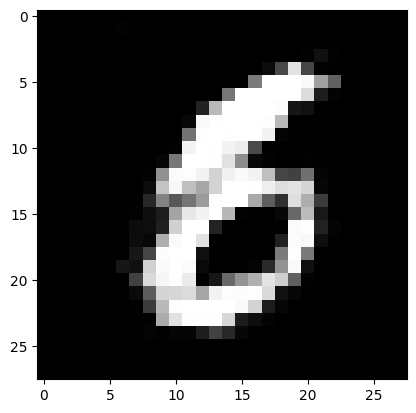

Ploting:  6


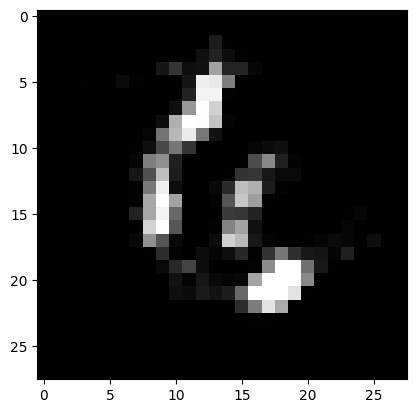

Ploting:  3


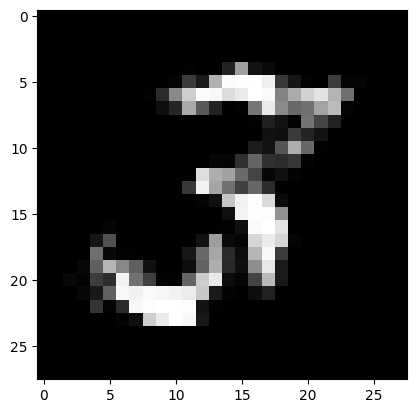

Ploting:  4


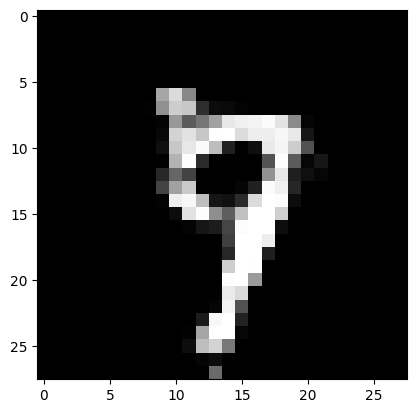

Ploting:  6


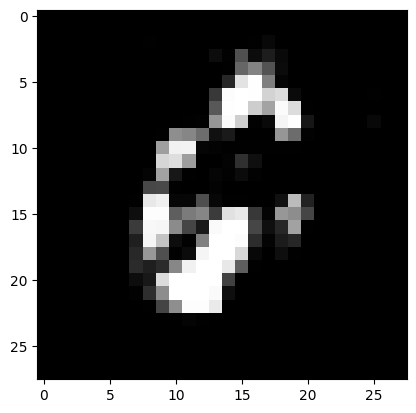

Epoch: 38300
loss_g: 0.895719051361084 	loss_d: 1.2363073825836182
Epoch: 38350
loss_g: 1.0728384256362915 	loss_d: 1.2941663265228271
Epoch: 38400
loss_g: 0.9511959552764893 	loss_d: 1.210813045501709
Epoch: 38450
loss_g: 1.1673105955123901 	loss_d: 1.181656837463379
Epoch: 38500
loss_g: 1.0122575759887695 	loss_d: 1.1983931064605713
Ploting:  6


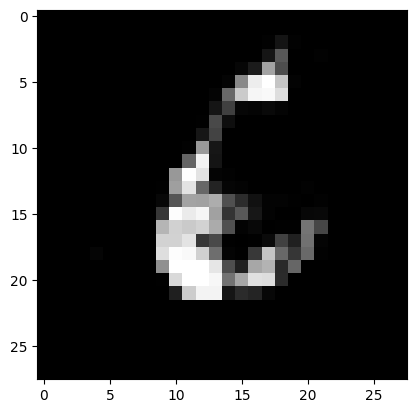

Ploting:  3


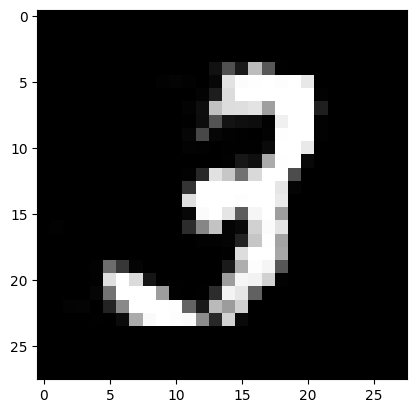

Ploting:  0


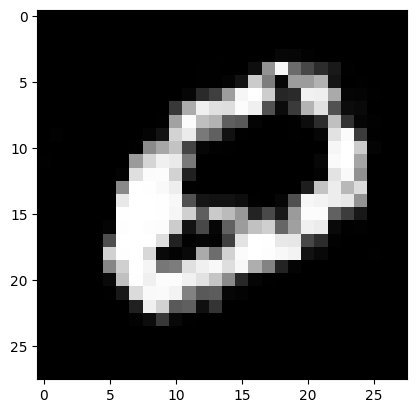

Ploting:  0


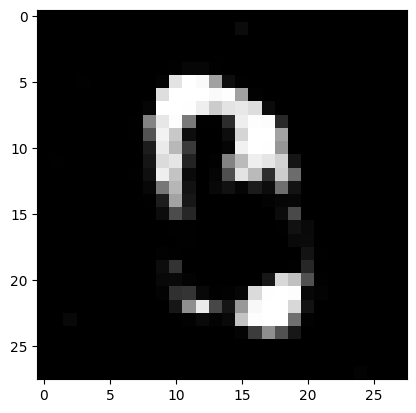

Ploting:  7


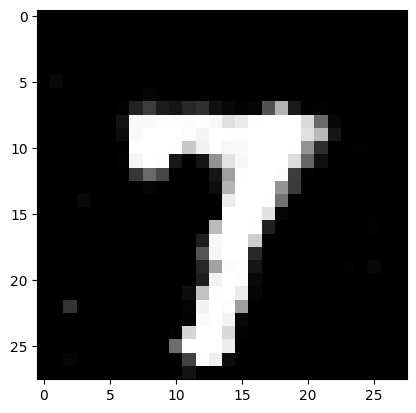

Epoch: 38550
loss_g: 1.0628714561462402 	loss_d: 1.2545137405395508
Epoch: 38600
loss_g: 0.9714348316192627 	loss_d: 1.2297074794769287
Epoch: 38650
loss_g: 0.9810149669647217 	loss_d: 1.1644303798675537
Epoch: 38700
loss_g: 0.977458119392395 	loss_d: 1.2325795888900757
Epoch: 38750
loss_g: 1.0411361455917358 	loss_d: 1.2258496284484863
Ploting:  8


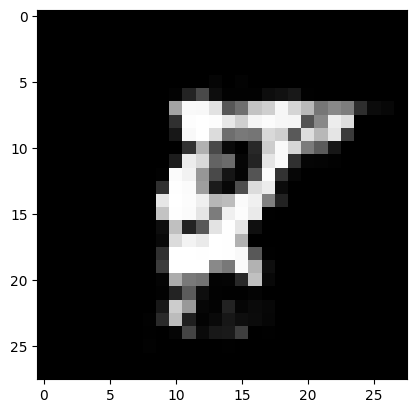

Ploting:  3


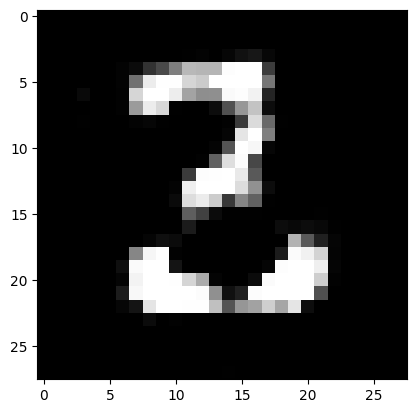

Ploting:  9


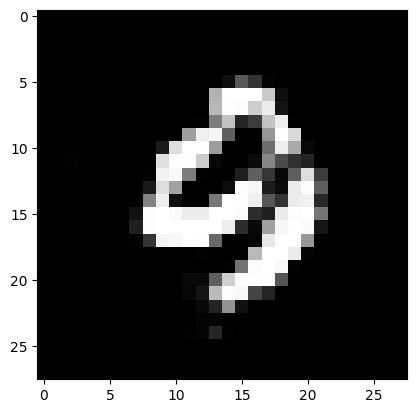

Ploting:  7


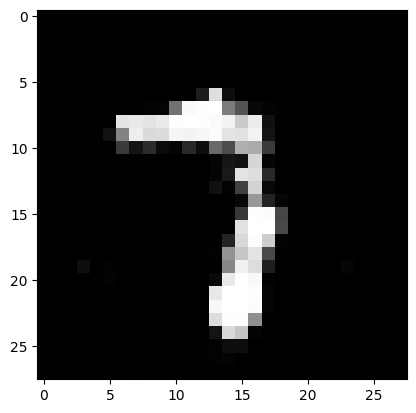

Ploting:  9


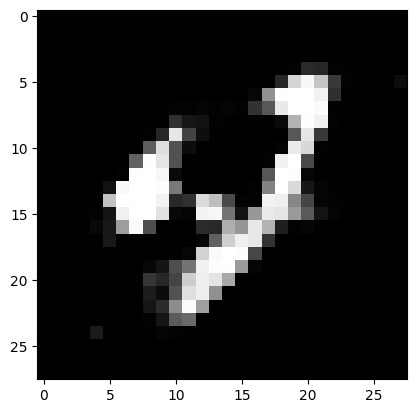

Epoch: 38800
loss_g: 0.8882801532745361 	loss_d: 1.1754341125488281
Epoch: 38850
loss_g: 1.2854888439178467 	loss_d: 1.1357972621917725
Epoch: 38900
loss_g: 1.0848984718322754 	loss_d: 1.1255712509155273
Epoch: 38950
loss_g: 0.8129401206970215 	loss_d: 1.164224624633789
Epoch: 39000
loss_g: 1.0692360401153564 	loss_d: 1.1780197620391846
Ploting:  0


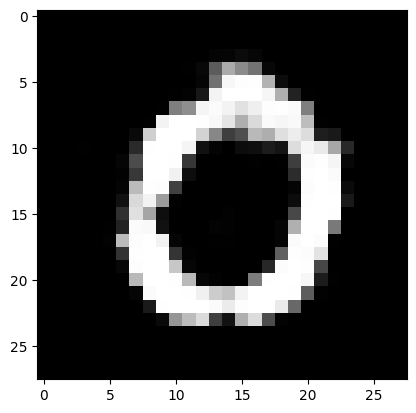

Ploting:  8


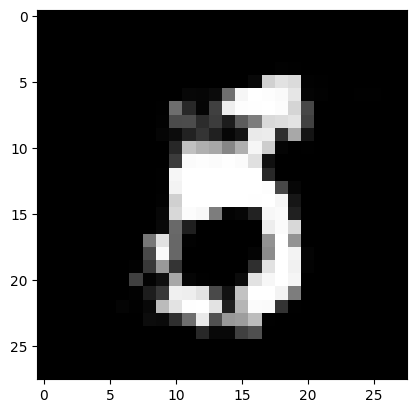

Ploting:  4


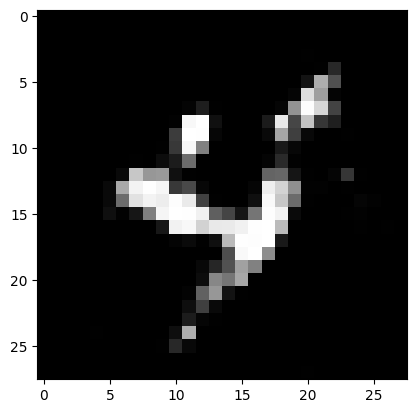

Ploting:  1


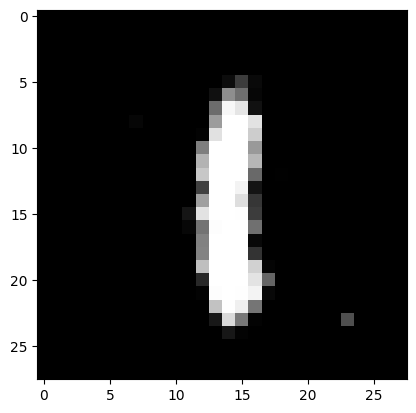

Ploting:  2


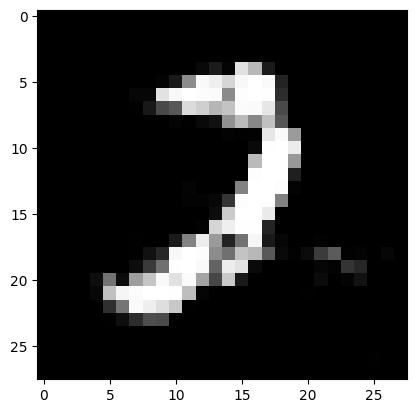

Epoch: 39050
loss_g: 0.8474392890930176 	loss_d: 1.2686474323272705
Epoch: 39100
loss_g: 1.2000303268432617 	loss_d: 1.142058253288269
Epoch: 39150
loss_g: 1.0139257907867432 	loss_d: 1.2051072120666504
Epoch: 39200
loss_g: 0.8349071741104126 	loss_d: 1.2805461883544922
Epoch: 39250
loss_g: 0.9247267246246338 	loss_d: 1.168945550918579
Ploting:  6


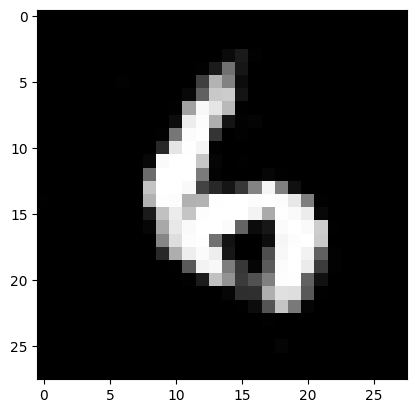

Ploting:  0


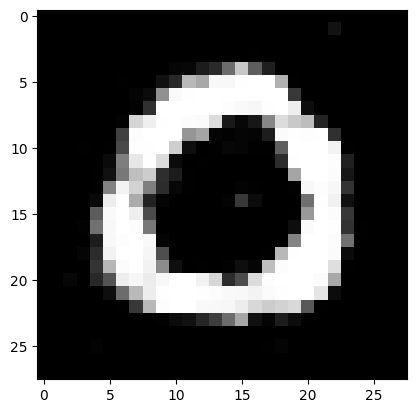

Ploting:  8


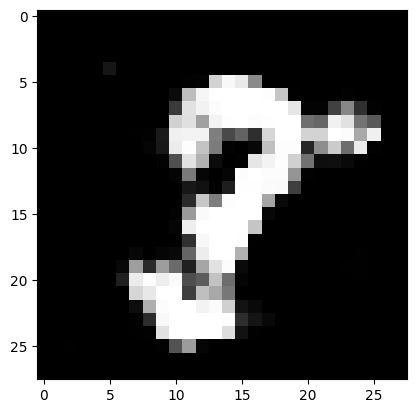

Ploting:  4


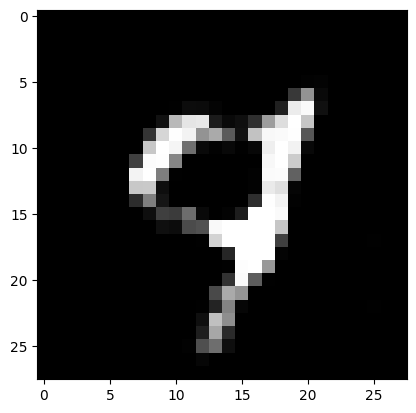

Ploting:  6


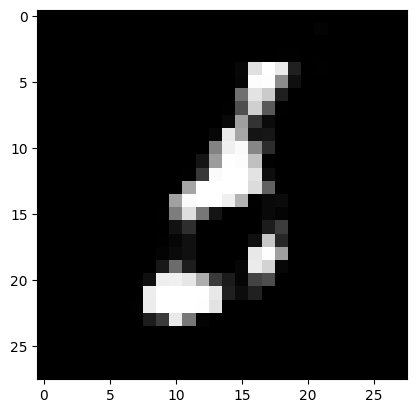

Epoch: 39300
loss_g: 1.0923877954483032 	loss_d: 1.1282362937927246
Epoch: 39350
loss_g: 0.9529029130935669 	loss_d: 1.224915862083435
Epoch: 39400
loss_g: 0.9709174036979675 	loss_d: 1.1835997104644775
Epoch: 39450
loss_g: 0.8195363283157349 	loss_d: 1.5209752321243286
Epoch: 39500
loss_g: 0.6651843190193176 	loss_d: 1.1519038677215576
Ploting:  2


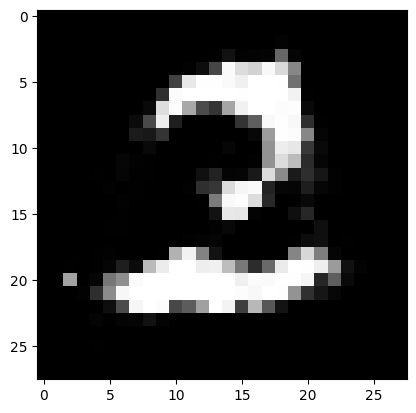

Ploting:  4


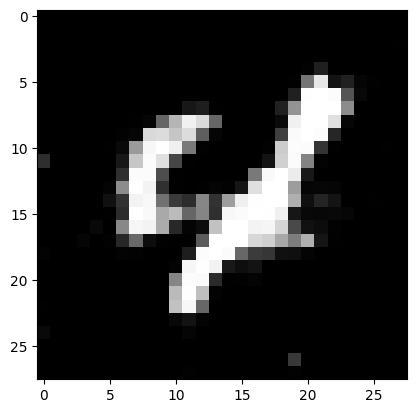

Ploting:  8


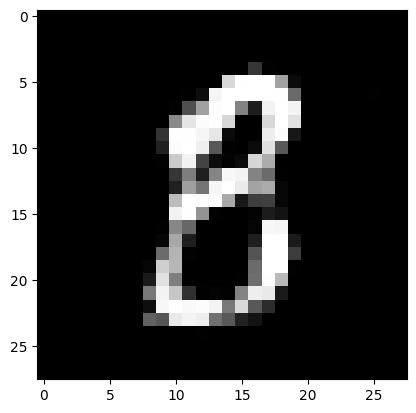

Ploting:  9


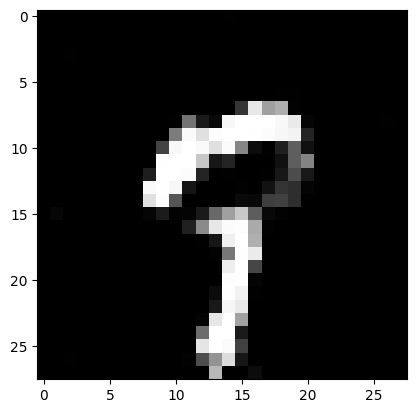

Ploting:  2


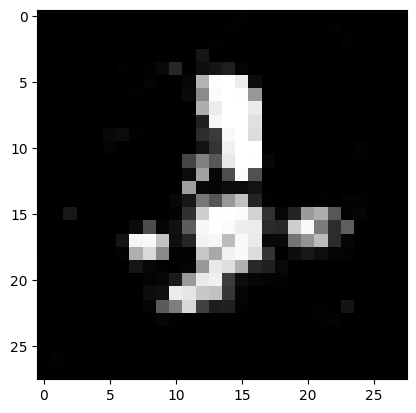

Epoch: 39550
loss_g: 1.4010816812515259 	loss_d: 1.2695385217666626
Epoch: 39600
loss_g: 0.9334561824798584 	loss_d: 1.1991560459136963
Epoch: 39650
loss_g: 0.8019595742225647 	loss_d: 1.1790977716445923
Epoch: 39700
loss_g: 0.8513700366020203 	loss_d: 1.2026934623718262
Epoch: 39750
loss_g: 0.6740055680274963 	loss_d: 1.2097244262695312
Ploting:  0


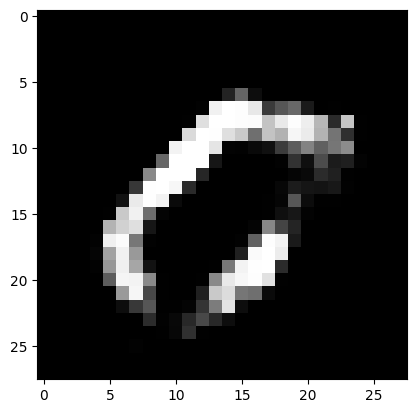

Ploting:  1


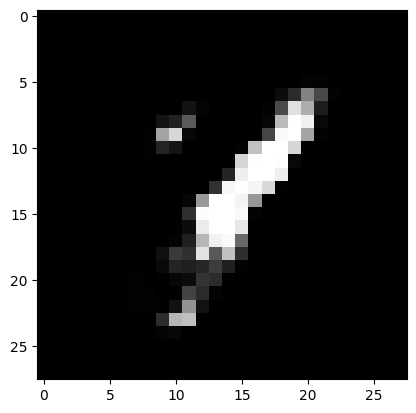

Ploting:  2


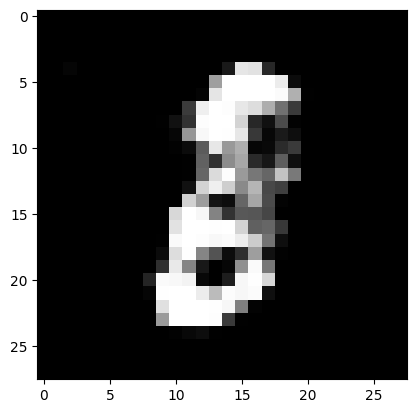

Ploting:  3


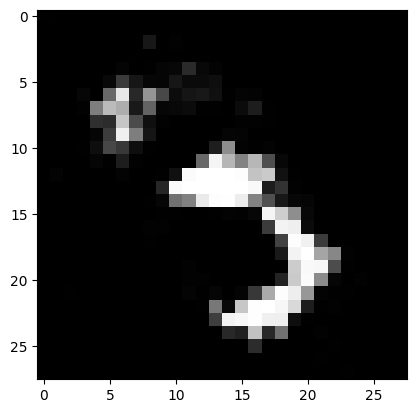

Ploting:  6


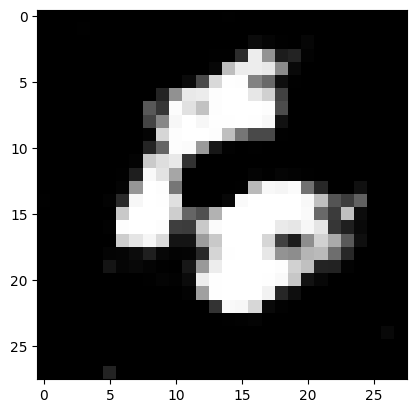

Epoch: 39800
loss_g: 0.9822046756744385 	loss_d: 1.1595131158828735
Epoch: 39850
loss_g: 1.1225690841674805 	loss_d: 1.1519322395324707
Epoch: 39900
loss_g: 0.8288828730583191 	loss_d: 1.2220265865325928
Epoch: 39950
loss_g: 1.4121143817901611 	loss_d: 1.2212193012237549
Epoch: 40000
loss_g: 0.8834739327430725 	loss_d: 1.240502119064331
Ploting:  2


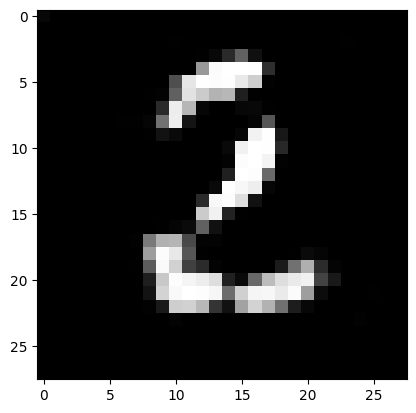

Ploting:  5


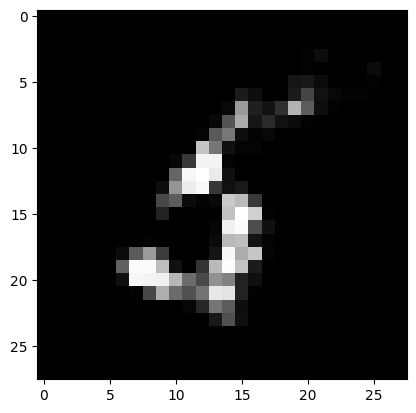

Ploting:  4


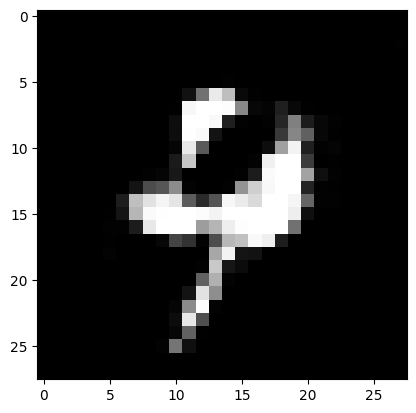

Ploting:  8


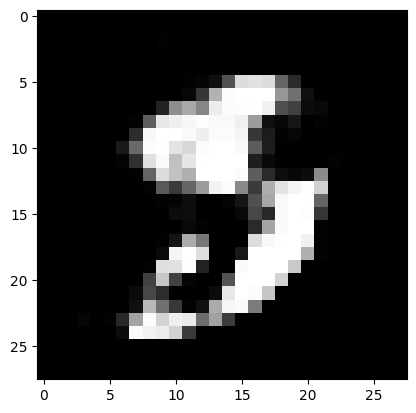

Ploting:  8


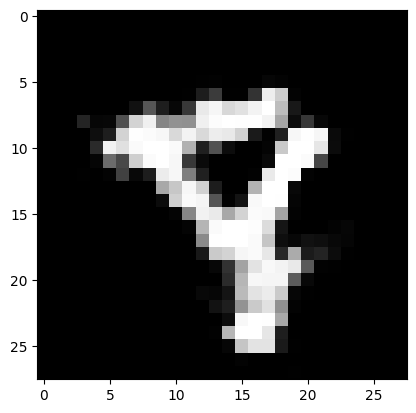

Epoch: 40050
loss_g: 0.9598785638809204 	loss_d: 1.1577520370483398
Epoch: 40100
loss_g: 1.039397120475769 	loss_d: 1.1758842468261719
Epoch: 40150
loss_g: 1.1476566791534424 	loss_d: 1.1582448482513428
Epoch: 40200
loss_g: 1.083622932434082 	loss_d: 1.1402666568756104
Epoch: 40250
loss_g: 1.0414708852767944 	loss_d: 1.060157060623169
Ploting:  1


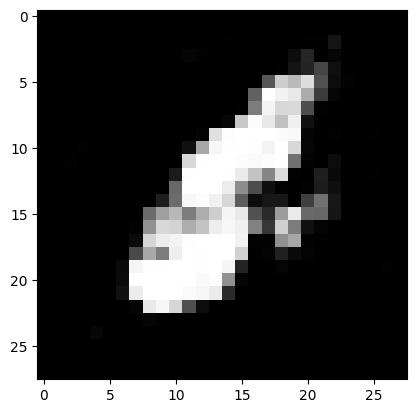

Ploting:  3


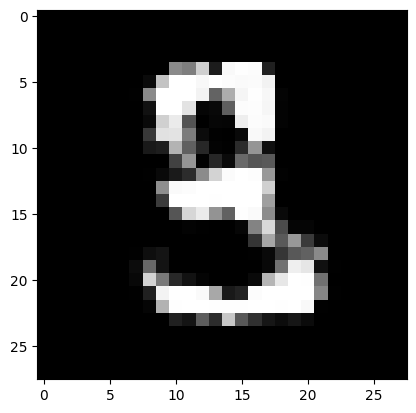

Ploting:  7


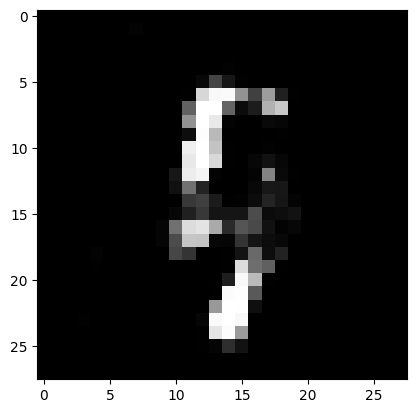

Ploting:  1


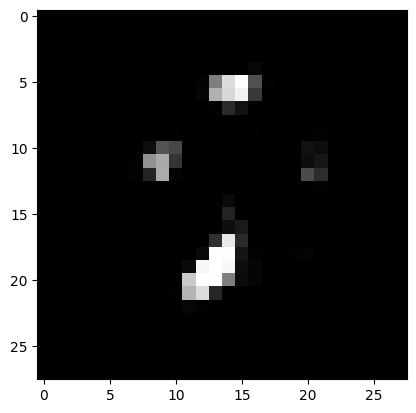

Ploting:  7


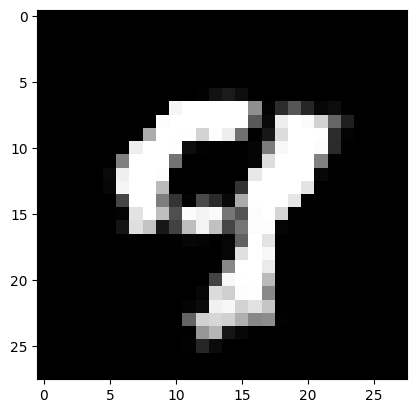

Epoch: 40300
loss_g: 0.9053027629852295 	loss_d: 1.1835436820983887
Epoch: 40350
loss_g: 1.135412335395813 	loss_d: 1.2067958116531372
Epoch: 40400
loss_g: 1.0604181289672852 	loss_d: 1.3193063735961914
Epoch: 40450
loss_g: 0.9252760410308838 	loss_d: 1.148040771484375
Epoch: 40500
loss_g: 1.0479289293289185 	loss_d: 1.1496522426605225
Ploting:  1


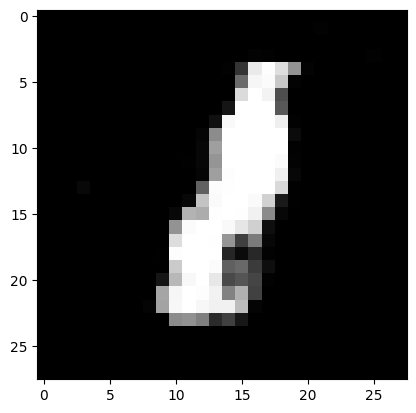

Ploting:  5


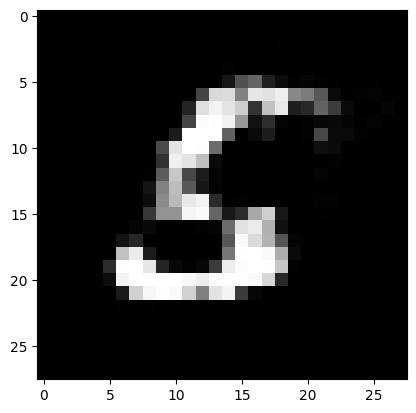

Ploting:  7


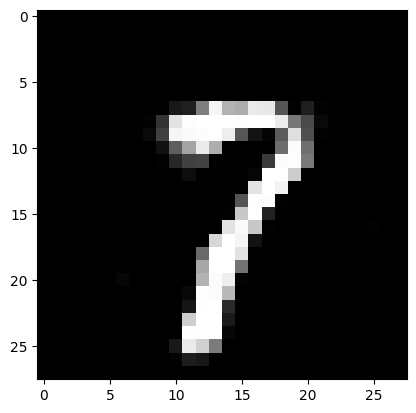

Ploting:  4


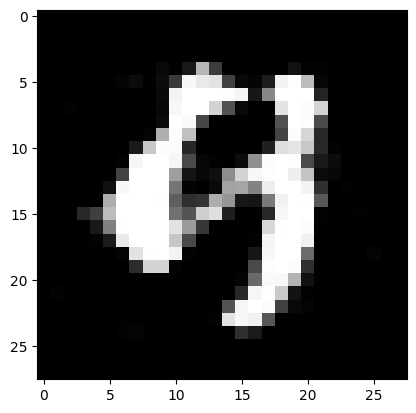

Ploting:  3


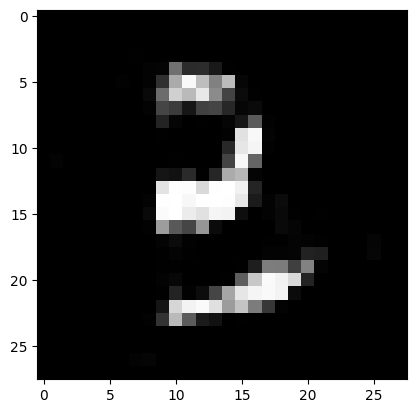

Epoch: 40550
loss_g: 1.0321683883666992 	loss_d: 1.0917543172836304
Epoch: 40600
loss_g: 0.8544127941131592 	loss_d: 1.0872321128845215
Epoch: 40650
loss_g: 0.5953571796417236 	loss_d: 1.283585548400879
Epoch: 40700
loss_g: 1.0306832790374756 	loss_d: 1.2816286087036133
Epoch: 40750
loss_g: 0.7165603041648865 	loss_d: 1.3019657135009766
Ploting:  9


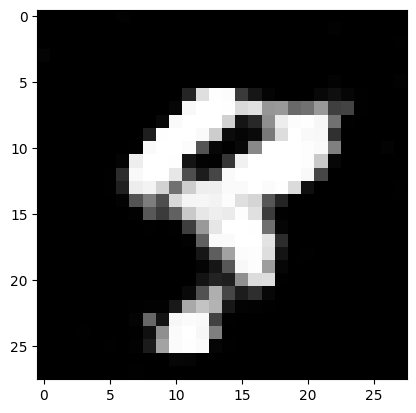

Ploting:  9


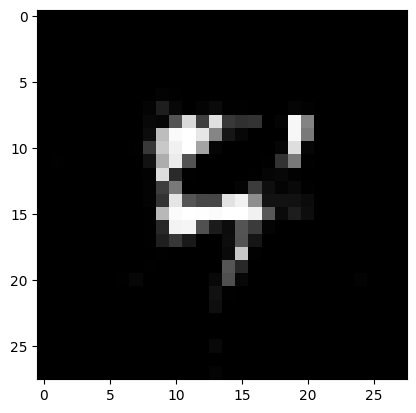

Ploting:  0


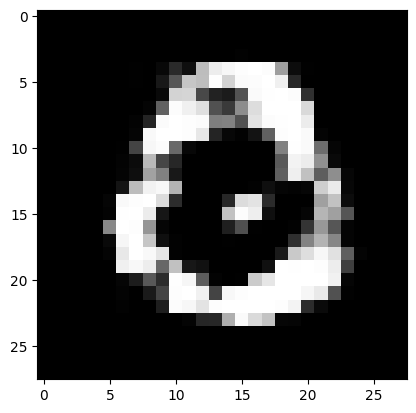

Ploting:  3


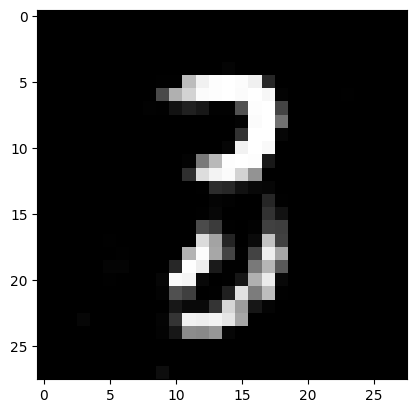

Ploting:  6


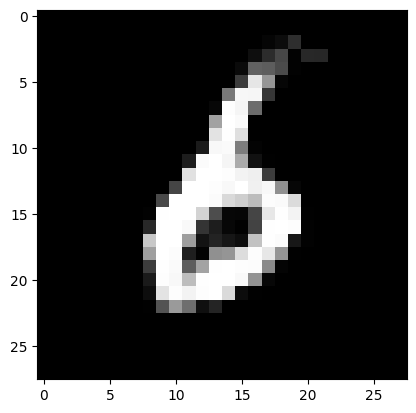

Epoch: 40800
loss_g: 1.0296509265899658 	loss_d: 1.207585096359253
Epoch: 40850
loss_g: 0.8162469863891602 	loss_d: 1.3104074001312256
Epoch: 40900
loss_g: 1.018265724182129 	loss_d: 1.1208760738372803
Epoch: 40950
loss_g: 0.891218900680542 	loss_d: 1.2932798862457275
Epoch: 41000
loss_g: 0.7966510057449341 	loss_d: 1.2450921535491943
Ploting:  4


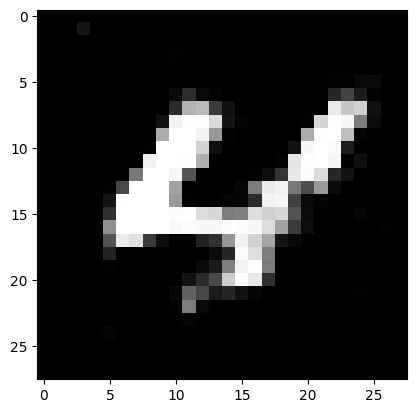

Ploting:  2


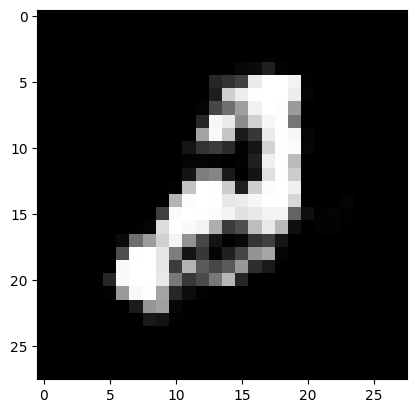

Ploting:  2


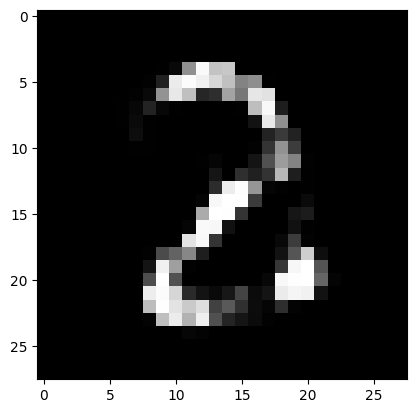

Ploting:  6


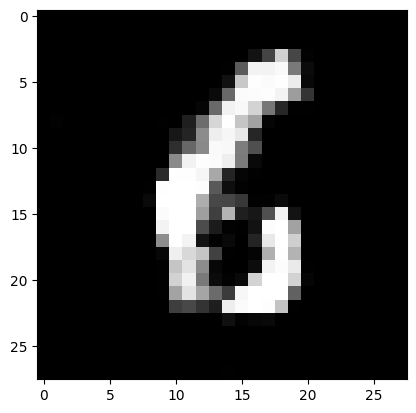

Ploting:  7


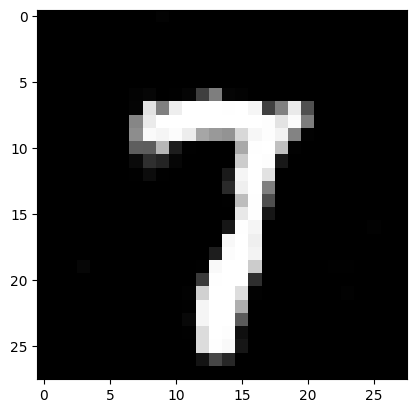

Epoch: 41050
loss_g: 1.055864691734314 	loss_d: 1.2184150218963623
Epoch: 41100
loss_g: 1.1004459857940674 	loss_d: 1.1980538368225098
Epoch: 41150
loss_g: 0.8811023831367493 	loss_d: 1.172884464263916
Epoch: 41200
loss_g: 1.0268235206604004 	loss_d: 1.119734764099121
Epoch: 41250
loss_g: 1.1135790348052979 	loss_d: 1.1432106494903564
Ploting:  6


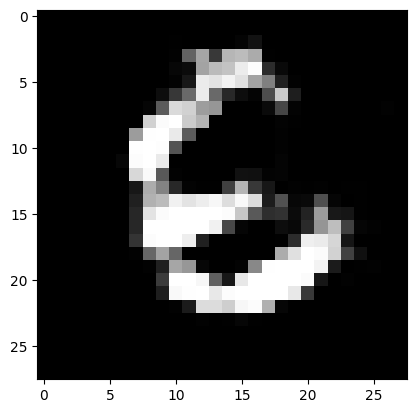

Ploting:  9


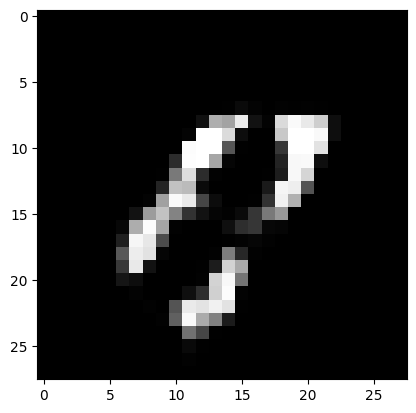

Ploting:  1


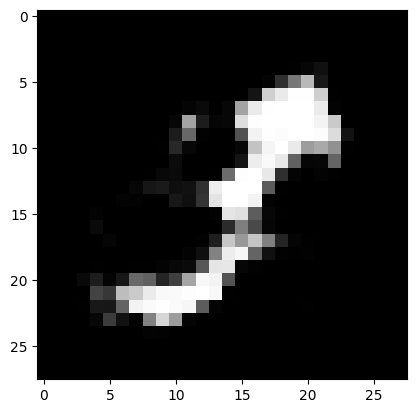

Ploting:  7


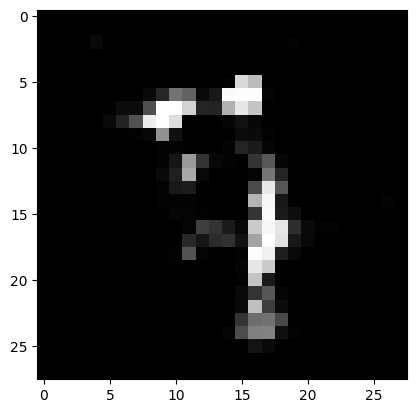

Ploting:  1


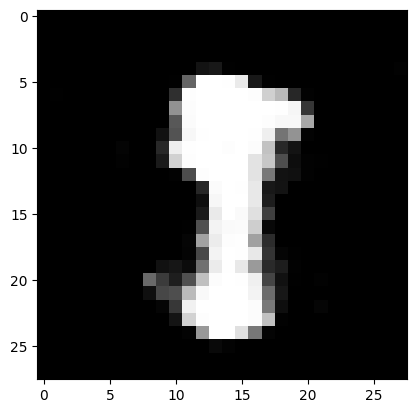

Epoch: 41300
loss_g: 1.0257519483566284 	loss_d: 1.0856807231903076
Epoch: 41350
loss_g: 1.05081307888031 	loss_d: 1.174814224243164
Epoch: 41400
loss_g: 1.1302683353424072 	loss_d: 1.1760728359222412
Epoch: 41450
loss_g: 0.8049734830856323 	loss_d: 1.218465805053711
Epoch: 41500
loss_g: 0.8075538873672485 	loss_d: 1.1182719469070435
Ploting:  2


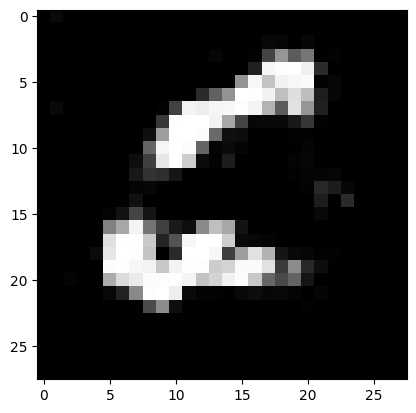

Ploting:  3


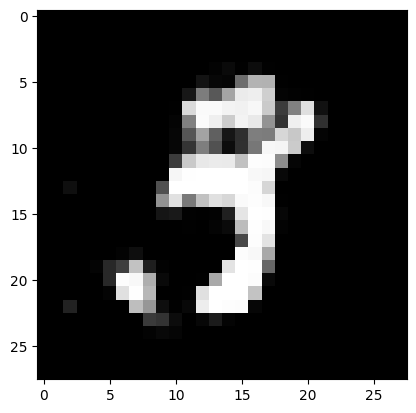

Ploting:  8


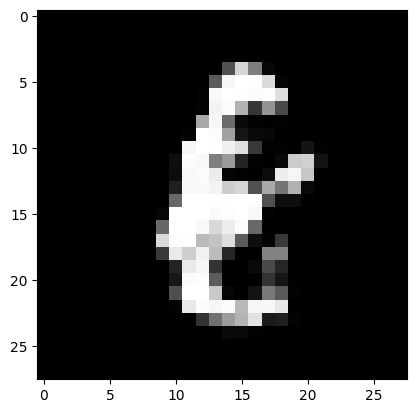

Ploting:  7


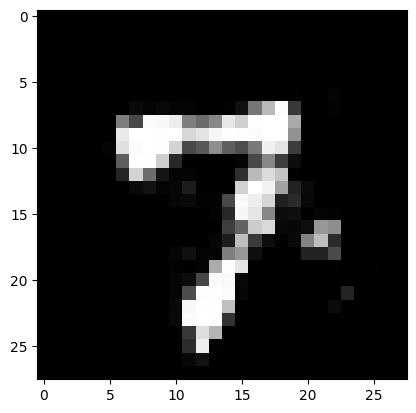

Ploting:  3


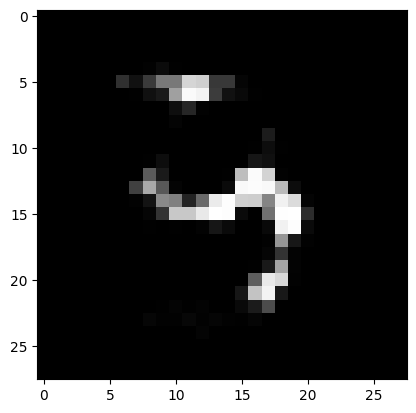

Epoch: 41550
loss_g: 1.0482454299926758 	loss_d: 1.1267480850219727
Epoch: 41600
loss_g: 0.9941544532775879 	loss_d: 1.22628915309906
Epoch: 41650
loss_g: 1.192647099494934 	loss_d: 1.1800702810287476
Epoch: 41700
loss_g: 1.1533005237579346 	loss_d: 1.2658822536468506
Epoch: 41750
loss_g: 0.8299687504768372 	loss_d: 1.2018321752548218
Ploting:  0


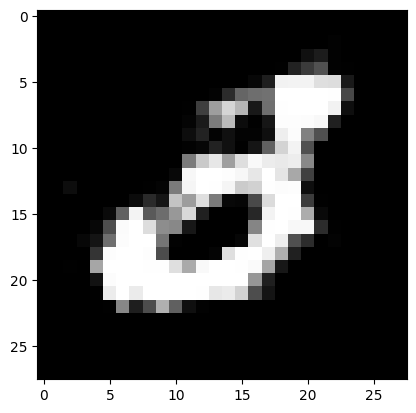

Ploting:  0


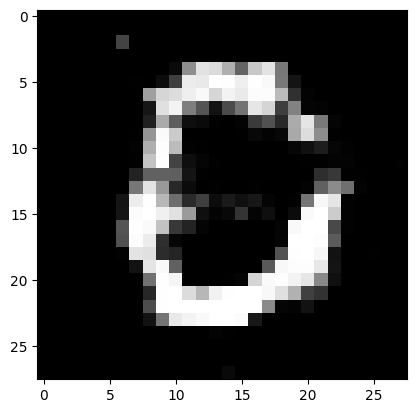

Ploting:  1


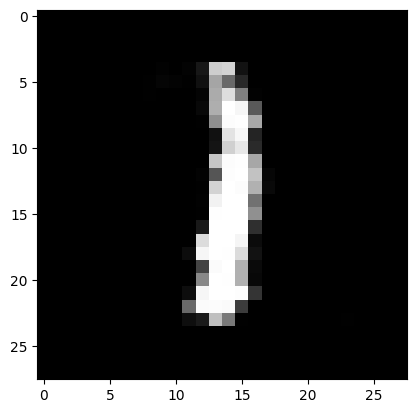

Ploting:  9


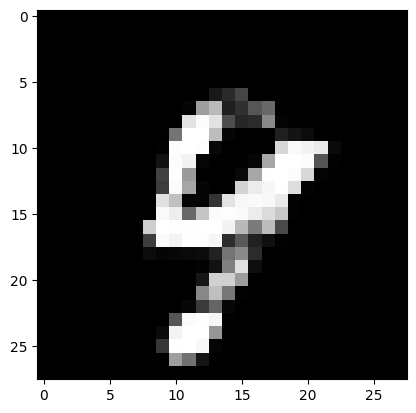

Ploting:  7


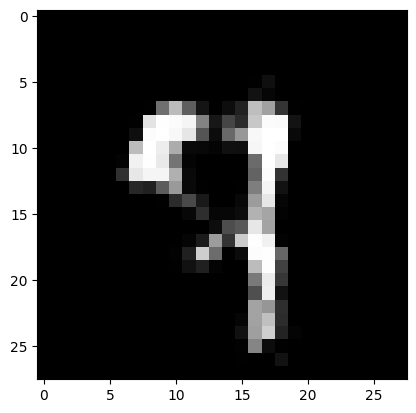

Epoch: 41800
loss_g: 1.4057629108428955 	loss_d: 1.3319740295410156
Epoch: 41850
loss_g: 1.0251004695892334 	loss_d: 1.1889665126800537
Epoch: 41900
loss_g: 0.6642533540725708 	loss_d: 1.1118223667144775
Epoch: 41950
loss_g: 0.9280701875686646 	loss_d: 1.1492996215820312
Epoch: 42000
loss_g: 1.2202017307281494 	loss_d: 1.142348289489746
Ploting:  2


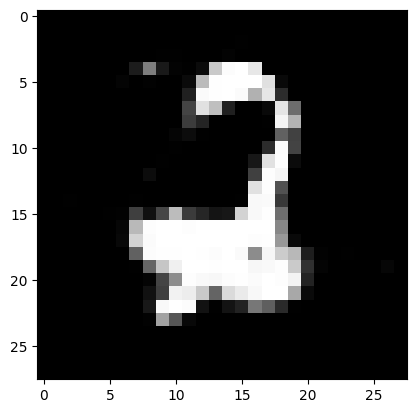

Ploting:  8


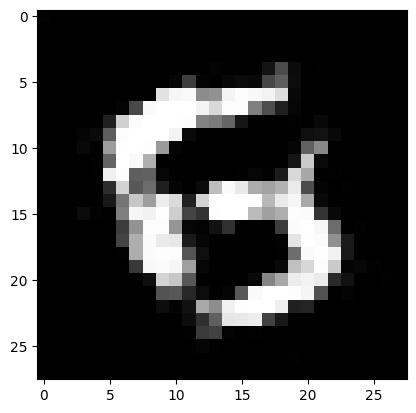

Ploting:  5


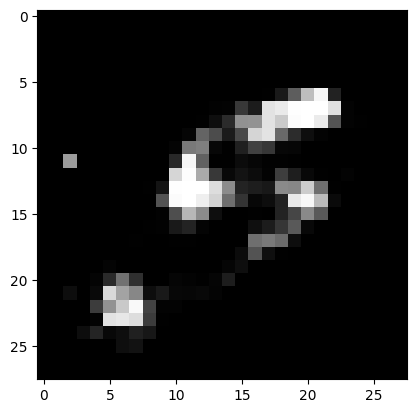

Ploting:  8


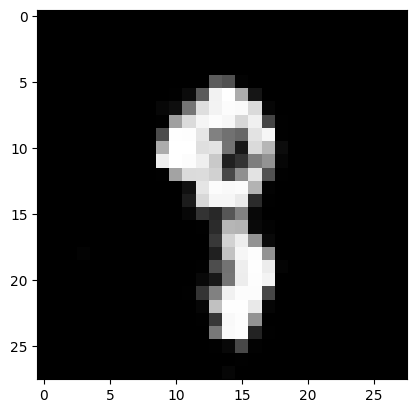

Ploting:  5


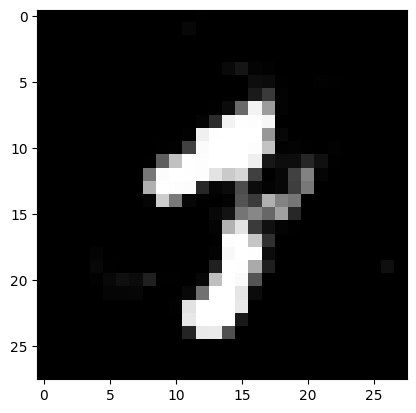

Epoch: 42050
loss_g: 0.9686648845672607 	loss_d: 1.2878227233886719
Epoch: 42100
loss_g: 0.9859416484832764 	loss_d: 1.2765394449234009
Epoch: 42150
loss_g: 0.7006443738937378 	loss_d: 1.3629722595214844
Epoch: 42200
loss_g: 1.0432169437408447 	loss_d: 1.3256359100341797
Epoch: 42250
loss_g: 0.9361475706100464 	loss_d: 1.2404589653015137
Ploting:  8


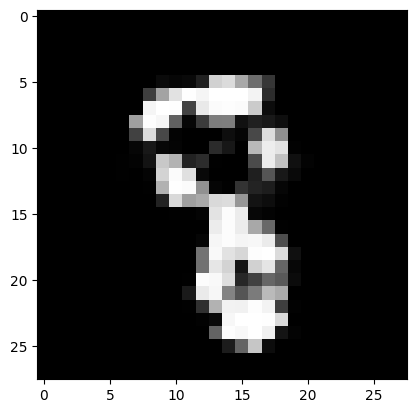

Ploting:  8


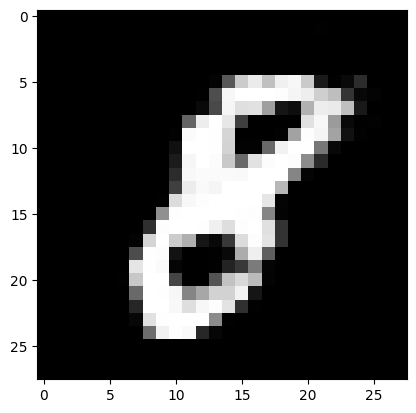

Ploting:  7


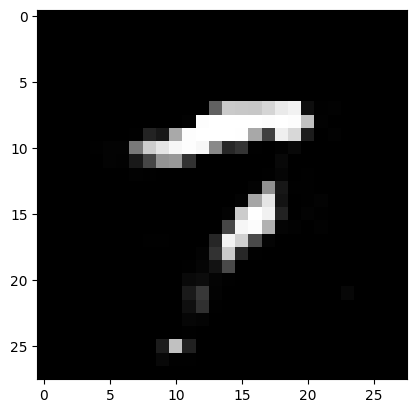

Ploting:  6


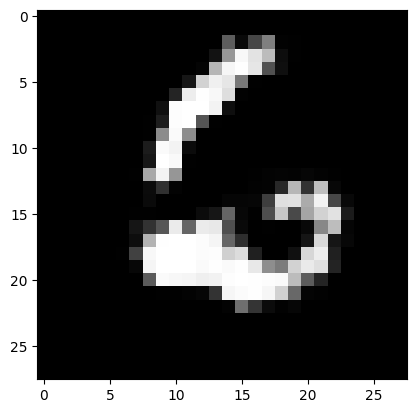

Ploting:  3


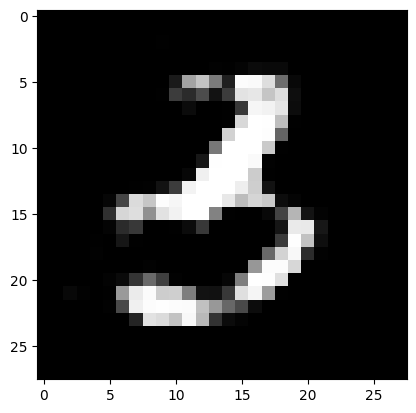

Epoch: 42300
loss_g: 0.9867367744445801 	loss_d: 1.1146758794784546
Epoch: 42350
loss_g: 0.8647600412368774 	loss_d: 1.121842622756958
Epoch: 42400
loss_g: 1.2349400520324707 	loss_d: 1.2642353773117065
Epoch: 42450
loss_g: 0.7343883514404297 	loss_d: 1.2840209007263184
Epoch: 42500
loss_g: 0.8767896890640259 	loss_d: 1.2294683456420898
Ploting:  3


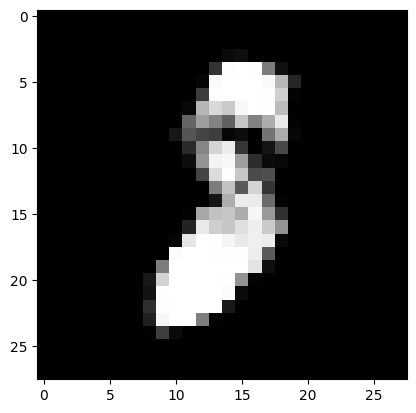

Ploting:  4


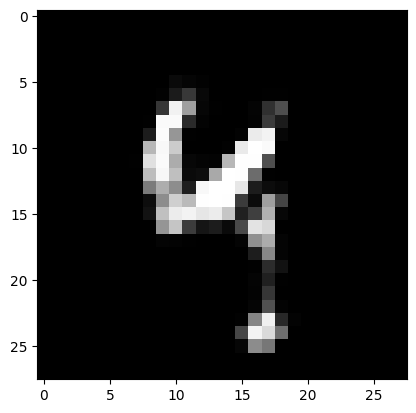

Ploting:  4


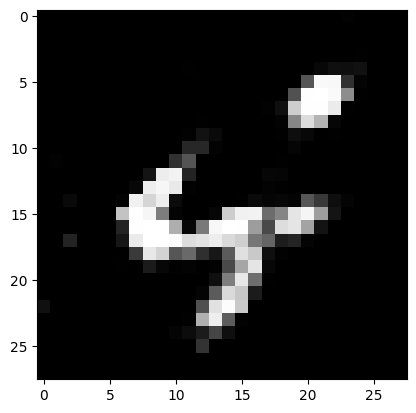

Ploting:  3


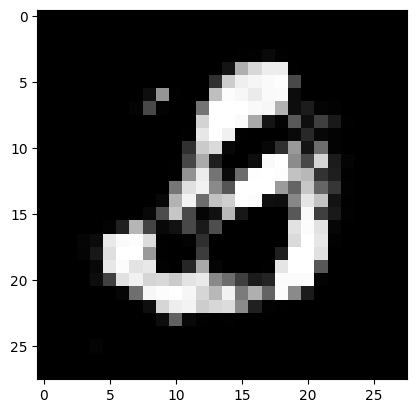

Ploting:  9


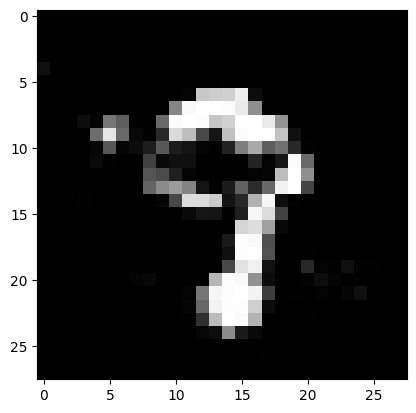

Epoch: 42550
loss_g: 1.0455968379974365 	loss_d: 1.289416790008545
Epoch: 42600
loss_g: 0.9744725227355957 	loss_d: 1.1751160621643066
Epoch: 42650
loss_g: 0.8903769254684448 	loss_d: 1.1085540056228638
Epoch: 42700
loss_g: 1.1571499109268188 	loss_d: 1.2134296894073486
Epoch: 42750
loss_g: 1.388047695159912 	loss_d: 1.3260869979858398
Ploting:  5


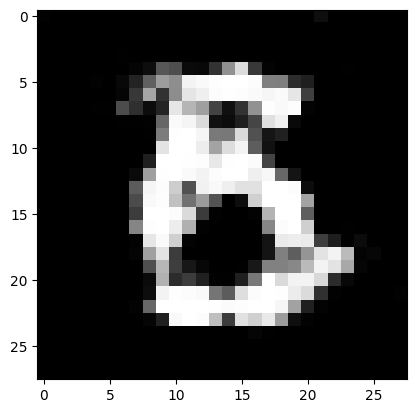

Ploting:  4


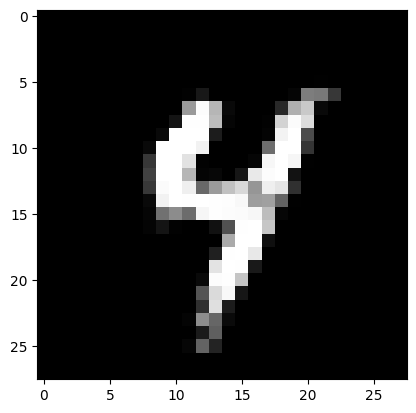

Ploting:  1


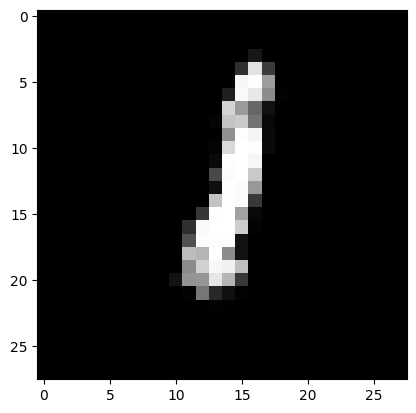

Ploting:  0


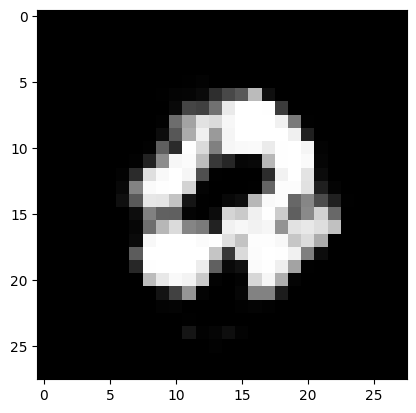

Ploting:  0


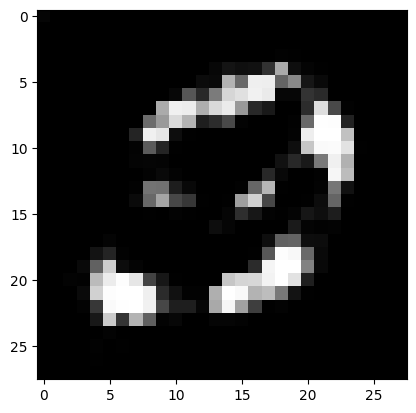

Epoch: 42800
loss_g: 0.9701294898986816 	loss_d: 1.1700899600982666
Epoch: 42850
loss_g: 0.9242467880249023 	loss_d: 1.1163992881774902
Epoch: 42900
loss_g: 1.019742727279663 	loss_d: 1.0649137496948242
Epoch: 42950
loss_g: 0.9215274453163147 	loss_d: 1.152725100517273
Epoch: 43000
loss_g: 1.0002326965332031 	loss_d: 1.100874423980713
Ploting:  7


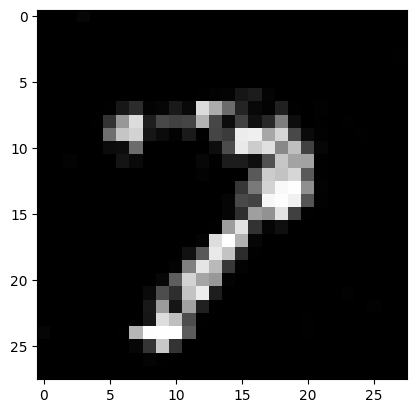

Ploting:  9


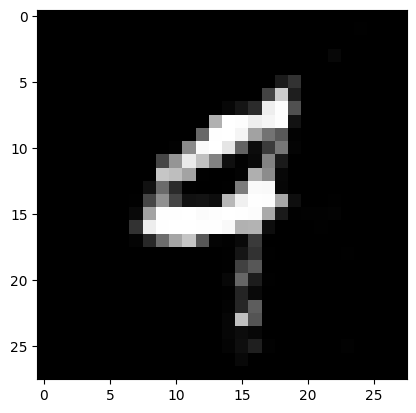

Ploting:  2


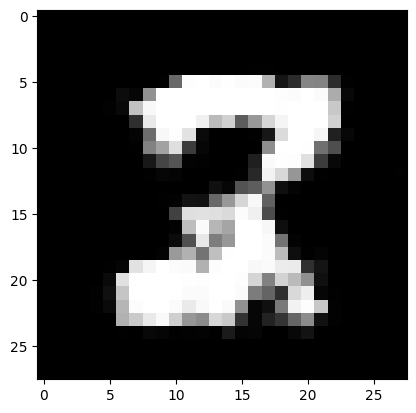

Ploting:  5


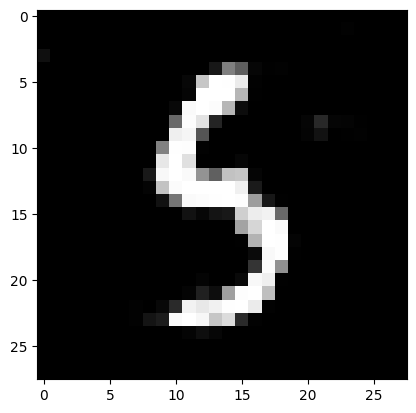

Ploting:  2


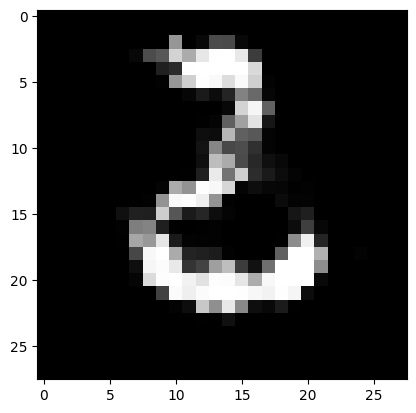

Epoch: 43050
loss_g: 0.8691263794898987 	loss_d: 1.1266100406646729
Epoch: 43100
loss_g: 0.9383216500282288 	loss_d: 1.1743483543395996
Epoch: 43150
loss_g: 0.7108980417251587 	loss_d: 1.2599918842315674
Epoch: 43200
loss_g: 1.0501806735992432 	loss_d: 1.2581753730773926
Epoch: 43250
loss_g: 0.9558975696563721 	loss_d: 1.19839608669281
Ploting:  6


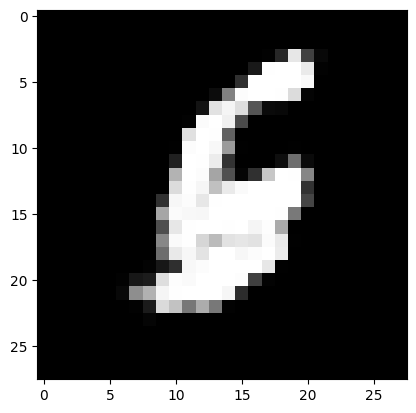

Ploting:  3


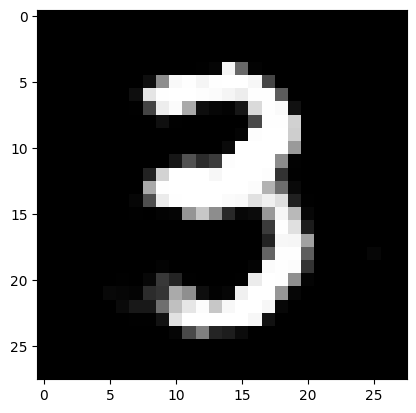

Ploting:  6


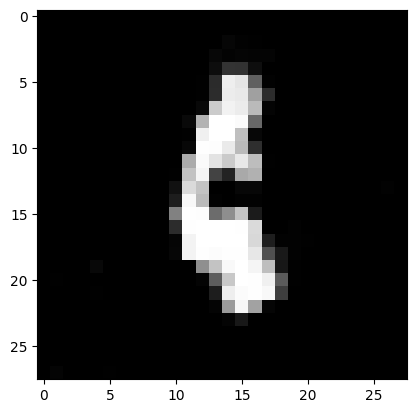

Ploting:  0


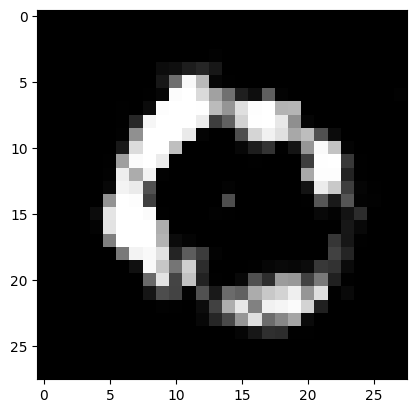

Ploting:  7


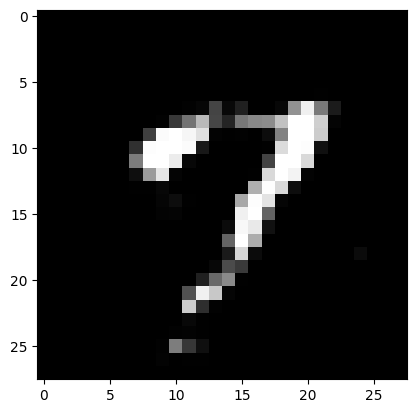

Epoch: 43300
loss_g: 0.9724419713020325 	loss_d: 1.2237308025360107
Epoch: 43350
loss_g: 0.7753530740737915 	loss_d: 1.299381136894226
Epoch: 43400
loss_g: 0.6760005950927734 	loss_d: 1.1778144836425781
Epoch: 43450
loss_g: 0.93379807472229 	loss_d: 1.1662688255310059
Epoch: 43500
loss_g: 1.0336670875549316 	loss_d: 1.376772165298462
Ploting:  6


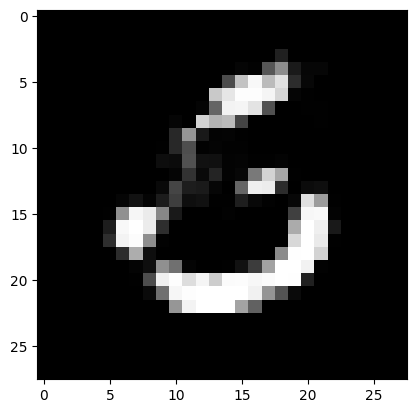

Ploting:  1


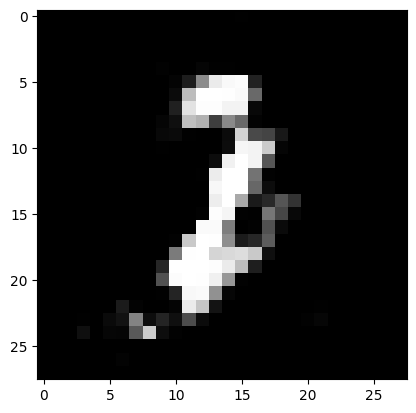

Ploting:  4


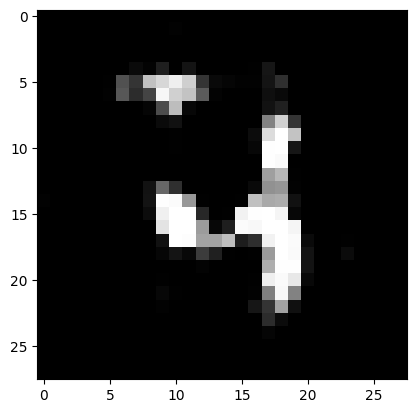

Ploting:  9


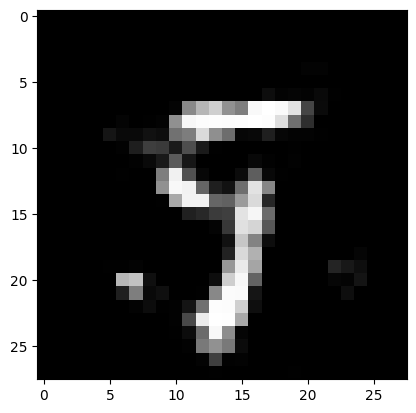

Ploting:  9


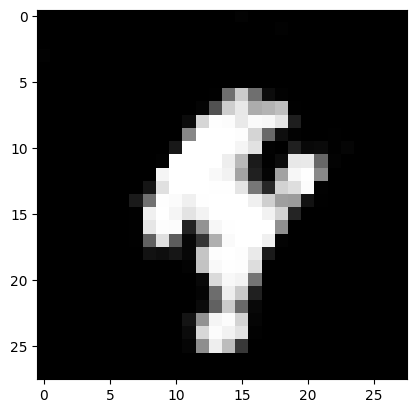

Epoch: 43550
loss_g: 0.8687106370925903 	loss_d: 1.0617884397506714
Epoch: 43600
loss_g: 0.9209282398223877 	loss_d: 1.2834737300872803
Epoch: 43650
loss_g: 0.9507503509521484 	loss_d: 1.1879127025604248
Epoch: 43700
loss_g: 0.9571824073791504 	loss_d: 1.302958607673645
Epoch: 43750
loss_g: 1.115037202835083 	loss_d: 1.2430598735809326
Ploting:  6


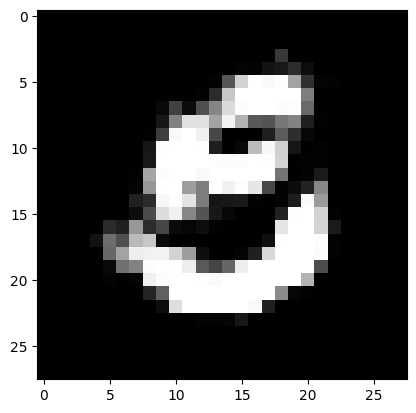

Ploting:  9


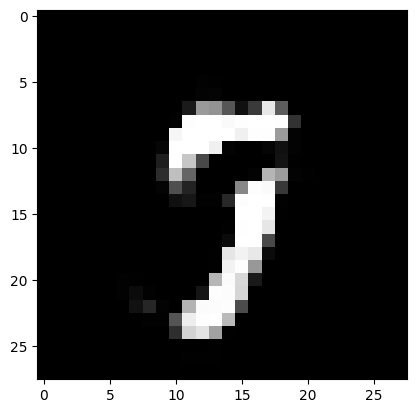

Ploting:  9


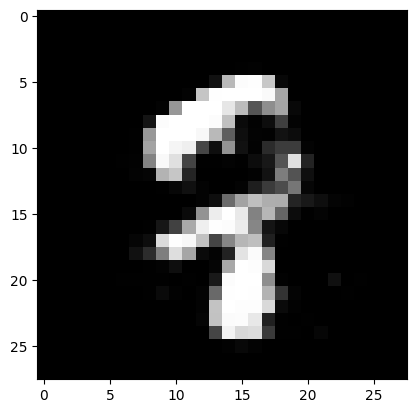

Ploting:  4


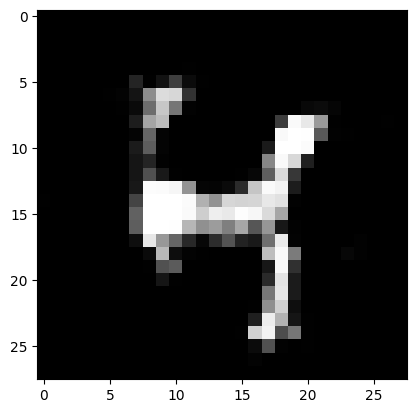

Ploting:  1


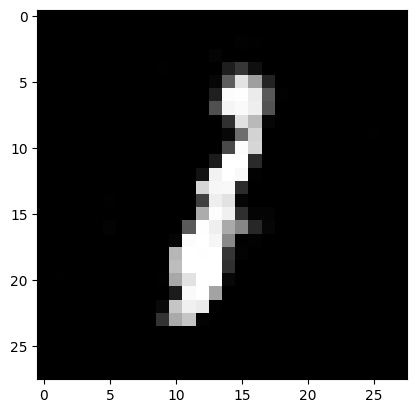

Epoch: 43800
loss_g: 0.9013896584510803 	loss_d: 1.2612667083740234
Epoch: 43850
loss_g: 1.0496506690979004 	loss_d: 1.277245044708252
Epoch: 43900
loss_g: 0.854015588760376 	loss_d: 1.2259505987167358
Epoch: 43950
loss_g: 0.8085153698921204 	loss_d: 1.1537322998046875
Epoch: 44000
loss_g: 1.435500144958496 	loss_d: 1.3449418544769287
Ploting:  1


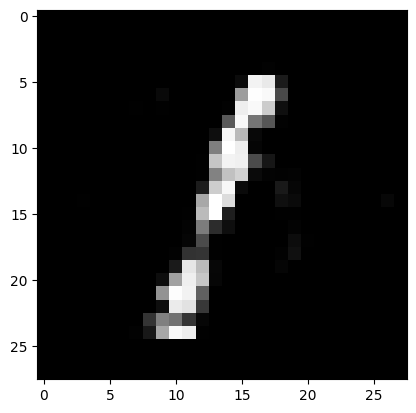

Ploting:  5


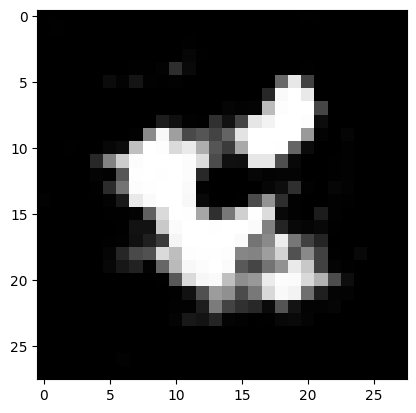

Ploting:  7


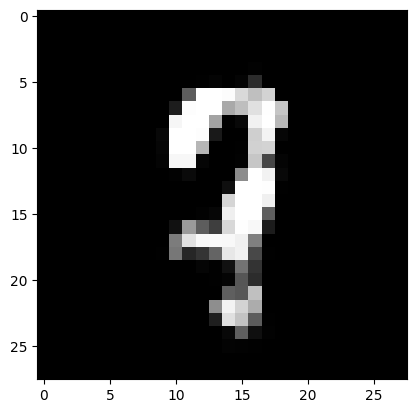

Ploting:  1


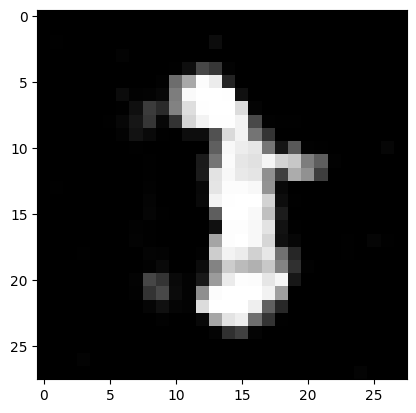

Ploting:  5


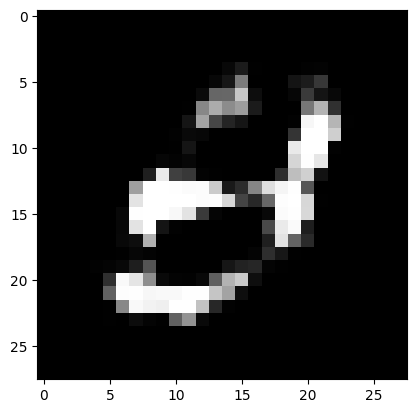

Epoch: 44050
loss_g: 0.7700233459472656 	loss_d: 1.1691375970840454
Epoch: 44100
loss_g: 0.9420925378799438 	loss_d: 1.3010847568511963
Epoch: 44150
loss_g: 1.2396435737609863 	loss_d: 1.2763044834136963
Epoch: 44200
loss_g: 0.8779828548431396 	loss_d: 1.2119755744934082
Epoch: 44250
loss_g: 1.2863494157791138 	loss_d: 1.2055389881134033
Ploting:  3


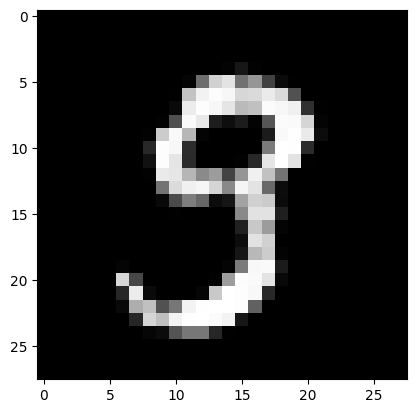

Ploting:  3


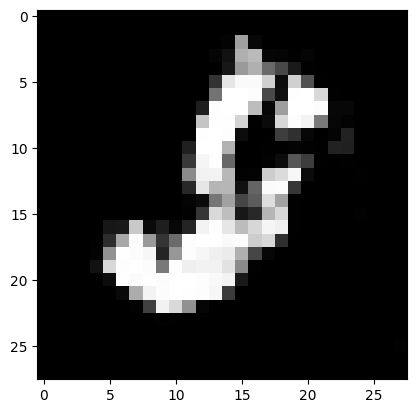

Ploting:  1


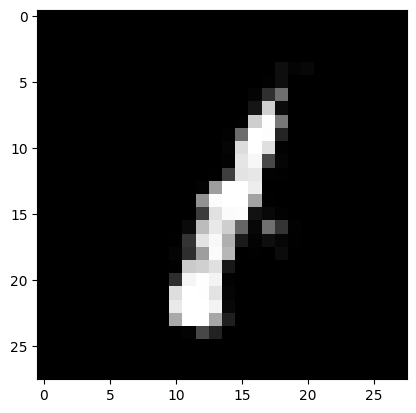

Ploting:  8


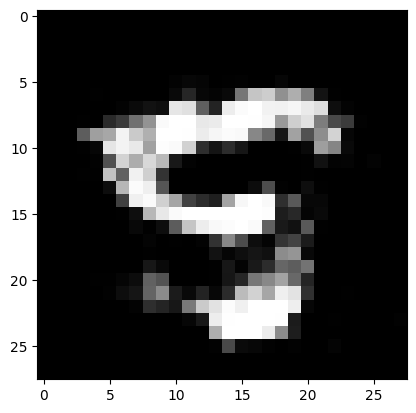

Ploting:  6


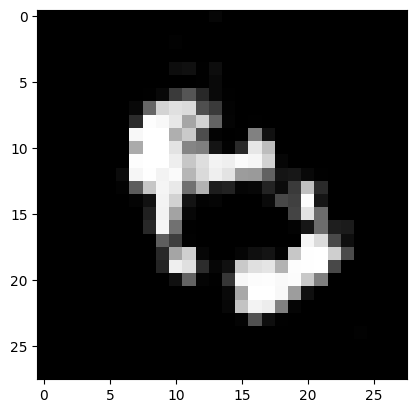

Epoch: 44300
loss_g: 0.7007433772087097 	loss_d: 1.169357419013977
Epoch: 44350
loss_g: 1.014686942100525 	loss_d: 1.1797237396240234
Epoch: 44400
loss_g: 0.6803677082061768 	loss_d: 1.1601558923721313
Epoch: 44450
loss_g: 0.9122202396392822 	loss_d: 1.1753408908843994
Epoch: 44500
loss_g: 1.0082542896270752 	loss_d: 1.2422364950180054
Ploting:  9


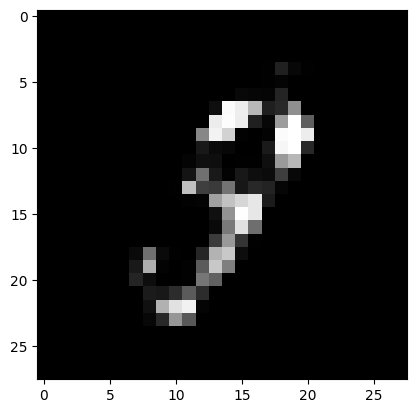

Ploting:  3


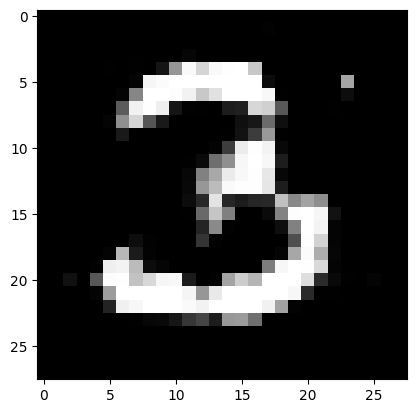

Ploting:  9


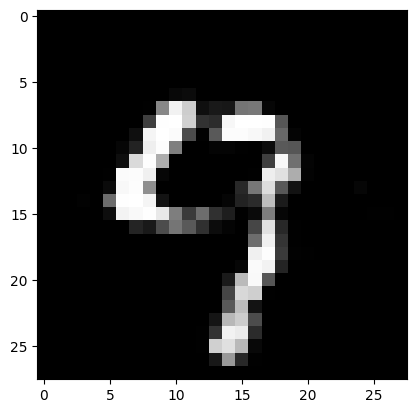

Ploting:  9


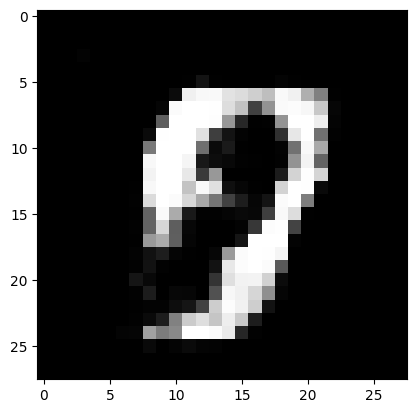

Ploting:  6


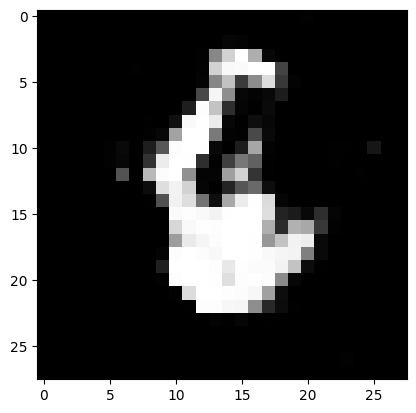

Epoch: 44550
loss_g: 0.9740481376647949 	loss_d: 1.1979937553405762
Epoch: 44600
loss_g: 1.0599050521850586 	loss_d: 1.1587586402893066
Epoch: 44650
loss_g: 0.9946026802062988 	loss_d: 1.2086344957351685
Epoch: 44700
loss_g: 1.0865445137023926 	loss_d: 1.1120498180389404
Epoch: 44750
loss_g: 0.8591876029968262 	loss_d: 1.275028944015503
Ploting:  9


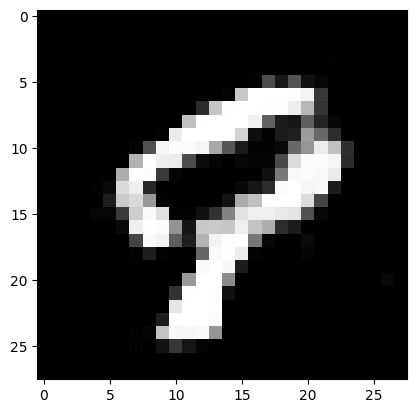

Ploting:  5


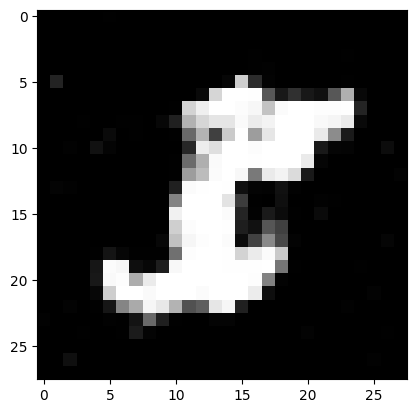

Ploting:  6


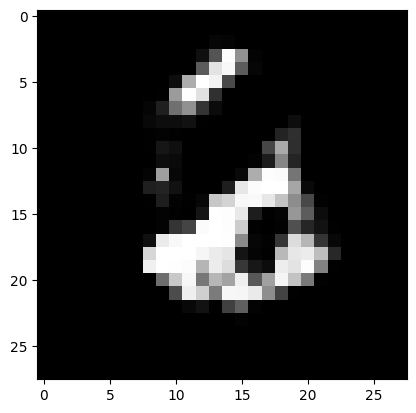

Ploting:  4


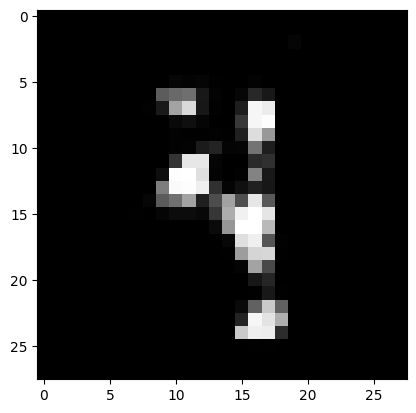

Ploting:  5


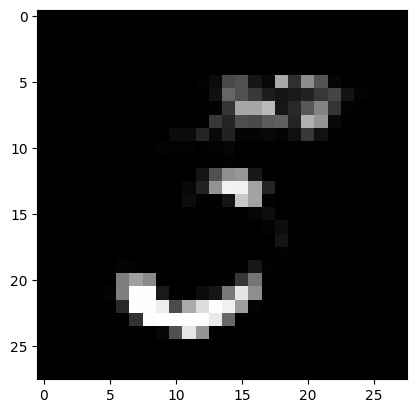

Epoch: 44800
loss_g: 0.9627673625946045 	loss_d: 1.1702388525009155
Epoch: 44850
loss_g: 0.8212409019470215 	loss_d: 1.3689827919006348
Epoch: 44900
loss_g: 1.2213997840881348 	loss_d: 1.203141450881958
Epoch: 44950
loss_g: 1.1783928871154785 	loss_d: 1.1797078847885132
Epoch: 45000
loss_g: 0.8278343677520752 	loss_d: 1.164473533630371
Ploting:  8


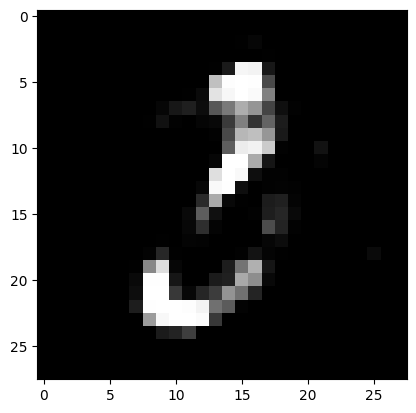

Ploting:  0


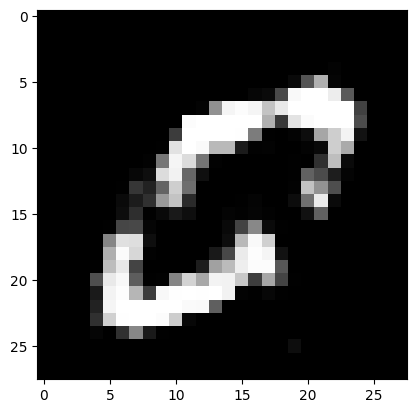

Ploting:  8


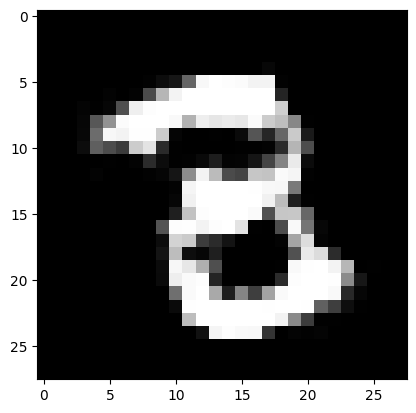

Ploting:  4


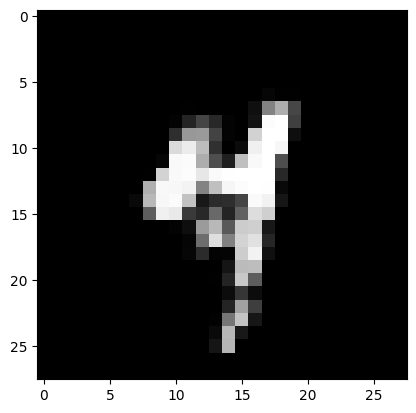

Ploting:  6


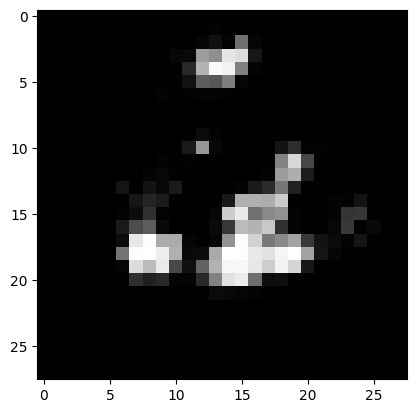

Epoch: 45050
loss_g: 1.039792776107788 	loss_d: 1.2958931922912598
Epoch: 45100
loss_g: 0.7165480256080627 	loss_d: 1.2058088779449463
Epoch: 45150
loss_g: 1.000016689300537 	loss_d: 1.286257028579712
Epoch: 45200
loss_g: 0.899505615234375 	loss_d: 1.1389615535736084
Epoch: 45250
loss_g: 0.9172153472900391 	loss_d: 1.2218985557556152
Ploting:  6


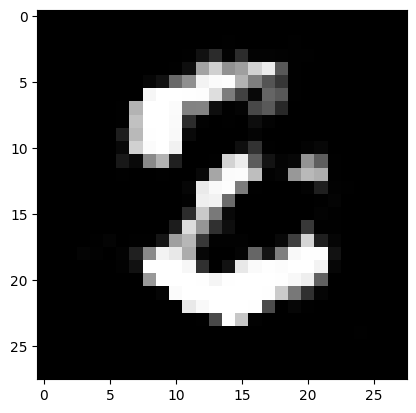

Ploting:  9


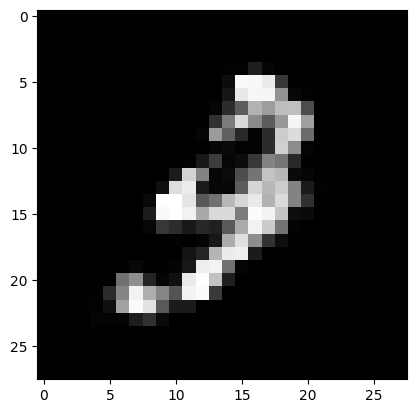

Ploting:  9


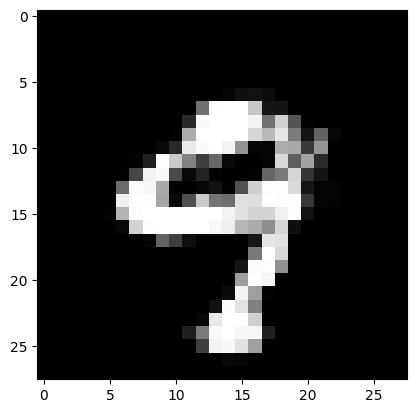

Ploting:  9


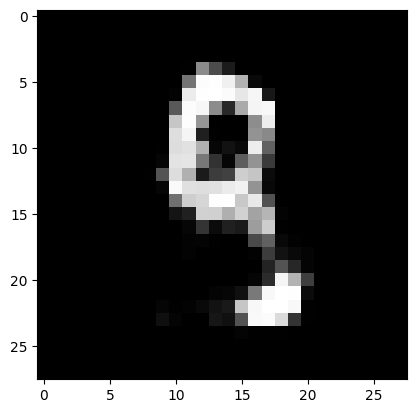

Ploting:  7


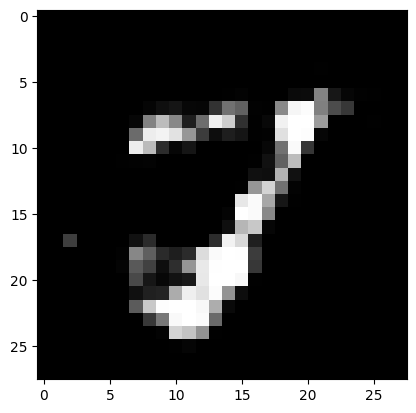

Epoch: 45300
loss_g: 0.9986921548843384 	loss_d: 1.1748688220977783
Epoch: 45350
loss_g: 1.0260581970214844 	loss_d: 1.0834498405456543
Epoch: 45400
loss_g: 0.7704923152923584 	loss_d: 1.2478276491165161
Epoch: 45450
loss_g: 0.8597952127456665 	loss_d: 1.2447285652160645
Epoch: 45500
loss_g: 1.0089950561523438 	loss_d: 1.2454769611358643
Ploting:  9


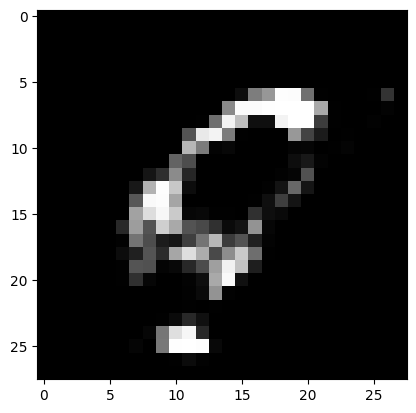

Ploting:  8


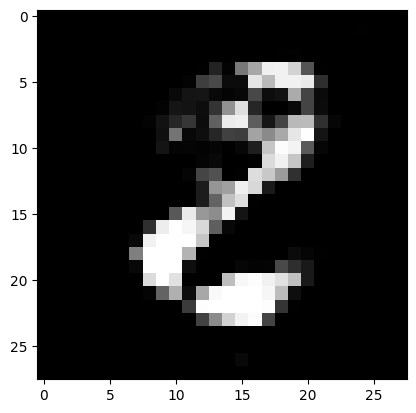

Ploting:  4


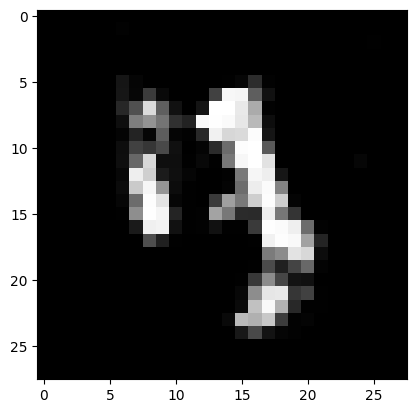

Ploting:  8


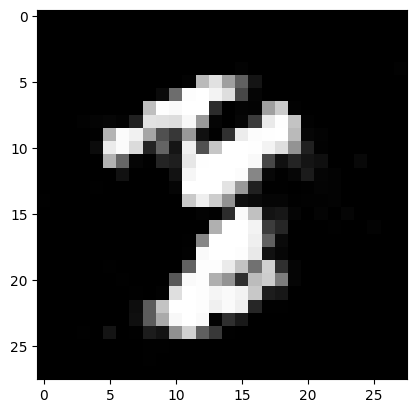

Ploting:  4


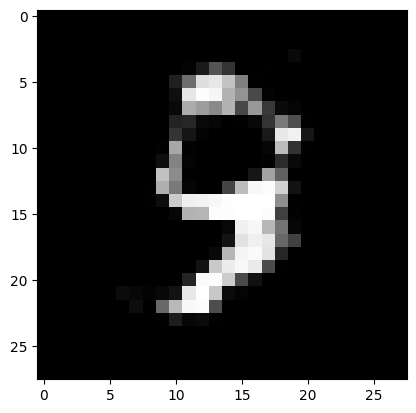

Epoch: 45550
loss_g: 0.9703106880187988 	loss_d: 1.0951999425888062
Epoch: 45600
loss_g: 0.9258216619491577 	loss_d: 1.1743171215057373
Epoch: 45650
loss_g: 1.0156311988830566 	loss_d: 1.2400364875793457
Epoch: 45700
loss_g: 0.6760372519493103 	loss_d: 1.2328189611434937
Epoch: 45750
loss_g: 0.9666712880134583 	loss_d: 1.1479604244232178
Ploting:  9


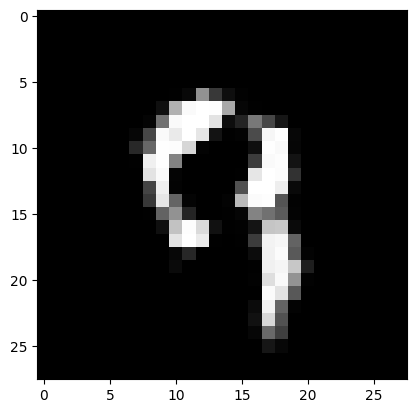

Ploting:  1


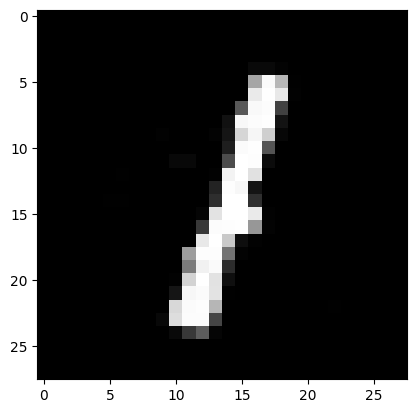

Ploting:  1


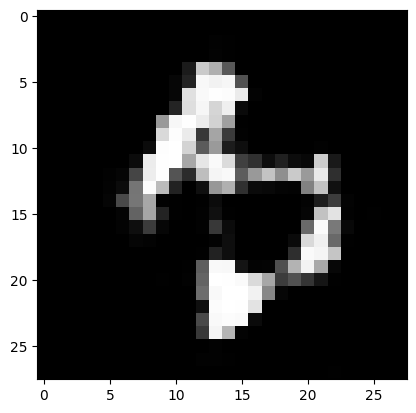

Ploting:  5


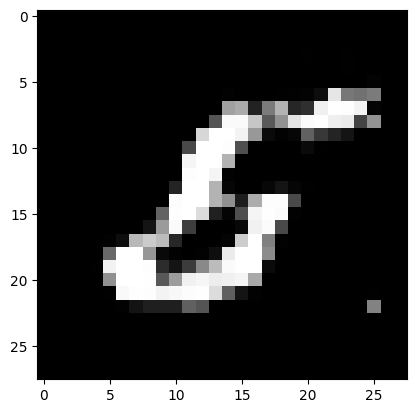

Ploting:  3


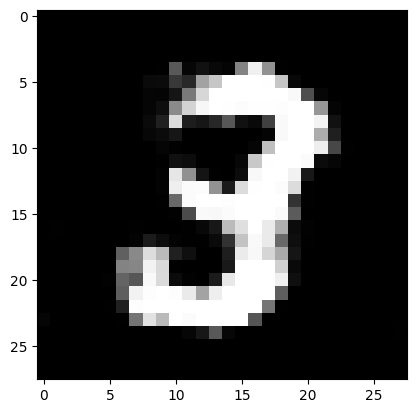

Epoch: 45800
loss_g: 0.883479118347168 	loss_d: 1.1997023820877075
Epoch: 45850
loss_g: 1.0449397563934326 	loss_d: 1.19087815284729
Epoch: 45900
loss_g: 1.105133295059204 	loss_d: 1.2043038606643677
Epoch: 45950
loss_g: 0.9685267210006714 	loss_d: 1.284590721130371
Epoch: 46000
loss_g: 1.1646058559417725 	loss_d: 1.3152810335159302
Ploting:  5


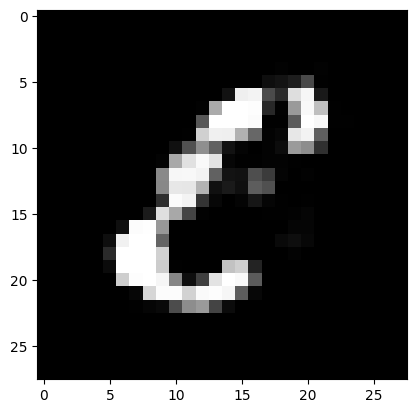

Ploting:  7


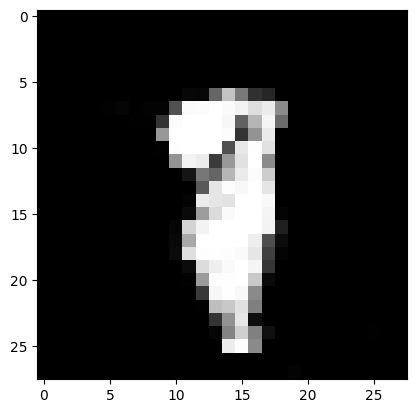

Ploting:  1


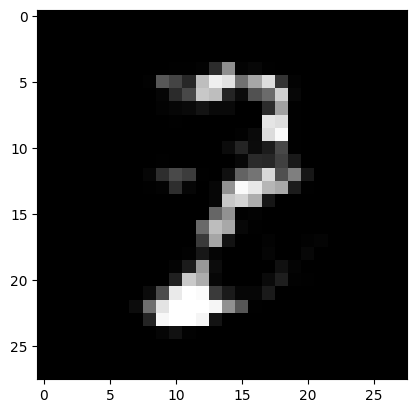

Ploting:  4


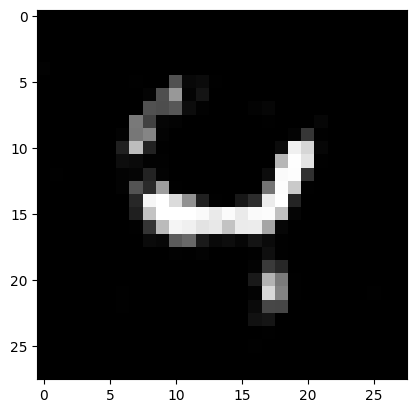

Ploting:  1


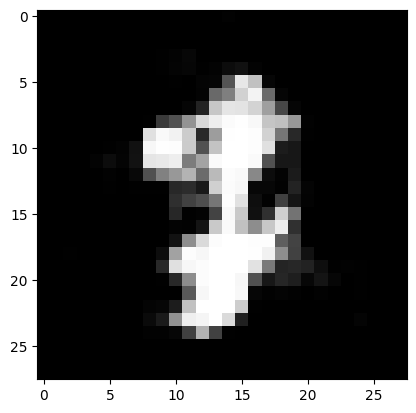

Epoch: 46050
loss_g: 1.2601089477539062 	loss_d: 1.154057502746582
Epoch: 46100
loss_g: 1.348891258239746 	loss_d: 1.2454811334609985
Epoch: 46150
loss_g: 0.7550599575042725 	loss_d: 1.2125502824783325
Epoch: 46200
loss_g: 1.0924253463745117 	loss_d: 1.0709009170532227
Epoch: 46250
loss_g: 1.19802725315094 	loss_d: 1.170612096786499
Ploting:  0


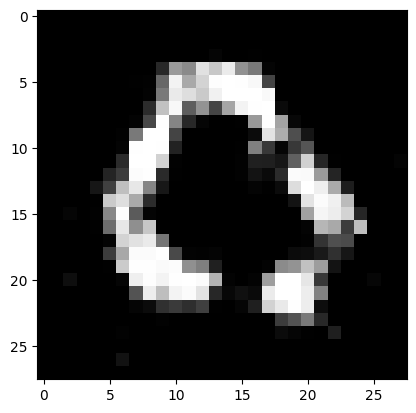

Ploting:  8


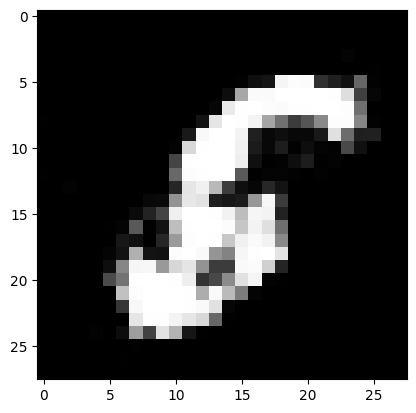

Ploting:  7


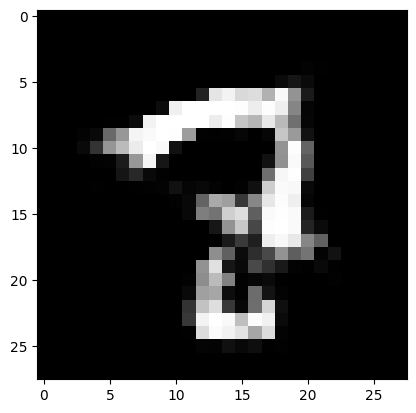

Ploting:  7


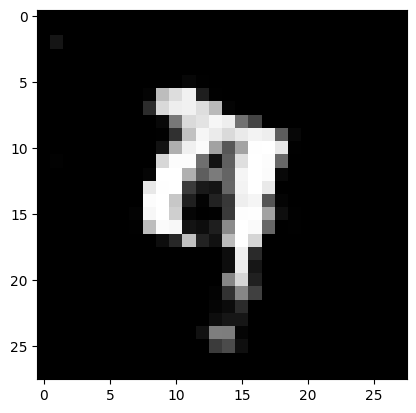

Ploting:  8


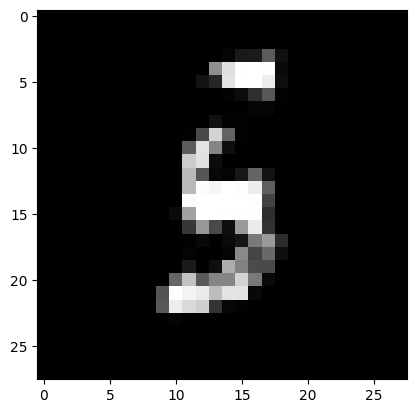

Epoch: 46300
loss_g: 1.0785526037216187 	loss_d: 1.2564201354980469
Epoch: 46350
loss_g: 1.1126999855041504 	loss_d: 1.2793327569961548
Epoch: 46400
loss_g: 0.9669568538665771 	loss_d: 0.9929747581481934
Epoch: 46450
loss_g: 1.0741679668426514 	loss_d: 1.2431275844573975
Epoch: 46500
loss_g: 1.074317216873169 	loss_d: 1.1935625076293945
Ploting:  3


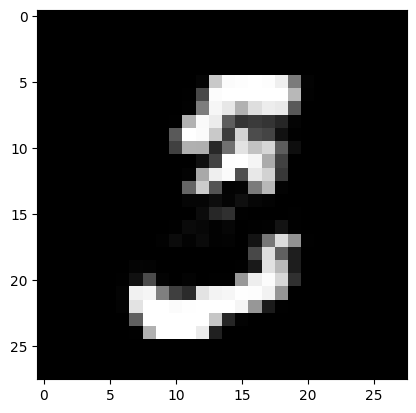

Ploting:  1


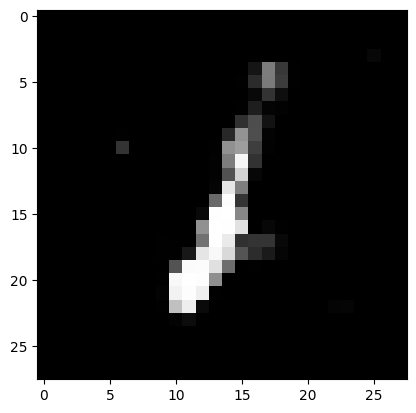

Ploting:  7


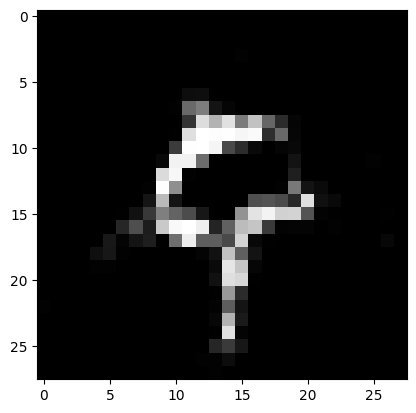

Ploting:  7


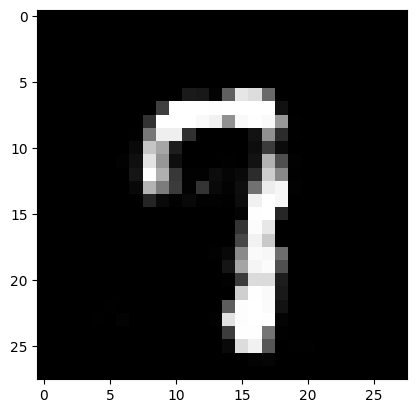

Ploting:  8


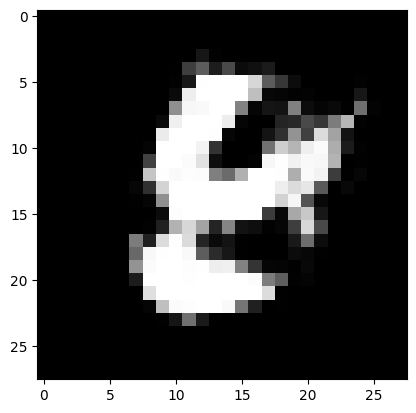

Epoch: 46550
loss_g: 1.1146893501281738 	loss_d: 1.3320586681365967
Epoch: 46600
loss_g: 1.1376981735229492 	loss_d: 1.2245464324951172
Epoch: 46650
loss_g: 0.9137601256370544 	loss_d: 1.2550039291381836
Epoch: 46700
loss_g: 1.0812351703643799 	loss_d: 1.2302472591400146
Epoch: 46750
loss_g: 0.9555859565734863 	loss_d: 1.2193312644958496
Ploting:  8


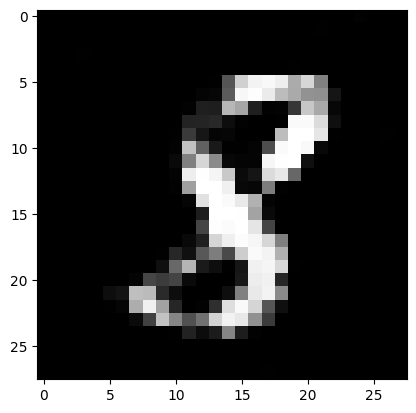

Ploting:  3


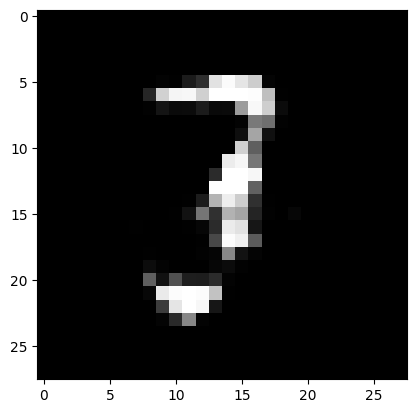

Ploting:  0


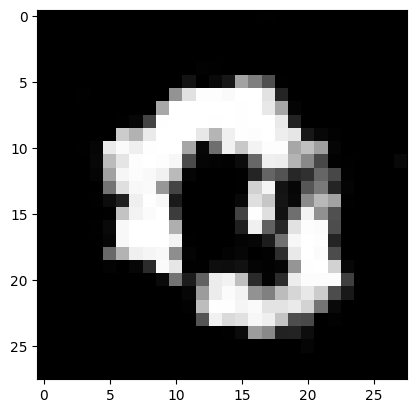

Ploting:  6


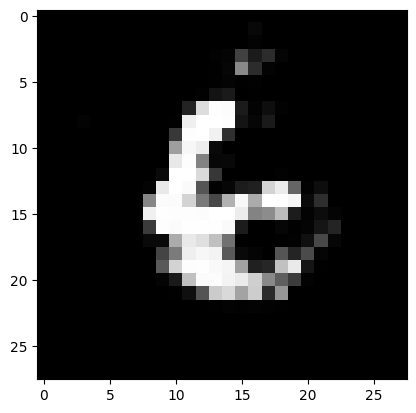

Ploting:  5


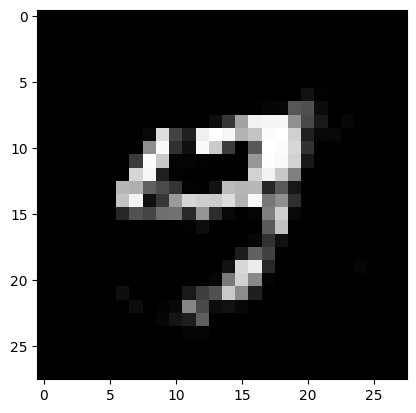

Epoch: 46800
loss_g: 0.9104434251785278 	loss_d: 1.1515387296676636
Epoch: 46850
loss_g: 1.0468909740447998 	loss_d: 1.1225433349609375
Epoch: 46900
loss_g: 1.1227405071258545 	loss_d: 1.2294812202453613
Epoch: 46950
loss_g: 0.6661196947097778 	loss_d: 1.1714553833007812
Epoch: 47000
loss_g: 0.938692569732666 	loss_d: 1.193840503692627
Ploting:  9


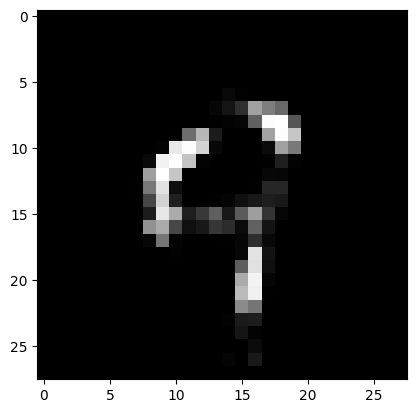

Ploting:  7


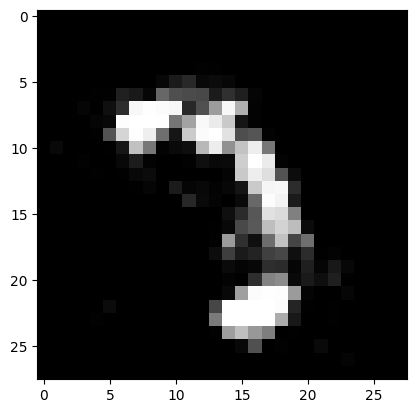

Ploting:  3


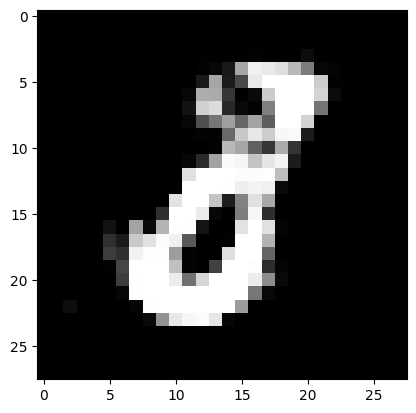

Ploting:  3


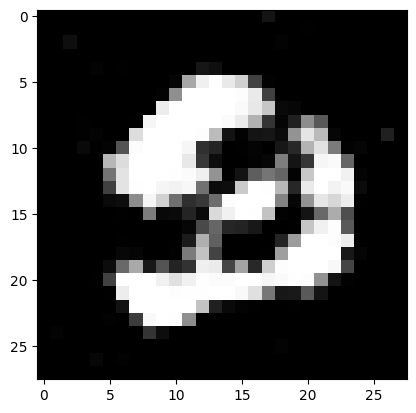

Ploting:  1


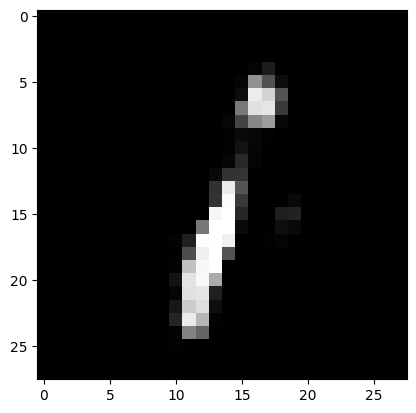

Epoch: 47050
loss_g: 1.4519999027252197 	loss_d: 1.1418614387512207
Epoch: 47100
loss_g: 1.1435072422027588 	loss_d: 1.2500331401824951
Epoch: 47150
loss_g: 1.1269018650054932 	loss_d: 1.12346351146698
Epoch: 47200
loss_g: 0.8855308890342712 	loss_d: 1.1887013912200928
Epoch: 47250
loss_g: 1.1285183429718018 	loss_d: 1.163501262664795
Ploting:  8


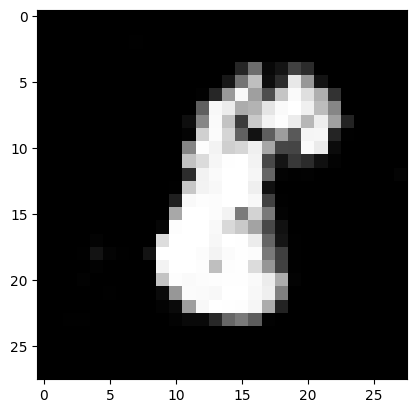

Ploting:  0


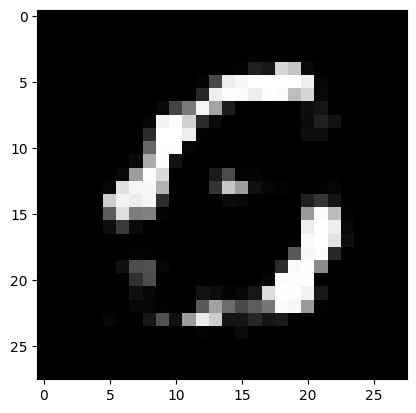

Ploting:  2


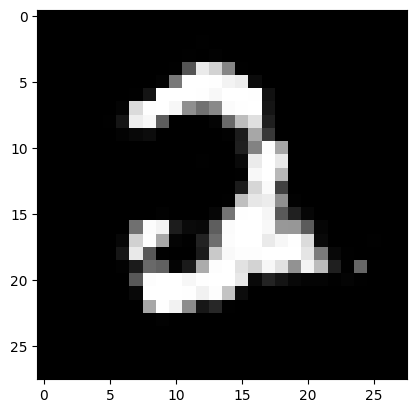

Ploting:  9


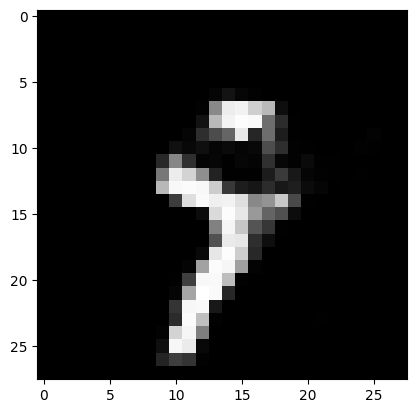

Ploting:  9


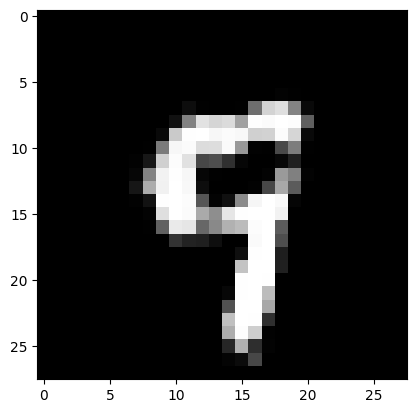

Epoch: 47300
loss_g: 0.9698591232299805 	loss_d: 1.2453796863555908
Epoch: 47350
loss_g: 1.0730290412902832 	loss_d: 1.1578736305236816
Epoch: 47400
loss_g: 0.9268549680709839 	loss_d: 1.1949365139007568
Epoch: 47450
loss_g: 1.2933239936828613 	loss_d: 1.2446966171264648
Epoch: 47500
loss_g: 1.0849653482437134 	loss_d: 1.1962339878082275
Ploting:  2


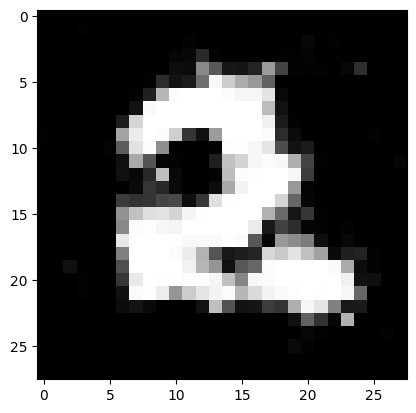

Ploting:  3


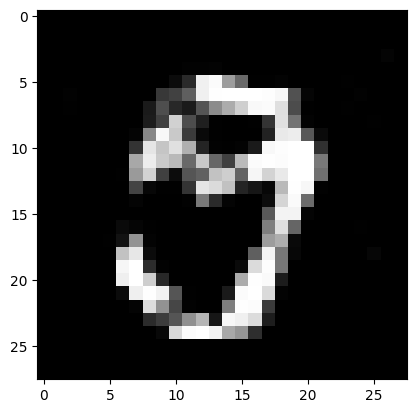

Ploting:  5


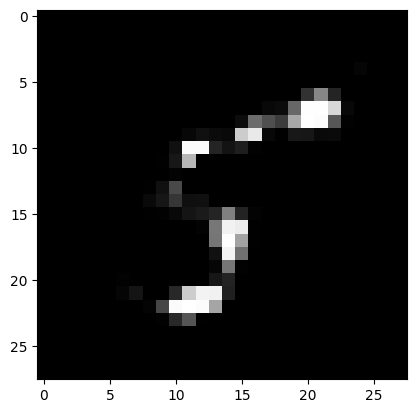

Ploting:  6


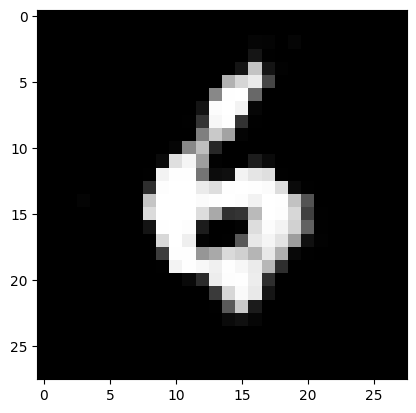

Ploting:  2


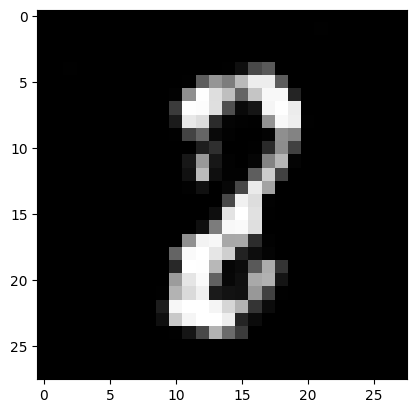

Epoch: 47550
loss_g: 0.8855210542678833 	loss_d: 1.1725826263427734
Epoch: 47600
loss_g: 1.3830287456512451 	loss_d: 1.2169685363769531
Epoch: 47650
loss_g: 0.7952917218208313 	loss_d: 1.173553228378296
Epoch: 47700
loss_g: 0.8477025032043457 	loss_d: 1.168133020401001
Epoch: 47750
loss_g: 0.7818701267242432 	loss_d: 1.2506577968597412
Ploting:  8


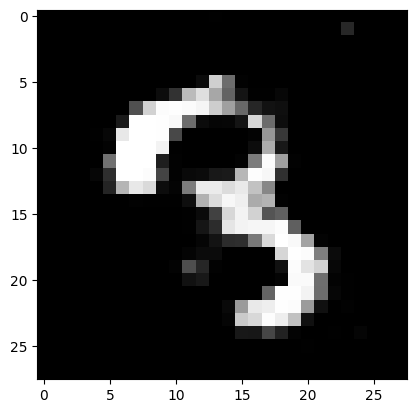

Ploting:  7


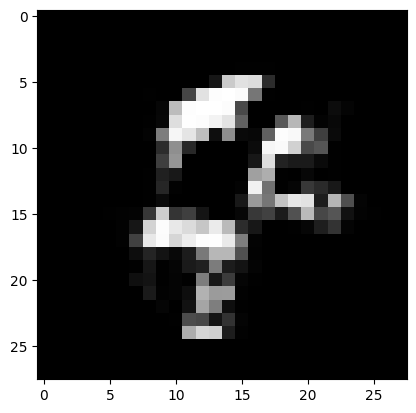

Ploting:  5


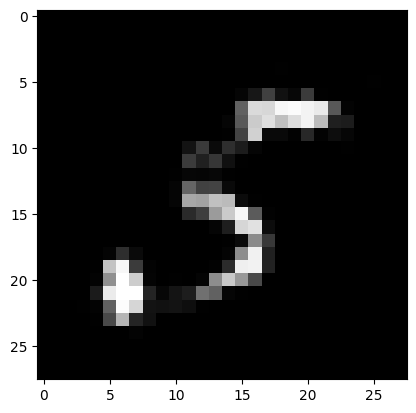

Ploting:  2


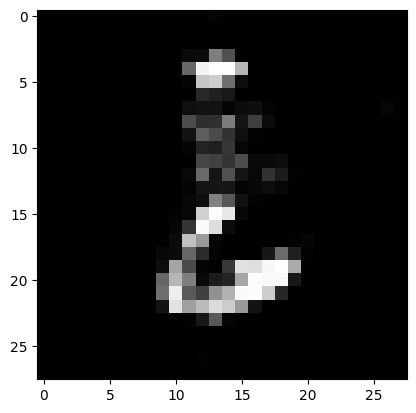

Ploting:  9


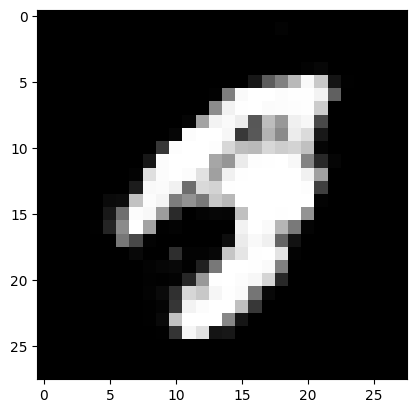

Epoch: 47800
loss_g: 1.0553256273269653 	loss_d: 1.2196756601333618
Epoch: 47850
loss_g: 0.7972326874732971 	loss_d: 1.3425414562225342
Epoch: 47900
loss_g: 0.9449878334999084 	loss_d: 1.253492832183838
Epoch: 47950
loss_g: 0.9291430711746216 	loss_d: 1.1665704250335693
Epoch: 48000
loss_g: 0.9273527264595032 	loss_d: 1.2316854000091553
Ploting:  3


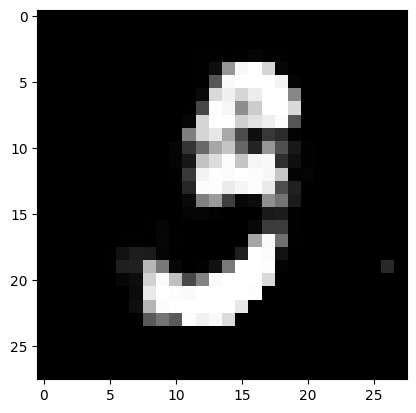

Ploting:  2


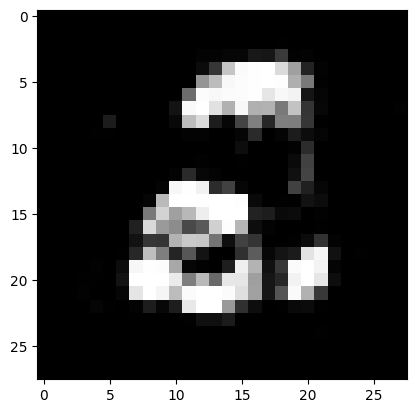

Ploting:  7


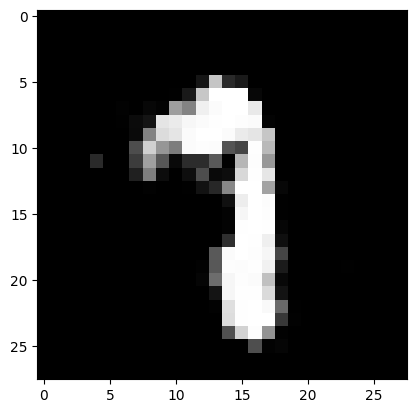

Ploting:  7


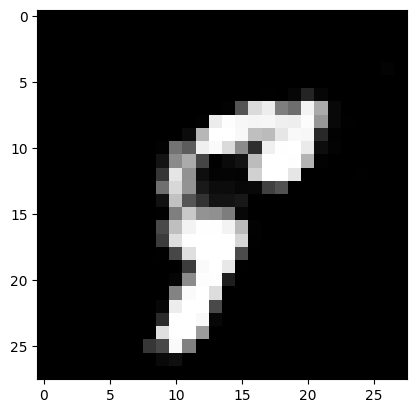

Ploting:  4


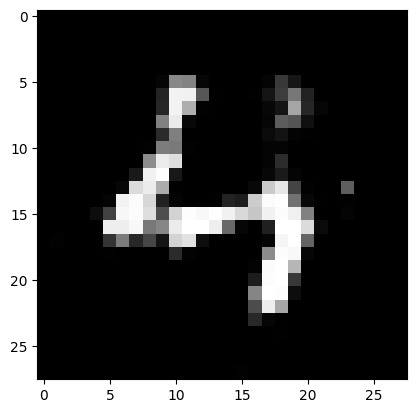

Epoch: 48050
loss_g: 0.8987722992897034 	loss_d: 1.1873400211334229
Epoch: 48100
loss_g: 1.1085114479064941 	loss_d: 1.2808482646942139
Epoch: 48150
loss_g: 1.0926356315612793 	loss_d: 1.209732174873352
Epoch: 48200
loss_g: 1.2263332605361938 	loss_d: 1.0797677040100098
Epoch: 48250
loss_g: 0.8286265134811401 	loss_d: 1.2522023916244507
Ploting:  6


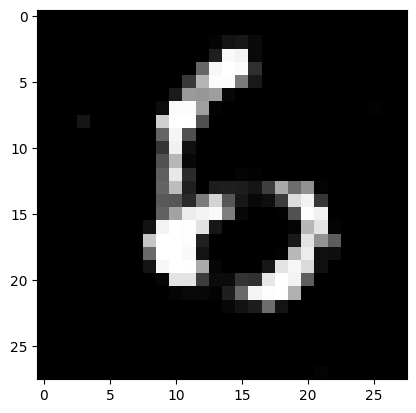

Ploting:  4


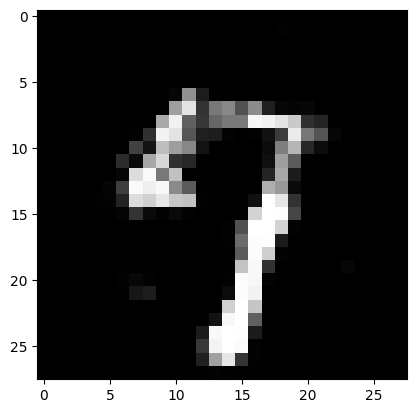

Ploting:  1


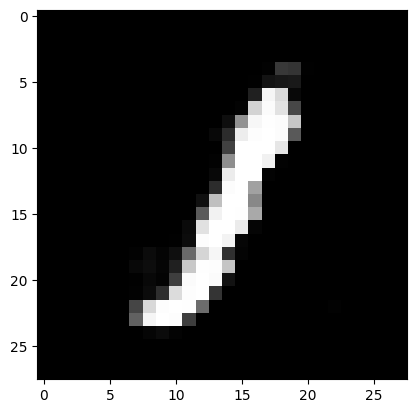

Ploting:  8


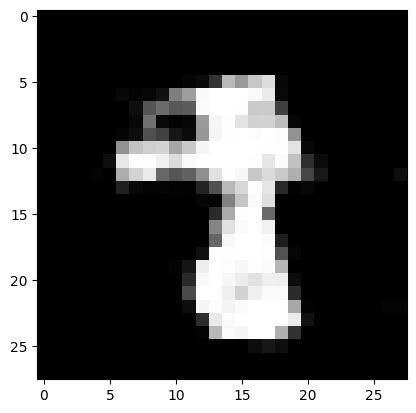

Ploting:  3


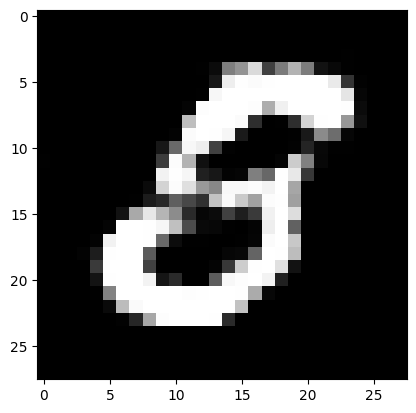

Epoch: 48300
loss_g: 0.912700891494751 	loss_d: 1.1326732635498047
Epoch: 48350
loss_g: 1.273978590965271 	loss_d: 1.2145366668701172
Epoch: 48400
loss_g: 1.112273931503296 	loss_d: 1.1351690292358398
Epoch: 48450
loss_g: 0.9925262928009033 	loss_d: 1.2181826829910278
Epoch: 48500
loss_g: 0.9267846345901489 	loss_d: 1.150040864944458
Ploting:  8


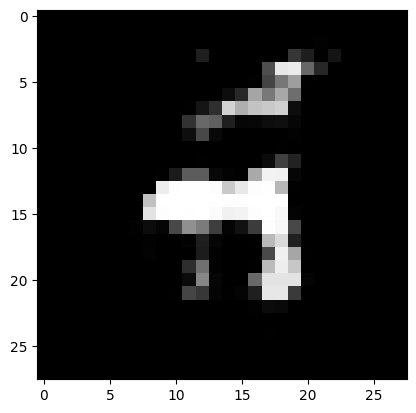

Ploting:  2


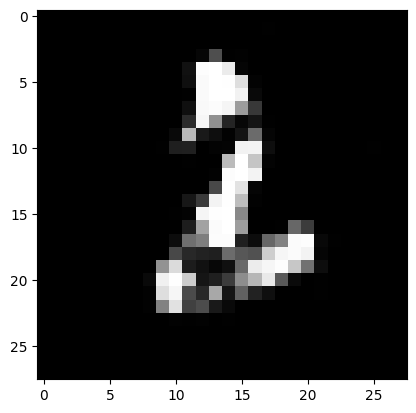

Ploting:  8


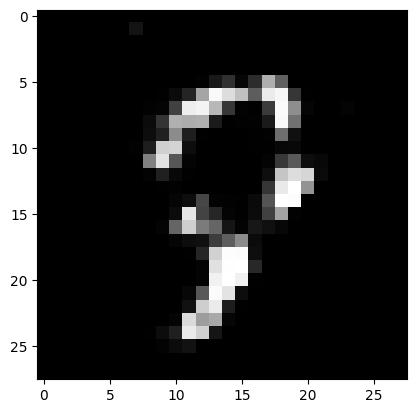

Ploting:  8


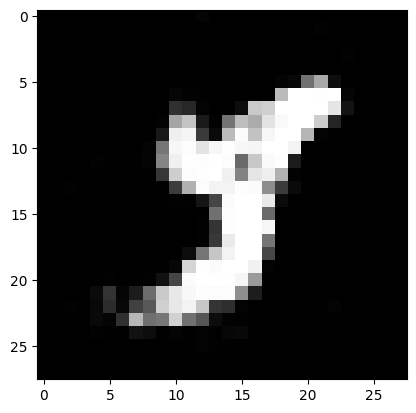

Ploting:  0


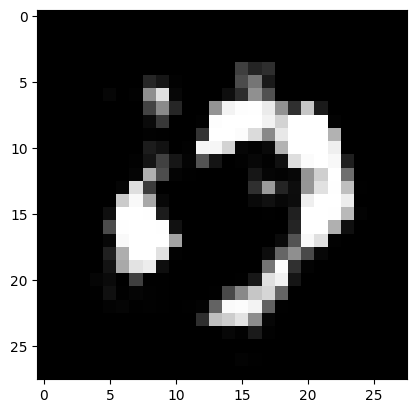

Epoch: 48550
loss_g: 1.3398308753967285 	loss_d: 1.1848440170288086
Epoch: 48600
loss_g: 1.1176471710205078 	loss_d: 1.2516776323318481
Epoch: 48650
loss_g: 1.1169010400772095 	loss_d: 1.1624994277954102
Epoch: 48700
loss_g: 0.9944697618484497 	loss_d: 1.305176019668579
Epoch: 48750
loss_g: 0.8855961561203003 	loss_d: 1.1959480047225952
Ploting:  2


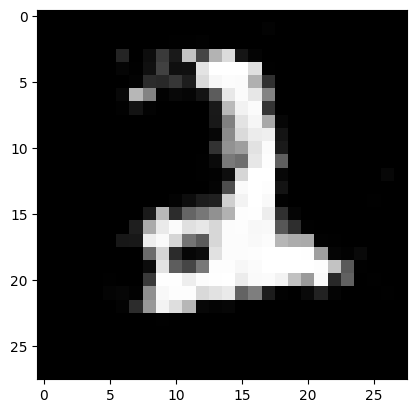

Ploting:  5


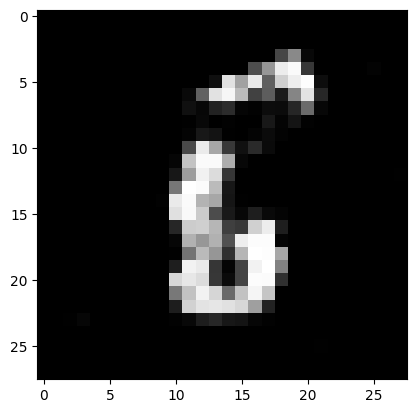

Ploting:  7


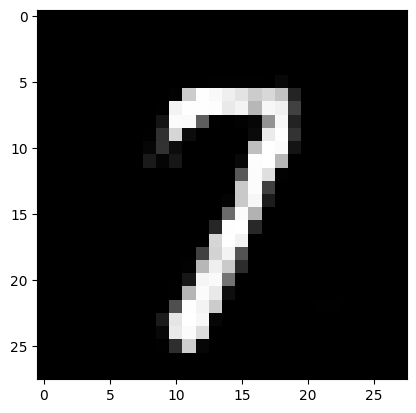

Ploting:  5


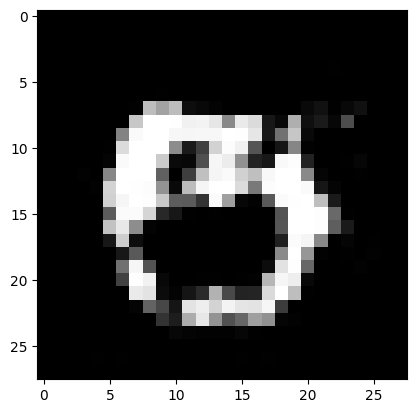

Ploting:  9


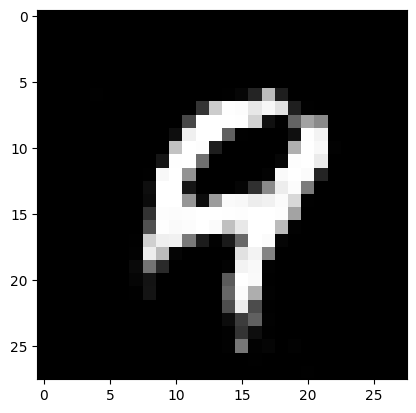

Epoch: 48800
loss_g: 0.7568989992141724 	loss_d: 1.1319791078567505
Epoch: 48850
loss_g: 0.8260153532028198 	loss_d: 1.186084270477295
Epoch: 48900
loss_g: 1.1514378786087036 	loss_d: 1.1572644710540771
Epoch: 48950
loss_g: 0.9609713554382324 	loss_d: 1.1704761981964111
Epoch: 49000
loss_g: 0.680673360824585 	loss_d: 1.2695473432540894
Ploting:  7


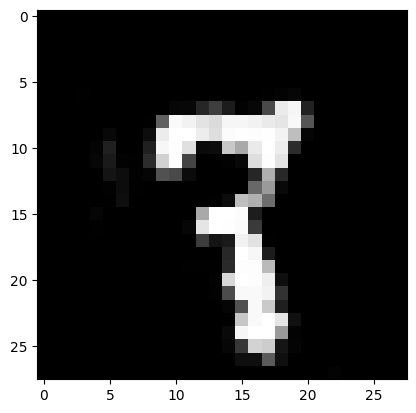

Ploting:  9


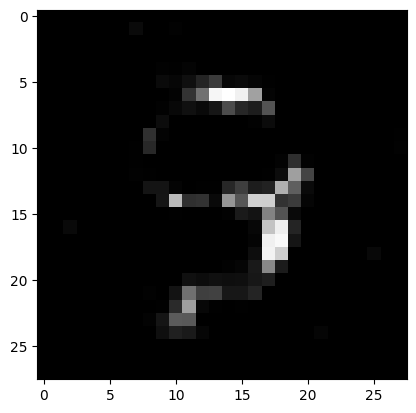

Ploting:  6


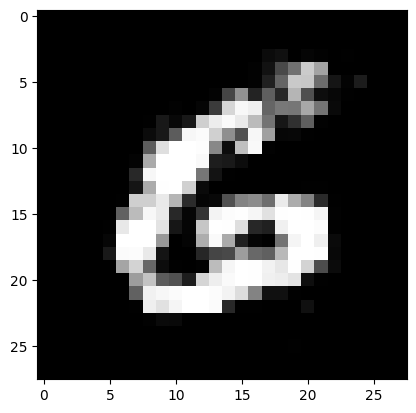

Ploting:  8


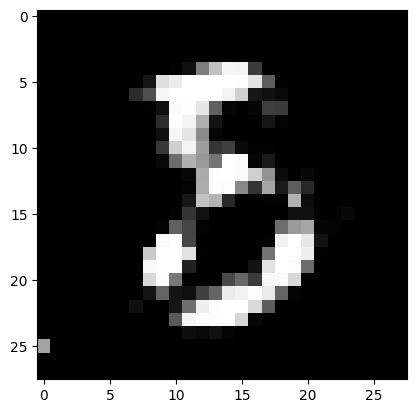

Ploting:  9


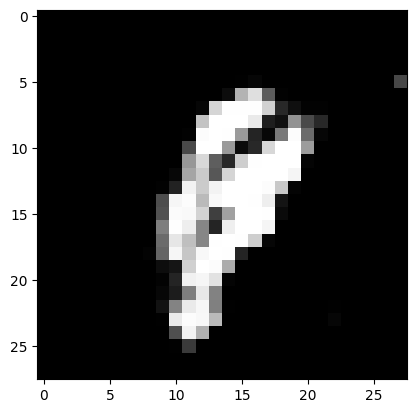

Epoch: 49050
loss_g: 1.0332083702087402 	loss_d: 1.3123245239257812
Epoch: 49100
loss_g: 1.4292781352996826 	loss_d: 1.268752932548523
Epoch: 49150
loss_g: 0.9814661741256714 	loss_d: 1.202409029006958
Epoch: 49200
loss_g: 1.1748851537704468 	loss_d: 1.2309584617614746
Epoch: 49250
loss_g: 1.094376564025879 	loss_d: 1.1660659313201904
Ploting:  6


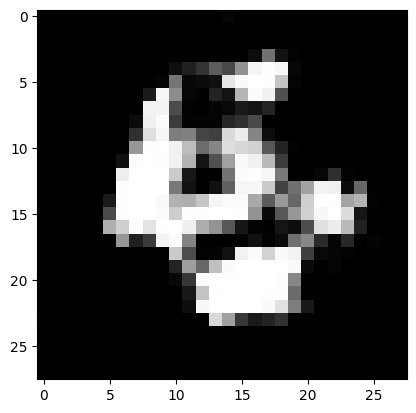

Ploting:  8


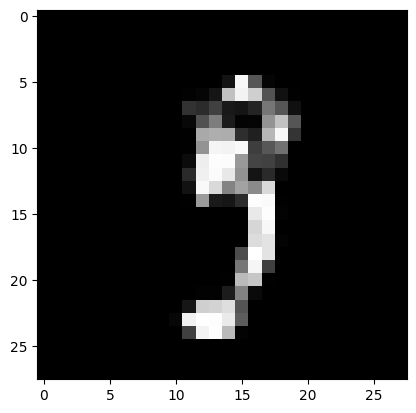

Ploting:  2


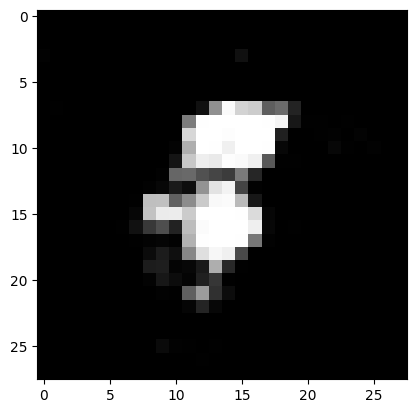

Ploting:  2


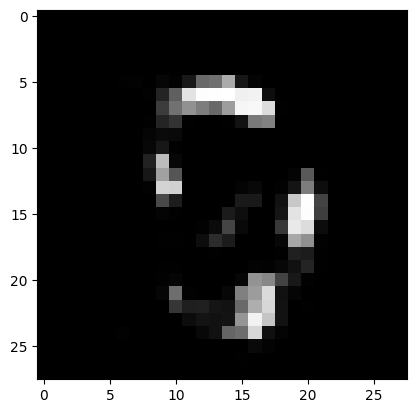

Ploting:  2


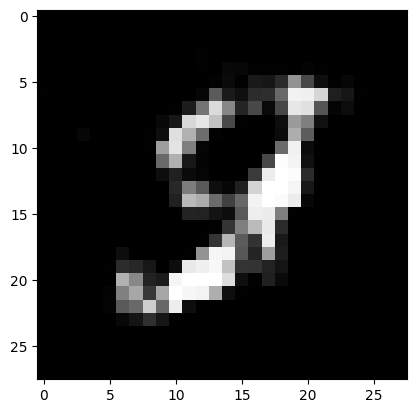

Epoch: 49300
loss_g: 1.033555030822754 	loss_d: 1.03239107131958
Epoch: 49350
loss_g: 1.094420075416565 	loss_d: 1.2384746074676514
Epoch: 49400
loss_g: 1.2162196636199951 	loss_d: 1.2953979969024658
Epoch: 49450
loss_g: 0.6767387390136719 	loss_d: 1.0946223735809326
Epoch: 49500
loss_g: 0.9590259790420532 	loss_d: 1.2152104377746582
Ploting:  5


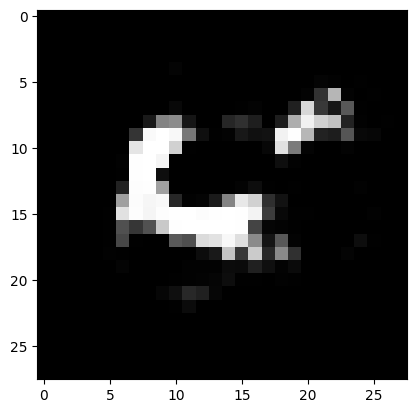

Ploting:  8


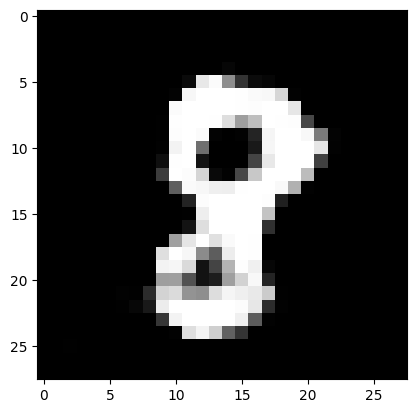

Ploting:  5


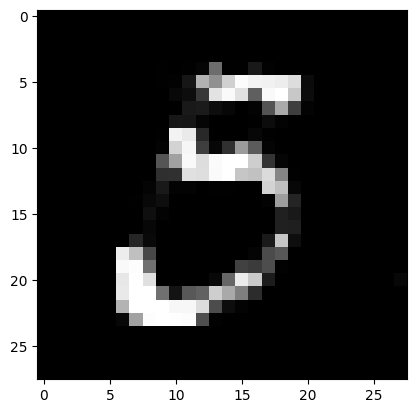

Ploting:  6


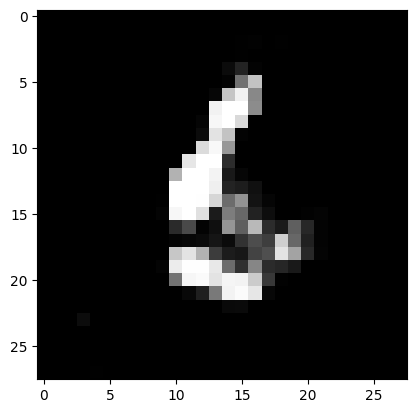

Ploting:  1


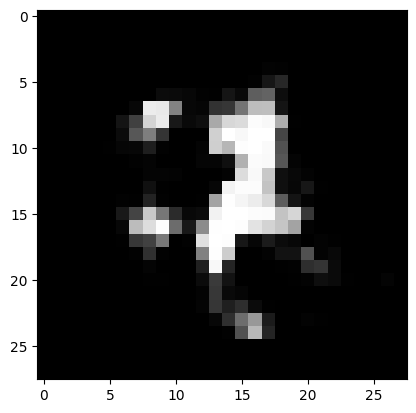

Epoch: 49550
loss_g: 0.8591084480285645 	loss_d: 1.2140147686004639
Epoch: 49600
loss_g: 0.8973742723464966 	loss_d: 1.298189640045166
Epoch: 49650
loss_g: 1.0263664722442627 	loss_d: 1.1792731285095215
Epoch: 49700
loss_g: 0.9276025891304016 	loss_d: 1.1758389472961426
Epoch: 49750
loss_g: 0.9042810201644897 	loss_d: 1.1421748399734497
Ploting:  4


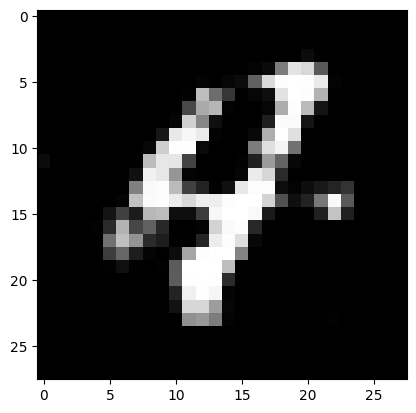

Ploting:  4


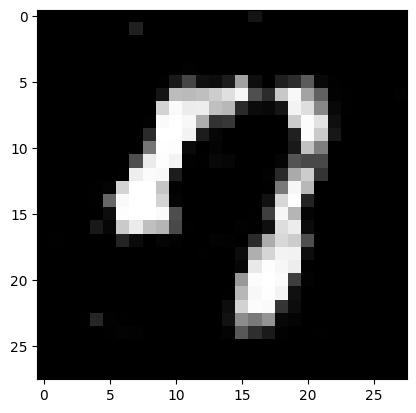

Ploting:  6


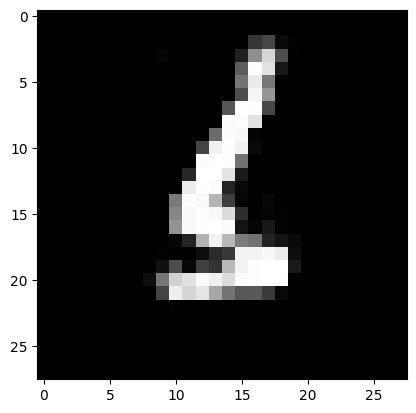

Ploting:  8


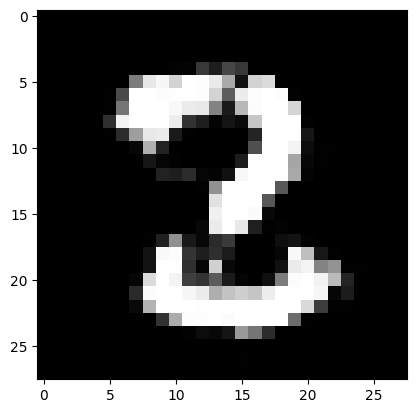

Ploting:  9


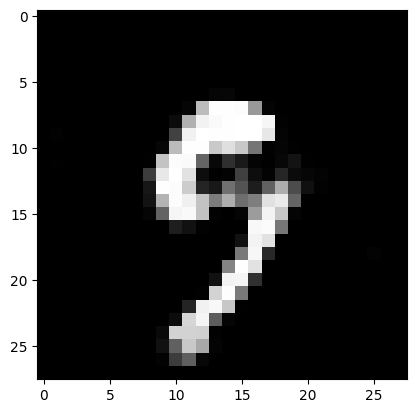

Epoch: 49800
loss_g: 1.1159685850143433 	loss_d: 1.0775898694992065
Epoch: 49850
loss_g: 1.2125098705291748 	loss_d: 1.258062481880188
Epoch: 49900
loss_g: 1.08436918258667 	loss_d: 1.2179276943206787
Epoch: 49950
loss_g: 1.0327666997909546 	loss_d: 1.0504350662231445


In [5]:
lr_g = 0.00004
lr_d = 0.00004
k = 1
epochs = 50000

generator = Generator().to(device)
disciminator = Discriminator().to(device)

optimizer_gen = torch.optim.Adam(generator.parameters(), lr=lr_g, betas=(0.5, 0.999))
optimizer_dis = torch.optim.Adam(disciminator.parameters(), lr=lr_d, betas=(0.5, 0.999))

#criterion_gen = Generator_loss()
#criterion_dis = Discriminator_loss()

criterion_gen = torch.nn.BCELoss()
criterion_dis = torch.nn.BCELoss()

#scheduler_gen = torch.optim.lr_scheduler.StepLR(optimizer_gen, step_size=25, gamma=0.998)
#scheduler_dis = torch.optim.lr_scheduler.StepLR(optimizer_dis, step_size=25, gamma=0.998)

train_models(disciminator, criterion_dis, optimizer_dis, generator, criterion_gen, optimizer_gen, epochs, train_loader, k, batch_size)

torch.Size([500, 1])
Ploting:  2


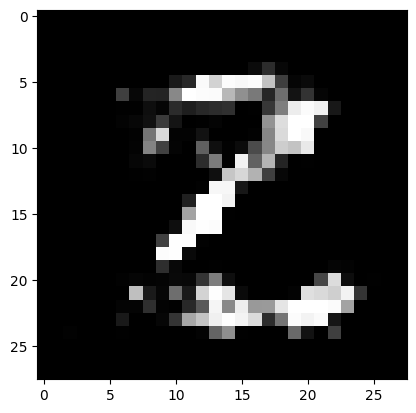

Ploting:  8


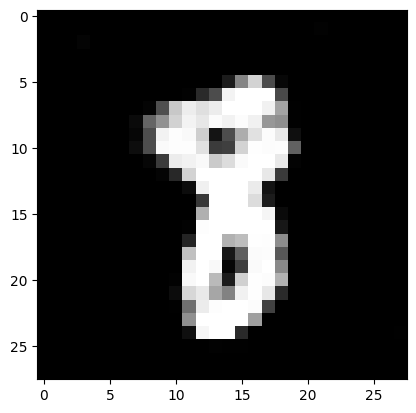

Ploting:  8


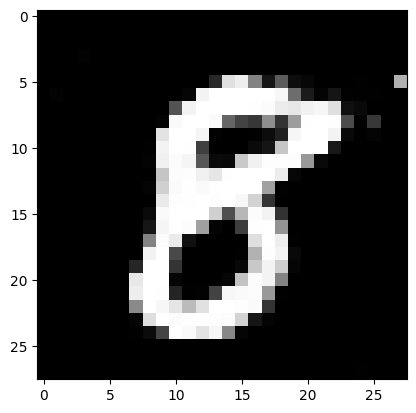

Ploting:  5


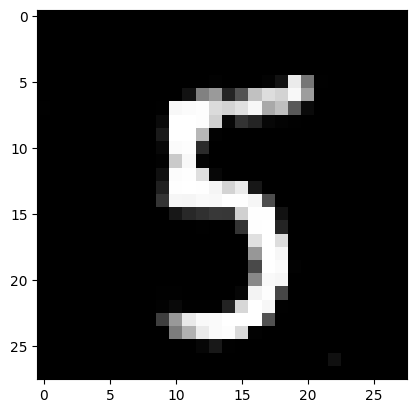

Ploting:  8


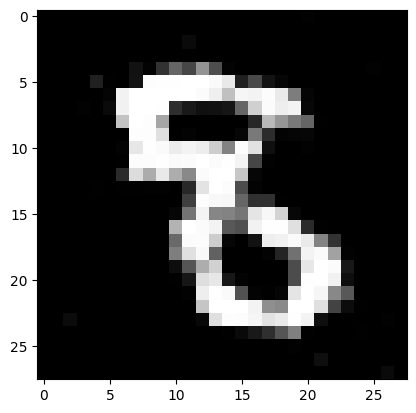

torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size([784])
torch.Size

In [86]:
labels=torch.randint(0,10,(500,1)).to(device)
disp = generator(torch.randn(500,100).to(device),labels)
print(labels.shape)
print("Ploting: ", labels[0][0].item())
plot_digit(torch.reshape(disp[0,:],(28,28)).detach().cpu())
print("Ploting: ", labels[1][0].item())
plot_digit(torch.reshape(disp[1,:],(28,28)).detach().cpu())
print("Ploting: ", labels[2][0].item())
plot_digit(torch.reshape(disp[2,:],(28,28)).detach().cpu())
print("Ploting: ", labels[3][0].item())
plot_digit(torch.reshape(disp[3,:],(28,28)).detach().cpu())
print("Ploting: ", labels[4][0].item())
plot_digit(torch.reshape(disp[4,:],(28,28)).detach().cpu())

imaarr = [[],[],[],[],[],[],[],[],[],[]]

for i, (d, l) in enumerate(zip(disp,labels)):
    print(d.shape)
    imaarr[l.item()].append(d)



In [40]:
torch.save(generator, "Generator.pt")

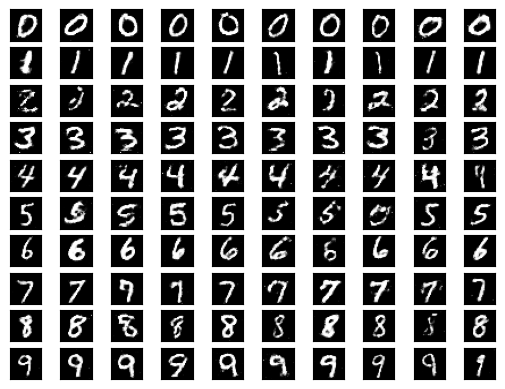

<Figure size 640x480 with 0 Axes>

In [91]:
plt.figure(0)
plots = []
for i in range(10):
    for j in range(10):
        ax = plt.subplot2grid((10,10), (i,j))
        ax.get_yaxis().set_visible(False)
        ax.get_xaxis().set_visible(False)
        ax.imshow(torch.reshape(imaarr[i][j],(28,28)).detach().cpu(),cmap="gray")
plt.show()
plt.savefig('foo.png')